# Step 1 - Importing libraries

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#%matplotlib qt
import pickle
get_ipython().magic('matplotlib inline')
import os



# prepare object points
nx = 9  #TODO: enter the number of inside corners in x
ny = 6  #TODO: enter the number of inside corners in y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
print(objp.shape)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
print(objp.shape)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

(54, 3)
(54, 3)


# Step 2 - Defining Line Class & various functions

In [2]:
import collections

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        #self.isLineDetected = False
        #self.isLineDetected = []

        # define maxLength variable
        self.maxLength = 5

        self.isLineDetected = collections.deque(maxlen=self.maxLength)
        #print("maxlen of deque- ",(self.isLineDetected.maxlen))
        # setting all initial elements of deque to False
        for i in range(self.isLineDetected.maxlen):
            self.isLineDetected.append(False)
#        print(self.isLineDetected)
#        print("here")
#        #radius of curvature of the line in some units
        #self.radius_of_curvature = None
        self.radius_of_curvature = []
        #self.radius_of_curvature = collections.deque(maxlen=2)
        self.leftFitx = collections.deque(maxlen=self.maxLength)
        self.rightFitx = collections.deque(maxlen=self.maxLength)
        # polynomial coefficients
        self.leftFitPolyCoeff = collections.deque(maxlen=self.maxLength)
        self.rightFitPolyCoeff = collections.deque(maxlen=self.maxLength)

        self.ploty = []
        self.car_offset_from_lane_center = []

    def setLeftFitx(self, valueLeftFitx):
        #self.leftFitx = valueLeftx
        self.leftFitx.append(valueLeftFitx)
    def setRightFitx(self, valueRightFitx):
        #self.rightFitx = valueRightx
        self.rightFitx.append(valueRightFitx)
    def getLeftFitx(self):
        return(self.leftFitx)
    def getRightFitx(self):
        return(self.rightFitx)

    def setLeftFitPolyCoeff(self, valueLeftFitPolyCoeff):
        #self.leftFitPolyCoeff = valueLeftFitPolyCoeff
        self.leftFitPolyCoeff.append(valueLeftFitPolyCoeff)
    def setRightFitPolyCoeff(self, valueRightFitPolyCoeff):
        #self.rightFitPolyCoeff = valueRightFitPolyCoeff
        self.rightFitPolyCoeff.append(valueRightFitPolyCoeff)
    def getLeftFitPolyCoeff(self):
        return(self.leftFitPolyCoeff)
    def getRightFitPolyCoeff(self):
        return(self.rightFitPolyCoeff)

    def setPloty(self, valuePloty):
        self.ploty = valuePloty
    def getPloty(self):
        return(self.ploty)

    def setIsLineDetected(self, TRUE_or_FALSE):
        #self.isLineDetected = TRUE_or_FALSE
        self.isLineDetected.append(TRUE_or_FALSE)

    def getIsLineDetected(self):
        return self.isLineDetected

    def setRadiusOfCurvature(self, valueLeft, valueRight):
        #self.radius_of_curvature = value
        self.radius_of_curvature = [valueLeft, valueRight]
        print(self.radius_of_curvature)

    def getRadiusOfCurvature(self):
        return self.radius_of_curvature




bothLanes = Line()

# Step 3- ChessBoard Corners & Camera Calibration

20
camera_cal/calibration1.jpg
False
camera_cal/calibration10.jpg
True


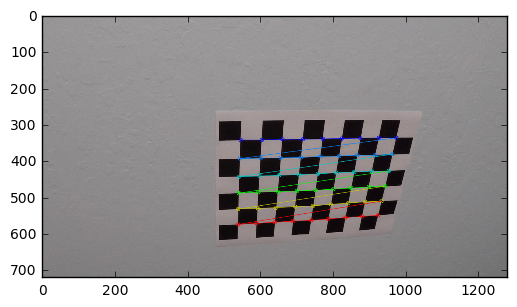

camera_cal/calibration11.jpg
True


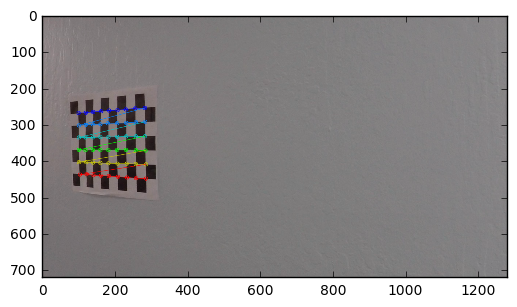

camera_cal/calibration12.jpg
True


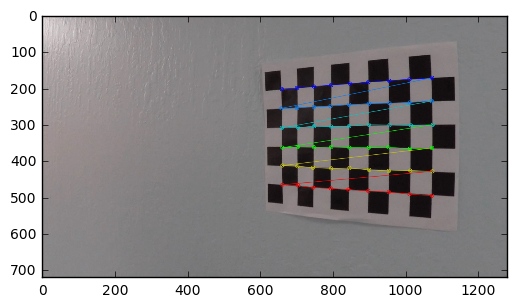

camera_cal/calibration13.jpg
True


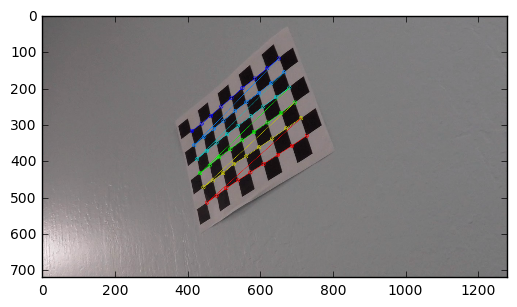

camera_cal/calibration14.jpg
True


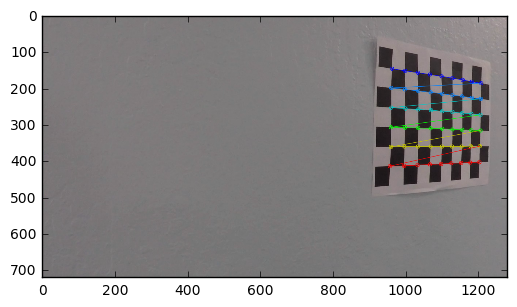

camera_cal/calibration15.jpg
True


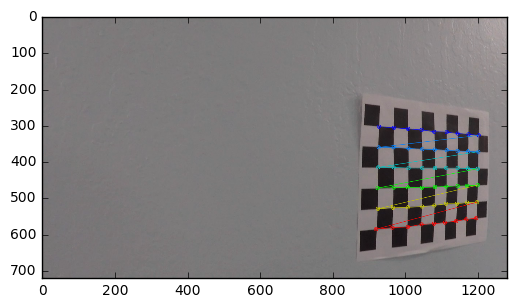

camera_cal/calibration16.jpg
True


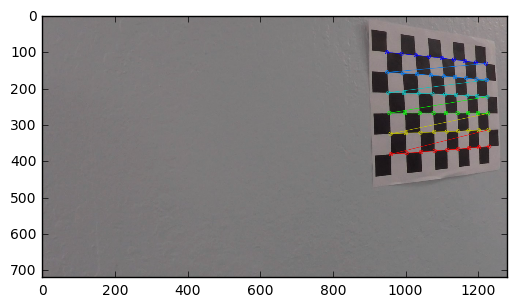

camera_cal/calibration17.jpg
True


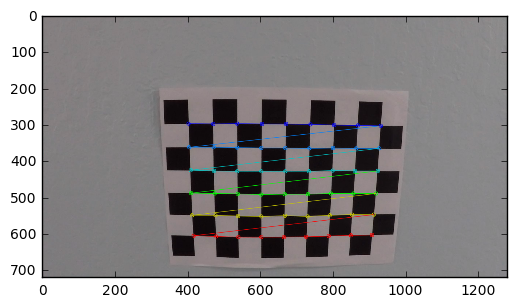

camera_cal/calibration18.jpg
True


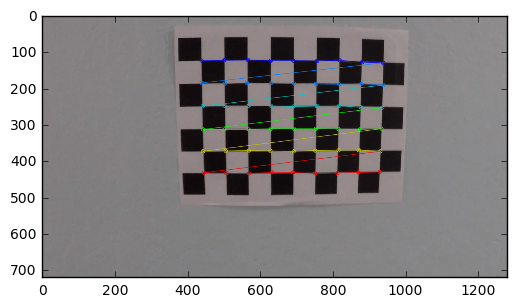

camera_cal/calibration19.jpg
True


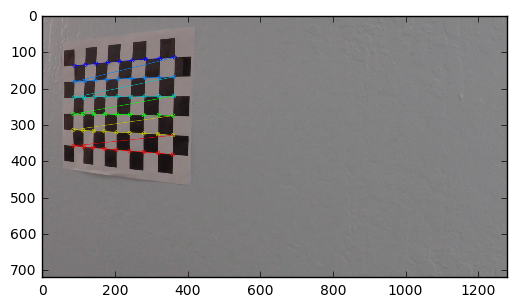

camera_cal/calibration2.jpg
True


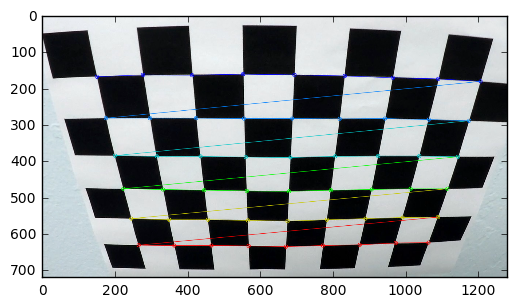

camera_cal/calibration20.jpg
True


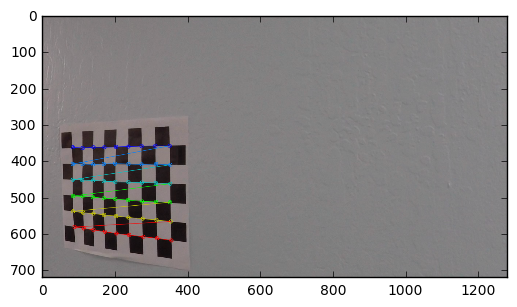

camera_cal/calibration3.jpg
True


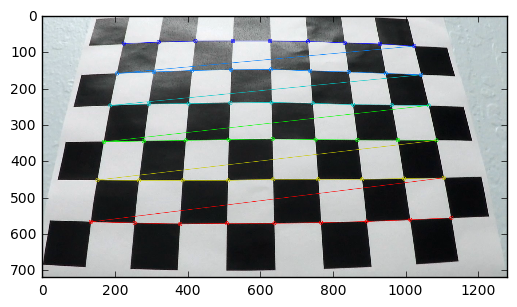

camera_cal/calibration4.jpg
False
camera_cal/calibration5.jpg
False
camera_cal/calibration6.jpg
True


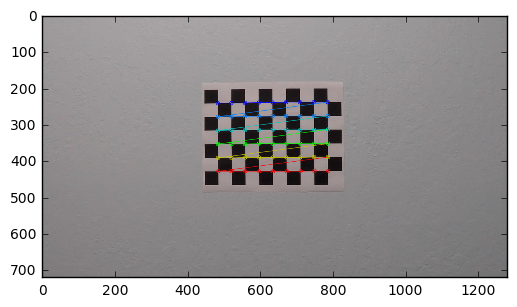

camera_cal/calibration7.jpg
True


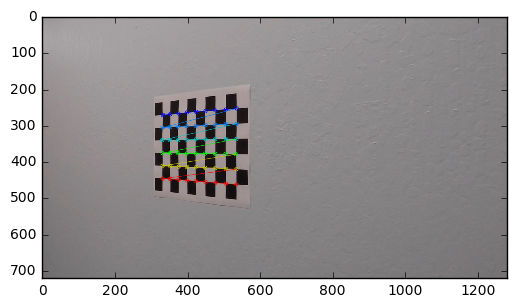

camera_cal/calibration8.jpg
True


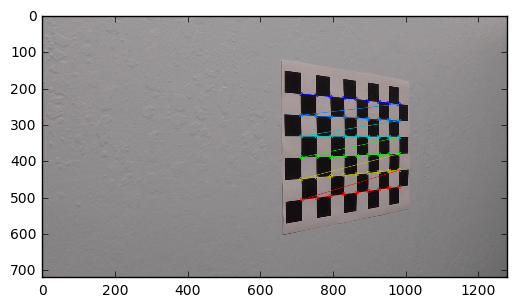

camera_cal/calibration9.jpg
True


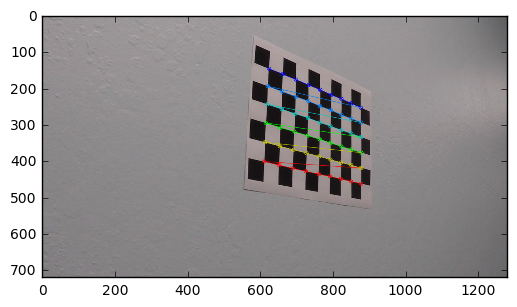

In [3]:
def find_and_draw_ChessBoardCorners(images):

    # Step through the list and search for chessboard corners
    for fname in sorted(images):
        img = cv2.imread(fname)
        print(fname)
        #plt.imshow(img);plt.show()

        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        #plt.imshow(gray);plt.show()

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        print(ret)
        #print(corners)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            plt.imshow(img);plt.show()


######################################################
#    draw corners on chessboard images
#    objpoints and imgpoints values get updated
#####################################################
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
print(len(images))
find_and_draw_ChessBoardCorners(images)

In [4]:
###################################################################
# camera calibration -- camera matrix and distortion coefficients
###################################################################


def cameraCalibration_and_undistortion(imagesTest):

#    img_size = (imagesTest[0].shape[1], imagesTest[0].shape[0])
#    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)


    for fname in sorted(imagesTest):
        img = cv2.imread(fname)
        print(fname)

        img_size = (img.shape[1], img.shape[0])
        # calibrate camera
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)

        # undistort image
        dst = cv2.undistort(img, mtx, dist, None, mtx)


        imageName = os.path.basename(fname)
        print(imageName)
        imageName = os.path.splitext(imageName)[0]
        print(imageName)
        imagePath = "output_images/" + imageName + "_undist.jpg"
        print(imagePath)

        #saving undistorted image
        cv2.imwrite(imagePath, dst)

        # performing distortion, converting again to distorted image
#        dst1 = cv2.undistort(dst, mtx, -dist, None, mtx)
#        imagePath1 = "output_images/" + imageName + "_dist.jpg"
#        print(imagePath1)
#        # saving distoter image
#        cv2.imwrite(imagePath1,dst1)


        # converting BGR to RGB images
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

        # Visualize undistortion
        plt.figure(figsize=(8,5))
        plt.subplot(121)
        plt.imshow(img)
        plt.title(imageName + ".jpg")
        plt.subplot(122)
        plt.imshow(dst)
        plt.title(imageName + "_undist.jpg")
        plt.show()


    return dst, mtx, dist

1
camera_cal/calibration1.jpg
calibration1.jpg
calibration1
output_images/calibration1_undist.jpg


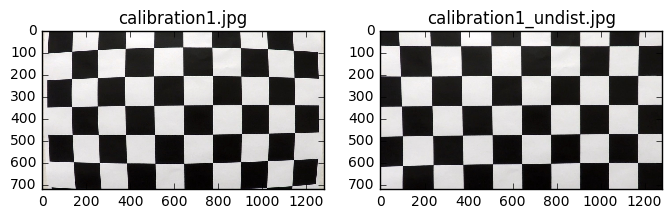

8
test_images/straight_lines1.jpg
straight_lines1.jpg
straight_lines1
output_images/straight_lines1_undist.jpg


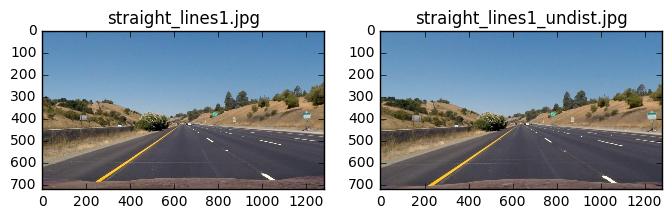

test_images/straight_lines2.jpg
straight_lines2.jpg
straight_lines2
output_images/straight_lines2_undist.jpg


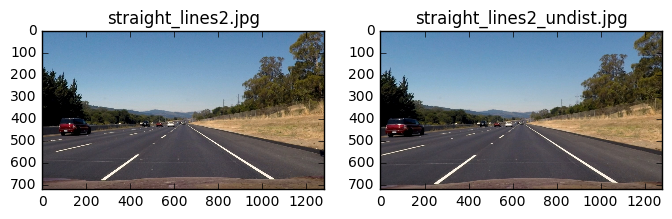

test_images/test1.jpg
test1.jpg
test1
output_images/test1_undist.jpg


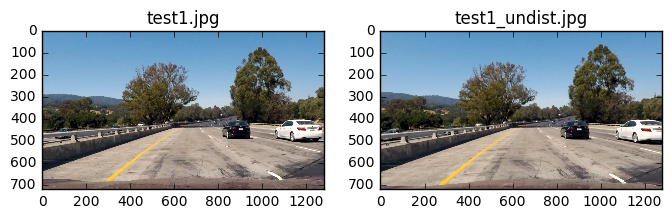

test_images/test2.jpg
test2.jpg
test2
output_images/test2_undist.jpg


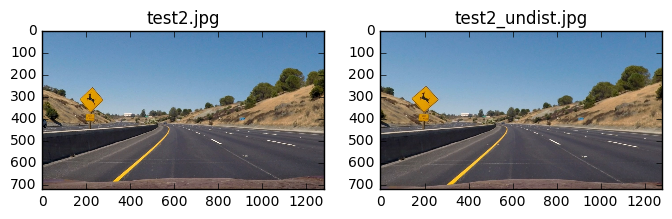

test_images/test3.jpg
test3.jpg
test3
output_images/test3_undist.jpg


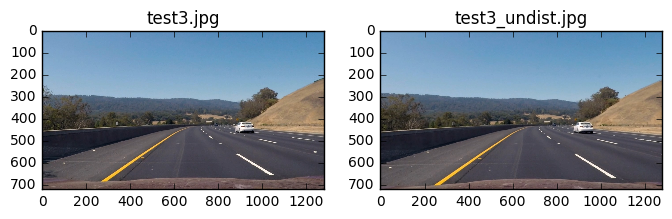

test_images/test4.jpg
test4.jpg
test4
output_images/test4_undist.jpg


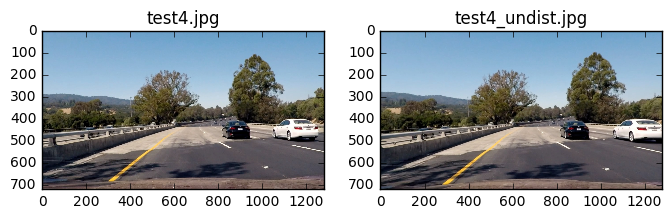

test_images/test5.jpg
test5.jpg
test5
output_images/test5_undist.jpg


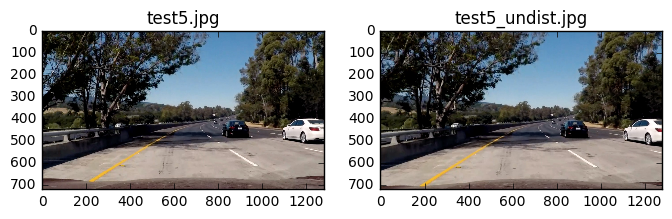

test_images/test6.jpg
test6.jpg
test6
output_images/test6_undist.jpg


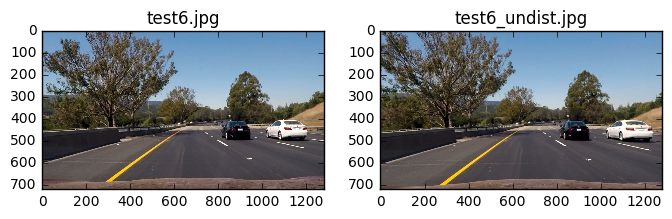

In [5]:
#mtx = []
#dist = []
################################################################
#    cameraCalibration_and_undistortion on single image
###############################################################
imagesTest = glob.glob('camera_cal/calibration1.jpg')
print(len(imagesTest))
undistortedImage, mtx, dist = cameraCalibration_and_undistortion(imagesTest)
#plt.imshow(undistortedImage);plt.show()

#####################################################################
#    cameraCalibration_and_undistortion on list of images
#####################################################################
# Make a list of test images
imagesTest = glob.glob('test_images/*.jpg')
print(len(imagesTest))
undistortedImage = cameraCalibration_and_undistortion(imagesTest)

#plt.imshow(undistortedImage);plt.show()
#cameraCalibration_and_undistortion(imagesTest)




# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "project4_pickle.p", "wb" ) )


# Step 4- Performing Gradients & Color Transforms

In [6]:
#######################################################################
# gradients & color transforms to create a thresholded binary image
#######################################################################

# Edit this function to create your own pipeline.
def gradient_and_color_transforms(img, video_type='simple', s_thresh=(150, 255), sx_thresh=(20, 255)):
    img = np.copy(img)



    """  applying region of interest on colored image for challenge-harder videos """
    if(video_type=='challenge' or video_type=='harder_challenge'):
        #defining a blank mask to start with
        mask = np.zeros_like(img)

        #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
        if len(img.shape) > 2:
            channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
            ignore_mask_color = (255,) * channel_count
        else:
            ignore_mask_color = 255

        #filling pixels inside the polygon defined by "src" with the fill color
        cv2.fillPoly(mask, np.int_([src]), ignore_mask_color)

        #returning the image only where mask pixels are nonzero
        masked_image = cv2.bitwise_and(img, mask)
        #plt.imshow(masked_image);plt.show()
        print(src)
        img=masked_image




    # Convert to HLS color space and separate the L & S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]




    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)


    # Sobel x
    #sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal

    # additional
    # Sobel y
    #sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in x
#    sobely = cv2.Sobel(l_channel, cv2.CV_64F, 0, 1) # Take the derivative in x
#    abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from horizontal
#    # Calculate the gradient magnitude
#    gradmag = np.sqrt(abs_sobelx ** 2 + abs_sobely ** 2)
    #scaled_sobel = np.uint8(255*gradmag/np.max(gradmag))


    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Hue Threshold color channel
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= 0) & (h_channel <= 100)] = 1
    # Combine the two binary thresholds
    sh_binary = np.zeros_like(h_binary)
    sh_binary[(s_binary == 1) | (h_binary == 1)] = 1

    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, sh_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1


#=================================================================================

##################################################################################
#       working without using separated white and yellow lines shown below
##################################################################################
#    # white and yellow line separation from project1
#    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#    #plt.imshow(img); plt.show()
#    #plt.imshow(hsv); plt.show()
#    white = cv2.inRange(hsv, (0, 0, 180), (255, 25, 255))
##    plt.figure(figsize=(8,5))
##    plt.subplot(2,2,1)
##    plt.imshow(white, cmap='gray');
#    #yellow = cv2.inRange(hsv, (20, 80, 80), (50, 255, 255))
#    yellow = cv2.inRange(hsv, (20, 100, 100), (30, 255, 255))
##    plt.subplot(2,2,2)
##    plt.imshow(yellow, cmap='gray');
#    yellow_white_lines = cv2.bitwise_or(yellow, white)
##    plt.subplot(2,2,3)
##    plt.imshow(gray, cmap='gray'); plt.show()
#
#    # Combine the two binary thresholds
#    combined_binary1 = np.zeros_like(white)
##    print(combined_binary_mixed.shape)
##    print(gray.shape)
#    combined_binary1[(combined_binary == 1) & (yellow_white_lines*255 == 1)] = 1
#    #plt.imshow(combined_binary_mixed);plt.show()

#=================================================================================





#    # l_channel and s_channel
#    plt.figure(figsize=(8,5))
#    plt.subplot(1,2,1)
#    plt.imshow(s_channel, cmap='gray');
#    plt.title('s_channel')
#    plt.subplot(1,2,2)
#    plt.imshow(l_channel, cmap='gray');
#    plt.title('l_channel')
#    plt.show()
#
#    # plotting S_channel_threshold and sobel_threshold
#    plt.figure(figsize=(8,5))
#    plt.subplot(1,2,1)
#    plt.imshow(s_binary, cmap='gray');
#    plt.title('S_channel_threshold')
#    plt.subplot(1,2,2)
#    plt.imshow(sxbinary, cmap='gray');
#    plt.title('Sobel_threshold')
#    plt.show()

    #  plotting color_binary and combined binary images for whole loop
#    plt.figure(figsize=(8,5))
#    plt.subplot(2,2,1)
#    plt.imshow(img)
#    plt.subplot(2,2,2)
#    plt.imshow(color_binary)
#    plt.subplot(2,2,3)
#    plt.imshow(combined_binary)
#    plt.subplot(2,2,4)
#    plt.imshow(combined_binary, cmap='gray');plt.show()



    return color_binary, combined_binary


output_images/straight_lines1_undist.jpg


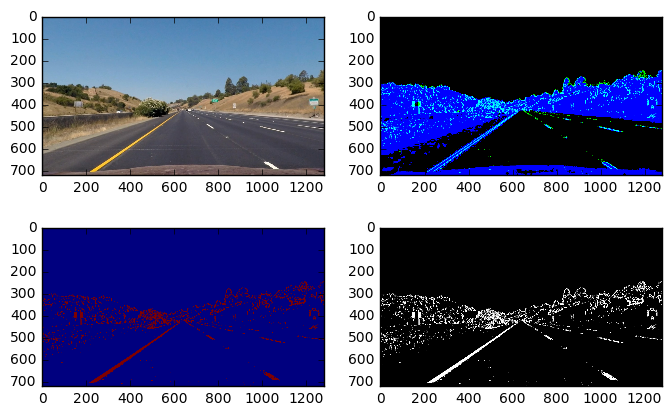

output_images/straight_lines2_undist.jpg


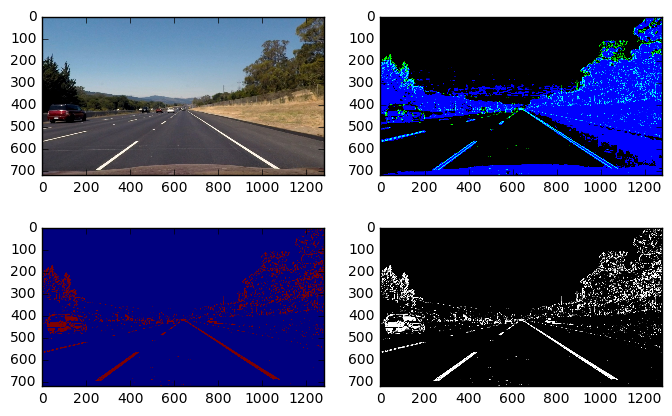

output_images/test1_undist.jpg


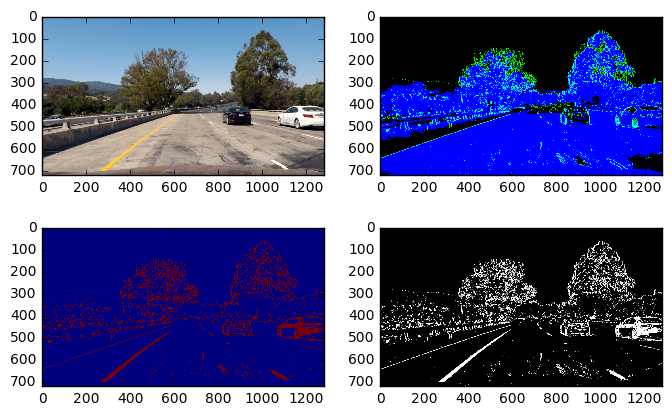

output_images/test2_undist.jpg


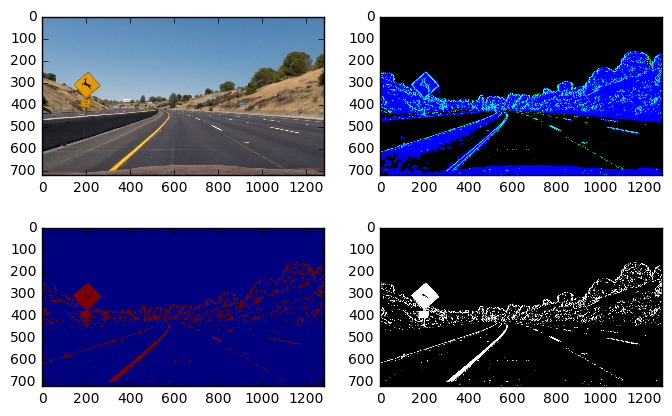

output_images/test3_undist.jpg


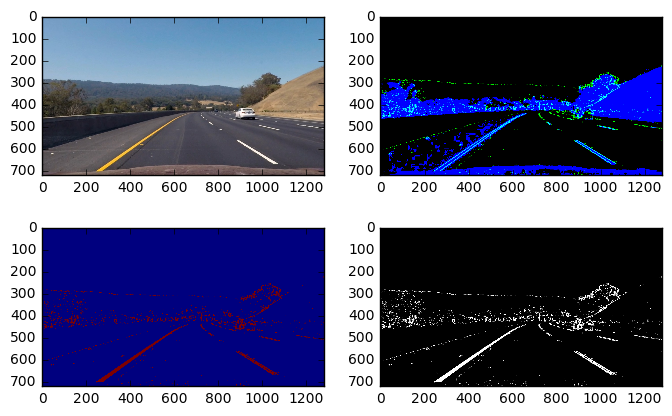

output_images/test4_undist.jpg


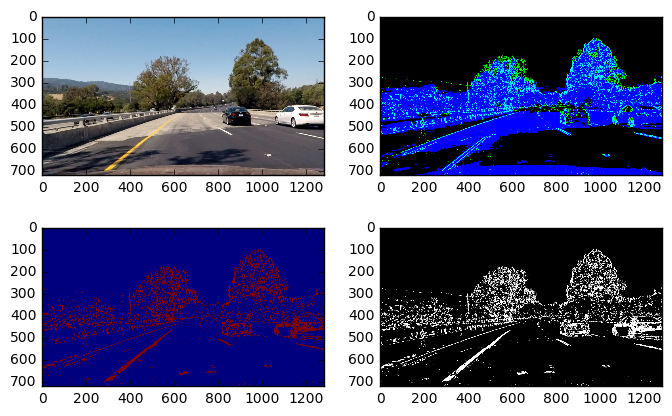

output_images/test5_undist.jpg


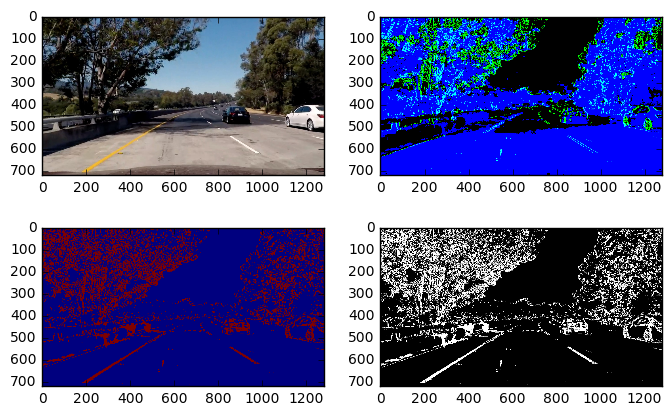

output_images/test6_undist.jpg


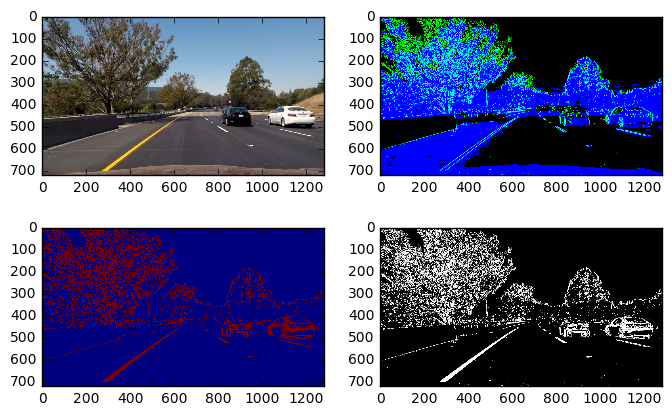

In [7]:
#################################################
# remember to take undistorted images from now
#################################################

# #plotting color_binary and combined binary images for single straight_lines_undist image
# imagePath = 'output_images/straight_lines1_undist.jpg'
# print(imagePath)
# print(os.path.basename(imagePath))
# image = mpimg.imread(imagePath)
# color_binary, combined_binary = gradient_and_color_transforms(image)

# #  plotting color_binary and combined binary images for last image
# plt.figure(figsize=(8,5))
# plt.subplot(2,2,1)
# plt.imshow(image)
# plt.subplot(2,2,2)
# plt.imshow(color_binary)
# plt.subplot(2,2,3)
# plt.imshow(combined_binary)
# plt.subplot(2,2,4)
# plt.imshow(combined_binary, cmap='gray');plt.show()

#  plotting color_binary and combined binary images for straight_lines_undist images
images = glob.glob('output_images/straight_lines*.jpg')
for fname in sorted(images):
    print(fname)
    image = mpimg.imread(fname)
    color_binary, combined_binary = gradient_and_color_transforms(image)
    #  plotting color_binary and combined binary images for last image
    plt.figure(figsize=(8,5))
    plt.subplot(2,2,1)
    plt.imshow(image)
    plt.subplot(2,2,2)
    plt.imshow(color_binary)
    plt.subplot(2,2,3)
    plt.imshow(combined_binary)
    plt.subplot(2,2,4)
    plt.imshow(combined_binary, cmap='gray');plt.show()

#  plotting color_binary and combined binary images for test_undist images
images = glob.glob('output_images/test*.jpg')
for fname in sorted(images):
    print(fname)
    image = mpimg.imread(fname)
    color_binary, combined_binary = gradient_and_color_transforms(image)
    #  plotting color_binary and combined binary images for last image
    plt.figure(figsize=(8,5))
    plt.subplot(2,2,1)
    plt.imshow(image)
    plt.subplot(2,2,2)
    plt.imshow(color_binary)
    plt.subplot(2,2,3)
    plt.imshow(combined_binary)
    plt.subplot(2,2,4)
    plt.imshow(combined_binary, cmap='gray');plt.show()




# Step 5- Performing perspective Transform

In [3]:
######################################
#  perspective transform function
######################################

def warper(img, src, dst):
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped


# Step 6 - Sliding Window & Skip Sliding window functions

In [9]:
###################################################################
#  plotting histogram and employing sliding windows concept
####################################################################
# Choose the number of sliding windows i.e  nwindows
# Set the width of the windows +/- margin  i.e  margin
# Set minimum number of pixels found to recenter window i.e  minpix
def sliding_windows(binary_warped, margin = 150, nwindows=9, minpix = 100):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    #plt.plot(histogram);plt.show()
    #print(histogram.shape)
    #print(np.argmax(histogram))

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    #plt.imshow(out_img);plt.show()
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
                            # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    #print(nonzero)
    #print(nonzero[0])
    #print(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
#         print(good_left_inds)
#         print(good_right_inds)
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        #print(left_lane_inds)
        right_lane_inds.append(good_right_inds)
        #print(right_lane_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))


    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)


    # appending polynomial values in the defined class
    bothLanes.setLeftFitPolyCoeff(left_fit)
    bothLanes.setRightFitPolyCoeff(right_fit)


    # visualizing
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # visualizing the final left and right lane in yellow
#    plt.imshow(out_img);  plt.show()
#    plt.imshow(out_img);
#    plt.plot(left_fitx, ploty, color='yellow')
#    plt.plot(right_fitx, ploty, color='yellow')
#    plt.xlim(0, 1280)
#    plt.ylim(720, 0)
#    plt.show()

    return out_img, left_fitx, right_fitx, ploty, left_fit, right_fit

In [4]:
#########################################################
#  skip sliding window concept
#########################################################
def skip_sliding_windows(binary_warped, margin=100):
    # Assume you now have a new warped binary image
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100


     # importing the values of FitPolyCoeffs
    leftFitPolyCoeffNP = np.asarray(bothLanes.getLeftFitPolyCoeff())
    rightFitPolyCoeffNP = np.asarray(bothLanes.getRightFitPolyCoeff())
    # Smoothing your measurement
    left_fit = leftFitPolyCoeffNP.mean(axis=0)
    right_fit = rightFitPolyCoeffNP.mean(axis=0)


    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


    # appending polynomial values in the defined class
    bothLanes.setLeftFitPolyCoeff(left_fit)
    bothLanes.setRightFitPolyCoeff(right_fit)


    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]


    # visualize the result here

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
#    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
#    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
#    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
#    plt.imshow(result)
#    plt.plot(left_fitx, ploty, color='yellow')
#    plt.plot(right_fitx, ploty, color='yellow')
#    plt.xlim(0, 1280)
#    plt.ylim(720, 0)
#    plt.show()

    return out_img, left_fitx, right_fitx, ploty, left_fit, right_fit


# Step 7 - Calculating Radius of Curvature of Road

In [5]:
#########################################
# radius of curvature in pixels space
#########################################
def radius_of_curvature_pixels(binary_warped, left_fit, right_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = binary_warped.shape[0]
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5)                                  /np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5)                                     /np.absolute(2*right_fit[0])
    print(left_curverad, right_curverad)
    # Example values: 1163.9    1213.7
    return left_curverad, right_curverad


###########################################
#  radius of curvature in meters space
###########################################
def radius_of_curvature_meters(binary_warped, left_fitx, right_fitx, ploty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    y_eval = binary_warped.shape[0]
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    return left_curverad, right_curverad


# Step 8- Drawing Colored polygon enclosing road lanes

In [12]:
##################################################################
#  drawing back onto road
##################################################################

def drawing_on_road(image_undist, binary_warped, src, dst, left_fitx, right_fitx, ploty):
    warped = binary_warped
    Minv = cv2.getPerspectiveTransform(dst, src)
    #undist = image1
    #undist = mpimg.imread(fname)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image_undist.shape[1], image_undist.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(image_undist, 1, newwarp, 0.3, 0)
    #plt.imshow(result);plt.show()
    return result

# Step 9- Functions for showing detailed(image by image) & not detailed lane formation on original road images 

In [13]:
############################################################
### applying perspective transform on RGB and Binary image
### & employing sliding windows concept
############################################################



def forming_advanced_lane_lines_detailed(imagesTest4Perspective):
    for fname in sorted(imagesTest4Perspective):
        #image_undist = cv2.imread(fname)
        print(fname)
        image_undist = mpimg.imread(fname)
        plt.figure(figsize=(8,5))
        plt.subplot(121)
        plt.imshow(image_undist)
        plt.plot(src[0][0], src[0][1], 'o')
        plt.plot(src[1][0], src[1][1], 'o')
        plt.plot(src[2][0], src[2][1], 'o')
        plt.plot(src[3][0], src[3][1], 'o');#plt.show()

        perspective_transform_image = warper(image_undist, src, dst)
        plt.subplot(122)
        plt.imshow(perspective_transform_image)
        plt.plot(dst[0][0], dst[0][1], 'o')
        plt.plot(dst[1][0], dst[1][1], 'o')
        plt.plot(dst[2][0], dst[2][1], 'o')
        plt.plot(dst[3][0], dst[3][1], 'o');plt.show()


        # find polylines
        cv2.polylines(image_undist,  np.int32([src]),  isClosed=1, color=(255,0,0), thickness=7)
        cv2.polylines(perspective_transform_image,  np.int32([dst]),  isClosed=1, color=(255,0,0), thickness=7)
        plt.figure(figsize=(8,5))
        plt.subplot(121)
        plt.imshow(image_undist)
        plt.title('original_image')
        plt.subplot(122)
        plt.imshow(perspective_transform_image)
        plt.title('perspective_transform_image')
        plt.show()


        # if take image_undist,it got updated with polylines
        image_undist_2_form_Binary = mpimg.imread(fname)
        color_binary, combined_binary = gradient_and_color_transforms(image_undist_2_form_Binary)

        plt.figure(figsize=(8,5))
        plt.subplot(121)
        plt.imshow(combined_binary, cmap='gray')
        plt.title('combined_binary')
        plt.plot(src[0][0], src[0][1], 'o')
        plt.plot(src[1][0], src[1][1], 'o')
        plt.plot(src[2][0], src[2][1], 'o')
        plt.plot(src[3][0], src[3][1], 'o')


        plt.subplot(122)
        # Assuming you have created a warped binary image called "binary_warped"
        binary_warped = warper(combined_binary, src, dst)
        plt.imshow(binary_warped, cmap='gray')
        plt.title('binary_warped \n (perspective_transform_image_binary)')
        plt.plot(dst[0][0], dst[0][1], 'o')
        plt.plot(dst[1][0], dst[1][1], 'o')
        plt.plot(dst[2][0], dst[2][1], 'o')
        plt.plot(dst[3][0], dst[3][1], 'o')
        plt.show()


        out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = sliding_windows(binary_warped)
        # visualizing
        plt.figure(figsize=(8,5))
        plt.subplot(121)
        plt.imshow(binary_warped, cmap='gray')
        plt.subplot(122)
        plt.imshow(out_img); # plt.show()
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        #plt.xlim(0, 1280)
        #plt.ylim(720, 0)
        plt.show()

        initialImage = image_undist_2_form_Binary

        # finding radius of curvature
        left_curverad_pixels, right_curverad_pixels = radius_of_curvature_pixels(binary_warped, left_fit, right_fit)
        left_curverad_meters, right_curverad_meters = radius_of_curvature_meters(binary_warped, left_fitx, right_fitx, ploty)
        offsetValue = carOffset(left_fitx[0],right_fitx[0], initialImage.shape[1]/2)

        # plotting back on road
        initialImage = mpimg.imread(fname)
        draw_on_road_image = drawing_on_road(initialImage, binary_warped, src, dst, left_fitx, right_fitx, ploty)

        cv2.putText(draw_on_road_image,"Radius of Curvature (left lane) = %s(m)" %int(left_curverad_meters), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        cv2.putText(draw_on_road_image,"Radius of Curvature (right lane) = %s(m)" %int(right_curverad_meters), (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        cv2.putText(draw_on_road_image,"Car Offset from center of lanes = %s (m)" %(offsetValue), (50,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        #plt.imshow(draw_on_road_image);plt.show()

        # visualizing
        plt.figure(figsize=(8,5))
        plt.subplot(121)
        plt.imshow(initialImage)
        plt.title('original image')
        plt.subplot(122)
        plt.imshow(draw_on_road_image)
        plt.title('draw back on road image')
        plt.show()

        print(left_fitx[0],ploty[0],right_fitx[0])
        print(left_fitx[-1],ploty[-1],right_fitx[-1])
        print('\n##############################################################################\n')


In [14]:
def forming_advanced_lane_lines(images):
    print()
    resultImages = []
    for fname in sorted(images):
    #for fname in (images):
        print(fname)

        # RGB image
        #image_undist = mpimg.imread(fname)
        #perspective_transform_image = warper(image_undist, src, dst)

        # binary image
        #image_undist_Binary = fname
        image_undist_2_form_Binary = mpimg.imread(fname)
        color_binary, combined_binary = gradient_and_color_transforms(image_undist_2_form_Binary)
        binary_warped = warper(combined_binary, src, dst)
        out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = sliding_windows(binary_warped)

        initialImage = image_undist_2_form_Binary
        # finding radius of curvature
        #left_curverad_pixels, right_curverad_pixels = radius_of_curvature_pixels(binary_warped, left_fit, right_fit)
        left_curverad_meters, right_curverad_meters = radius_of_curvature_meters(binary_warped, left_fitx, right_fitx, ploty)
        offsetValue = carOffset(left_fitx[0],right_fitx[0], initialImage.shape[1]/2)


        # plotting back on road
        initialImage = mpimg.imread(fname)
        draw_on_road_image = drawing_on_road(initialImage, binary_warped, src, dst, left_fitx, right_fitx, ploty)

        cv2.putText(draw_on_road_image,"Radius of Curvature (left lane) = %s(m)" %int(left_curverad_meters), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        cv2.putText(draw_on_road_image,"Radius of Curvature (right lane) = %s(m)" %int(right_curverad_meters), (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        cv2.putText(draw_on_road_image,"Car Offset from center of lanes = %s (m)" %(offsetValue), (50,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)

        #plt.imshow(draw_on_road_image);plt.show()


        resultImages.append(draw_on_road_image)


    #return draw_on_road_image
    return resultImages

# Step 10- Car offset from center of lanes

In [15]:
def carOffset(leftLaneBottomX,rightLaneBottomX, carFrameMiddlePixel):
    xm_per_pix = 3.7/700    # meters per pixel in x dimension
    laneMiddlePixel = int(leftLaneBottomX + (rightLaneBottomX-leftLaneBottomX)/2)
    offsetInPixels = carFrameMiddlePixel - laneMiddlePixel
    offsetInMeters = xm_per_pix * offsetInPixels
    roundOf_offsetInMeters = round(offsetInMeters, 3)
    #print('pixelOffset- ', offsetInPixels)
    #print('metersOffset- ', offsetInMeters)
    #print('metersOffset- ', roundOf_offsetInMeters)
    return roundOf_offsetInMeters

In [16]:
##########################################################
#  final function for video
#########################################################

#For example, many perspective transform algorithms will programmatically
#detect four source points in an image based on edge or corner detection
#and analyzing attributes like color and surrounding pixels.

# for defining img_size variable
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])


######    for simple video and all other test images     ############
src = np.float32(
    [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 60), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 5), 0],
    [(img_size[0] / 5), img_size[1]],
    [(img_size[0] * 4 / 5), img_size[1]],
    [(img_size[0] * 4 / 5), 0]])



2
output_images/straight_lines1_undist.jpg


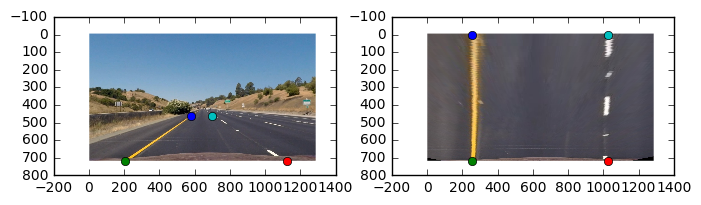

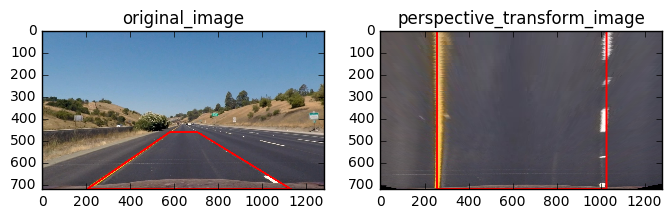

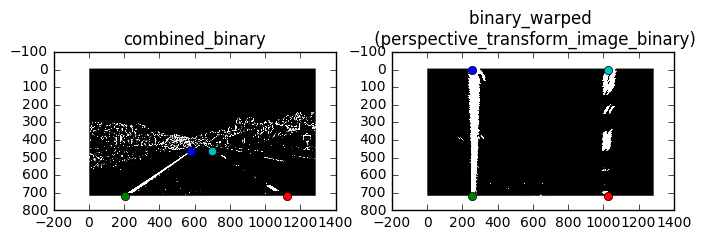

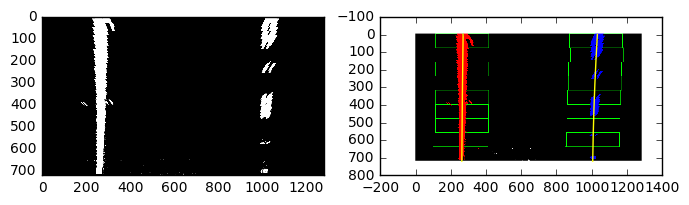

90884.3919295 15621.3769921
29849.6430815 m 5129.51827577 m


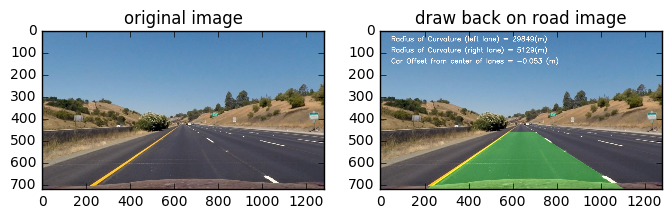

269.789770711 0.0 1032.05179162
262.538314175 719.0 1005.75810245

##############################################################################

output_images/straight_lines2_undist.jpg


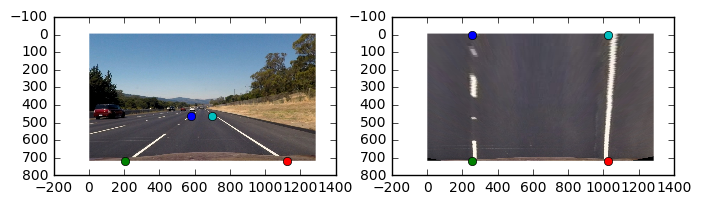

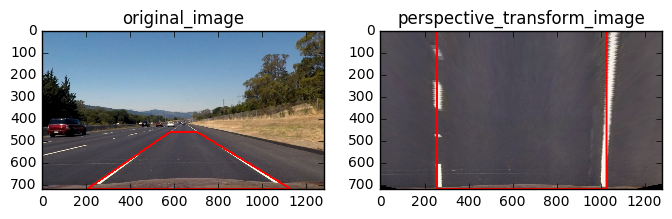

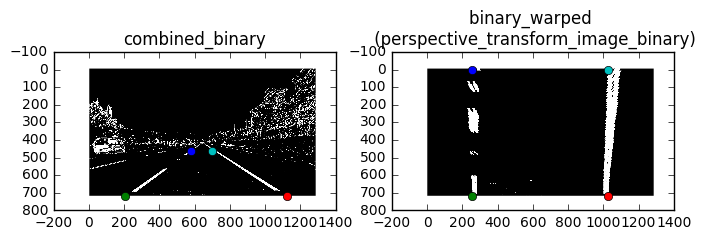

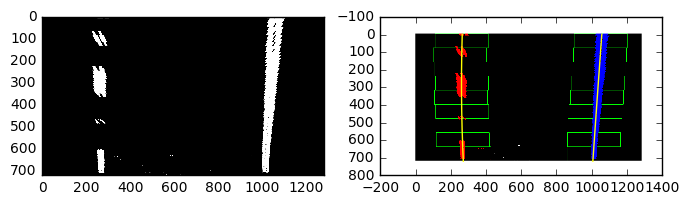

9285.50299294 129029.725514
3039.68613639 m 42095.2398604 m


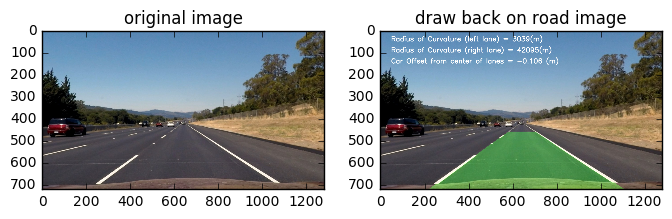

264.781197772 0.0 1057.13648716
270.995490837 719.0 1006.43969399

##############################################################################

6
output_images/test1_undist.jpg


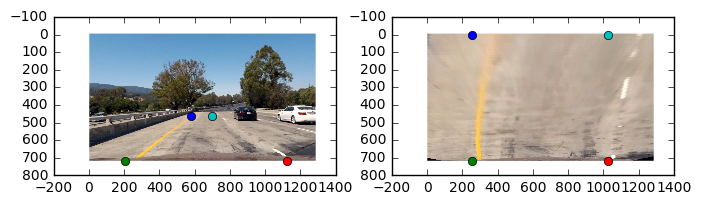

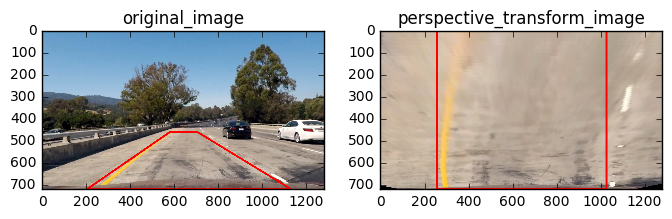

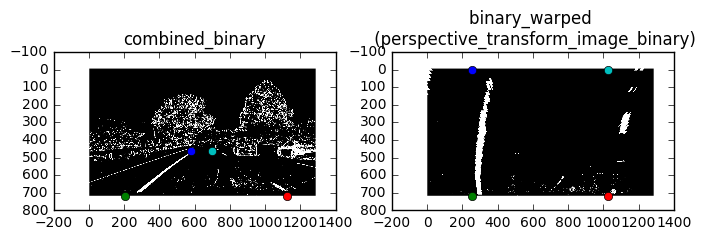

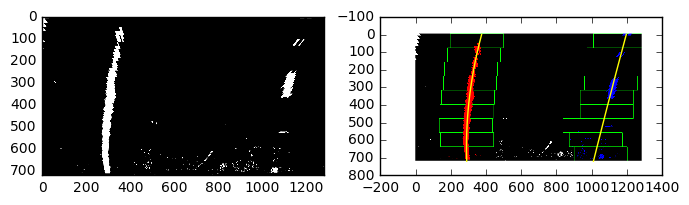

2391.16305733 38203.95633
784.096031234 m 11484.7664506 m


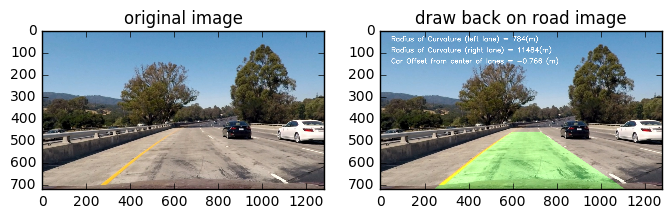

374.768235626 0.0 1196.0893864
290.188342943 719.0 1009.82064786

##############################################################################

output_images/test2_undist.jpg


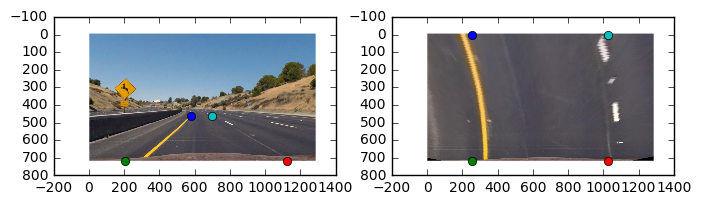

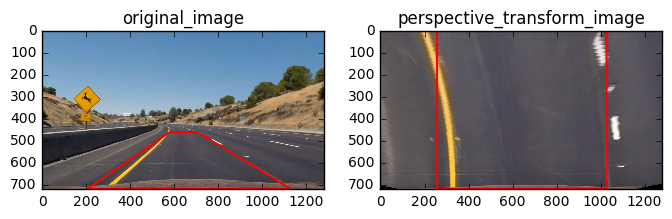

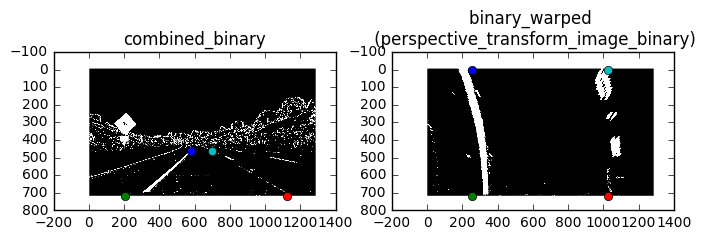

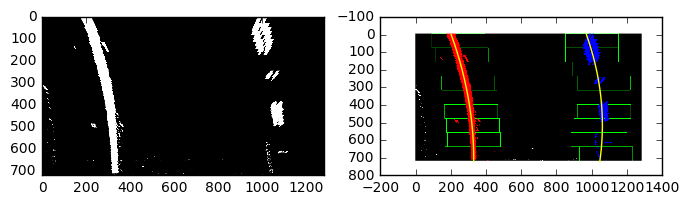

1968.64655122 1500.30506291
646.585304059 m 478.578054859 m


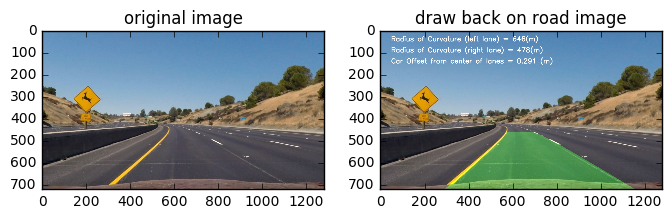

202.088778363 0.0 969.847681068
330.192899979 719.0 1046.1027098

##############################################################################

output_images/test3_undist.jpg


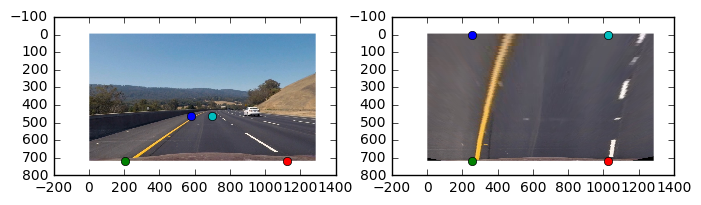

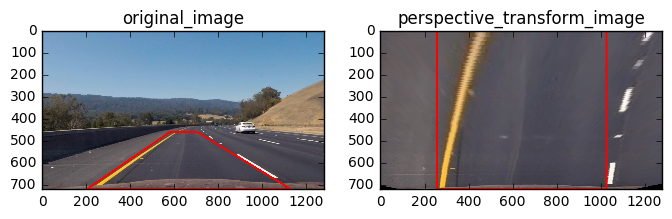

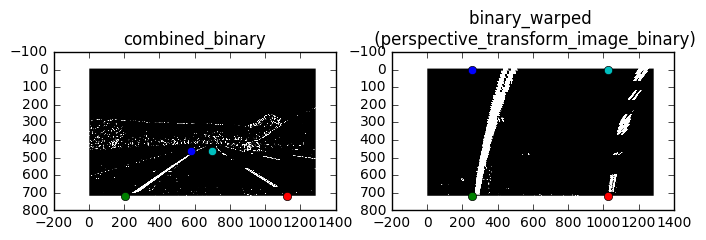

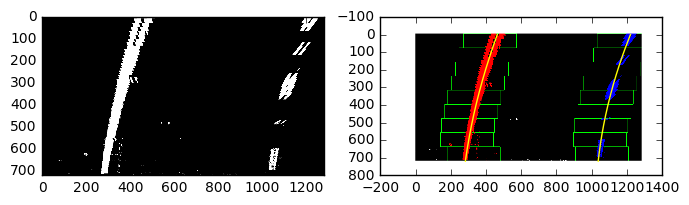

3244.29993808 2503.75507046
1036.27587217 m 808.314470058 m


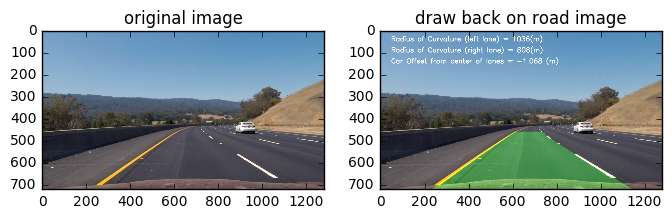

464.176902106 0.0 1220.0231829
282.639507658 719.0 1036.73846045

##############################################################################

output_images/test4_undist.jpg


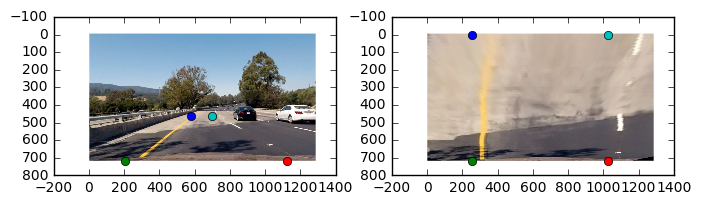

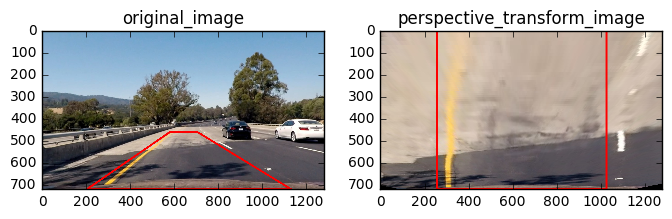

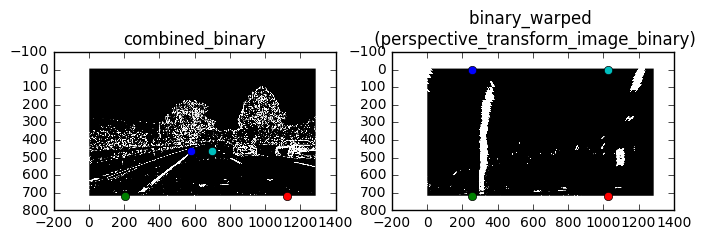

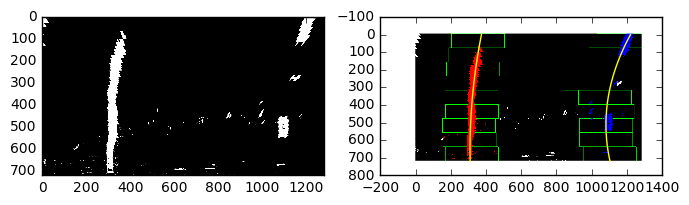

3306.56929428 1006.62852901
1085.42538405 m 307.814304071 m


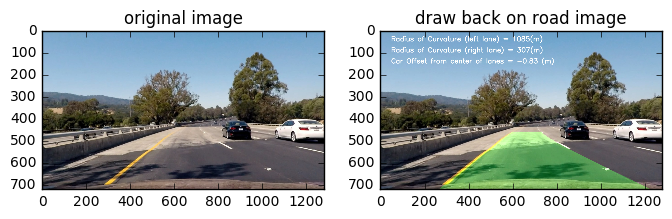

373.849780438 0.0 1220.3874013
309.657825978 719.0 1103.70699318

##############################################################################

output_images/test5_undist.jpg


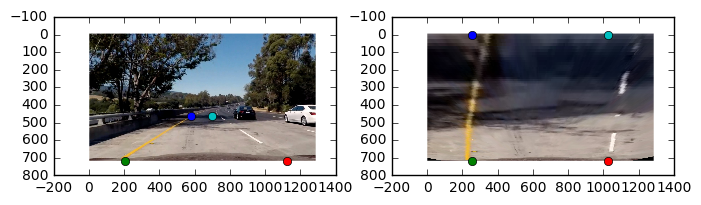

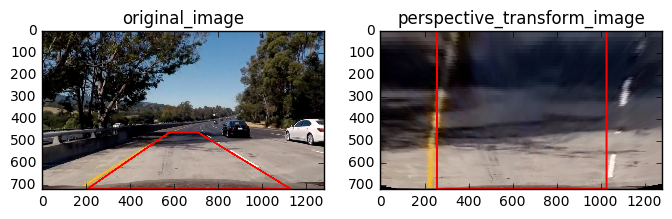

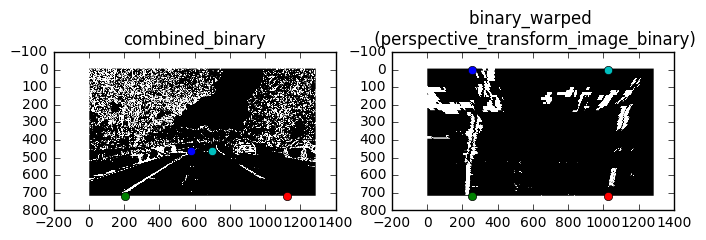

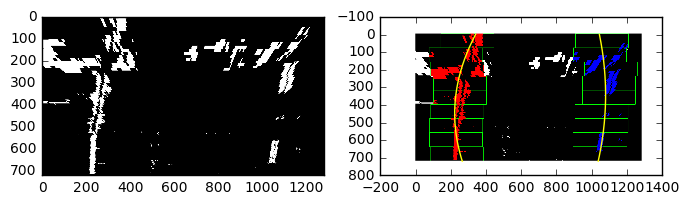

982.687460477 1806.41254684
279.591031192 m 551.801478864 m


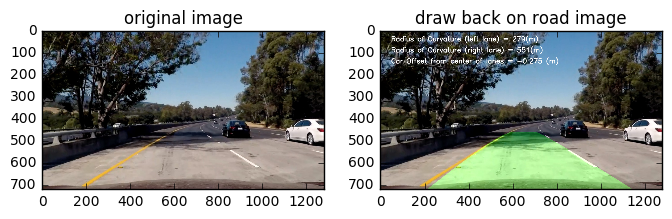

340.377164921 0.0 1043.67533396
265.071010837 719.0 1036.72301153

##############################################################################

output_images/test6_undist.jpg


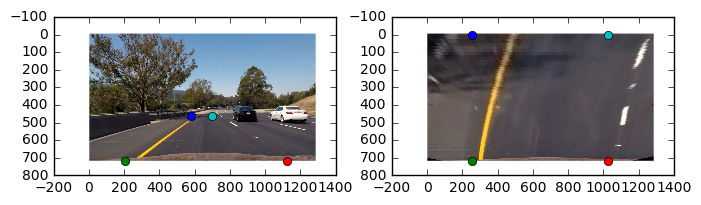

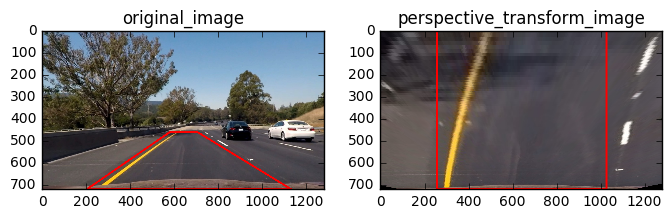

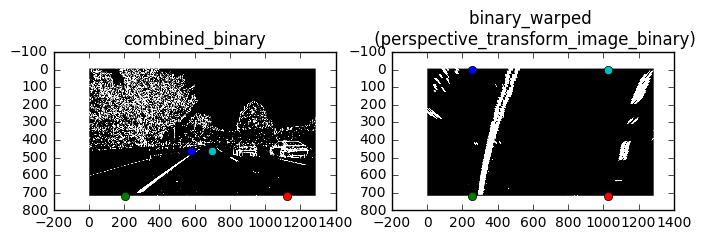

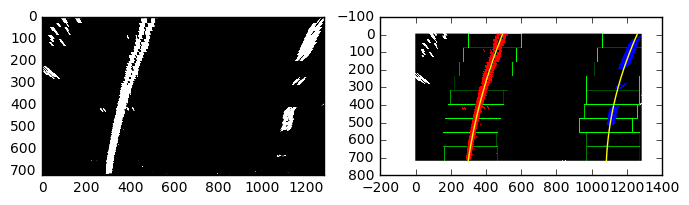

3007.48444495 1802.16542942
957.429926838 m 590.383508014 m


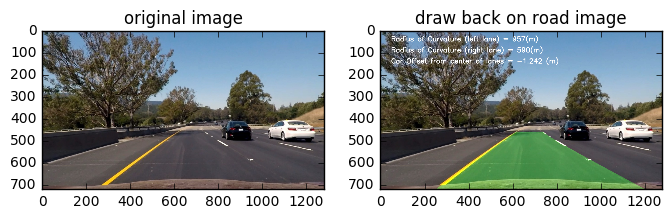

492.559768989 0.0 1257.57767897
298.409936618 719.0 1083.10878872

##############################################################################



In [17]:
################   detailed advanced lane lines    #######################

# glob shows path names

imagesTest4Perspective = glob.glob('output_images/straight_lines*.jpg')
print(len(imagesTest4Perspective))
forming_advanced_lane_lines_detailed(imagesTest4Perspective)
imagesTest4Perspective = glob.glob('output_images/test*.jpg')
print(len(imagesTest4Perspective))
forming_advanced_lane_lines_detailed(imagesTest4Perspective)



['output_images/straight_lines1_undist.jpg', 'output_images/straight_lines2_undist.jpg']
['output_images/straight_lines1_undist.jpg', 'output_images/straight_lines2_undist.jpg']
2

output_images/straight_lines1_undist.jpg
29849.6430815 m 5129.51827577 m
output_images/straight_lines2_undist.jpg
3039.68613639 m 42095.2398604 m

output_images/straight_lines1_undist.jpg


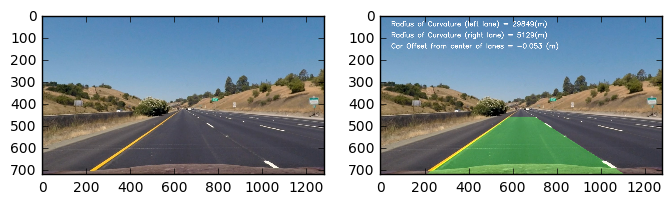


output_images/straight_lines2_undist.jpg


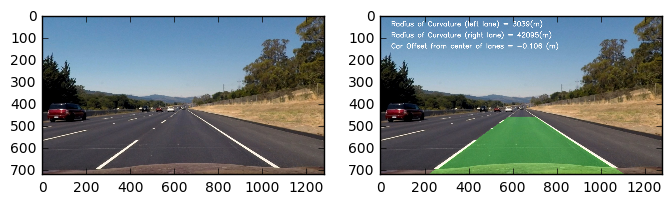

['output_images/test5_undist.jpg', 'output_images/test4_undist.jpg', 'output_images/test3_undist.jpg', 'output_images/test1_undist.jpg', 'output_images/test2_undist.jpg', 'output_images/test6_undist.jpg']
['output_images/test1_undist.jpg', 'output_images/test2_undist.jpg', 'output_images/test3_undist.jpg', 'output_images/test4_undist.jpg', 'output_images/test5_undist.jpg', 'output_images/test6_undist.jpg']
6

output_images/test1_undist.jpg
784.096031234 m 11484.7664506 m
output_images/test2_undist.jpg
646.585304059 m 478.578054859 m
output_images/test3_undist.jpg
1036.27587217 m 808.314470058 m
output_images/test4_undist.jpg
1085.42538405 m 307.814304071 m
output_images/test5_undist.jpg
279.591031192 m 551.801478864 m
output_images/test6_undist.jpg
957.429926838 m 590.383508014 m

output_images/test1_undist.jpg


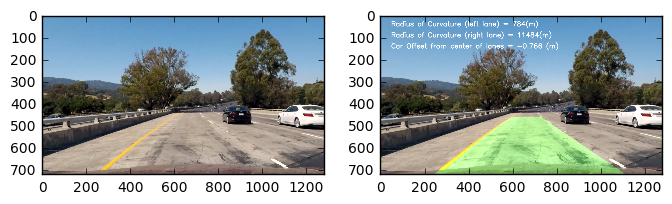


output_images/test2_undist.jpg


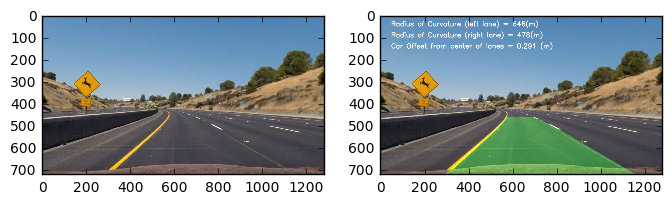


output_images/test3_undist.jpg


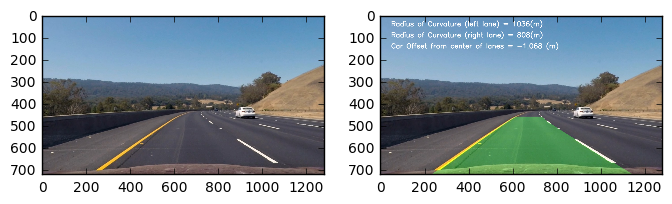


output_images/test4_undist.jpg


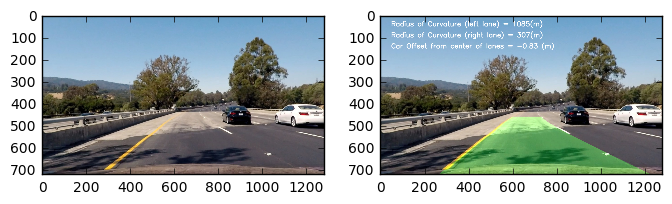


output_images/test5_undist.jpg


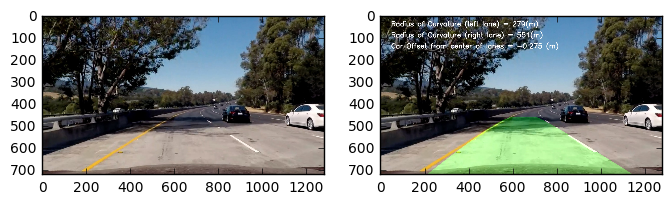


output_images/test6_undist.jpg


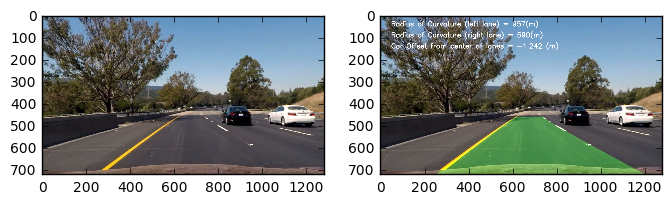

In [18]:


################   advanced lane lines for pictures   #######################

# # glob shows path names

#images2Feed = mpimg.imread('output_images/straight_lines1_undist.jpg')
# #straight line images
images2Feed = glob.glob('output_images/straight_lines*.jpg')
print(images2Feed)
print(sorted(images2Feed))
print(len(images2Feed))
resultImages = forming_advanced_lane_lines(images2Feed)

for i in range(len(resultImages)):
    # to print the sorted names
    print()
    print((sorted(images2Feed))[i])
    plt.figure(figsize=(8,5))
    plt.subplot(121)
    plt.imshow(mpimg.imread((sorted(images2Feed))[i]))
    plt.subplot(122)
    plt.imshow(resultImages[i]);plt.show()


# # test images
images2Feed = glob.glob('output_images/test*.jpg')
print(images2Feed)
print(sorted(images2Feed))
print(len(images2Feed))
resultImages = forming_advanced_lane_lines(images2Feed)

for i in range(len(resultImages)):
    # to print the sorted names
    print()
    print((sorted(images2Feed))[i])
    plt.figure(figsize=(8,5))
    plt.subplot(121)
    plt.imshow(mpimg.imread((sorted(images2Feed))[i]))
    plt.subplot(122)
    plt.imshow(resultImages[i]);plt.show()




# Step 11- Various type of sanity checks performed on road images

In [19]:
##############################################################
#       sanity checks
###############################################################



# to see all sanity fails values
all_sc1=[]
all_sc2b=[]
all_sc2t=[]
all_sc3=[]
avoidFirstCountSanityCurvatureFail=0

def sanity_check_curvature(left, right, video_type):
    print('curvature diff.- ',abs(left-right))
    all_sc1.append(abs(left-right))
    global countSanityCurvatureFail
    global avoidFirstCountSanityCurvatureFail
    # to avoid sanity fail at first iteration
    if (avoidFirstCountSanityCurvatureFail==0):
        # test image straight lines have curvature diff. more than 2000
        if((abs(left-right)) < 100000):
            #if((abs(left-right)) < 10000000):
            avoidFirstCountSanityCurvatureFail+=1
            return True
        else:
            countSanityCurvatureFail+=1
            return False
    else:
        print('here')
        if(video_type=='harder_challenge'):
            # test image straight lines have curvature diff. more than 10000
            if((abs(left-right)) < 30000):
            #if((abs(left-right)) < 10000000):
                return True
            else:
                countSanityCurvatureFail+=1
                return False
        else:
            # test image straight lines have curvature diff. more than 10000
            if((abs(left-right)) < 10000):
            #if((abs(left-right)) < 10000000):
                return True
            else:
                countSanityCurvatureFail+=1
                return False


def sanity_check_distance(video_type, left_x, right_x):
    bottomDistance = abs(left_x[0]-right_x[0])
    print(bottomDistance)
    topDistance = abs(left_x[-1]-right_x[-1])
    print(topDistance)
    print(abs(bottomDistance - topDistance))
    #all_sc2.append(abs(bottomDistance - topDistance))
    all_sc2b.append(abs(bottomDistance))
    all_sc2t.append(abs(topDistance))
    #if((bottomDistance >550 and bottomDistance < 750) and (topDistance >550 and topDistance < 750)):
    if(video_type=='simple'):
        if((bottomDistance >700 and bottomDistance < 850) and (topDistance >700 and topDistance < 850)):
            return True
        else:
            global countSanityDistanceFail
            countSanityDistanceFail+=1
            return False

    elif(video_type=='challenge'):
        print("here1h")
        # working fine for challenge video
        if((bottomDistance >700 and bottomDistance < 800) and (topDistance >700 and topDistance < 800)):
            return True
        else:
            global countSanityDistanceFail
            countSanityDistanceFail+=1
            return False

    elif(video_type=='harder_challenge'):
        print("here1h")
        # working fine for harder challenge video
        if((bottomDistance >500 and bottomDistance < 800) and (topDistance >500 and topDistance < 800)):
            return True
        else:
            global countSanityDistanceFail
            countSanityDistanceFail+=1
            return False


def sanity_check_parallel(left_x, y, right_x):
    bottomDistance = abs(left_x[0]-right_x[0])
    #print(bottomDistance)
    topDistance = abs(left_x[-1]-right_x[-1])
    #print(topDistance)
    print(abs(bottomDistance - topDistance))
    all_sc3.append(abs(bottomDistance - topDistance))
    #if(abs(bottomDistance - topDistance) < 150):
    if(abs(bottomDistance - topDistance) < 200):
         return True
    else:
        global countSanityParallelFail
        countSanityParallelFail+=1
        return False




def resetGlobalVariables():
    global countSanitySuccess
    global countSanityFail
    global countSanityCurvatureFail
    global countSanityDistanceFail
    global countSanityParallelFail
    countSanitySuccess = 0
    countSanityFail = 0
    countSanityCurvatureFail=0
    countSanityDistanceFail=0
    countSanityParallelFail=0
    global out_img
    out_img=[]
    global all_sc1
    global all_sc2
    global all_sc3
    all_sc1=[]
    all_sc2=[]
    all_sc3=[]
#    global bothLanes
#    bothLanes = Line()



def sanity_checks_all(video_type, left_curverad_meters, right_curverad_meters, left_fitx, ploty, right_fitx):
    global countSanitySuccess
    global countSanityFail
    sanity_curvature_boolean = sanity_check_curvature(left_curverad_meters, right_curverad_meters, video_type)
    print("sc1-",sanity_curvature_boolean)
    sanity_distance_boolean = sanity_check_distance(video_type, left_fitx, right_fitx)
    print("sc2-",sanity_distance_boolean)
    sanity_parallel_boolean = sanity_check_parallel(left_fitx, ploty, right_fitx)
    print("sc3-",sanity_parallel_boolean)
    if(sanity_curvature_boolean and sanity_distance_boolean and sanity_parallel_boolean):
        print('sanity checks all- ',True)
        countSanitySuccess+=1
        bothLanes.setIsLineDetected(True)
        bothLanes.setLeftFitx(left_fitx)
        bothLanes.setRightFitx(right_fitx)
        bothLanes.setPloty(ploty)
        bothLanes.setRadiusOfCurvature(left_curverad_meters, right_curverad_meters)

    else:
        countSanityFail+=1
        print('sanity checks all- ',False)
        bothLanes.setIsLineDetected(False)

<ipython-input-19-c3ed93c2fd24>:73: SyntaxWarning: name 'countSanityDistanceFail' is assigned to before global declaration
  global countSanityDistanceFail
<ipython-input-19-c3ed93c2fd24>:83: SyntaxWarning: name 'countSanityDistanceFail' is assigned to before global declaration
  global countSanityDistanceFail


# Step 12- Function to combine many images on one Frame

In [20]:
# implementation 4 mosaic image
def mosaic_image(m_image_undist1, m_perspective_transform_image1, m_color_binary, m_combined_binary, m_binary_warped, m_draw_on_road_image, m_initialImage, m_out_img, m_countSanitySuccess, m_countSanityFail, m_countSanityCurvatureFail, m_countSanityDistanceFail, m_countSanityParallelFail):
    print(m_draw_on_road_image.shape)

    diagScreen = np.zeros((1280, 1800, 3), dtype=np.uint8)

    m_draw_on_road_image= cv2.copyMakeBorder(m_draw_on_road_image,10,10,10,10,cv2.BORDER_CONSTANT,value=(0,255,255))
    diagScreen[560:1280, 0:1800] = cv2.resize(m_draw_on_road_image, (1800,720), interpolation=cv2.INTER_AREA)
    #plt.imshow(diagScreen);plt.show()

    textPanel = np.zeros((200, 1800, 3), dtype=np.uint8)
    cv2.putText(textPanel,"Sanity Checks on individual Frames: " , (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2, cv2.LINE_AA)
    cv2.putText(textPanel,"Success = %s  " %(m_countSanitySuccess) , (250,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2, cv2.LINE_AA)
    cv2.putText(textPanel,"Fail = %s  " %(m_countSanityFail) , (850,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2, cv2.LINE_AA)
    cv2.putText(textPanel,"Total = %s  " %(m_countSanitySuccess+m_countSanityFail) , (1450,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(textPanel,"(sc1 fail = %s    sc2 fail = %s    sc3 fail = %s)" %(m_countSanityCurvatureFail, m_countSanityDistanceFail, m_countSanityParallelFail) , (600,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2, cv2.LINE_AA)
    textPanel= cv2.copyMakeBorder(textPanel,10,10,10,10,cv2.BORDER_CONSTANT,value=(0,255,255))
    diagScreen[360:560, 0:1800] = cv2.resize(textPanel, (1800,200), interpolation=cv2.INTER_AREA)
    #plt.imshow(textPanel);plt.show()

    m_image_undist1 = cv2.copyMakeBorder(m_image_undist1,10,10,10,10,cv2.BORDER_CONSTANT,value=(0,255,255))
    diagScreen[0:360, 0:360] = cv2.resize(m_image_undist1, (360,360), interpolation=cv2.INTER_AREA)
    #plt.imshow(diagScreen);plt.show()

    m_perspective_transform_image1 = cv2.copyMakeBorder(m_perspective_transform_image1,10,10,10,10,cv2.BORDER_CONSTANT,value=(0,255,255))
    diagScreen[0:360, 360:720] = cv2.resize(m_perspective_transform_image1, (360,360), interpolation=cv2.INTER_AREA)
    #plt.imshow(diagScreen);plt.show()

    mc_combined_binary = np.dstack((m_combined_binary, m_combined_binary, m_combined_binary))*255
    #plt.imshow(mc_combined_binary);plt.show()
    mc_combined_binary = cv2.copyMakeBorder(mc_combined_binary,10,10,10,10,cv2.BORDER_CONSTANT,value=(0,255,255))
    diagScreen[0:360, 720:1080] = cv2.resize(mc_combined_binary, (360,360), interpolation=cv2.INTER_AREA)
    #plt.imshow(diagScreen);plt.show()


    mc_binary_warped = np.dstack((m_binary_warped, m_binary_warped, m_binary_warped))*255
    #plt.imshow(mc_binary_warped);plt.show()
    mc_binary_warped= cv2.copyMakeBorder(mc_binary_warped,10,10,10,10,cv2.BORDER_CONSTANT,value=(0,255,255))
    diagScreen[0:360, 1080:1440] = cv2.resize(mc_binary_warped, (360,360), interpolation=cv2.INTER_AREA)
    #plt.imshow(diagScreen);plt.show()

    m_out_img= cv2.copyMakeBorder(m_out_img,10,10,10,10,cv2.BORDER_CONSTANT,value=(0,255,255))
    diagScreen[0:360, 1440:1800] = cv2.resize(m_out_img, (360,360), interpolation=cv2.INTER_AREA)
    #plt.imshow(diagScreen);plt.show()


    return diagScreen


def moreImages4Mosaic(m_image1):
    # just to visualize in mosaic
    # find polylines
    image_undist1 = m_image1
    perspective_transform_image1 = warper(image_undist1, src, dst)
    cv2.polylines(image_undist1,  np.int32([src]),  isClosed=1, color=(255,0,0), thickness=7)
    cv2.polylines(perspective_transform_image1,  np.int32([dst]),  isClosed=1, color=(255,0,0), thickness=7)
#    plt.imshow(image_undist1);plt.show()
#    plt.imshow(perspective_transform_image1);plt.show()
    return image_undist1, perspective_transform_image1



# Step 13- Main Function combining other functions

In [21]:
def forming_advanced_lane_lines_for_Videos(image, video_type):
    print(video_type)

    #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    # although not needed to reassign here, but following above code labels
    image_undist_2_form_Binary = image
    initialImage = image
    # for mosaic
    image1 = image


    # changing source coordinates for harder videos
    global src
    # working fine for challenge video
    if (video_type == 'challenge'):
        src = np.float32(
            [[(img_size[0] / 2) - 20, img_size[1] / 2 + 120],
            [((img_size[0] / 6) + 50), img_size[1]],
            [(img_size[0] * 5 / 6) + 10, img_size[1]],
            [(img_size[0] / 2 + 90), img_size[1] / 2 + 120]])

    # working fine for harder challenge video
    if (video_type == 'harder_challenge'):
        src = np.float32(
            [[(img_size[0] / 2) - 150, img_size[1] / 2 + 150],
            [((img_size[0] / 6) + 0), img_size[1]],
            [(img_size[0] * 5 / 6) + 10, img_size[1]],
            [(img_size[0] / 2 + 90), img_size[1] / 2 + 150]])


    color_binary, combined_binary = gradient_and_color_transforms(image_undist_2_form_Binary, video_type)
    binary_warped = warper(combined_binary, src, dst)

    # try blurring here, Low Pass Filter
#    kernel = np.ones((5,5),np.float32)/25
#    binary_warped = cv2.filter2D(binary_warped,-1,kernel)

#    cv2.medianBlur() is used


    global out_img
    items_T_or_F=False
    if(bothLanes.getIsLineDetected()[-1] == True):
        out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = skip_sliding_windows(binary_warped)
    else:
        global items_T_or_F
        for item in (bothLanes.getIsLineDetected()):
            items_T_or_F = item or items_T_or_F
            print('item- ', item)
            print('items_T_or_F- ', items_T_or_F)

        if(items_T_or_F == True):
            # means atleast one item is true in isLineDetected array
            left_fitx = (np.asarray(bothLanes.getLeftFitx())).mean(axis=0)
            right_fitx = (np.asarray(bothLanes.getRightFitx())).mean(axis=0)
            ploty = bothLanes.getPloty()
        else:
            # means all items are false in isLineDetected array
            out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = sliding_windows(binary_warped)


    #left_fitx = bothLanes.getLeftFitx()

    #plt.imshow(out_img);plt.show()
    print('left_fitx shape- ',left_fitx.shape)

    # finding radius of curvature
    #left_curverad_pixels, right_curverad_pixels = radius_of_curvature_pixels(binary_warped, left_fit, right_fit)
    left_curverad_meters, right_curverad_meters = radius_of_curvature_meters(binary_warped, left_fitx, right_fitx, ploty)
#    print(left_curverad_meters, right_curverad_meters)
#    print()
#    print(left_fitx[0],ploty[0],right_fitx[0])
#    print(left_fitx[-1],ploty[-1],right_fitx[-1])
    #plt.imshow(binary_warped);plt.show()
#    print()
#    print(left_fit[0],ploty[0],right_fit[0])
#    print(left_fit[-1],ploty[-1],right_fit[-1])

    #if(video_type == 'simple'):
    sanity_checks_all(video_type, left_curverad_meters, right_curverad_meters, left_fitx, ploty, right_fitx)


    print(bothLanes.getIsLineDetected())



    # plotting back on road
    left_fitxNP = np.asarray(bothLanes.getLeftFitx())
    right_fitxNP = np.asarray(bothLanes.getRightFitx())
    # Smoothing the measurements
    left_fitx1 = left_fitxNP.mean(axis=0)
    right_fitx1 = right_fitxNP.mean(axis=0)
    left_curverad_meters1 = bothLanes.getRadiusOfCurvature()[0]
    right_curverad_meters1 = bothLanes.getRadiusOfCurvature()[1]


    draw_on_road_image = drawing_on_road(initialImage, binary_warped, src, dst, left_fitx1, right_fitx1, ploty)


    offsetValue1 = carOffset(left_fitx1[0],right_fitx1[0], initialImage.shape[1]/2)


    cv2.putText(draw_on_road_image,"Radius of Curvature (left lane)  = %s (m)" %int(left_curverad_meters1), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(draw_on_road_image,"Radius of Curvature (right lane) = %s (m)" %int(right_curverad_meters1), (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(draw_on_road_image,"Car Offset from center of lanes = %s (m)" %(offsetValue1), (50,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)

    #plt.imshow(draw_on_road_image);plt.show()


    resultImages = (draw_on_road_image)

    # for mosaic image
    image_undist1, perspective_transform_image1 = moreImages4Mosaic(image1)
    resultImages = mosaic_image(image_undist1, perspective_transform_image1, color_binary, combined_binary, binary_warped, draw_on_road_image, initialImage, out_img, countSanitySuccess, countSanityFail, countSanityCurvatureFail, countSanityDistanceFail, countSanityParallelFail)


    #return draw_on_road_image
    return resultImages


#images2Feed = mpimg.imread('output_images/straight_lines1_undist.jpg')
##  already undistort  image
##images2Feed = cv2.undistort(images2Feed, np.asarray(mtx), np.asarray(dst), None, np.asarray(mtx))
#resultImages = forming_advanced_lane_lines_for_Videos(images2Feed, 'simple')
#plt.imshow(resultImages);plt.show()


<ipython-input-21-3045cfb7cfea>:47: SyntaxWarning: name 'items_T_or_F' is assigned to before global declaration
  global items_T_or_F


# Step 14- Project and Challenge videos

In [22]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


##############    advanced lane lines for video - simple videos    #################

def process_image(image):

    # undistort each image frame from video
    image = cv2.undistort(image, mtx, dist, None, mtx)

    resultFrame = forming_advanced_lane_lines_for_Videos(image, 'simple')

    return resultFrame


###############    advanced lane lines for video - challenge videos    #################

def process_image1(image):

    # undistort each image frame from video
    image = cv2.undistort(image, mtx, dist, None, mtx)

    resultFrame = forming_advanced_lane_lines_for_Videos(image, 'challenge')

    return resultFrame



###############    advanced lane lines for video - harder challenge videos    #################

def process_image2(image):

    # undistort each image frame from video
    image = cv2.undistort(image, mtx, dist, None, mtx)

    resultFrame = forming_advanced_lane_lines_for_Videos(image, 'harder_challenge')

    return resultFrame


In [23]:
resetGlobalVariables()
project_video_output = 'project_video_solution.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
project_clip.write_videofile(project_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
<source src="{0}">
</video>
""".format(project_video_output))

print('\nall_sc1- ', all_sc1)
print('\nall_sc2b- ', all_sc2b)
print('\nall_sc2t- ', all_sc2t)
print('\nall_sc3- ', all_sc3)


simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
609.212946436 m 794.487163074 m
curvature diff.-  185.274216638
sc1- True
781.775576684
764.082648033
17.6929286501
sc2- True
17.6929286501
sc3- True
sanity checks all-  True
[609.21294643588942, 794.48716307356631]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)
[MoviePy] >>>> Building video project_video_solution.mp4
[MoviePy] Writing video project_video_solution.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

simple


  0%|          | 1/1261 [00:00<09:29,  2.21it/s]

left_fitx shape-  (720,)
795.382047369 m 3528.48351633 m
curvature diff.-  2733.10146896
here
sc1- True
802.263091787
780.992726755
21.2703650316
sc2- True
21.2703650316
sc3- True
sanity checks all-  True
[795.38204736856869, 3528.4835163287394]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
658.716651709 m 5739.85693673 m
curvature diff.-  5081.14028502
here
sc1- True


  0%|          | 2/1261 [00:01<10:27,  2.01it/s]

792.569492267
773.313656335
19.255835932
sc2- True
19.255835932
sc3- True
sanity checks all-  True
[658.7166517094372, 5739.8569367313103]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
589.146438144 m 928.504743285 m
curvature diff.-  339.358305141
here
sc1- True
767.246896255
764.412646343
2.83424991194
sc2- True
2.83424991194
sc3- True
sanity checks all-  True
[589.14643814404769, 928.50474328485541]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


  0%|          | 3/1261 [00:01<10:28,  2.00it/s]

simple
left_fitx shape-  (720,)
551.046672228 m 795.216396598 m
curvature diff.-  244.16972437
here
sc1- True
759.009638065
762.411633405
3.40199534035
sc2- True
3.40199534035
sc3- True
sanity checks all-  True
[551.0466722280172, 795.2163965984746]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  0%|          | 4/1261 [00:02<10:10,  2.06it/s]

simple
left_fitx shape-  (720,)
597.146197021 m 580.807390075 m
curvature diff.-  16.3388069461
here
sc1- True
743.526856047
755.549817233
12.0229611856
sc2- True
12.0229611856
sc3- True
sanity checks all-  True
[597.14619702075856, 580.80739007467992]
deque([True, True, True, True, True], maxlen=5)


  0%|          | 5/1261 [00:02<10:15,  2.04it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
594.451452433 m 736.755271181 m
curvature diff.-  142.303818748
here
sc1- True
741.953168498
757.225927759
15.2727592613
sc2- True
15.2727592613
sc3- True
sanity checks all-  True
[594.45145243265085, 736.75527118111415]
deque([True, True, True, True, True], maxlen=5)


  0%|          | 6/1261 [00:03<10:24,  2.01it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
603.910512769 m 814.628703232 m
curvature diff.-  210.718190463
here
sc1- True
755.194454688
757.700591742
2.50613705394
sc2- True
2.50613705394
sc3- True
sanity checks all-  True
[603.91051276857718, 814.62870323177469]
deque([True, True, True, True, True], maxlen=5)


  1%|          | 7/1261 [00:03<10:23,  2.01it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
592.230682233 m 42044.9524516 m
curvature diff.-  41452.7217693
here
sc1- False
760.944141062
787.635592928
26.6914518668
sc2- True
26.6914518668
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


  1%|          | 8/1261 [00:04<10:28,  1.99it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
586.518903773 m 752.879639259 m
curvature diff.-  166.360735486
here
sc1- True
753.386202711
759.460123296
6.07392058585
sc2- True
6.07392058585
sc3- True
sanity checks all-  True
[586.5189037732049, 752.87963925889142]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


  1%|          | 9/1261 [00:04<10:15,  2.03it/s]

simple
left_fitx shape-  (720,)
637.266903063 m 11100.8435971 m
curvature diff.-  10463.5766941
here
sc1- False
775.450587326
778.686066313
3.23547898708
sc2- True
3.23547898708
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


  1%|          | 10/1261 [00:04<10:07,  2.06it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
585.996714111 m 725.436489229 m
curvature diff.-  139.439775118
here
sc1- True
750.614064002
758.469618687
7.85555468541
sc2- True
7.85555468541
sc3- True
sanity checks all-  True
[585.99671411084046, 725.43648922894067]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)

  1%|          | 11/1261 [00:05<10:18,  2.02it/s]


simple
left_fitx shape-  (720,)
690.313228479 m 1709.48238447 m
curvature diff.-  1019.16915599
here
sc1- True
794.036488861
765.630658748
28.4058301127
sc2- True
28.4058301127
sc3- True
sanity checks all-  True
[690.31322847908643, 1709.4823844653799]
deque([False, True, False, True, True], maxlen=5)


  1%|          | 12/1261 [00:05<10:19,  2.01it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
759.163896316 m 1613.17894561 m
curvature diff.-  854.015049295
here
sc1- True
785.045533097
762.55653458
22.4889985163
sc2- True
22.4889985163
sc3- True
sanity checks all-  True
[759.16389631635468, 1613.1789456113336]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


  1%|          | 13/1261 [00:06<10:28,  1.99it/s]

simple
left_fitx shape-  (720,)
820.976382536 m 3739.68015075 m
curvature diff.-  2918.70376822
here
sc1- True
789.975603177
763.78689659
26.1887065875
sc2- True
26.1887065875
sc3- True
sanity checks all-  True
[820.97638253574996, 3739.680150754652]
deque([False, True, True, True, True], maxlen=5)


  1%|          | 14/1261 [00:06<10:10,  2.04it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
914.640193305 m 670.284514589 m
curvature diff.-  244.355678716
here
sc1- True
738.435959338
745.450721896
7.01476255791
sc2- True
7.01476255791
sc3- True
sanity checks all-  True
[914.64019330476276, 670.28451458919017]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  1%|          | 15/1261 [00:07<10:19,  2.01it/s]

simple
left_fitx shape-  (720,)
1096.37861863 m 631.764942448 m
curvature diff.-  464.613676182
here
sc1- True
711.91293456
740.000925376
28.0879908159
sc2- True
28.0879908159
sc3- True
sanity checks all-  True
[1096.3786186301245, 631.76494244848448]
deque([True, True, True, True, True], maxlen=5)


  1%|▏         | 16/1261 [00:07<10:11,  2.04it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
938.248101959 m 784.464184817 m
curvature diff.-  153.783917142
here
sc1- True
719.515879027
742.585031125
23.069152098
sc2- True
23.069152098
sc3- True
sanity checks all-  True
[938.24810195862199, 784.46418481654803]
deque([True, True, True, True, True], maxlen=5)


  1%|▏         | 17/1261 [00:08<10:25,  1.99it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1067.11137303 m 904.579831388 m
curvature diff.-  162.531541642
here
sc1- True
715.268559063
740.221352894
24.9527938307
sc2- True
24.9527938307
sc3- True
sanity checks all-  True
[1067.1113730298157, 904.57983138767713]
deque([True, True, True, True, True], maxlen=5)


  1%|▏         | 18/1261 [00:08<10:20,  2.00it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1073.13877925 m 1056.78759311 m
curvature diff.-  16.351186142
here
sc1- True
734.204274004
743.585374553
9.38110054896
sc2-

  2%|▏         | 19/1261 [00:09<10:34,  1.96it/s]

 True
9.38110054896
sc3- True
sanity checks all-  True
[1073.138779253293, 1056.7875931113392]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1125.56828806 m 1166.650098 m
curvature diff.-  41.0818099412
here
sc1- True
745.929827348
745.86307785
0.0667494973524
sc2- True
0.0667494973524
sc3- True
sanity checks all-  True
[1125.5682880617107, 1166.6500980028882]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 20/1261 [00:09<10:17,  2.01it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1162.88292877 m 1570.07481812 m
curvature diff.-  407.19188935
here
sc1- True
762.565546877
753.530819971
9.0347269057
sc2- True
9.0347269057
sc3- True
sanity checks all-  True
[1162.882928767629, 1570.0748181175345]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 21/1261 [00:10<10:21,  2.00it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1156.28401188 m 2899.82594271 m
curvature diff.-  1743.54193083
here
sc1- True
781.172746214
765.269081256
15.9036649578
sc2- True
15.9036649578
sc3- True
sanity checks all-  True
[1156.2840118769511, 2899.8259427100625]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 22/1261 [00:10<10:05,  2.05it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1093.0131088 m 2472.6463588 m
curvature diff.-  1379.63325
here
sc1- True
796.227325995
764.543549713
31.6837762818
sc2- True
31.6837762818
sc3- True
sanity checks all-  True
[1093.0131088046328, 2472.6463588042839]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  2%|▏         | 23/1261 [00:11<10:15,  2.01it/s]

simple
left_fitx shape-  (720,)
1017.10732573 m 838.176345946 m
curvature diff.-  178.930979784
here
sc1- True
778.067680743
750.693930071
27.3737506728
sc2- True
27.3737506728
sc3- True
sanity checks all-  True
[1017.1073257298974, 838.17634594607978]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 24/1261 [00:11<10:15,  2.01it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)

  2%|▏         | 25/1261 [00:12<10:10,  2.03it/s]


830.715695221 m 709.34582275 m
curvature diff.-  121.369872471
here
sc1- True
765.163903992
753.067996089
12.0959079035
sc2- True
12.0959079035
sc3- True
sanity checks all-  True
[830.71569522142397, 709.34582275005107]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
939.046888638 m 921.255397021 m
curvature diff.-  17.7914916171
here
sc1- True
787.851267091
759.869701889
27.9815652019
sc2- True
27.9815652019
sc3- True
sanity checks all-  True
[939.04688863802005, 921.25539702090805]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  2%|▏         | 26/1261 [00:12<10:10,  2.02it/s]

simple
left_fitx shape-  (720,)
834.670382825 m 1143.60932773 m
curvature diff.-  308.938944909
here
sc1- True
795.861518703
766.740373706
29.121144997
sc2- True
29.121144997
sc3- True
sanity checks all-  True
[834.67038282517728, 1143.6093277344009]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 27/1261 [00:13<09:55,  2.07it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
825.458658285 m 1459.60405899 m
curvature diff.-  634.145400707
here
sc1- True
821.630952802
772.511238212
49.1197145906
sc2- True
49.1197145906
sc3- True
sanity checks all-  True
[825.45865828519561, 1459.6040589922052]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 28/1261 [00:13<09:46,  2.10it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
851.371389752 m 731.089151836 m
curvature diff.-  120.282237916
here
sc1- True
791.411149194
766.190998313
25.2201508806
sc2- True
25.2201508806
sc3- True
sanity checks all-  True
[851.37138975222683, 731.08915183599913]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  2%|▏         | 29/1261 [00:14<09:45,  2.11it/s]

simple
left_fitx shape-  (720,)
815.24798619 m 529.960607028 m
curvature diff.-  285.287379162
here
sc1- True
760.566091047
761.685763776
1.11967272939
sc2- True
1.11967272939
sc3- True
sanity checks all-  True
[815.24798618959971, 529.96060702786622]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 30/1261 [00:14<09:30,  2.16it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
685.04525851 m 593.554969437 m
curvature diff.-  91.4902890728
here
sc1- True
755.394267965
764.422544295
9.02827633008
sc2- True
9.02827633008
sc3- True
sanity checks all-  True
[685.04525850951268, 593.55496943669766]
deque([True, True, True, True, True], maxlen=5)


  2%|▏         | 31/1261 [00:15<09:37,  2.13it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
606.886258123 m 702.135476453 m
curvature diff.-  95.2492183295
here
sc1- True
742.475359103
765.834729587
23.3593704841
sc2- True
23.3593704841
sc3- True
sanity checks all-  True
[606.88625812335476, 702.13547645281449]
deque([True, True, True, True, True], maxlen=5)


  3%|▎         | 32/1261 [00:15<09:47,  2.09it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
609.514250237 m 937.557670832 m
curvature diff.-  328.043420595
here
sc1- True
758.943653073
775.779844471
16.836191398
sc2- 

  3%|▎         | 33/1261 [00:16<09:49,  2.08it/s]

True
16.836191398
sc3- True
sanity checks all-  True
[609.5142502367612, 937.55767083191358]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
557.861422901 m 3234.08613337 m
curvature diff.-  2676.22471047
here
sc1- True
760.32972621
796.989514771
36.6597885615
sc2- True
36.6597885615
sc3- True
sanity checks all-  True
[557.8614229006771, 3234.0861333680982]
deque([True, True, True, True, True], maxlen=5)


  3%|▎         | 34/1261 [00:16<10:02,  2.04it/s]

(720, 1280, 3)
simple


  3%|▎         | 35/1261 [00:17<10:14,  1.99it/s]

left_fitx shape-  (720,)
530.677373802 m 1494.54042626 m
curvature diff.-  963.863052456
here
sc1- True
757.92164848
784.536093007
26.614444527
sc2- True
26.614444527
sc3- True
sanity checks all-  True
[530.67737380168774, 1494.5404262575955]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
510.822351857 m 590.685119777 m
curvature diff.-  79.8627679198
here
sc1- True
737.203815974
759.872020794
22.6682048194
sc2- True
22.6682048194
sc3- True
sanity checks all-  True
[510.82235185716786, 590.68511977698972]
deque([True, True, True, True, True], maxlen=5)


  3%|▎         | 36/1261 [00:17<09:59,  2.04it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
487.804122 m 682.595971695 m
curvature diff.-  194.791849695
here
sc1- True
738.759154141
762.784308038
24.0251538972
sc2- True
24.0251538972
sc3- True
sanity checks all-  True
[487.80412200049568, 682.5959716951761]
deque([True, True, True, True, True], maxlen=5)


  3%|▎         | 37/1261 [00:18<09:35,  2.13it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
454.473725042 m 1250.27074703 m
curvature diff.-  795.797021993
here
sc1- True
747.327115582
772.332301281
25.0051856987
sc2- True
25.0051856987
sc3- True
sanity checks all-  True
[454.47372504160381, 1250.2707470348416]
deque([True, True, True, True, True], maxlen=5)


  3%|▎         | 38/1261 [00:18<09:34,  2.13it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
442.916834254 m 450.950224898 m
curvature diff.-  8.03339064432
here
sc1- True
710.37309881
749.941497406
39.5683985954
sc2- True
39.5683985954
sc3- True
sanity checks all-  True
[442.91683425409661, 450.95022489841483]
deque([True, True, True, True, True], maxlen=5)


  3%|▎         | 39/1261 [00:19<09:25,  2.16it/s]

(720, 1280, 3)
simple


  3%|▎         | 40/1261 [00:19<09:18,  2.19it/s]

left_fitx shape-  (720,)
449.911810864 m 428.815852518 m
curvature diff.-  21.0959583456
here
sc1- True
713.937750484
749.119238808
35.1814883238
sc2- True
35.1814883238
sc3- True
sanity checks all-  True
[449.91181086403321, 428.81585251847821]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
448.576220393 m 463.65354968 m
curvature diff.-  15.0773292872
here
sc1- True
717.521327154
751.237766445
33.7164392908
sc2- True
33.7164392908
sc3- True
sanity checks all-  True
[448.57622039261042, 463.65354967980068]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  3%|▎         | 41/1261 [00:20<09:21,  2.17it/s]

simple
left_fitx shape-  (720,)
456.809321613 m 477.326567328 m
curvature diff.-  20.5172457149
here
sc1- True
721.309429096
751.886967771
30.5775386747
sc2- True
30.5775386747
sc3- True
sanity checks all-  True
[456.80932161320106, 477.32656732809852]
deque([True, True, True, True, True], maxlen=5)


  3%|▎         | 42/1261 [00:20<09:21,  2.17it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
463.462670103 m 525.308029489 m
curvature diff.-  61.8453593868
here
sc1- True
734.91507486
752.227979101
17.3129042406
sc2- True
17.3129042406
sc3- True
sanity checks all-  True
[463.46267010252802, 525.30802948931671]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  3%|▎         | 43/1261 [00:21<10:32,  1.93it/s]

simple


  3%|▎         | 44/1261 [00:21<11:18,  1.79it/s]

left_fitx shape-  (720,)
478.332248605 m 564.002061556 m
curvature diff.-  85.6698129509
here
sc1- True
751.796418352
753.336690593
1.54027224076
sc2- True
1.54027224076
sc3- True
sanity checks all-  True
[478.3322486047532, 564.00206155567162]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
508.757775508 m 654.270177319 m
curvature diff.-  145.51240181
here
sc1- True
762.628924365
755.476998578
7.15192578683
sc2- True
7.15192578683
sc3- True
sanity checks all-  True
[508.75777550845328, 654.27017731893034]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  4%|▎         | 45/1261 [00:22<11:38,  1.74it/s]

simple
left_fitx shape-  (720,)
519.604536676 m 1001.97441073 m
curvature diff.-  482.369874054
here
sc1- True
771.222199684
767.350520851
3.87167883284
sc2- True
3.87167883284
sc3- True
sanity checks all-  True
[519.60453667588274, 1001.9744107299789]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  4%|▎         | 46/1261 [00:22<11:42,  1.73it/s]

simple


  4%|▎         | 47/1261 [00:23<11:46,  1.72it/s]

left_fitx shape-  (720,)
545.910085351 m 1416.78542024 m
curvature diff.-  870.875334886
here
sc1- True
780.555216553
772.556445135
7.99877141855
sc2- True
7.99877141855
sc3- True
sanity checks all-  True
[545.91008535061189, 1416.7854202364686]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
551.630427322 m 975.692332787 m
curvature diff.-  424.061905465
here
sc1- True
772.294654309
762.775810752
9.518843557
sc2- True
9.518843557
sc3- True
sanity checks all-  True
[551.6304273218833, 975.69233278684578]
deque([True, True, True, True, True], maxlen=5)


  4%|▍         | 48/1261 [00:24<11:37,  1.74it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
573.629857909 m 718.490785893 m
curvature diff.-  144.860927983
here
sc1- True
782.206275067
756.425999128
25.7802759392
sc2- True
25.7802759392
sc3- True
sanity checks all-  True
[573.62985790914718, 718.4907858925468]
deque([True, True, True, True, True], maxlen=5)


  4%|▍         | 49/1261 [00:24<11:21,  1.78it/s]

(720, 1280, 3)
simple


  4%|▍         | 50/1261 [00:25<11:37,  1.74it/s]

left_fitx shape-  (720,)
602.463405909 m 617.873503092 m
curvature diff.-  15.4100971822
here
sc1- True
774.72242683
751.822251745
22.9001750843
sc2- True
22.9001750843
sc3- True
sanity checks all-  True
[602.46340590942043, 617.87350309166914]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
650.709370456 m 821.813026721 m
curvature diff.-  171.103656265
here
sc1- True
779.218387154
756.060296708
23.1580904454
sc2- True
23.1580904454
sc3- True
sanity checks all-  True
[650.70937045639675, 821.81302672098252]
deque([True, True, True, True, True], maxlen=5)


  4%|▍         | 51/1261 [00:25<11:31,  1.75it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
710.693934687 m 864.815685987 m
curvature diff.-  154.1217513
here
sc1- True
765.499683211
753.456629738
12.0430534722
sc2- True
12.0430534722
sc3- True
sanity checks all-  True
[710.69393468706369, 864.81568598743672]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  4%|▍         | 52/1261 [00:26<12:11,  1.65it/s]

simple
left_fitx shape-  (720,)
744.874181483 m 445.614105018 m
curvature diff.-  299.260076466
here
sc1- True
735.730465482
740.021087161
4.29062167905
sc2- True
4.29062167905
sc3- True
sanity checks all-  True
[744.87418148338168, 445.61410501769257]
deque([True, True, True, True, True], maxlen=5)


  4%|▍         | 53/1261 [00:27<12:26,  1.62it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
819.3928476 m 455.466034752 m
curvature diff.-  363.926812847
here
sc1- True
724.390902596
741.449021214
17.0581186182
sc2- True
17.0581186182
sc3- True
sanity checks all-  True
[819.39284759952648, 455.46603475240295]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  4%|▍         | 54/1261 [00:27<12:28,  1.61it/s]

simple
left_fitx shape-  (720,)
931.410368097 m 500.322127889 m
curvature diff.-  431.088240208
here
sc1- True
730.166563021
742.91885226
12.7522892386
sc2- True
12.7522892386
sc3- True
sanity checks all-  True
[931.41036809747288, 500.32212788913608]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  4%|▍         | 55/1261 [00:28<13:26,  1.49it/s]

simple
left_fitx shape-  (720,)
1008.49822562 m 565.705085661 m
curvature diff.-  442.793139961
here
sc1- True
740.198594532
745.049171941
4.85057740818
sc2- True
4.85057740818
sc3- True
sanity checks all-  True
[1008.4982256223429, 565.70508566110254]
deque([True, True, True, True, True], maxlen=5)


  4%|▍         | 56/1261 [00:29<12:49,  1.57it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1114.92233835 m 682.179524573 m
curvature diff.-  432.742813778
here
sc1- True
740.087174744
748.50951925
8.42234450619
sc2- True
8.42234450619
sc3- True
sanity checks all-  True
[1114.9223383502151, 682.17952457263084]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  5%|▍         | 57/1261 [00:29<12:52,  1.56it/s]

simple
left_fitx shape-  (720,)
1056.09728491 m 884.361426251 m
curvature diff.-  171.735858657
here
sc1- True
744.169996081
757.719837981
13.5498419001
sc2- True
13.5498419001
sc3- True
sanity checks all-  True
[1056.0972849079187, 884.36142625096045]
deque([True, True, True, True, True], maxlen=5)


  5%|▍         | 58/1261 [00:30<12:37,  1.59it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
898.080979636 m 1700.56315382 m
curvature diff.-  802.482174183
here
sc1- True
729.523624987
771.577629837
42.0540048499
sc2- True
42.0540048499
sc3- True
sanity checks all-  True
[898.08097963619707, 1700.5631538192117]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  5%|▍         | 59/1261 [00:31<12:47,  1.57it/s]

simple


  5%|▍         | 60/1261 [00:31<12:18,  1.63it/s]

left_fitx shape-  (720,)
848.674510521 m 949.926830929 m
curvature diff.-  101.252320408
here
sc1- True
708.571833944
757.416219761
48.8443858164
sc2- True
48.8443858164
sc3- True
sanity checks all-  True
[848.67451052130366, 949.92683092916411]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)


  5%|▍         | 61/1261 [00:32<11:56,  1.68it/s]

795.905474108 m 1379.56747243 m
curvature diff.-  583.661998321
here
sc1- True
708.596895416
762.200549494
53.6036540776
sc2- True
53.6036540776
sc3- True
sanity checks all-  True
[795.90547410754539, 1379.5674724289354]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
730.257686179 m 678.869053068 m
curvature diff.-  51.3886331108
here
sc1- True
685.953790795
749.566722281
63.6129314859
sc2- False
63.6129314859
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


  5%|▍         | 62/1261 [00:32<12:08,  1.65it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
927.294043701 m 1007.65200347 m
curvature diff.-  80.3579597732
here
sc1- True
726.189905035
759.484751265
33.29484623
sc2- True
33.29484623
sc3- True
sanity checks all-  True
[927.29404370147381, 1007.6520034746601]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


  5%|▍         | 63/1261 [00:33<12:53,  1.55it/s]

simple
left_fitx shape-  (720,)
677.198921741 m 540.244005217 m
curvature diff.-  136.954916524
here
sc1- True
683.849643979
744.855649144
61.0060051645
sc2- False
61.0060051645
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


  5%|▌         | 64/1261 [00:34<11:59,  1.66it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
897.099233352 m 1113.92536868 m
curvature diff.-  216.826135327
here
sc1- True
723.410451093
761.679797667
38.2693465748
sc2- True
38.2693465748
sc3- True
sanity checks all-  True
[897.09923335226767, 1113.9253686789505]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


  5%|▌         | 65/1261 [00:34<11:31,  1.73it/s]

simple
left_fitx shape-  (720,)
664.000239304 m 734.239058188 m
curvature diff.-  70.2388188834
here
sc1- True
695.975226385
751.608690596
55.633464211
sc2- False
55.633464211
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


  5%|▌         | 66/1261 [00:35<11:38,  1.71it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
870.876731491 m 1174.91359637 m
curvature diff.-  304.036864882
here
sc1- True
719.258542095
762.471789605
43.2132475098
sc2- True
43.2132475098
sc3- True
sanity checks all-  True
[870.87673149084844, 1174.9135963725537]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


  5%|▌         | 67/1261 [00:35<10:54,  1.82it/s]

simple
left_fitx shape-  (720,)
728.217595189 m 888.016036517 m
curvature diff.-  159.798441327
here
sc1- True
713.842504456
750.710508238
36.868003782
sc2- True
36.868003782
sc3- True
sanity checks all-  True
[728.21759518931754, 888.01603651660844]
deque([False, True, False, True, True], maxlen=5)


  5%|▌         | 68/1261 [00:36<10:25,  1.91it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
721.33959086 m 1159.88983806 m
curvature diff.-  438.550247204
here
sc1- True
709.220892305
751.387910939
42.1670186339
sc2- True
42.1670186339
sc3- True
sanity checks all-  True
[721.33959085999993, 1159.8898380636181]
deque([True, False, True, True, True], maxlen=5)


  5%|▌         | 69/1261 [00:36<10:15,  1.94it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
742.415155603 m 1372.13422857 m
curvature diff.-  629.719072971
here
sc1- True
727.854309505
754.163678963
26.3093694577
sc2- True
26.3093694577
sc3- True
sanity checks all-  True
[742.4151556031278, 1372.1342285740977]
deque([False, True, True, True, True], maxlen=5)


  6%|▌         | 70/1261 [00:37<10:04,  1.97it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
752.940055584 m 910.522038944 m
curvature diff.-  157.581983359
here
sc1- True
717.163850368
747.269162762
30.1053123939
sc2- True
30.1053123939
sc3- True
sanity checks all-  True
[752.94005558442063, 910.52203894383194]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 71/1261 [00:37<11:12,  1.77it/s]

simple
left_fitx shape-  (720,)
853.20859028 m 620.33411736 m
curvature diff.-  232.874472921
here
sc1- True
717.668401982
733.334706294
15.6663043121
sc2- True
15.6663043121
sc3- True
sanity checks all-  True
[853.20859028015059, 620.3341173595569]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 72/1261 [00:38<10:33,  1.88it/s]

simple
left_fitx shape-  (720,)
946.801835447 m 691.334914203 m
curvature diff.-  255.466921243
here
sc1- True
722.636078403
736.372085979
13.736007576
sc2- True
13.736007576
sc3- True
sanity checks all-  True
[946.80183544674958, 691.33491420349162]
deque([True, True, True, True, True], maxlen=5)


  6%|▌         | 73/1261 [00:38<09:58,  1.99it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1084.27418627 m 769.224590846 m
curvature diff.-  315.049595426
here
sc1- True
722.438798651
737.66265789
15.2238592397
sc2- True
15.2238592397
sc3- True
sanity checks all-  True
[1084.2741862716757, 769.22459084587138]
deque([True, True, True, True, True], maxlen=5)


  6%|▌         | 74/1261 [00:39<09:42,  2.04it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1068.47692808 m 947.038693942 m
curvature diff.-  121.438234139
here
sc1- True
739.954460472
743.351419803
3.396959331
sc2- True
3.396959331
sc3- True
sanity checks all-  True
[1068.476928080813, 947.03869394164224]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 75/1261 [00:39<10:18,  1.92it/s]

simple
left_fitx shape-  (720,)
1250.44390524 m 631.717448458 m
curvature diff.-  618.726456784
here
sc1- True
725.28030852
733.791625334
8.51131681468
sc2- True
8.51131681468
sc3- True
sanity checks all-  True
[1250.4439052427101, 631.71744845842773]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 76/1261 [00:40<09:48,  2.01it/s]

simple
left_fitx shape-  (720,)
1519.0685787 m 687.281562588 m
curvature diff.-  831.787016115
here
sc1- True
750.716780461
739.649824827
11.0669556338
sc2- True
11.0669556338
sc3- True
sanity checks all-  True
[1519.0685787030518, 687.28156258810588]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 77/1261 [00:40<10:43,  1.84it/s]

simple
left_fitx shape-  (720,)
1640.10051435 m 605.72515489 m
curvature diff.-  1034.37535946
here
sc1- True
753.601563819
740.145804013
13.4557598068
sc2- True
13.4557598068
sc3- True
sanity checks all-  True
[1640.1005143488844, 605.72515488978559]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 78/1261 [00:41<11:57,  1.65it/s]

simple
left_fitx shape-  

  6%|▋         | 79/1261 [00:42<12:09,  1.62it/s]

(720,)
1821.99506463 m 492.515803035 m
curvature diff.-  1329.4792616
here
sc1- True
748.687264876
741.537281044
7.14998383166
sc2- True
7.14998383166
sc3- True
sanity checks all-  True
[1821.9950646324228, 492.51580303466034]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape- 

  6%|▋         | 80/1261 [00:42<12:13,  1.61it/s]

 (720,)
2071.39937384 m 502.32719532 m
curvature diff.-  1569.07217852
here
sc1- True
744.065835898
743.766582001
0.299253897546
sc2- True
0.299253897546
sc3- True
sanity checks all-  True
[2071.3993738395329, 502.32719531981587]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


  6%|▋         | 81/1261 [00:43<11:59,  1.64it/s]

left_fitx shape-  (720,)
2130.94353462 m 595.122976425 m
curvature diff.-  1535.8205582
here
sc1- True
738.464810794
745.745212662
7.28040186803
sc2- True
7.28040186803
sc3- True
sanity checks all-  True
[2130.943534622812, 595.12297642495457]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


  7%|▋         | 82/1261 [00:44<11:57,  1.64it/s]

left_fitx shape-  (720,)
2253.84332837 m 640.73935823 m
curvature diff.-  1613.10397014
here
sc1- True
743.689280838
749.940433366
6.25115252805
sc2- True
6.25115252805
sc3- True
sanity checks all-  True
[2253.8433283749628, 640.73935823032093]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1777.91563115 m 819.043261417 m
curvature diff.-  958.872369734
here
sc1- True
751.783199966
759.99711339
8.21391342342
sc2- True
8.21391342342
sc3- True
sanity checks all-  True
[1777.9156311512427, 819.0432614168526]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  7%|▋         | 83/1261 [00:44<12:06,  1.62it/s]

simple
left_fitx shape- 

  7%|▋         | 84/1261 [00:45<11:50,  1.66it/s]

 (720,)
1548.51253999 m 1464.62798709 m
curvature diff.-  83.8845528914
here
sc1- True
782.416990294
781.694015908
0.722974386147
sc2- True
0.722974386147
sc3- True
sanity checks all-  True
[1548.512539985287, 1464.6279870938483]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1401.54464283 m 3996.44126129 m
curvature diff.-  2594.89661846
here
sc1- True
786.051305761
792.616394006
6.56508824491
sc2- True
6.56508824491
sc3- True
sanity checks all-  True
[1401.5446428273524, 3996.4412612916481]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  7%|▋         | 85/1261 [00:45<11:50,  1.65it/s]

simple
left_fitx shape-  (720,)
1274.42671487 m 3148.67074662 m
curvature diff.-  1874.24403175
here
sc1- True
784.72072277
789.136525869
4.41580309814
sc2- True
4.41580309814
sc3- True
sanity checks all-  True
[1274.4267148711231, 3148.6707466231264]
deque([True, True, True, True, True], maxlen=5)


  7%|▋         | 86/1261 [00:46<11:12,  1.75it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
895.752538116 m 881.88546461 m
curvature diff.-  13.8670735061
here
sc1- True
748.518400973
771.71307964
23.1946786677
sc2- True
23.1946786677
sc3- True
sanity checks all-  True
[895.75253811640277, 881.88546461035128]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  7%|▋         | 87/1261 [00:46<11:15,  1.74it/s]

simple
left_fitx shape-  (720,)
770.303405081 m 2008.35115236 m
curvature diff.-  1238.04774728
here
sc1- True
741.841853384
781.368552451
39.5266990671
sc2- True
39.5266990671
sc3- True
sanity checks all-  True
[770.30340508083862, 2008.3511523617944]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  7%|▋         | 88/1261 [00:47<11:14,  1.74it/s]

simple
left_fitx shape-  (720,)
679.351934284 m 747.752734246 m
curvature diff.-  68.4007999622
here
sc1- True
717.035029951
767.092085452
50.0570555017
sc2- True
50.0570555017
sc3- True
sanity checks all-  True
[679.3519342836687, 747.75273424589045]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  7%|▋         | 89/1261 [00:48<12:04,  1.62it/s]

simple
left_fitx shape-  (720,)
669.275097471 m 535.076343161 m
curvature diff.-  134.19875431
here
sc1- True
682.6684104
756.584118128
73.9157077272
sc2- False
73.9157077272
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


  7%|▋         | 90/1261 [00:48<11:15,  1.73it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
928.517659528 m 1413.72769692 m
curvature diff.-  485.210037388
here
sc1- True
755.633462568
780.385327484
24.7518649159
sc2- True
24.7518649159
sc3- True
sanity checks all-  True
[928.51765952834387, 1413.7276969164252]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


  7%|▋         | 91/1261 [00:49<10:10,  1.92it/s]

simple
left_fitx shape-  (720,)
681.676349475 m 610.535412332 m
curvature diff.-  71.1409371426
here
sc1- True
702.92069362
760.193613159
57.2729195389
sc2- True
57.2729195389
sc3- True
sanity checks all-  True
[681.67634947479939, 610.53541233216163]
deque([True, True, False, True, True], maxlen=5)


  7%|▋         | 92/1261 [00:49<09:45,  1.99it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
660.402011797 m 734.133666296 m
curvature diff.-  73.7316544991
here
sc1- True
702.624981831
757.086483592
54.4615017612
sc2- True
54.4615017612
sc3- True
sanity checks all-  True
[660.40201179704638, 734.13366629611244]
deque([True, False, True, True, True], maxlen=5)


  7%|▋         | 93/1261 [00:50<09:37,  2.02it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
638.940603843 m 835.794993998 m
curvature diff.-  196.854390155
here
sc1- True
704.156890683
756.741425293
52.5845346101
sc2- True
52.5845346101
sc3- True
sanity checks all-  True
[638.94060384302725, 835.79499399765473]
deque([False, True, True, True, True], maxlen=5)


  7%|▋         | 94/1261 [00:50<09:25,  2.06it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
646.470794607 m 1021.79042026 m
curvature diff.-  375.319625649
here
sc1- True
720.299061614
756.718593076
36.419531462
sc2- True
36.419531462
sc3- True
sanity checks all-  True
[646.47079460713394, 1021.7904202564926]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  8%|▊         | 95/1261 [00:51<11:04,  1.75it/s]

simple
left_fitx shape-  (720,)
656.441849337 m 1556.21247472 m
curvature diff.-  899.770625379
here
sc1- True
724.746630216
766.902904238
42.1562740221
sc2- True
42.1562740221
sc3- True
sanity checks all-  True
[656.44184933740894, 1556.2124747161356]
deque([True, True, True, True, True], maxlen=5)


  8%|▊         | 96/1261 [00:51<10:28,  1.85it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
667.696887867 m 2334.82754646 m
curvature diff.-  1667.13065859
here
sc1- True
729.010971485
767.896349632
38.8853781469
sc2- True
38.8853781469
sc3- True
sanity checks all-  True
[667.69688786684719, 2334.8275464612002]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  8%|▊         | 97/1261 [00:52<11:27,  1.69it/s]

simple
left_fitx shape-  (720,)
669.441449596 m 720.585537304 m
curvature diff.-  51.1440877081
here
sc1- True
730.499836568
747.156507555
16.6566709866
sc2- True
16.6566709866
sc3- True
sanity checks all-  True
[669.44144959554114, 720.58553730362814]
deque([True, True, True, True, True], maxlen=5)


  8%|▊         | 98/1261 [00:52<11:14,  1.72it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
681.731884439 m 760.237518481 m
curvature diff.-  78.5056340428
here
sc1- True
722.413752867
746.684207808
24.2704549411
sc2- True
24.2704549411
sc3- True
sanity checks all-  True
[681.73188443857271, 760.23751848138431]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  8%|▊         | 99/1261 [00:53<11:25,  1.69it/s]

simple
left_fitx shape-  (720,)
673.466497335 m 931.145395219 m
curvature diff.-  257.678897883
here
sc1- True
736.037970107
750.503980115
14.4660100085
sc2- True
14.4660100085
sc3- True
sanity checks all-  True
[673.46649733521349, 931.1453952185002]
deque([True, True, True, True, True], maxlen=5)


  8%|▊         | 100/1261 [00:54<12:08,  1.59it/s]

(720, 1280, 3)
simple


  8%|▊         | 101/1261 [00:54<11:56,  1.62it/s]

left_fitx shape-  (720,)
656.791778743 m 913.191507117 m
curvature diff.-  256.399728374
here
sc1- True
733.383983682
749.919578411
16.5355947293
sc2- True
16.5355947293
sc3- True
sanity checks all-  True
[656.79177874310403, 913.1915071168911]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


  8%|▊         | 102/1261 [00:55<11:21,  1.70it/s]

left_fitx shape-  (720,)
668.604321347 m 601.955049213 m
curvature diff.-  66.649272134
here
sc1- True
717.370451037
739.75939028
22.3889392428
sc2- True
22.3889392428
sc3- True
sanity checks all-  True
[668.60432134684027, 601.95504921281281]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
699.202526743 m 460.569353725 m
curvature diff.-  238.633173017
here
sc1- True
706.313836732
736.428308606
30.1144718737
sc2- True
30.1144718737
sc3- True
sanity checks all-  True
[699.20252674255721, 460.56935372522321]
deque([True, True, True, True, True], maxlen=5)


  8%|▊         | 103/1261 [00:55<10:40,  1.81it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
734.142084715 m 519.645525189 m
curvature diff.-  214.496559526
here
sc1- True
710.408776142
738.850775467
28.4419993243
sc2- True
28.4419993243
sc3- True
sanity checks all-  True
[734.14208471528457, 519.645525189051]
deque([True, True, True, True, True], maxlen=5)


  8%|▊         | 104/1261 [00:56<10:40,  1.81it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
716.450672178 m 563.648733019 m
curvature diff.-  152.801939159
here
sc1- True
734.457689155
743.971769286
9.51408013152
sc2- True
9.51408013152
sc3- True
sanity checks all-  True
[716.4506721782285, 563.64873301925059]
deque([True, True, True, True, True], maxlen=5)


  8%|▊         | 105/1261 [00:56<10:18,  1.87it/s]

(720, 1280, 3)
simple


  8%|▊         | 106/1261 [00:57<10:08,  1.90it/s]

left_fitx shape-  (720,)
812.407192318 m 592.044883063 m
curvature diff.-  220.362309256
here
sc1- True
741.450587073
744.414956876
2.96436980248
sc2- True
2.96436980248
sc3- True
sanity checks all-  True
[812.40719231820765, 592.0448830626907]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
766.851150835 m 623.43039515 m
curvature diff.-  143.420755685
here
sc1- True
757.353611583
748.783127579
8.57048400391
sc2- True
8.57048400391
sc3- True
sanity checks all-  True
[766.85115083524806, 623.43039515047792]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  8%|▊         | 107/1261 [00:58<10:44,  1.79it/s]

simple
left_fitx shape-  (720,)
701.846349025 m 753.982395592 m
curvature diff.-  52.1360465675
here
sc1- True
752.010654393
751.04721305
0.96344134318
sc2- True
0.96344134318
sc3- True
sanity checks all-  True
[701.84634902492189, 753.98239559240449]
deque([True, True, True, True, True], maxlen=5)


  9%|▊         | 108/1261 [00:58<10:39,  1.80it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
706.841594756 m 1613.87365891 m
curvature diff.-  907.032064159
here
sc1- True
759.192443376
769.337193984
10.1447506079
sc2- True
10.1447506079
sc3- True
sanity checks all-  True
[706.84159475553565, 1613.8736589143427]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  9%|▊         | 109/1261 [00:59<11:24,  1.68it/s]

simple
left_fitx shape-  (720,)
693.751677229 m 3102.3426962 m
curvature diff.-  2408.59101897
here
sc1- True
765.362917715
775.278981728
9.91606401253
sc2- True
9.91606401253
sc3- True
sanity checks all-  True
[693.75167722854565, 3102.3426961958057]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  9%|▊         | 110/1261 [00:59<11:25,  1.68it/s]

simple
left_fitx shape-  (720,)
659.585239449 m 1113.39285317 m
curvature diff.-  453.807613725
here
sc1- True
758.049835611
761.236445132
3.18660952073
sc2- True
3.18660952073
sc3- True
sanity checks all-  True
[659.58523944871786, 1113.3928531742054]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  9%|▉         | 111/1261 [01:00<12:31,  1.53it/s]

simple
left_fitx shape-  (720,)
685.70164534 m 817.894323251 m
curvature diff.-  132.192677911
here
sc1- True
775.237108308
757.601924701
17.6351836075
sc2- True
17.6351836075
sc3- True
sanity checks all-  True
[685.70164533994443, 817.89432325106986]
deque([True, True, True, True, True], maxlen=5)


  9%|▉         | 112/1261 [01:01<12:05,  1.58it/s]

(720, 1280, 3)
simple


  9%|▉         | 113/1261 [01:01<11:32,  1.66it/s]

left_fitx shape-  (720,)
611.424767409 m 577.467347559 m
curvature diff.-  33.9574198501
here
sc1- True
752.488765551
750.380629942
2.10813560895
sc2- True
2.10813560895
sc3- True
sanity checks all-  True
[611.42476740916061, 577.46734755904492]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
630.652817413 m 676.638429024 m
curvature diff.-  45.9856116109
here
sc1- True
754.726753286
752.762763082
1.9639902037
sc2- True
1.9639902037
sc3- True
sanity checks all-  True
[630.65281741305989, 676.63842902400495]
deque([True, True, True, True, True], maxlen=5)


  9%|▉         | 114/1261 [01:02<11:41,  1.64it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
556.885827065 m 468.760623499 m
curvature diff.-  88.1252035656
here
sc1- True
729.66863555
746.456589016
16.7879534655
sc2- True
16.7879534655
sc3- True
sanity checks all-  True
[556.88582706470675, 468.76062349910029]
deque([True, True, True, True, True], maxlen=5)


  9%|▉         | 115/1261 [01:02<11:14,  1.70it/s]

(720, 1280, 3)
simple


  9%|▉         | 116/1261 [01:03<10:56,  1.74it/s]

left_fitx shape-  (720,)
631.449404067 m 421.23588211 m
curvature diff.-  210.213521957
here
sc1- True
711.822374961
742.032950351
30.2105753904
sc2- True
30.2105753904
sc3- True
sanity checks all-  True
[631.44940406702233, 421.23588211002561]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
588.491539133 m 451.843163575 m
curvature diff.-  136.648375558
here
sc1- True
719.514313707
747.00831473
27.4940010226
sc2- True
27.4940010226
sc3- True
sanity checks all-  True
[588.49153913302735, 451.84316357475996]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  9%|▉         | 117/1261 [01:04<12:25,  1.53it/s]

simple
left_fitx shape-  (720,)
611.16679991 m 505.035385129 m
curvature diff.-  106.131414781
here
sc1- True
720.30185635
746.59429343
26.29243708
sc2- True
26.29243708
sc3- True
sanity checks all-  True
[611.16679990981152, 505.03538512870324]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  9%|▉         | 118/1261 [01:04<12:24,  1.53it/s]

simple
left_fitx shape-  (720,)
603.169496497 m 533.827959827 m
curvature diff.-  69.3415366694
here
sc1- True
721.551102135
747.838149763
26.2870476289
sc2- True
26.2870476289
sc3- True
sanity checks all-  True
[603.16949649660285, 533.82795982721791]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  9%|▉         | 119/1261 [01:05<11:46,  1.62it/s]

simple
left_fitx shape-  (720,)
551.660103889 m 598.461485239 m
curvature diff.-  46.8013813495
here
sc1- True
714.973096489
750.069903259
35.0968067695
sc2- True
35.0968067695
sc3- True
sanity checks all-  True
[551.6601038890949, 598.46148523860916]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 10%|▉         | 120/1261 [01:06<12:26,  1.53it/s]

simple
left_fitx shape-  (720,)
584.555351205 m 779.190854154 m
curvature diff.-  194.635502949
here
sc1- True
725.367896928
760.920672358
35.5527754298
sc2- True
35.5527754298
sc3- True
sanity checks all-  True
[584.55535120463026, 779.19085415356085]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 10%|▉         | 121/1261 [01:06<12:11,  1.56it/s]

simple


 10%|▉         | 122/1261 [01:07<11:55,  1.59it/s]

left_fitx shape-  (720,)
553.672861044 m 640.553356005 m
curvature diff.-  86.8804949614
here
sc1- True
718.902174063
756.044276823
37.1421027596
sc2- True
37.1421027596
sc3- True
sanity checks all-  True
[553.67286104355912, 640.55335600492572]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
528.824110762 m 557.372279652 m
curvature diff.-  28.5481688899
here
sc1- True
707.257780753
747.699884072
40.4421033189
sc2- True
40.4421033189
sc3- True
sanity checks all-  True
[528.82411076240965, 557.37227965233103]
deque([True, True, True, True, True], maxlen=5)


 10%|▉         | 123/1261 [01:08<12:05,  1.57it/s]

(720, 1280, 3)
simple


 10%|▉         | 124/1261 [01:08<12:06,  1.57it/s]

left_fitx shape-  (720,)
519.362065064 m 1060.84298923 m
curvature diff.-  541.480924166
here
sc1- True
717.271294947
763.592344987
46.32105004
sc2- True
46.32105004
sc3- True
sanity checks all-  True
[519.36206506353631, 1060.8429892295339]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
513.945389484 m 671.120519923 m
curvature diff.-  157.175130439
here
sc1- True
706.179748568
752.546271874
46.3665233057
sc2- True
46.3665233057
sc3- True
sanity checks all-  True
[513.94538948412298, 671.12051992296006]
deque([True, True, True, True, True], maxlen=5)


 10%|▉         | 125/1261 [01:09<11:53,  1.59it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
549.627094741 m 1085.27156317 m
curvature diff.-  535.644468425
here
sc1- True
737.068435483
760.555513275
23.4870777912
sc2- True
23.4870777912
sc3- True
sanity checks all-  True
[549.62709474052019, 1085.2715631651365]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 10%|▉         | 126/1261 [01:10<12:34,  1.51it/s]

simple
left_fitx shape-  (720,)
529.728377367 m 435.830150398 m
curvature diff.-  93.8982269689
here
sc1- True
702.325807376
743.28495667
40.9591492942
sc2- True
40.9591492942
sc3- True
sanity checks all-  True
[529.72837736695999, 435.8301503980515]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 10%|█         | 127/1261 [01:10<12:55,  1.46it/s]

simple


 10%|█         | 128/1261 [01:11<12:42,  1.49it/s]

left_fitx shape-  (720,)
569.965388274 m 446.131740633 m
curvature diff.-  123.833647641
here
sc1- True
710.992068658
742.366417962
31.3743493049
sc2- True
31.3743493049
sc3- True
sanity checks all-  True
[569.96538827405732, 446.13174063279075]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
554.083847536 m 450.60521853 m
curvature diff.-  103.478629006
here
sc1- True
689.839433804
740.959041187
51.119607383
sc2- False
51.119607383
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 10%|█         | 129/1261 [01:12<12:04,  1.56it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
535.740205337 m 633.671595538 m
curvature diff.-  97.9313902012
here
sc1- True
714.767471006
752.469100954
37.7016299472
sc2- True
37.7016299472
sc3- True
sanity checks all-  True
[535.74020533667556, 633.67159553791032]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 10%|█         | 130/1261 [01:12<11:46,  1.60it/s]

simple
left_fitx shape-  (720,)
625.170290155 m 597.329428265 m
curvature diff.-  27.8408618899
here
sc1- True
702.36461499
741.860844257
39.4962292675
sc2- True
39.4962292675
sc3- True
sanity checks all-  True
[625.17029015517471, 597.32942826525596]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 10%|█         | 131/1261 [01:13<11:48,  1.59it/s]

simple
left_fitx shape-  (720,)
612.696657886 m 636.695205979 m
curvature diff.-  23.9985480927
here
sc1- True
697.302733745
740.952426408
43.6496926629
sc2- False
43.6496926629
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 10%|█         | 132/1261 [01:13<11:49,  1.59it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
560.043882408 m 574.05416265 m
curvature diff.-  14.0102802423
here
sc1- True
713.503679503
748.107366624
34.603687121
sc2- True
34.603687121
sc3- True
sanity checks all-  True
[560.04388240758965, 574.05416264984785]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 133/1261 [01:14<12:22,  1.52it/s]

simple
left_fitx shape-  (720,)
665.09552801 m 608.286996026 m
curvature diff.-  56.8085319835
here
sc1- True
696.577483578
739.765111183
43.1876276049
sc2- False
43.1876276049
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 11%|█         | 134/1261 [01:15<12:43,  1.48it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
562.174999192 m 524.633182593 m
curvature diff.-  37.5418165987
here
sc1- True
708.790728306
745.617737293
36.827008987
sc2- True
36.827008987
sc3- True
sanity checks all-  True
[562.1749991920741, 524.63318259339155]
deque([True, False, True, False, True], maxlen=5)


 11%|█         | 135/1261 [01:15<12:08,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
676.859570396 m 699.120954698 m
curvature diff.-  22.2613843016
here
sc1- True
715.086659333
743.755815608
28.6691562749
sc2- True
28.6691562749
sc3- True
sanity checks all-  True
[676.85957039617574, 699.12095469775784]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 136/1261 [01:16<12:15,  1.53it/s]

simple
left_fitx shape-  (720,)
672.692136706 m 937.043103059 m
curvature diff.-  264.350966352
here
sc1- True
730.840960924
751.612842512
20.7718815881
sc2- True
20.7718815881
sc3- True
sanity checks all-  True
[672.69213670649492, 937.04310305865511]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 137/1261 [01:17<12:20,  1.52it/s]

simple
left_fitx shape-  (720,)
698.198937104 m 1243.21629254 m
curvature diff.-  545.017355434
here
sc1- True
749.151583669
757.732104379
8.58052071021
sc2- True
8.58052071021
sc3- True
sanity checks all-  True
[698.19893710407678, 1243.2162925379957]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 138/1261 [01:17<12:13,  1.53it/s]

simple
left_fitx shape-  (720,)
712.383059712 m 1532.27828071 m
curvature diff.-  819.895220995
here
sc1- True
756.788111247
759.488437644
2.70032639659
sc2- True
2.70032639659
sc3- True
sanity checks all-  True
[712.38305971152499, 1532.2782807067056]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 139/1261 [01:18<13:29,  1.39it/s]

simple
left_fitx shape-  (720,)
734.590605477 m 1380.78489394 m
curvature diff.-  646.194288462
here
sc1- True
771.864970076
760.961936135
10.9030339407
sc2- True
10.9030339407
sc3- True
sanity checks all-  True
[734.5906054767953, 1380.7848939390242]
deque([True, True, True, True, True], maxlen=5)


 11%|█         | 140/1261 [01:19<12:22,  1.51it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
742.809508663 m 620.674551743 m
curvature diff.-  122.13495692
here
sc1- True
749.307315225
750.570292807
1.26297758264
sc2- True
1.26297758264
sc3- True
sanity checks all-  True
[742.80950866300122, 620.67455174279348]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 141/1261 [01:20<12:36,  1.48it/s]

simple
left_fitx shape-  (720,)
816.171036726 m 578.675877338 m
curvature diff.-  237.495159387
here
sc1- True
740.670708215
750.153170532
9.48246231776
sc2- True
9.48246231776
sc3- True
sanity checks all-  True
[816.17103672578207, 578.67587733842106]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█▏        | 142/1261 [01:20<12:32,  1.49it/s]

simple
left_fitx shape-  (720,)
852.429276766 m 741.154164691 m
curvature diff.-  111.275112075
here
sc1- True
730.198479184
749.634461116
19.4359819323
sc2- True
19.4359819323
sc3- True
sanity checks all-  True
[852.42927676551631, 741.15416469101069]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█▏        | 143/1261 [01:21<12:44,  1.46it/s]

simple
left_fitx shape-  (720,)
825.275105095 m 830.272541244 m
curvature diff.-  4.99743614846
here
sc1- True
732.613861673
750.027657827
17.4137961546
sc2- True
17.4137961546
sc3- True
sanity checks all-  True
[825.27510509520505, 830.27254124366402]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█▏        | 144/1261 [01:21<12:03,  1.54it/s]

simple
left_fitx shape-  (720,)
862.347736793 m 946.245044486 m
curvature diff.-  83.8973076931
here
sc1- True
738.364393021
751.98793457
13.623541549
sc2- True
13.623541549
sc3- True
sanity checks all-  True
[862.34773679311536, 946.24504448619155]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 11%|█▏        | 145/1261 [01:22<12:07,  1.53it/s]

simple
left_fitx shape-  (720,)
846.376667902 m 1451.17050192 m
curvature diff.-  604.793834023
here
sc1- True
733.991864921
760.262385768
26.2705208467
sc2- True
26.2705208467
sc3- True
sanity checks all-  True
[846.37666790232788, 1451.1705019249919]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 146/1261 [01:23<12:31,  1.48it/s]

simple
left_fitx shape-  (720,)
861.201497559 m 1714.50965632 m
curvature diff.-  853.308158761
here
sc1- True
743.232479579
762.77909526
19.5466156809
sc2- True
19.5466156809
sc3- True
sanity checks all-  True
[861.20149755885438, 1714.5096563195173]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 147/1261 [01:24<12:41,  1.46it/s]

simple
left_fitx shape-  (720,)
800.146689085 m 661.1790951 m
curvature diff.-  138.967593984
here
sc1- True
702.393345362
741.058520945
38.6651755827
sc2- True
38.6651755827
sc3- True
sanity checks all-  True
[800.14668908455076, 661.17909510035076]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 148/1261 [01:24<12:27,  1.49it/s]

simple
left_fitx shape-  (720,)
760.826973549 m 860.744858945 m
curvature diff.-  99.917885396
here
sc1- True
706.3896737
750.001743825
43.6120701241
sc2- True
43.6120701241
sc3- True
sanity checks all-  True
[760.82697354884988, 860.744858944822]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 149/1261 [01:25<13:54,  1.33it/s]

simple
left_fitx shape-  (720,)
794.824501204 m 879.245235032 m
curvature diff.-  84.4207338279
here
sc1- True
720.250838751
749.676332448
29.4254936969
sc2- True
29.4254936969
sc3- True
sanity checks all-  True
[794.82450120439182, 879.24523503233195]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 150/1261 [01:26<14:07,  1.31it/s]

simple
left_fitx shape-  (720,)
872.422780517 m 505.209783377 m
curvature diff.-  367.212997139
here
sc1- True
711.71811804
735.338426513
23.6203084734
sc2- True
23.6203084734
sc3- True
sanity checks all-  True
[872.422780516535, 505.20978337731026]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 151/1261 [01:27<14:06,  1.31it/s]

simple
left_fitx shape- 

 12%|█▏        | 152/1261 [01:27<13:18,  1.39it/s]

 (720,)
903.902509572 m 519.644746031 m
curvature diff.-  384.257763541
here
sc1- True
719.495240373
739.342504663
19.8472642898
sc2- True
19.8472642898
sc3- True
sanity checks all-  True
[903.90250957229796, 519.64474603141116]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
867.149820961 m 479.245469938 m
curvature diff.-  387.904351023
here
sc1- True
700.212242059
738.814904089
38.6026620297
sc2- True
38.6026620297
sc3- True
sanity checks all-  True
[867.14982096145991, 479.24546993830182]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 153/1261 [01:28<12:52,  1.43it/s]

simple
left_fitx shape-  (720,)
854.614248612 m 513.837147039 m
curvature diff.-  340.777101573
here
sc1- True
721.86478947
744.898872841
23.0340833709
sc2- True
23.0340833709
sc3- True
sanity checks all-  True
[854.61424861198748, 513.8371470386187]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 154/1261 [01:29<12:16,  1.50it/s]

simple
left_fitx shape-  (720,)
868.296981613 m 567.729314561 m
curvature diff.-  300.567667052
here
sc1- True
733.022699551
749.640475046
16.6177754948
sc2- True
16.6177754948
sc3- True
sanity checks all-  True
[868.2969816128375, 567.72931456118818]
deque([True, True, True, True, True], maxlen=5)


 12%|█▏        | 155/1261 [01:29<12:07,  1.52it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
851.329441527 m 635.469120773 m
curvature diff.-  215.860320754
here
sc1- True
734.920278503
751.821681269
16.9014027653
sc2- True
16.9014027653
sc3- True
sanity checks all-  True
[851.32944152672803, 635.4691207726778]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 156/1261 [01:30<12:57,  1.42it/s]

simple
left_fitx shape-  (720,)
813.27298765 m 701.19747864 m
curvature diff.-  112.075509011
here
sc1- True
739.840741721
753.729852603
13.8891108822
sc2- True
13.8891108822
sc3- True
sanity checks all-  True
[813.27298765033595, 701.19747863965245]
deque([True, True, True, True, True], maxlen=5)


 12%|█▏        | 157/1261 [01:31<12:19,  1.49it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
762.360405693 m 944.492922405 m
curvature diff.-  182.132516712
here
sc1- True
728.63061812
757.268234638
28.6376165179
sc2- True
28.6376165179
sc3- True
sanity checks all-  True
[762.36040569258307, 944.49292240495606]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 158/1261 [01:31<12:04,  1.52it/s]

simple
left_fitx shape-  (720,)
753.529217431 m 3800.24072376 m
curvature diff.-  3046.71150633
here
sc1- True
743.943105318
783.120149915
39.1770445966
sc2- True
39.1770445966
sc3- True
sanity checks all-  True
[753.52921743051888, 3800.2407237621242]
deque([True, True, True, True, True], maxlen=5)


 13%|█▎        | 159/1261 [01:32<13:02,  1.41it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
686.250817023 m 1041.33417863 m
curvature diff.-  355.083361605
here
sc1- True
731.960802683
765.860466477
33.899663794
sc2- True
33.899663794
sc3- True
sanity checks all-  True
[686.2508170226364, 1041.3341786272688]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 160/1261 [01:33<13:04,  1.40it/s]

simple
left_fitx shape-  (720,)
682.996428367 m 893.662543581 m
curvature diff.-  210.666115214
here
sc1- True
744.817635193
765.106017052
20.288381859
sc2- True
20.288381859
sc3- True
sanity checks all-  True
[682.99642836744579, 893.66254358116566]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 161/1261 [01:33<12:41,  1.44it/s]

simple


 13%|█▎        | 162/1261 [01:34<12:18,  1.49it/s]

left_fitx shape-  (720,)
695.31075736 m 1092.09138517 m
curvature diff.-  396.780627811
here
sc1- True
753.539824865
768.198219385
14.6583945197
sc2- True
14.6583945197
sc3- True
sanity checks all-  True
[695.3107573599417, 1092.0913851708024]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
644.713695831 m 2357.20865455 m
curvature diff.-  1712.49495872
here
sc1- True
775.793377695
778.350173672
2.556795977
sc2- True
2.556795977
sc3- True
sanity checks all-  True
[644.71369583077205, 2357.2086545506008]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 163/1261 [01:35<11:55,  1.54it/s]

simple
left_fitx shape-  (720,)
651.687058861 m 2416.26607519 m
curvature diff.-  1764.57901633
here
sc1- True
765.95440769
775.424871553
9.47046386304
sc2- True
9.47046386304
sc3- True
sanity checks all-  True
[651.68705886112036, 2416.2660751906333]
deque([True, True, True, True, True], maxlen=5)


 13%|█▎        | 164/1261 [01:35<11:41,  1.56it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
729.490439681 m 538.398460435 m
curvature diff.-  191.091979246
here
sc1- True
714.267814042
751.151365026
36.8835509841
sc2- True
36.8835509841
sc3- True
sanity checks all-  True
[729.49043968111437, 538.39846043467912]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 165/1261 [01:36<11:39,  1.57it/s]

simple
left_fitx shape-  (720,)
679.823993645 m 596.28024255 m
curvature diff.-  83.5437510947
here
sc1- True
725.90823504
755.01737942
29.1091443808
sc2- True
29.1091443808
sc3- True
sanity checks all-  True
[679.82399364485195, 596.28024255012815]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 166/1261 [01:37<12:11,  1.50it/s]

simple
left_fitx shape-  (720,)
689.841576285 m 664.787421204 m
curvature diff.-  25.054155081
here
sc1- True
715.632826072
755.092887562
39.4600614897
sc2- True
39.4600614897
sc3- True
sanity checks all-  True
[689.8415762848515, 664.78742120389893]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 167/1261 [01:37<12:07,  1.50it/s]

simple
left_fitx shape-  (720,)
739.545631495 m 708.516897793 m
curvature diff.-  31.0287337012
here
sc1- True
740.103785796
755.437933603
15.3341478075
sc2- True
15.3341478075
sc3- True
sanity checks all-  True
[739.5456314946706, 708.51689779345816]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 168/1261 [01:38<12:34,  1.45it/s]

simple


 13%|█▎        | 169/1261 [01:39<12:08,  1.50it/s]

left_fitx shape-  (720,)
788.601561776 m 734.365893411 m
curvature diff.-  54.2356683643
here
sc1- True
750.234029728
756.091570311
5.85754058297
sc2- True
5.85754058297
sc3- True
sanity checks all-  True
[788.60156177565796, 734.36589341132094]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
872.844469867 m 836.596985326 m
curvature diff.-  36.2474845407
here
sc1- True
766.742646416
758.179178202
8.56346821376
sc2- True
8.56346821376
sc3- True
sanity checks all-  True
[872.84446986705393, 836.59698532634195]
deque([True, True, True, True, True], maxlen=5)


 13%|█▎        | 170/1261 [01:39<12:08,  1.50it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
919.38405434 m 796.545011467 m
curvature diff.-  122.839042873
here
sc1- True
772.07275132
754.29630849
17.77644283
sc2- True
17.77644283
sc3- True
sanity checks all-  True
[919.38405433964624, 796.54501146670111]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▎        | 171/1261 [01:40<11:46,  1.54it/s]

simple


 14%|█▎        | 172/1261 [01:41<12:06,  1.50it/s]

left_fitx shape-  (720,)
894.933073763 m 871.182491969 m
curvature diff.-  23.7505817935
here
sc1- True
773.117494962
756.75975097
16.3577439913
sc2- True
16.3577439913
sc3- True
sanity checks all-  True
[894.93307376299333, 871.18249196945681]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
856.360177792 m 359.113706511 m
curvature diff.-  497.246471281
here
sc1- True
740.000340856
725.191625939
14.8087149167
sc2- True
14.8087149167
sc3- True
sanity checks all-  True
[856.36017779225358, 359.11370651094546]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▎        | 173/1261 [01:41<12:51,  1.41it/s]

simple
left_fitx shape-  (720,)
788.81097633 m 417.196828381 m
curvature diff.-  371.614147949
here
sc1- True
722.352386475
736.353459449
14.0010729732
sc2- True
14.0010729732
sc3- True
sanity checks all-  True
[788.81097633016338, 417.19682838127932]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 174/1261 [01:42<12:49,  1.41it/s]

simple


 14%|█▍        | 175/1261 [01:43<12:42,  1.42it/s]

left_fitx shape-  (720,)
770.6836206 m 349.364765548 m
curvature diff.-  421.318855052
here
sc1- True
702.224532039
732.487620097
30.263088058
sc2- True
30.263088058
sc3- True
sanity checks all-  True
[770.68362060008656, 349.36476554810355]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
759.057562198 m 273.235508819 m
curvature diff.-  485.822053379
here
sc1- True
679.816954958
726.622773501
46.8058185427
sc2- False
46.8058185427
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 176/1261 [01:44<12:29,  1.45it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
842.018740325 m 478.508605991 m
curvature diff.-  363.510134334
here
sc1- True
741.95350113
741.017752989
0.935748141364
sc2- True
0.935748141364
sc3- True
sanity checks all-  True
[842.01874032507419, 478.50860599075014]
deque([True, True, True, False, True], maxlen=5)


 14%|█▍        | 177/1261 [01:44<11:48,  1.53it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
809.294682055 m 312.950645272 m
curvature diff.-  496.344036783
here
sc1- True
710.247952976
745.012660126
34.7647071492
sc2- True
34.7647071492
sc3- True
sanity checks all-  True
[809.29468205525279, 312.95064527201697]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 178/1261 [01:45<12:16,  1.47it/s]

simple


 14%|█▍        | 179/1261 [01:45<11:59,  1.50it/s]

left_fitx shape-  (720,)
777.699785116 m 332.833250271 m
curvature diff.-  444.866534846
here
sc1- True
714.068109662
753.759773495
39.6916638328
sc2- True
39.6916638328
sc3- True
sanity checks all-  True
[777.69978511644013, 332.83325027051762]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
760.118112496 m 353.132037191 m
curvature diff.-  406.986075305
here
sc1- True
723.534531875
761.598216796
38.0636849209
sc2- True
38.0636849209
sc3- True
sanity checks all-  True
[760.11811249603738, 353.13203719107753]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 180/1261 [01:46<11:42,  1.54it/s]

simple
left_fitx shape-  (720,)
652.40301602 m 394.74589779 m
curvature diff.-  257.65711823
here
sc1- True
716.636599101
767.58534917
50.9487500687
sc2- True
50.9487500687
sc3- True
sanity checks all-  True
[652.40301601990564, 394.74589778989554]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 181/1261 [01:47<11:18,  1.59it/s]

simple
left_fitx shape-  (720,)
661.171119429 m 442.569201823 m
curvature diff.-  218.601917605
here
sc1- True
733.07614731
773.780186877
40.7040395668
sc2- True
40.7040395668
sc3- True
sanity checks all-  True
[661.1711194285599, 442.5692018230871]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 182/1261 [01:47<12:04,  1.49it/s]

simple
left_fitx shape-  (720,)
571.33545164 m 487.572532795 m
curvature diff.-  83.7629188453
here
sc1- True
719.059060626
783.835082388
64.7760217615
sc2- True
64.7760217615
sc3- True
sanity checks all-  True
[571.33545164008353, 487.57253279475503]
deque([True, True, True, True, True], maxlen=5)


 15%|█▍        | 183/1261 [01:48<11:27,  1.57it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
514.265050887 m 555.78966789 m
curvature diff.-  41.5246170036
here
sc1- True
705.703720388
793.789099249
88.0853788605
sc2- True
88.0853788605
sc3- True
sanity checks all-  True
[514.26505088673071, 555.78966789029312]
deque([True, True, True, True, True], maxlen=5)


 15%|█▍        | 184/1261 [01:49<11:50,  1.52it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
470.449792434 m 584.393442438 m
curvature diff.-  113.943650003
here
sc1- True
696.546609493
796.204111343
99.6575018498
sc2- False
99.6575018498
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 15%|█▍        | 185/1261 [01:50<12:50,  1.40it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
620.666234261 m 435.697856728 m
curvature diff.-  184.968377533
here
sc1- True
719.60201186


 15%|█▍        | 186/1261 [01:50<12:04,  1.48it/s]

776.117586896
56.5155750357
sc2- True
56.5155750357
sc3- True
sanity checks all-  True
[620.666234260892, 435.69785672827919]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
411.469857164 m 341.012677543 m
curvature diff.-  70.4571796213
here
sc1- True
647.185329295
768.79929608
121.613966785
sc2- False
121.613966785
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 15%|█▍        | 187/1261 [01:51<12:45,  1.40it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
598.704155808 m 457.09397639 m
curvature diff.-  141.610179418
here
sc1- True
718.815507857
779.021460916
60.2059530586
sc2- True
60.2059530586
sc3- True
sanity checks all-  True
[598.70415580764723, 457.09397638962076]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 15%|█▍        | 188/1261 [01:52<12:26,  1.44it/s]

simple
left_fitx shape-  (720,)
415.529331208 m 430.124648168 m
curvature diff.-  14.5953169595
here
sc1- True
648.611408885
770.830802915
122.21939403
sc2- False
122.21939403
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 15%|█▍        | 189/1261 [01:52<11:57,  1.49it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
589.009632467 m 472.011088011 m
curvature diff.-  116.998544455
here
sc1- True
719.251289608
781.308683265
62.0573936566
sc2- True
62.0573936566
sc3- True
sanity checks all-  True
[589.00963246685137, 472.01108801149951]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 15%|█▌        | 190/1261 [01:53<12:01,  1.48it/s]

simple
left_fitx shape-  (720,)
431.295670726 m 580.528453553 m
curvature diff.-  149.232782827
here
sc1- True
653.567932841
765.931133287
112.363200446
sc2- False
112.363200446
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 15%|█▌        | 191/1261 [01:54<12:04,  1.48it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
576.429512847 m 478.380839128 m
curvature diff.-  98.048673719
here
sc1- True
716.486318068
782.814382543
66.3280644746
sc2- True
66.3280644746
sc3- True
sanity checks all-  True
[576.42951284701917, 478.38083912798641]
deque([True, False, True, False, True], maxlen=5)


 15%|█▌        | 192/1261 [01:54<11:30,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
484.904710621 m 533.941413399 m
curvature diff.-  49.0367027775
here
sc1- True
651.648176231
754.810657917
103.162481687
sc2- False
103.162481687
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 15%|█▌        | 193/1261 [01:55<11:44,  1.52it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
577.4592948 m 476.583931017 m
curvature diff.-  100.875363783
here
sc1- True
715.971769556
782.610242574
66.6384730172
sc2- True
66.6384730172
sc3- True
sanity checks all-  True
[577.45929480028815, 476.58393101706253]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 15%|█▌        | 194/1261 [01:55<11:47,  1.51it/s]

simple


 15%|█▌        | 195/1261 [01:56<11:10,  1.59it/s]

left_fitx shape-  (720,)
521.760909637 m 468.104359397 m
curvature diff.-  53.6565502403
here
sc1- True
655.691176322
746.197381261
90.5062049392
sc2- False
90.5062049392
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
592.012867281 m 463.383924335 m
curvature diff.-  128.628942946
here
sc1- True
718.02537939
780.374471239
62.3490918486
sc2- True
62.3490918486
sc3- True
sanity checks all-  True
[592.01286728052287, 463.38392433501122]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 16%|█▌        | 196/1261 [01:57<11:40,  1.52it/s]

simple
left_fitx shape-  (720,)
619.578833932 m 708.83492373 m
curvature diff.-  89.2560897988
here
sc1- True
745.533248896
764.782758767
19.2495098709
sc2- True
19.2495098709
sc3- True
sanity checks all-  True
[619.5788339316648, 708.83492373041736]
deque([False, True, False, True, True], maxlen=5)


 16%|█▌        | 197/1261 [01:57<11:22,  1.56it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
678.482216934 m 571.880871181 m
curvature diff.-  106.601345753
here
sc1- True
774.767565308
761.484871135
13.2826941737
sc2- True
13.2826941737
sc3- True
sanity checks all-  True
[678.48221693411199, 571.88087118092835]
deque([True, False, True, True, True], maxlen=5)


 16%|█▌        | 198/1261 [01:58<11:23,  1.56it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
741.375723276 m 566.988799754 m
curvature diff.-  174.386923522
here
sc1- True
804.063555559
765.365636458
38.6979191007
sc2- True
38.6979191007
sc3- True
sanity checks all-  True
[741.37572327594341, 566.98879975367572]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 16%|█▌        | 199/1261 [01:59<11:37,  1.52it/s]

simple


 16%|█▌        | 200/1261 [01:59<11:17,  1.57it/s]

left_fitx shape-  (720,)
751.916299114 m 858.174469832 m
curvature diff.-  106.258170718
here
sc1- True
813.71210759
771.994160359
41.7179472308
sc2- True
41.7179472308
sc3- True
sanity checks all-  True
[751.9162991144226, 858.17446983231991]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape- 

 16%|█▌        | 201/1261 [02:00<11:00,  1.60it/s]

 (720,)
847.680885629 m 639.719435644 m
curvature diff.-  207.961449986
here
sc1- True
812.074284843
767.098640099
44.9756447443
sc2- True
44.9756447443
sc3- True
sanity checks all-  True
[847.68088562944058, 639.71943564376738]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


 16%|█▌        | 202/1261 [02:01<11:02,  1.60it/s]

left_fitx shape-  (720,)
844.695682534 m 1121.19299789 m
curvature diff.-  276.497315353
here
sc1- True
802.110051389
775.75692343
26.3531279591
sc2- True
26.3531279591
sc3- True
sanity checks all-  True
[844.69568253350008, 1121.1929978861106]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


 16%|█▌        | 203/1261 [02:01<10:53,  1.62it/s]

left_fitx shape-  (720,)
797.660573796 m 659.5587263 m
curvature diff.-  138.101847497
here
sc1- True
774.929827617
769.248138955
5.68168866185
sc2- True
5.68168866185
sc3- True
sanity checks all-  True
[797.66057379645486, 659.55872629964415]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
821.235451649 m 485.060062475 m
curvature diff.-  336.175389173
here
sc1- True
758.268379007
766.615288711
8.34690970476
sc2- True
8.34690970476
sc3- True
sanity checks all-  True
[821.2354516487095, 485.06006247524294]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 16%|█▌        | 204/1261 [02:02<11:39,  1.51it/s]

simple
left_fitx shape-  (720,)
753.897538797 m 511.976786221 m
curvature diff.-  241.920752576
here
sc1- True
740.840553884
765.70875476
24.8682008756
sc2- True
24.8682008756
sc3- True
sanity checks all-  True
[753.89753879718421, 511.97678622137613]
deque([True, True, True, True, True], maxlen=5)


 16%|█▋        | 205/1261 [02:02<11:21,  1.55it/s]

(720, 1280, 3)
simple


 16%|█▋        | 206/1261 [02:03<11:33,  1.52it/s]

left_fitx shape-  (720,)
706.363347242 m 571.670754263 m
curvature diff.-  134.692592979
here
sc1- True
739.536073551
766.948822069
27.4127485179
sc2- True
27.4127485179
sc3- True
sanity checks all-  True
[706.3633472422656, 571.67075426285214]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
618.636225445 m 635.956753481 m
curvature diff.-  17.320528036
here
sc1- True
713.091429004
767.934684551
54.8432555462
sc2- True
54.8432555462
sc3- True
sanity checks all-  True
[618.63622544516716, 635.95675348118948]
deque([True, True, True, True, True], maxlen=5)


 16%|█▋        | 207/1261 [02:04<11:22,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
580.310955832 m 608.348380196 m
curvature diff.-  28.0374243639
here
sc1- True
701.595561714
764.813375596
63.2178138812
sc2- True
63.2178138812
sc3- True
sanity checks all-  True
[580.31095583227045, 608.34838019612187]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 16%|█▋        | 208/1261 [02:04<11:10,  1.57it/s]

simple
left_fitx shape-  (720,)
599.481486489 m 563.028627166 m
curvature diff.-  36.4528593229
here
sc1- True
714.654336983
762.600983763
47.9466467808
sc2- True
47.9466467808
sc3- True
sanity checks all-  True
[599.48148648898507, 563.02862716606035]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 209/1261 [02:05<11:29,  1.53it/s]

simple
left_fitx shape-  (720,)
583.929949951 m 475.980847413 m
curvature diff.-  107.949102538
here
sc1- True
723.941603016
757.620425236
33.6788222206
sc2- True
33.6788222206
sc3- True
sanity checks all-  True
[583.92994995092317, 475.9808474133896]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 210/1261 [02:06<11:26,  1.53it/s]

simple
left_fitx shape-  (720,)
626.396926782 m 563.572883107 m
curvature diff.-  62.8240436749
here
sc1- True
755.457490992
764.455871534
8.99838054162
sc2- True
8.99838054162
sc3- True
sanity checks all-  True
[626.39692678159997, 563.57288310673755]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 211/1261 [02:06<10:53,  1.61it/s]

simple
left_fitx shape-  (720,)
576.196246596 m 606.961916 m
curvature diff.-  30.7656694049
here
sc1- True
750.235463154
768.223021571
17.9875584173
sc2- True
17.9875584173
sc3- True
sanity checks all-  True
[576.19624659550709, 606.96191600037685]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 212/1261 [02:07<11:54,  1.47it/s]

simple
left_fitx shape-  (720,)
579.3402992 m 953.360371713 m
curvature diff.-  374.020072513
here
sc1- True
760.587981078
777.926122469
17.3381413909
sc2- True
17.3381413909
sc3- True
sanity checks all-  True
[579.3402991998405, 953.36037171254122]
deque([True, True, True, True, True], maxlen=5)


 17%|█▋        | 213/1261 [02:08<11:27,  1.52it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
549.961291762 m 934.217029699 m
curvature diff.-  384.255737937
here
sc1- True
756.520123064
775.612401312
19.092278248
sc2- True
19.092278248
sc3- True
sanity checks all-  True
[549.96129176182853, 934.21702969902208]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 214/1261 [02:08<12:02,  1.45it/s]

simple
left_fitx shape-  (720,)
531.46402718 m 481.309103221 m
curvature diff.-  50.1549239591
here
sc1- True
731.157896399
763.414556043
32.2566596431
sc2- True
32.2566596431
sc3- True
sanity checks all-  True
[531.46402717977764, 481.30910322066978]
deque([True, True, True, True, True], maxlen=5)


 17%|█▋        | 215/1261 [02:09<11:41,  1.49it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
526.126546607 m 519.838452753 m
curvature diff.-  6.28809385415
here
sc1- True
732.103036892
764.199789832
32.0967529407
sc2- True
32.0967529407
sc3- True
sanity checks all-  True
[526.1265466069907, 519.83845275283795]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 216/1261 [02:10<11:29,  1.51it/s]

simple
left_fitx shape-  (720,)
543.673033928 m 605.528053992 m
curvature diff.-  61.8550200647
here
sc1- True
731.445918055
762.642488344
31.1965702886
sc2- True
31.1965702886
sc3- True
sanity checks all-  True
[543.67303392775432, 605.52805399242652]
deque([True, True, True, True, True], maxlen=5)


 17%|█▋        | 217/1261 [02:10<11:12,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
576.373273426 m 678.294948116 m
curvature diff.-  101.92167469
here
sc1- True
751.994601315
761.61084554
9.6162442257
sc2- True
9.6162442257
sc3- True
sanity checks all-  True
[576.37327342564811, 678.294948115843]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 218/1261 [02:11<11:50,  1.47it/s]

simple
left_fitx shape-  (720,)
575.958262286 m 835.625436307 m
curvature diff.-  259.667174021
here
sc1- True
739.202924039
760.466663152
21.2637391123
sc2- True
21.2637391123
sc3- True
sanity checks all-  True
[575.95826228603948, 835.62543630711889]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 219/1261 [02:12<11:25,  1.52it/s]

simple
left_fitx shape-  (720,)
608.507305292 m 1205.76873086 m
curvature diff.-  597.261425564
here
sc1- True
764.437500232
766.094630033
1.65712980075
sc2- True
1.65712980075
sc3- True
sanity checks all-  True
[608.50730529246198, 1205.7687308562702]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 220/1261 [02:12<11:03,  1.57it/s]

simple
left_fitx shape-  (720,)
643.005531288 m 9621.57591976 m
curvature diff.-  8978.57038847
here
sc1- True
771.874407491
783.858550184
11.9841426931
sc2- True
11.9841426931
sc3- True
sanity checks all-  True
[643.00553128798276, 9621.5759197567841]
deque([True, True, True, True, True], maxlen=5)


 18%|█▊        | 221/1261 [02:13<10:32,  1.64it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
662.899357627 m 3595.03853836 m
curvature diff.-  2932.13918074
here
sc1- True
775.312322273
773.49544303
1.8168792427
sc2- True
1.8168792427
sc3- True
sanity checks all-  True
[662.89935762656501, 3595.0385383644489]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 222/1261 [02:14<11:30,  1.51it/s]

simple
left_fitx shape-  (720,)
701.048555687 m 880.674316926 m
curvature diff.-  179.625761239
here
sc1- True
765.936796971
755.793351274
10.1434456969
sc2- True
10.1434456969
sc3- True
sanity checks all-  True
[701.04855568691721, 880.67431692576986]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 223/1261 [02:14<12:04,  1.43it/s]

simple
left_fitx shape-  (720,)
675.784959328 m 1204.56347401 m
curvature diff.-  528.77851468
here
sc1- True
748.410800909
759.399883175
10.9890822651
sc2- True
10.9890822651
sc3- True
sanity checks all-  True
[675.78495932815349, 1204.5634740084733]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 224/1261 [02:15<12:56,  1.34it/s]

simple
left_fitx shape-  (720,)
673.10294792 m 1835.44381065 m
curvature diff.-  1162.34086273
here
sc1- True
764.988193418
762.948535757
2.03965766113
sc2- True
2.03965766113
sc3- True
sanity checks all-  True
[673.10294791965555, 1835.4438106532889]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 225/1261 [02:16<12:33,  1.38it/s]

simple
left_fitx shape-  (720,)
708.386668546 m 541.896526468 m
curvature diff.-  166.490142077
here
sc1- True
722.408322249
743.560601284
21.1522790351
sc2- True
21.1522790351
sc3- True
sanity checks all-  True
[708.38666854550934, 541.89652646804939]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)

 18%|█▊        | 226/1261 [02:17<12:18,  1.40it/s]


simple
left_fitx shape-  (720,)
700.667474203 m 536.734665 m
curvature diff.-  163.932809203
here
sc1- True
729.022875063
744.830353007
15.8074779432
sc2- True
15.8074779432
sc3- True
sanity checks all-  True
[700.66747420347099, 536.73466500022028]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 227/1261 [02:17<12:56,  1.33it/s]

simple
left_fitx shape-  (720,)
722.314695233

 18%|█▊        | 228/1261 [02:18<12:15,  1.40it/s]

 m 564.925533853 m
curvature diff.-  157.38916138
here
sc1- True
739.208847789
746.613120118
7.4042723295
sc2- True
7.4042723295
sc3- True
sanity checks all-  True
[722.31469523317389, 564.92553385271822]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
758.666813279 m 663.602506326 m
curvature diff.-  95.0643069527
here
sc1- True
745.516746598
746.740754095
1.22400749746
sc2- True
1.22400749746
sc3- True
sanity checks all-  True
[758.66681327867479, 663.6025063259508]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 229/1261 [02:19<12:04,  1.42it/s]

simple
left_fitx shape-  (720,)
797.396006323 m 673.873373842 m
curvature diff.-  123.522632481
here
sc1- True
761.499942372
747.500098864
13.9998435086
sc2- True
13.9998435086
sc3- True
sanity checks all-  True
[797.39600632311203, 673.87337384165244]
deque([True, True, True, True, True], maxlen=5)


 18%|█▊        | 230/1261 [02:19<11:07,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
860.660401603 m 739.94653546 m
curvature diff.-  120.713866143
here
sc1- True
755.032264517
746.936686106
8.09557841071
sc2- True
8.09557841071
sc3- True
sanity checks all-  True
[860.66040160348632, 739.94653546041013]
deque([True, True, True, True, True], maxlen=5)


 18%|█▊        | 231/1261 [02:20<10:38,  1.61it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
943.981058985 m 808.415918902 m
curvature diff.-  135.565140083
here
sc1- True
769.836546045
748.483102626
21.3534434184
sc2- True
21.3534434184
sc3- True
sanity checks all-  True
[943.98105898506969, 808.41591890208451]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 232/1261 [02:21<11:27,  1.50it/s]

simple
left_fitx shape-  (720,)
964.419870378 m 1507.24690477 m
curvature diff.-  542.827034396
here
sc1- True
772.050519153
764.229512094
7.82100705905
sc2- True
7.82100705905
sc3- True
sanity checks all-  True
[964.41987037752699, 1507.2469047736568]
deque([True, True, True, True, True], maxlen=5)


 18%|█▊        | 233/1261 [02:21<11:26,  1.50it/s]

(720, 1280, 3)
simple


 19%|█▊        | 234/1261 [02:22<11:22,  1.51it/s]

left_fitx shape-  (720,)
962.606665762 m 841.310505821 m
curvature diff.-  121.296159941
here
sc1- True
765.915899852
751.254348268
14.6615515843
sc2- True
14.6615515843
sc3- True
sanity checks all-  True
[962.60666576191818, 841.31050582093883]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
920.555040319 m 530.108776902 m
curvature diff.-  390.446263417
here
sc1- True
756.026140833
740.518048241
15.5080925925
sc2- True
15.5080925925
sc3- True
sanity checks all-  True
[920.55504031919668, 530.10877690214829]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 19%|█▊        | 235/1261 [02:23<12:50,  1.33it/s]

simple


 19%|█▊        | 236/1261 [02:24<12:38,  1.35it/s]

left_fitx shape-  (720,)
862.957126764 m 748.215604881 m
curvature diff.-  114.741521883
here
sc1- True
737.462963847
752.471201165
15.0082373183
sc2- True
15.0082373183
sc3- True
sanity checks all-  True
[862.95712676370965, 748.21560488077705]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


 19%|█▉        | 237/1261 [02:24<11:54,  1.43it/s]

left_fitx shape-  (720,)
814.482216918 m 644.893877181 m
curvature diff.-  169.588339737
here
sc1- True
737.389923936
751.336857801
13.9469338654
sc2- True
13.9469338654
sc3- True
sanity checks all-  True
[814.48221691801405, 644.89387718149078]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
756.126853825 m 378.981304965 m
curvature diff.-  377.14554886
here
sc1- True
705.92352703
740.004381739
34.0808547088
sc2- True
34.0808547088
sc3- True
sanity checks all-  True
[756.12685382513962, 378.98130496483304]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 238/1261 [02:25<11:51,  1.44it/s]

simple
left_fitx shape-  (720,)
775.609702575 m 369.783497818 m
curvature diff.-  405.826204758
here
sc1- True
693.336891103
741.802459691
48.4655685887
sc2- False
48.4655685887
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 19%|█▉        | 239/1261 [02:26<12:00,  1.42it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True

 19%|█▉        | 240/1261 [02:26<11:51,  1.44it/s]


item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
857.006074241 m 581.306298308 m
curvature diff.-  275.699775932
here
sc1- True
740.5436911
747.116967443
6.57327634313
sc2- True
6.57327634313
sc3- True
sanity checks all-  True
[857.00607424060979, 581.30629830833436]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
787.32237139 m 469.707229618 m
curvature diff.-  317.615141772
here
sc1- True
708.266794532
750.617698235
42.3509037035
sc2- True
42.3509037035
sc3- True
sanity checks all-  True
[787.32237139046208, 469.70722961797497]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 241/1261 [02:27<12:31,  1.36it/s]

simple
left_fitx shape-  (720,)
826.837077144 m 484.543851933 m
curvature diff.-  342.293225211
here
sc1- True
726.329672922
755.728905475
29.3992325526
sc2- True
29.3992325526
sc3- True
sanity checks all-  True
[826.83707714369109, 484.54385193265733]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 242/1261 [02:28<13:18,  1.28it/s]

simple
left_fitx shape-  (720,)
747.427672393 m 518.866162563 m
curvature diff.-  228.56150983
here
sc1- True
708.914336433
758.112875513
49.1985390799
sc2- True
49.1985390799
sc3- True
sanity checks all-  True
[747.42767239312991, 518.86616256323543]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 243/1261 [02:29<14:08,  1.20it/s]

simple
left_fitx shape-  (720,)
724.521735572 m 572.365217145 m
curvature diff.-  152.156518427
here
sc1- True
721.769725409
760.292474569
38.5227491603
sc2- True
38.5227491603
sc3- True
sanity checks all-  True
[724.52173557162109, 572.36521714475543]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 244/1261 [02:30<13:49,  1.23it/s]

simple
left_fitx shape-  (720,)
691.880910102 m 539.273069108 m
curvature diff.-  152.607840995
here
sc1- True
702.876267733
760.570562861
57.6942951278
sc2- True
57.6942951278
sc3- True
sanity checks all-  True
[691.88091010215498, 539.27306910755738]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 245/1261 [02:30<13:00,  1.30it/s]

simple
left_fitx shape-  (720,)
681.416134772 m 578.001299425 m
curvature diff.-  103.414835347
here
sc1- True
698.870289626
762.454521062
63.5842314363
sc2- False
63.5842314363
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 20%|█▉        | 246/1261 [02:31<12:44,  1.33it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
752.665848174 m 514.317615406 m
curvature diff.-  238.348232768
here
sc1- True
713.631359406
757.064503331
43.4331439248
sc2- True
43.4331439248
sc3- True
sanity checks all-  True
[752.6658481738092, 514.31761540554646]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 20%|█▉        | 247/1261 [02:32<12:12,  1.38it/s]

simple
left_fitx shape-  (720,)
622.503420835 m 399.665713151 m
curvature diff.-  222.837707684
here
sc1- True
677.243950171
746.682928538
69.438978367
sc2- False
69.438978367
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 20%|█▉        | 248/1261 [02:32<11:44,  1.44it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
746.097743805 m 524.277104164 m
curvature diff.-  221.82063964
here
sc1- True
714.704272381
758.35386435
43.6495919691
sc2- True
43.6495919691
sc3- True
sanity checks all-  True
[746.09774380482168, 524.27710416441505]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 20%|█▉        | 249/1261 [02:33<12:01,  1.40it/s]

simple
left_fitx shape-  (720,)
644.007645946 m 400.038287079 m
curvature diff.-  243.969358867
here
sc1- True
686.652021343
748.338450242
61.6864288984
sc2- False
61.6864288984
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 20%|█▉        | 250/1261 [02:34<12:14,  1.38it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
731.806887754 m 533.021415618 m
curvature diff.-  198.785472136
here
sc1- True
712.379192272
758.878856125
46.4996638524
sc2- True
46.4996638524
sc3- True
sanity checks all-  True
[731.80688775406668, 533.02141561820861]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 20%|█▉        | 251/1261 [02:35<11:41,  1.44it/s]

simple


 20%|█▉        | 252/1261 [02:35<11:42,  1.44it/s]

left_fitx shape-  (720,)
718.860056705 m 496.232648336 m
curvature diff.-  222.627408369
here
sc1- True
708.410486642
756.582175943
48.1716893011
sc2- True
48.1716893011
sc3- True
sanity checks all-  True
[718.86005670541817, 496.23264833599006]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
754.326543704 m 537.663959529 m
curvature diff.-  216.662584174
here
sc1- True
708.172537385
756.190175516
48.0176381307
sc2- True
48.0176381307
sc3- True
sanity checks all-  True
[754.32654370369266, 537.66395952929395]
deque([True, False, True, True, True], maxlen=5)


 20%|██        | 253/1261 [02:36<11:13,  1.50it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
800.560553518 m 568.536671089 m
curvature diff.-  232.02388243
here
sc1- True
723.857566492
757.321224501
33.4636580096
sc2- True
33.4636580096
sc3- True
sanity checks all-  True
[800.56055351837927, 568.53667108852164]
deque([False, True, True, True, True], maxlen=5)


 20%|██        | 254/1261 [02:36<10:37,  1.58it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
822.164121098 m 674.990495336 m
curvature diff.-  147.173625763
here
sc1- True
716.760673618
756.649216164
39.8885425465
sc2- True
39.8885425465
sc3- True
sanity checks all-  True
[822.16412109823045, 674.99049533556081]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 20%|██        | 255/1261 [02:37<11:03,  1.52it/s]

simple
left_fitx shape-  (720,)
807.789047242 m 677.59984889 m
curvature diff.-  130.189198352
here
sc1- True
720.99754931
755.340624392
34.3430750821
sc2- True
34.3430750821
sc3- True
sanity checks all-  True
[807.7890472417032, 677.59984888996928]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 20%|██        | 256/1261 [02:38<11:57,  1.40it/s]

simple
left_fitx shape-  (720,)
781.206451903 m 450.050416101 m
curvature diff.-  331.156035802
here
sc1- True
705.5733161
736.368956745
30.795640645
sc2- True
30.795640645
sc3- True
sanity checks all-  True
[781.20645190319442, 450.05041610073221]
deque([True, True, True, True, True], maxlen=5)


 20%|██        | 257/1261 [02:38<10:56,  1.53it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
802.398237871 m 461.576722378 m
curvature diff.-  340.821515492
here
sc1- True
697.520004512
739.917196681
42.3971921699
sc2- False
42.3971921699
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 20%|██        | 258/1261 [02:39<10:36,  1.58it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
792.501226329 m 568.286321232 m
curvature diff.-  224.214905097
here
sc1- True
715.072328581
752.374039464
37.3017108828
sc2- True
37.3017108828
sc3- True
sanity checks all-  True
[792.50122632877253, 568.28632123202817]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 259/1261 [02:40<10:32,  1.59it/s]

simple
left_fitx shape-  (720,)
789.848724694 m 422.3103293 m
curvature diff.-  367.538395394
here
sc1- True
689.744601277
739.334371531
49.5897702537
sc2- False
49.5897702537
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 21%|██        | 260/1261 [02:40<11:00,  1.52it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
800.604555002 m 574.834566405 m
curvature diff.-  225.769988598
here
sc1- True
716.45228682
751.610812253
35.1585254332
sc2- True
35.1585254332
sc3- True
sanity checks all-  True
[800.60455500224452, 574.83456640455836]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 261/1261 [02:41<11:28,  1.45it/s]

simple
left_fitx shape-  (720,)
866.067317815 m 378.080920855 m
curvature diff.-  487.98639696
here
sc1- True
698.592180724
740.021767575
41.4295868509
sc2- False
41.4295868509
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 21%|██        | 262/1261 [02:42<11:20,  1.47it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
800.613741059 m 576.111001635 m
curvature diff.-  224.502739424
here
sc1- True
714.971230886
750.468729804
35.4974989179
sc2- True
35.4974989179
sc3- True
sanity checks all-  True
[800.61374105934681, 576.11100163487515]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 263/1261 [02:43<11:43,  1.42it/s]

simple
left_fitx shape-  (720,)
836.81001313 m 451.679046113 m
curvature diff.-  385.130967017
here
sc1- True
712.763869014
752.739718591
39.9758495762
sc2- True
39.9758495762
sc3- True
sanity checks all-  True
[836.81001312972819, 451.67904611271138]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 264/1261 [02:43<11:34,  1.44it/s]

simple
left_fitx shape-  (720,)
938.943385353 m 517.93023097 m
curvature diff.-  421.013154383
here
sc1- True
717.663583409
755.496581742
37.8329983323
sc2- True
37.8329983323
sc3- True
sanity checks all-  True
[938.94338535279837, 517.9302309700696]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 265/1261 [02:44<11:10,  1.49it/s]

simple
left_fitx shape-  (720,)
843.515578919 m 555.452104934 m
curvature diff.-  288.063473985
here
sc1- True
740.967621126
762.484346648
21.516725522
sc2- True
21.516725522
sc3- True
sanity checks all-  True
[843.51557891872335, 555.45210493397633]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 266/1261 [02:45<11:23,  1.46it/s]

simple
left_fitx shape-  (720,)
837.141085701 m 663.709457522 m
curvature diff.-  173.431628179
here
sc1- True
734.84519196
765.254727669
30.4095357089
sc2- True
30.4095357089
sc3- True
sanity checks all-  True
[837.14108570120788, 663.70945752224065]
deque([True, True, True, True, True], maxlen=5)


 21%|██        | 267/1261 [02:45<10:31,  1.57it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
851.165431866 m 724.144879084 m
curvature diff.-  127.020552782
here
sc1- True
744.198579323
767.544103435
23.3455241122
sc2- True
23.3455241122
sc3- True
sanity checks all-  True
[851.16543186606998, 724.14487908412809]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 21%|██▏       | 268/1261 [02:46<11:24,  1.45it/s]

simple


 21%|██▏       | 269/1261 [02:47<10:54,  1.52it/s]

left_fitx shape-  (720,)
885.309042829 m 883.975615427 m
curvature diff.-  1.33342740238
here
sc1- True
762.522625333
775.050636717
12.5280113836
sc2- True
12.5280113836
sc3- True
sanity checks all-  True
[885.30904282943277, 883.97561542705171]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
795.916952682 m 2237.68338443 m
curvature diff.-  1441.76643175
here
sc1- True
767.039808636
794.09740273
27.0575940944
sc2- True
27.0575940944
sc3- True
sanity checks all-  True
[795.91695268227284, 2237.683384430969]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 21%|██▏       | 270/1261 [02:47<11:08,  1.48it/s]

simple
left_fitx shape-  (720,)
772.059203549 m 645.927411635 m
curvature diff.-  126.131791914
here
sc1- True
742.131059634
768.68414676
26.5530871262
sc2- True
26.5530871262
sc3- True
sanity checks all-  True
[772.05920354872103, 645.92741163520702]
deque([True, True, True, True, True], maxlen=5)


 21%|██▏       | 271/1261 [02:48<10:42,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
731.838261515 m 910.073668907 m
curvature diff.-  178.235407392
here
sc1- True
723.941143332
775.621047066
51.6799037343
sc2- True
51.6799037343
sc3- True
sanity checks all-  True
[731.83826151520896, 910.073668906938]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 272/1261 [02:49<10:44,  1.53it/s]

simple
left_fitx shape-  (720,)
743.331902983 m 685.628451405 m
curvature diff.-  57.7034515778
here
sc1- True
717.415012134
766.8957884
49.4807762659
sc2- True
49.4807762659
sc3- True
sanity checks all-  True
[743.33190298320255, 685.62845140541015]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 273/1261 [02:49<11:12,  1.47it/s]

simple
left_fitx shape-  (720,)
718.712241447 m 496.870818128 m
curvature diff.-  221.841423319
here
sc1- True
684.345766107
758.857334903
74.5115687966
sc2- False
74.5115687966
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 274/1261 [02:50<11:03,  1.49it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
782.110169322 m 879.710994884 m
curvature diff.-  97.6008255622
here
sc1- True
742.609929814
776.069804335
33.4598745209
sc2- True
33.4598745209
sc3- True
sanity checks all-  True
[782.11016932164102, 879.71099488386051]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 275/1261 [02:50<10:23,  1.58it/s]

simple
left_fitx shape-  (720,)
834.384630507 m 634.258417348 m
curvature diff.-  200.126213158
here
sc1- True
715.796529002
764.324661788
48.5281327858
sc2- True
48.5281327858
sc3- True
sanity checks all-  True
[834.38463050678922, 634.25841734845733]
deque([True, True, False, True, True], maxlen=5)


 22%|██▏       | 276/1261 [02:51<10:24,  1.58it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
832.859826946 m 713.530339445 m
curvature diff.-  119.329487501
here
sc1- True
724.071003532
764.44148481
40.3704812778
sc2- True
40.3704812778
sc3- True
sanity checks all-  True
[832.85982694590518, 713.53033944482695]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 277/1261 [02:52<10:41,  1.53it/s]

simple
left_fitx shape-  (720,)
858.175746853 m 767.272279545 m
curvature diff.-  90.9034673076
here
sc1- True
738.814058285
765.495403002
26.6813447177
sc2- True
26.6813447177
sc3- True
sanity checks all-  True
[858.17574685308534, 767.27227954548607]
deque([False, True, True, True, True], maxlen=5)


 22%|██▏       | 278/1261 [02:52<10:37,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
865.834450602 m 912.65139006 m
curvature diff.-  46.8169394578
here
sc1- True
730.346963544
763.231417124
32.8844535804
sc2- True
32.8844535804
sc3- True
sanity checks all-  True
[865.83445060199767, 912.65139005979984]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 279/1261 [02:53<10:41,  1.53it/s]

simple
left_fitx shape-  (720,)
925.320400748 m 940.388539271 m
curvature diff.-  15.068138523
here
sc1- True
728.886937337
761.655110778
32.7681734404
sc2- True
32.7681734404
sc3- True
sanity checks all-  True
[925.32040074794759, 940.38853927095329]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 280/1261 [02:54<10:43,  1.52it/s]

simple


 22%|██▏       | 281/1261 [02:54<10:23,  1.57it/s]

left_fitx shape-  (720,)
919.72516384 m 1022.84107767 m
curvature diff.-  103.11591383
here
sc1- True
731.105856236
766.103955281
34.9980990453
sc2- True
34.9980990453
sc3- True
sanity checks all-  True
[919.72516384011783, 1022.8410776697102]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1021.90574215 m 788.701762677 m
curvature diff.-  233.203979477
here
sc1- True
713.202906782
757.589276872
44.3863700898
sc2- True
44.3863700898
sc3- True
sanity checks all-  True
[1021.905742153695, 788.7017626767539]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 282/1261 [02:55<10:48,  1.51it/s]

simple
left_fitx shape-  (720,)
1053.33361878 m 892.337874299 m
curvature diff.-  160.995744483
here
sc1- True
728.873592091
760.298683786
31.4250916956
sc2- True
31.4250916956
sc3- True
sanity checks all-  True
[1053.3336187820507, 892.33787429909603]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 283/1261 [02:56<11:03,  1.47it/s]

simple
left_fitx shape-  (720,)
1094.74726868 m 1245.1311494 m
curvature diff.-  150.383880714
here
sc1- True
729.585355505
765.403960407
35.818604902
sc2- True
35.818604902
sc3- True
sanity checks all-  True
[1094.7472686830888, 1245.1311493966905]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 284/1261 [02:56<10:53,  1.49it/s]

simple
left_fitx shape-  (720,)
1151.75463502 m 1208.83830845 m
curvature diff.-  57.0836734301
here
sc1- True
743.480253584
762.424417708
18.9441641239
sc2- True
18.9441641239
sc3- True
sanity checks all-  True
[1151.754635020151, 1208.8383084502307]
deque([True, True, True, True, True], maxlen=5)


 23%|██▎       | 285/1261 [02:57<10:44,  1.51it/s]

(720, 1280, 3)
simple


 23%|██▎       | 286/1261 [02:58<10:45,  1.51it/s]

left_fitx shape-  (720,)
1203.68910021 m 1832.69946845 m
curvature diff.-  629.01036824
here
sc1- True
760.530580752
770.411921059
9.88134030675
sc2- True
9.88134030675
sc3- True
sanity checks all-  True
[1203.6891002139905, 1832.6994684538831]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1463.63556664 m 685.518673431 m
curvature diff.-  778.116893206
here
sc1- True
739.838940747
757.10443785
17.2654971031
sc2- True
17.2654971031
sc3- True
sanity checks all-  True
[1463.6355666366715, 685.51867343093625]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 287/1261 [02:58<10:40,  1.52it/s]

simple
left_fitx shape-  (720,)
1482.42442814 m 725.362626758 m
curvature diff.-  757.061801377
here
sc1- True
750.044660997
761.775167481
11.7305064837
sc2- True
11.7305064837
sc3- True
sanity checks all-  True
[1482.4244281352933, 725.36262675832586]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 288/1261 [02:59<10:58,  1.48it/s]

simple
left_fitx shape-  (720,)
1645.01509883 m 780.274267953 m
curvature diff.-  864.740830878
here
sc1- True
729.915559349
757.261102245
27.3455428963
sc2- True
27.3455428963
sc3- True
sanity checks all-  True
[1645.0150988307071, 780.27426795270662]
deque([True, True, True, True, True], maxlen=5)


 23%|██▎       | 289/1261 [03:00<10:32,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1779.14460551 m 852.904191104 m
curvature diff.-  926.240414401
here
sc1- True
736.952889185
759.678909112
22.7260199272
sc2- True
22.7260199272
sc3- True
sanity checks all-  True
[1779.1446055050733, 852.90419110433788]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 290/1261 [03:00<10:51,  1.49it/s]

simple
left_fitx shape-  (720,)
1472.48385571 m 1058.99828634 m
curvature diff.-  413.485569369
here
sc1- True
723.93955056
760.571343971
36.6317934118
sc2- True
36.6317934118
sc3- True
sanity checks all-  True
[1472.4838557101828, 1058.9982863411565]
deque([True, True, True, True, True], maxlen=5)


 23%|██▎       | 291/1261 [03:01<10:22,  1.56it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1545.89812637 m 1276.18808084 m
curvature diff.-  269.710045529
here
sc1- True
719.978616818
760.077717286
40.0991004687
sc2- True
40.0991004687
sc3- True
sanity checks all-  True
[1545.8981263721616, 1276.1880808435712]
deque([True, True, True, True, True], maxlen=5)


 23%|██▎       | 292/1261 [03:02<10:25,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1648.748242 m 1808.39242606 m
curvature diff.-  159.644184054
here
sc1- True
726.844981942
767.751866815
40.9068848733
sc2- True
40.9068848733
sc3- True
sanity checks all-  True
[1648.748242004378, 1808.392426057962]
deque([True, True, True, True, True], maxlen=5)


 23%|██▎       | 293/1261 [03:02<10:45,  1.50it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1543.82614824 m 737.941576244 m
curvature diff.-  805.884572
here
sc1- True
708.573966957
749.294520036
40.7205530798
sc2- True
40.7205530798
sc3- True
sanity checks all-  True
[1543.8261482446862, 737.94157624418654]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 294/1261 [03:03<11:06,  1.45it/s]

simple
left_fitx shape-  (720,)
1431.59995723 m 756.020803759 m
curvature diff.-  675.579153476
here
sc1- True
717.840700736
751.888457281
34.0477565448
sc2- True
34.0477565448
sc3- True
sanity checks all-  True
[1431.599957234949, 756.02080375872436]
deque([True, True, True, True, True], maxlen=5)


 23%|██▎       | 295/1261 [03:04<10:39,  1.51it/s]

(720, 1280, 3)
simple


 23%|██▎       | 296/1261 [03:04<10:57,  1.47it/s]

left_fitx shape-  (720,)
1365.05757782 m 1384.43283097 m
curvature diff.-  19.3752531478
here
sc1- True
718.161051286
763.937256194
45.7762049081
sc2- True
45.7762049081
sc3- True
sanity checks all-  True
[1365.0575778211103, 1384.4328309689267]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1427.01342553 m 882.601430534 m
curvature diff.-  544.411994997
here
sc1- True
719.377123906
757.0765647
37.6994407942
sc2- True
37.6994407942
sc3- True
sanity checks all-  True
[1427.0134255314113, 882.6014305341339]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▎       | 297/1261 [03:05<10:53,  1.47it/s]

simple


 24%|██▎       | 298/1261 [03:06<10:52,  1.48it/s]

left_fitx shape-  (720,)
1715.39032449 m 713.82058544 m
curvature diff.-  1001.56973905
here
sc1- True
715.662193825
754.298280873
38.6360870478
sc2- True
38.6360870478
sc3- True
sanity checks all-  True
[1715.3903244903809, 713.82058543978064]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1627.1615537 m 628.073603382 m
curvature diff.-  999.087950315
here
sc1- True
715.4430621
753.06243298
37.6193708794
sc2- True
37.6193708794
sc3- True
sanity checks all-  True
[1627.161553696865, 628.07360338222315]
deque([True, True, True, True, True], maxlen=5)


 24%|██▎       | 299/1261 [03:06<10:39,  1.50it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1715.02024126 m 665.8936295 m
curvature diff.-  1049.12661176
here
sc1- True
726.730805291
757.514683757
30.7838784664
sc2- True
30.7838784664
sc3- True
sanity checks all-  True
[1715.0202412648446, 665.89362950012242]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 300/1261 [03:07<10:38,  1.50it/s]

simple
left_fitx shape-  (720,)
1804.01196013 m 863.320888231 m
curvature diff.-  940.691071901
here
sc1- True
726.056492355
760.862403074
34.8059107192
sc2- True
34.8059107192
sc3- True
sanity checks all-  True
[1804.0119601322631, 863.32088823124627]
deque([True, True, True, True, True], maxlen=5)


 24%|██▍       | 301/1261 [03:08<09:55,  1.61it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2165.03705314 m 906.569900548 m
curvature diff.-  1258.46715259
here
sc1- True
746.129199512
762.731516962
16.6023174496
sc2- True
16.6023174496
sc3- True
sanity checks all-  True
[2165.0370531397798, 906.56990054797484]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 302/1261 [03:08<09:52,  1.62it/s]

simple
left_fitx shape-  (720,)
2022.34697944 m 1106.21091517 m
curvature diff.-  916.136064265
here
sc1- True
744.773202624
765.918836473
21.145633849
sc2- True
21.145633849
sc3- True
sanity checks all-  True
[2022.3469794389282, 1106.2109151740708]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 303/1261 [03:09<09:39,  1.65it/s]

simple
left_fitx shape-  (720,)
1961.77023938 m 1586.26987542 m
curvature diff.-  375.500363964
here
sc1- True
747.985757718
769.090401958
21.1046442398
sc2- True
21.1046442398
sc3- True
sanity checks all-  True
[1961.7702393842417, 1586.2698754200815]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 304/1261 [03:09<10:08,  1.57it/s]

simple
left_fitx shape-  (720,)
2362.8646605 m 1798.48836324 m
curvature diff.-  564.376297262
here
sc1- True
767.215601562
804.264916549
37.0493149879
sc2- True
37.0493149879
sc3- True
sanity checks all-  True
[2362.8646604996152, 1798.4883632379872]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 305/1261 [03:10<10:21,  1.54it/s]

simple
left_fitx shape-  (720,)
2497.19101077 m 2071.3723196 m
curvature diff.-  425.818691167
here
sc1- True
742.715920956
795.070622589
52.3547016333
sc2- True
52.3547016333
sc3- True
sanity checks all-  True
[2497.1910107697358, 2071.3723196028104]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 306/1261 [03:11<10:45,  1.48it/s]

simple
left_fitx shape-  (720,)
2397.07763478 m 7689.17885183 m
curvature diff.-  5292.10121705
here
sc1- True
759.862283544
785.670477458
25.8081939142
sc2- True
25.8081939142
sc3- True
sanity checks all-  True
[2397.0776347794449, 7689.1788518259791]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 307/1261 [03:12<11:00,  1.44it/s]

simple
left_fitx shape-  (720,)
2109.28004228 m 3611.53890636 m
curvature diff.-  1502.25886408
here
sc1- True
732.209554022
782.466763101
50.2572090789
sc2- True
50.2572090789
sc3- True
sanity checks all-  True
[2109.2800422821701, 3611.5389063578896]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 308/1261 [03:12<11:11,  1.42it/s]

simple
left_fitx shape-  (720,)
2580.01173182 m 4118.20986776 m
curvature diff.-  1538.19813594
here
sc1- True
737.713685176
777.557731945
39.844046769
sc2- True
39.844046769
sc3- True
sanity checks all-  True
[2580.0117318224388, 4118.2098677646381]
deque([True, True, True, True, True], maxlen=5)


 25%|██▍       | 309/1261 [03:13<10:24,  1.52it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2244.67637192 m 8273.45374521 m
curvature diff.-  6028.7773733
here
sc1- True
725.859541237
771.015706035
45.1561647973
sc2- True
45.1561647973
sc3- True
sanity checks all-  True
[2244.6763719179389, 8273.4537452130207]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 25%|██▍       | 310/1261 [03:14<11:11,  1.42it/s]

simple
left_fitx shape-  (720,)
3851.89869242 m 2075.92933902 m
curvature diff.-  1775.9693534
here
sc1- True
700.987304661
759.038130559
58.0508258976
sc2- True
58.0508258976
sc3- True
sanity checks all-  True
[3851.8986924174055, 2075.9293390155535]
deque([True, True, True, True, True], maxlen=5)


 25%|██▍       | 311/1261 [03:14<10:27,  1.51it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4741.45891967 m 2823.54976448 m
curvature diff.-  1917.90915519
here
sc1- True
703.413363465
759.389693616
55.9763301511
sc2- True
55.9763301511
sc3- True
sanity checks all-  True
[4741.4589196698953, 2823.5497644838729]
deque([True, True, True, True, True], maxlen=5)


 25%|██▍       | 312/1261 [03:15<10:17,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
6043.03320098 m 8522.76881769 m
curvature diff.-  2479.73561671
here
sc1- True
681.879638727
754.944487507
73.06484878
sc2- False
73.06484878
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 25%|██▍       | 313/1261 [03:16<10:05,  1.56it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2812.61052583 m 11448.4170312 m
curvature diff.-  8635.80650536
here
sc1- True
720.036689712
769.893605051
49.8569153388
sc2- True
49.8569153388
sc3- True
sanity checks all-  True
[2812.610525826748, 11448.417031185678]
deque([True, True, True, False, True], maxlen=5)


 25%|██▍       | 314/1261 [03:16<09:34,  1.65it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
44501.90985 m 25030.136926 m
curvature diff.-  19471.772924
here
sc1- 

 25%|██▍       | 315/1261 [03:17<09:28,  1.67it/s]

False
696.899123316
751.746408115
54.8472847991
sc2- False
54.8472847991
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3013.58387695 m 6241.23986195 m
curvature diff.-  3227.655985
here
sc1- True
717.60211685
767.378973441
49.7768565908
sc2- True
49.7768565908
sc3- True
sanity checks all-  True
[3013.5838769528873, 6241.2398619499108]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 25%|██▌       | 316/1261 [03:17<09:08,  1.72it/s]

simple
left_fitx shape-  (720,)
48771.4860029 m 3267.78966196 m
curvature diff.-  45503.6963409
here
sc1- False
721.263868283
743.793190168
22.529321885
sc2- True
22.529321885
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 25%|██▌       | 317/1261 [03:18<09:14,  1.70it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3118.39384816 m 4151.8688899 m
curvature diff.-  1033.47504174
here
sc1- True
713.579803185
765.343221741
51.7634185551
sc2- True
51.7634185551
sc3- True
sanity checks all-  True
[3118.3938481621608, 4151.8688899021117]
deque([True, False, True, False, True], maxlen=5)


 25%|██▌       | 318/1261 [03:18<08:54,  1.77it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
29016.754173 m 1831.34400269 m
curvature diff.-  27185.4101703
here
sc1- False
704.845958029
734.467733528
29.6217754993
sc2- True
29.6217754993
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 25%|██▌       | 319/1261 [03:19<08:50,  1.78it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3381.65010711 m 3775.66550043 m
curvature diff.-  394.015393319
here
sc1- True
711.123855575
764.208724882
53.0848693067
sc2- True
53.0848693067
sc3- True
sanity checks all-  True
[3381.6501071058769, 3775.6655004252007]
deque([True, False, True, False, True], maxlen=5)


 25%|██▌       | 320/1261 [03:19<08:38,  1.81it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
21831.2436774 m 921.380763941 m
curvature diff.-  20909.8629135
here
sc1- False
688.304894697
730.753060266
42.4481655697
sc2- False
42.4481655697
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 25%|██▌       | 321/1261 [03:20<09:29,  1.65it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3301.05019108 m 4514.96832916 m
curvature diff.-  1213.91813808
here
sc1- True
713.151165758
765.242843746
52.0916779885
sc2- True
52.0916779885
sc3- True
sanity checks all-  True
[3301.0501910837661, 4514.968329160517]
deque([True, False, True, False, True], maxlen=5)


 26%|██▌       | 322/1261 [03:21<08:57,  1.75it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4796.00216901 m 951.805411397 m
curvature diff.-  3844.19675762
here
sc1- True
685.113321023
732.644247053
47.5309260302
sc2- False
47.5309260302
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 26%|██▌       | 323/1261 [03:21<08:38,  1.81it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3111.97283106 m 5129.47929189 m
curvature diff.-  2017.50646083
here
sc1- True
715.098726216
766.413473772
51.314747556
sc2- True
51.314747556
sc3- True
sanity checks all-  True
[3111.9728310628725, 5129.4792918903704]
deque([True, False, True, False, True], maxlen=5)


 26%|██▌       | 324/1261 [03:22<08:42,  1.79it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4002.91240871 m 1469.85650876 m
curvature diff.-  2533.05589995
here
sc1- True
703.940067071
742.291768931
38.3517018594
sc2- True
38.3517018594
sc3- True
sanity checks all-  True
[4002.9124087112132, 1469.8565087622258]
deque([False, True, False, True, True], maxlen=5)


 26%|██▌       | 325/1261 [03:22<08:30,  1.83it/s]

(720, 1280, 3)
simple


 26%|██▌       | 326/1261 [03:23<08:51,  1.76it/s]

left_fitx shape-  (720,)
3020.53220565 m 1670.2979228 m
curvature diff.-  1350.23428285
here
sc1- True
702.634633711
742.959177401
40.3245436895
sc2- True
40.3245436895
sc3- True
sanity checks all-  True
[3020.5322056549353, 1670.2979228039146]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
4379.74588467 m 2228.02898399 m
curvature diff.-  2151.71690068
here
sc1- True
721.099505889
748.84599079
27.746484901
sc2- True
27.746484901
sc3- True
sanity checks all-  True
[4379.7458846706404, 2228.0289839947914]
deque([False, True, True, True, True], maxlen=5)


 26%|██▌       | 327/1261 [03:23<08:47,  1.77it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4222.96887553 m 2850.25213179 m
curvature diff.-  1372.71674375
here
sc1- True
723.206912847
752.057079019
28.8501661724
sc2- True
28.8501661724
sc3- True
sanity checks all-  True
[4222.9688755347106, 2850.2521317886599]
deque([True, True, True, True, True], maxlen=5)


 26%|██▌       | 328/1261 [03:24<09:08,  1.70it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
6952.68932186 m 10188.4894255 m
curvature diff.-  3235.80010368
here
sc1- True
756.552158062
771.796216372
15.2440583099
sc2- True
15.2440583099
sc3- True
sanity checks all-  True
[6952.6893218641571, 10188.489425549]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 26%|██▌       | 329/1261 [03:25<09:26,  1.65it/s]

simple
left_fitx shape-  (720,)
6736.1656119 m 3934.63855351 m
curvature diff.-  2801.5270584
here
sc1- True
731.846878631
762.229246764
30.3823681327
sc2- True
30.3823681327
sc3- True
sanity checks all-  True
[6736.165611902702, 3934.6385535075565]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 26%|██▌       | 330/1261 [03:25<09:07,  1.70it/s]

simple
left_fitx shape-  (720,)
10105.9105601 m 7433.46053631 m
curvature diff.-  2672.45002381
here
sc1- True
722.464483324
764.171017334
41.7065340106
sc2- True
41.7065340106
sc3- True
sanity checks all-  True
[10105.910560116503, 7433.4605363083883]
deque([True, True, True, True, True], maxlen=5)


 26%|██▌       | 331/1261 [03:26<08:56,  1.73it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
434002.540336 m 2049.46423732 m
curvature diff.-  431953.076099
here
sc1- False
688.600670463
753.346139874
64.7454694106
sc2- False
64.7454694106
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 26%|██▋       | 332/1261 [03:26<08:40,  1.79it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5838.66545787 m 4586.26993714 m
curvature diff.-  1252.39552073
here
sc1- True
731.033987751
759.819910056
28.7859223053
sc2- True
28.7859223053
sc3- True
sanity checks all-  True
[5838.6654578725638, 4586.2699371407434]
deque([True, True, True, False, True], maxlen=5)


 26%|██▋       | 333/1261 [03:27<08:15,  1.87it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
18759.3410275 m 1497.26615146 m
curvature diff.-  17262.074876
here
sc1- False
679.466086376
749.662127602

 26%|██▋       | 334/1261 [03:27<08:13,  1.88it/s]


70.1960412259
sc2- False
70.1960412259
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6255.41233927 m 5817.89650278 m
curvature diff.-  437.515836491
here
sc1- True
733.020884123
762.014693909
28.9938097862
sc2- True
28.9938097862
sc3- True
sanity checks all-  True
[6255.4123392733318, 5817.896502782708]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 335/1261 [03:28<09:09,  1.69it/s]

simple
left_fitx shape-  (720,)
17706.6801831 m 1717.35340007 m
curvature diff.-  15989.326783
here
sc1- False
717.849217133
755.410644192
37.5614270588
sc2- True
37.5614270588
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 27%|██▋       | 336/1261 [03:29<09:06,  1.69it/s]

(720, 1280, 3)
simple


 27%|██▋       | 337/1261 [03:29<09:04,  1.70it/s]

item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6921.67517145 m 7348.05930693 m
curvature diff.-  426.384135483
here
sc1- True
734.983678378
764.006216887
29.0225385089
sc2- True
29.0225385089
sc3- True
sanity checks all-  True
[6921.6751714450847, 7348.0593069281676]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
15094.6564978 m 4009.34730479 m
curvature diff.-  11085.309193
here
sc1- False
728.130023674
756.993454912
28.8634312378
sc2- True
28.8634312378
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 338/1261 [03:30<09:19,  1.65it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6915.51045138 m 5466.29579909 m
curvature diff.-  1449.21465229
here
sc1- True
730.669982441
762.44821699
31.7782345488
sc2- True
31.7782345488
sc3- True
sanity checks all-  True
[6915.5104513765991, 5466.2957990906862]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 339/1261 [03:30<08:46,  1.75it/s]

simple
left_fitx shape-  (720,)
5386.71661949 m 28004.4094817 m
curvature diff.-  22617.6928623
here
sc1- False
711.561741476
755.215377712
43.653636236
sc2- True
43.653636236
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 27%|██▋       | 340/1261 [03:31<08:34,  1.79it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6952.53168092 m 5927.80692643 m
curvature diff.-  1024.72475449
here
sc1- True
730.434603203
762.492011035
32.057407832
sc2- True
32.057407832
sc3- True
sanity checks all-  True
[6952.5316809184505, 5927.8069264274154]
deque([True, False, True, False, True], maxlen=5)


 27%|██▋       | 341/1261 [03:31<08:41,  1.77it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4059.33270867 m 3494.56202049 m
curvature diff.-  564.770688178
here
sc1- True
687.941945101
758.422948372
70.4810032707
sc2- False
70.4810032707
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 27%|██▋       | 342/1261 [03:32<08:25,  1.82it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6544.13962013 m 5697.02098839 m
curvature diff.-  847.118631744
here
sc1- True
732.028627179
762.156209776
30.1275825962
sc2- True
30.1275825962
sc3- True
sanity checks all-  True
[6544.1396201302823, 5697.0209883859625]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 343/1261 [03:32<08:14,  1.86it/s]

simple
left_fitx shape-  (720,)
3229.96226836 m 2963.36476324 m
curvature diff.-  266.597505123
here
sc1- True


 27%|██▋       | 344/1261 [03:33<08:06,  1.89it/s]

718.117149898
757.540742731
39.423592833
sc2- True
39.423592833
sc3- True
sanity checks all-  True
[3229.9622683604362, 2963.3647632371212]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
3006.09920216 m 16464.9677784 m
curvature diff.-  13458.8685762
here
sc1- False
721.644664034
750.595097473
28.9504334389
sc2- True
28.9504334389
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 345/1261 [03:34<08:44,  1.75it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5584.60614546 m 15348.2274564 m
curvature diff.-  9763.62131094
here
sc1- True
729.24680822
761.728679484
32.4818712638
sc2- True
32.4818712638
sc3- True
sanity checks all-  True
[5584.6061454562114, 15348.227456396748]
deque([False, True, True, False, True], maxlen=5)


 27%|██▋       | 346/1261 [03:34<08:12,  1.86it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4880.66543139 m 1865.47598761 m
curvature diff.-  3015.18944378
here
sc1- True
713.767695451
745.329432013
31.5617365621
sc2- True
31.5617365621
sc3- True
sanity checks all-  True
[4880.6654313888575, 1865.4759876076948]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 28%|██▊       | 347/1261 [03:35<09:22,  1.62it/s]

simple
left_fitx shape-  (720,)
4539.8364693 m 2329.10955721 m
curvature diff.-  2210.72691209
here
sc1- True
732.860351576
748.844124816
15.9837732397
sc2- True
15.9837732397
sc3- True
sanity checks all-  True
[4539.8364693041885, 2329.1095572149334]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 28%|██▊       | 348/1261 [03:36<09:26,  1.61it/s]

simple


 28%|██▊       | 349/1261 [03:36<09:01,  1.68it/s]

left_fitx shape-  (720,)
6296.59961704 m 3146.17560532 m
curvature diff.-  3150.42401172
here
sc1- True
723.058151599
751.480241782
28.4220901833
sc2- True
28.4220901833
sc3- True
sanity checks all-  True
[6296.5996170398084, 3146.1756053163408]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


 28%|██▊       | 350/1261 [03:37<09:16,  1.64it/s]

left_fitx shape-  (720,)
5676.50187728 m 3840.41953717 m
curvature diff.-  1836.08234011
here
sc1- True
739.478380237
752.286171948
12.8077917111
sc2- True
12.8077917111
sc3- True
sanity checks all-  True
[5676.5018772770391, 3840.4195371690726]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
20290.45552 m 5191.08715464 m
curvature diff.-  15099.3683653
here
sc1- False
739.184541628
754.456738685
15.2721970568
sc2- True
15.2721970568
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 28%|██▊       | 351/1261 [03:37<08:57,  1.69it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5323.63845245 m 3107.8482843 m
curvature diff.-  2215.79016815
here
sc1- True
727.682277417
751.933730009
24.251452592
sc2- True
24.251452592
sc3- True
sanity checks all-  True
[5323.6384524511641, 3107.8482842976432]
deque([True, True, True, False, True], maxlen=5)


 28%|██▊       | 352/1261 [03:38<08:34,  1.77it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4005.15544536 m 46144.5508344 m
curvature diff.-  42139.3953891
here
sc1- False
768.244164199
762.00047766
6.24368653916
sc2- True
6.24368653916
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 28%|██▊       | 353/1261 [03:38<08:39,  1.75it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5274.3449731 m 2680.36597573 m
curvature diff.-  2593.97899736
here
sc1- True
727.369371256
749.974740114
22.6053688576
sc2- True
22.6053688576
sc3- True
sanity checks all-  True
[5274.3449730959073, 2680.3659757340315]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 28%|██▊       | 354/1261 [03:39<09:08,  1.65it/s]

simple
left_fitx shape-  (720,)
2671.09855022 m 7456.46925732 m
curvature diff.-  4785.37070709
here
sc1- True
772.163504212
766.389923912
5.77358029928
sc2- True
5.77358029928
sc3- True
sanity checks all-  True
[2671.0985502246167, 7456.4692573183074]
deque([False, True, False, True, True], maxlen=5)


 28%|██▊       | 355/1261 [03:40<08:50,  1.71it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1970.21660665 m 7696.45545345 m
curvature diff.-  5726.23884679
here
sc1- True
768.907300939
761.819119214
7.08818172469
sc2- True
7.08818172469
sc3- True
sanity checks all-  True
[1970.2166066534237, 7696.455453448345]
deque([True, False, True, True, True], maxlen=5)


 28%|██▊       | 356/1261 [03:40<08:30,  1.77it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2676.93932826 m 4773.31100306 m
curvature diff.-  2096.3716748
here
sc1- True
748.23813817
755.382986865
7.14484869506
sc2- True
7.14484869506
sc3- True
sanity checks all-  True
[2676.9393282553251, 4773.3110030603066]
deque([False, True, True, True, True], maxlen=5)


 28%|██▊       | 357/1261 [03:41<08:01,  1.88it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2447.55087354 m 4206.75428801 m
curvature diff.-  1759.20341447
here
sc1- True
757.573989957
756.011650072
1.56233988454
sc2- True
1.56233988454
sc3- True
sanity checks all-  True
[2447.5508735370695, 4206.7542880082547]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 28%|██▊       | 358/1261 [03:41<08:39,  1.74it/s]

simple
left_fitx shape-  (720,)
5536.15078782 m 1228.63116583 m
curvature diff.-  4307.51962199
here
sc1- True
723.083582933
744.879321807
21.7957388736
sc2- True
21.7957388736
sc3- True
sanity checks all-  True
[5536.1507878156863, 1228.6311658259594]
deque([True, True, True, True, True], maxlen=5)


 28%|██▊       | 359/1261 [03:42<08:40,  1.73it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
12913.0059994 m 1486.14496255 m
curvature diff.-  11426.8610369
here
sc1- False
734.692178351
746.664769486
11.9725911351
sc2- 

 29%|██▊       | 360/1261 [03:42<08:19,  1.81it/s]

True
11.9725911351
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2710.44245476 m 3977.55553637 m
curvature diff.-  1267.11308161
here
sc1- True
753.993303242
756.896600374
2.90329713202
sc2- True
2.90329713202
sc3- True
sanity checks all-  True
[2710.4424547647504, 3977.5555363747944]
deque([True, True, True, False, True], maxlen=5)


 29%|██▊       | 361/1261 [03:43<08:06,  1.85it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2990.96550842 m 3106.34430162 m
curvature diff.-  115.378793193
here
sc1- True
724.266729292
741.485855934
17.2191266421
sc2- True
17.2191266421
sc3- True
sanity checks all-  True
[2990.9655084220549, 3106.3443016151018]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▊       | 362/1261 [03:43<08:17,  1.81it/s]

simple
left_fitx shape-  (720,)
1957.89313336 m 6218.77826168 m
curvature diff.-  4260.88512832
here
sc1- True
730.329261801
741.016658125
10.6873963242
sc2- True
10.6873963242
sc3- True
sanity checks all-  True
[1957.8931333615812, 6218.778261682226]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 363/1261 [03:44<08:35,  1.74it/s]

simple


 29%|██▉       | 364/1261 [03:45<08:36,  1.74it/s]

left_fitx shape-  (720,)
1505.61625847 m 9180.24579216 m
curvature diff.-  7674.62953369
here
sc1- True
700.579819713
737.449419333
36.8695996192
sc2- True
36.8695996192
sc3- True
sanity checks all-  True
[1505.6162584730378, 9180.2457921582682]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1294.81042959 m 8632.21197534 m
curvature diff.-  7337.40154576
here
sc1- True
707.270793841
739.656312086
32.3855182446
sc2- True
32.3855182446
sc3- True
sanity checks all-  True
[1294.81042958679, 8632.2119753446405]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 365/1261 [03:45<09:03,  1.65it/s]

simple
left_fitx shape-  (720,)
1191.62273074 m 5303.38624589 m
curvature diff.-  4111.76351516
here
sc1- True
700.628296917
739.447689591
38.8193926741
sc2- True
38.8193926741
sc3- True
sanity checks all-  True
[1191.6227307379736, 5303.3862458939884]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 366/1261 [03:46<09:20,  1.60it/s]

simple
left_fitx shape-  (720,)
1062.58942051 m 8719.25082961 m
curvature diff.-  7656.6614091
here
sc1- True
713.38812404
744.785553989
31.3974299488
sc2- True
31.3974299488
sc3- True
sanity checks all-  True
[1062.5894205096192, 8719.2508296084416]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 367/1261 [03:47<10:06,  1.48it/s]

simple
left_fitx shape-  (720,)
1034.08699908 m 3654.84084002 m
curvature diff.-  2620.75384094
here
sc1- True
725.48308356
748.911537067
23.4284535066
sc2- True
23.4284535066
sc3- True
sanity checks all-  True
[1034.0869990837748, 3654.840840022523]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 368/1261 [03:47<10:01,  1.48it/s]

simple
left_fitx shape-  (720,)
1051.68161102 m 2960.86678576 m
curvature diff.-  1909.18517474
here
sc1- True
693.311417538
738.620610341
45.3091928027
sc2- False
45.3091928027
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 369/1261 [03:48<09:27,  1.57it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1195.06941533 m 199781.95654 m
curvature diff.-  198586.887125
here
sc1- False
709.470023615
742.050102413
32.5800787986
sc2- True
32.5800787986
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 370/1261 [03:49<09:28,  1.57it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1195.06941533 m 199781.95654 m
curvature diff.-  198586.887125
here
sc1- False
709.470023615
742.050102413
32.5800787986
sc2- True
32.5800787986
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 371/1261 [03:49<09:02,  1.64it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1195.06941533 m 199781.95654 m
curvature diff.-  198586.887125
here
sc1- False
709.470023615
742.050102413
32.5800787986
sc2- True
32.5800787986
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 30%|██▉       | 372/1261 [03:50<08:41,  1.70it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1195.06941533 m 199781.95654 m
curvature diff.-  198586.887125
here
sc1- False
709.470023615
742.050102413
32.5800787986
sc2- True
32.5800787986
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 30%|██▉       | 373/1261 [03:50<08:33,  1.73it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False


 30%|██▉       | 374/1261 [03:51<08:57,  1.65it/s]

left_fitx shape-  (720,)
1567.11410827 m 28103.0742419 m
curvature diff.-  26535.9601337
here
sc1- False
715.566022733
754.394110805
38.8280880725
sc2- True
38.8280880725
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1923.86173421 m 8794.97431782 m
curvature diff.-  6871.11258361
here
sc1- True
710.930459442
758.412359046
47.481899604
sc2- True
47.481899604
sc3- True
sanity checks all-  True
[1923.8617342056382, 8794.9743178203171]
deque([False, False, False, False, True], maxlen=5)


 30%|██▉       | 375/1261 [03:51<08:53,  1.66it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4048.26930305 m 8320.70746911 m
curvature diff.-  4272.43816606
here
sc1- True
689.873406064
758.865783098
68.9923770335
sc2- False
68.9923770335
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)


 30%|██▉       | 376/1261 [03:52<09:08,  1.61it/s]

(720, 1280, 3)
simple


 30%|██▉       | 377/1261 [03:53<08:57,  1.64it/s]

item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1237.75781099 m 25303.2167034 m
curvature diff.-  24065.4588924
here
sc1- False
711.54015156
746.242690356
34.7025387956
sc2- True
34.7025387956
sc3- True
sanity checks all-  False
deque([False, False, True, False, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1237.75781099 m 25303.2167034 m
curvature diff.-  24065.4588924
here
sc1- False
711.54015156
746.242690356
34.7025387956
sc2- True
34.7025387956
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)
(720, 1280, 3)


 30%|██▉       | 378/1261 [03:53<08:24,  1.75it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1237.75781099 m 25303.2167034 m
curvature diff.-  24065.4588924
here
sc1- False
711.54015156
746.242690356
34.7025387956
sc2- True
34.7025387956
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 30%|███       | 379/1261 [03:54<07:54,  1.86it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1237.75781099 m 25303.2167034 m
curvature diff.-  24065.4588924
here
sc1- False
711.54015156
746.242690356
34.7025387956
sc2- True
34.7025387956
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)

 30%|███       | 380/1261 [03:54<07:47,  1.89it/s]


simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
4008.26446807 m 28068.1342557 m
curvature diff.-  24059.8697876
here
sc1- False
730.747829756
761.812525339
31.0646955827
sc2- True
31.0646955827
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 30%|███       | 381/1261 [03:55<07:57,  1.84it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
5016.48172471 m 2452.09463572 m
curvature diff.-  2564.38708899
here
sc1- True
727.323104295
755.688794228
28.3656899333
sc2- True
28.3656899333
sc3- True
sanity checks all-  True
[5016.4817247064775, 2452.0946357179273]

 30%|███       | 382/1261 [03:55<08:08,  1.80it/s]


deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
4530.49396653 m 1766.64170161 m
curvature diff.-  2763.85226492
here
sc1- True
713.225375066
754.101167308
40.875792242
sc2- True
40.875792242
sc3- True
sanity checks all-  True
[4530.4939665275851, 1766.6417016065323]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 30%|███       | 383/1261 [03:56<09:19,  1.57it/s]

simple
left_fitx shape-  (720,)
3976.56241201 m 2958.52804381 m
curvature diff.-  1018.0343682
here
sc1- True
717.219257332
756.560767107
39.3415097752
sc2- True
39.3415097752
sc3- True
sanity checks all-  True
[3976.5624120080124, 2958.5280438128498]
deque([False, False, True, True, True], maxlen=5)


 30%|███       | 384/1261 [03:57<09:06,  1.60it/s]

(720, 1280, 3)
simple


 31%|███       | 385/1261 [03:57<08:42,  1.67it/s]

left_fitx shape-  (720,)
7823.00226558 m 4339.50827763 m
curvature diff.-  3483.49398795
here
sc1- True
720.149456572
756.884508241
36.7350516689
sc2- True
36.7350516689
sc3- True
sanity checks all-  True
[7823.0022655823823, 4339.5082776325689]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
10139.1541265 m 8121.11344263 m
curvature diff.-  2018.04068388
here
sc1- True
733.152197481
756.793626903
23.6414294218
sc2- True
23.6414294218
sc3- True
sanity checks all-  True
[10139.154126502835, 8121.1134426253484]
deque([True, True, True, True, True], maxlen=5)


 31%|███       | 386/1261 [03:58<08:35,  1.70it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
41525.7854843 m 8374.81578345 m
curvature diff.-  33150.9697009
here
sc1- False
748.84113498
757.454097378
8.61296239765
sc2- True
8.61296239765
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 31%|███       | 387/1261 [03:58<08:27,  1.72it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5567.84633463 m 3002.12817127 m
curvature diff.-  2565.71816335
here
sc1- True
722.213878149
756.005772757
33.7918946083
sc2- True
33.7918946083
sc3- True
sanity checks all-  True
[5567.8463346294584, 3002.1281712748741]
deque([True, True, True, False, True], maxlen=5)


 31%|███       | 388/1261 [03:59<08:08,  1.79it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
12289.5897161 m 3704.27348038 m
curvature diff.-  8585.31623576
here
sc1- True
760.526011197
762.224630382
1.69861918522
sc2- True
1.69861918522
sc3- True
sanity checks all-  True
[12289.589716134751, 3704.2734803750996]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 31%|███       | 389/1261 [04:00<09:22,  1.55it/s]

simple
left_fitx shape-  (720,)
172881.661529 m 2295.51967758 m
curvature diff.-  170586.141852
here
sc1- False
771.095116775
764.718162803
6.37695397167
sc2- True
6.37695397167
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 31%|███       | 390/1261 [04:00<08:54,  1.63it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6766.60810542 m 6624.76523451 m
curvature diff.-  141.842870915
here
sc1- True
730.652160146
757.693861078
27.0417009319
sc2- True
27.0417009319
sc3- True
sanity checks all-  True
[6766.6081054218848, 6624.7652345073257]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 31%|███       | 391/1261 [04:01<08:40,  1.67it/s]

simple
left_fitx shape-  (720,)
34509.2780332 m 3130.65943634 m
curvature diff.- 

 31%|███       | 392/1261 [04:01<08:20,  1.74it/s]

 31378.6185968
here
sc1- False
778.421576867
763.157259917
15.2643169494
sc2- True
15.2643169494
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7871.27045234 m 8807.77753308 m
curvature diff.-  936.507080732
here
sc1- True
733.338740709
757.920479872
24.5817391632
sc2- True
24.5817391632
sc3- True
sanity checks all-  True
[7871.270452343475, 8807.7775330759596]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 31%|███       | 393/1261 [04:02<07:45,  1.87it/s]

simple


 31%|███       | 394/1261 [04:02<08:07,  1.78it/s]

left_fitx shape-  (720,)
4698.20051994 m 3937.98300484 m
curvature diff.-  760.217515098
here
sc1- True
775.011739459
760.803284757
14.2084547021
sc2- True
14.2084547021
sc3- True
sanity checks all-  True
[4698.2005199402165, 3937.9830048425315]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
5270.43197505 m 4063.92203589 m
curvature diff.-  1206.50993916
here
sc1- True
770.464048549
758.973538825
11.4905097243
sc2- True
11.4905097243
sc3- True
sanity checks all-  True
[5270.4319750487148, 4063.9220358883181]
deque([True, False, True, True, True], maxlen=5)


 31%|███▏      | 395/1261 [04:03<08:18,  1.74it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
3331.28093172 m 8192.69625258 m
curvature diff.-  4861.41532086
here
sc1- True
773.228431725
757.028013065
16.20041866
sc2- True
16.20041866
sc3- True
sanity checks all-  True
[3331.280931720994, 8192.6962525837025]
deque([False, True, True, True, True], maxlen=5)


 31%|███▏      | 396/1261 [04:04<08:06,  1.78it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
3272.7497009 m 4818.40412584 m
curvature diff.-  1545.65442494
here
sc1- True
776.364337743
756.410225528
19.9541122146
sc2- True
19.9541122146
sc3- True
sanity checks all-  True
[3272.7497009025506, 4818.4041258423777]
deque([True, True, True, True, True], maxlen=5)


 31%|███▏      | 397/1261 [04:04<08:07,  1.77it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4151.58930327 m 6299.56636396 m
curvature diff.-  2147.9770607
here
sc1- True
772.975168678
756.851459423
16.1237092552
sc2- True
16.1237092552
sc3- True
sanity checks all-  True
[4151.5893032654849, 6299.5663639649783]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 32%|███▏      | 398/1261 [04:05<08:24,  1.71it/s]

simple
left_fitx shape-  (720,)
3967.94717396 m 20390.9940306 m
curvature diff.-  16423.0468566
here
sc1- False
785.907570954
758.405088571
27.5024823831
sc2- True
27.5024823831
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 32%|███▏      | 399/1261 [04:05<08:24,  1.71it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4002.57390257 m 19548.0741934 m
curvature diff.-  15545.5002908
here
sc1- False
773.608745231
758.01330432
15.5954409112
sc2- True
15.5954409112
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)


 32%|███▏      | 400/1261 [04:06<08:10,  1.76it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4002.57390257 m 19548.0741934 m
curvature diff.-  15545.5002908
here
sc1- False
773.608745231
758.01330432
15.5954409112
sc2- True
15.5954409112
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)


 32%|███▏      | 401/1261 [04:07<08:11,  1.75it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4002.57390257 m 19548.0741934 m
curvature diff.-  15545.5002908
here
sc1- False
773.608745231
758.01330432
15.5954409112
sc2- True
15.5954409112
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 32%|███▏      | 402/1261 [04:07<07:48,  1.83it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4002.57390257 m 19548.0741934 m
curvature diff.-  15545.5002908
here
sc1- False
773.608745231
758.01330432
15.5954409112
sc2- True
15.5954409112
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 32%|███▏      | 403/1261 [04:08<07:50,  1.82it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
7060.94370856 m 1347.51133335 m
curvature diff.-  5713.43237521
here
sc1- True
807.245913196
767.189861668
40.0560515278
sc2- True
40.0560515278
sc3- True
sanity checks all-  True
[7060.9437085572881, 1347.5113333512825]
deque([False, False, False, False, True], maxlen=5)


 32%|███▏      | 404/1261 [04:08<08:31,  1.68it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
23542.3431992 m 45219.4878087 m
curvature diff.-  21677.1446095
here
sc1- False
783.453181356
752.203794076
31.2493872809
sc2- True
31.2493872809
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)


 32%|███▏      | 405/1261 [04:09<08:27,  1.69it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4244.56504383 m 6720.36467531 m
curvature diff.-  2475.79963148
here
sc1- True
780.055579978
759.290619702
20.7649602764
sc2- True
20.7649602764
sc3- True
sanity checks all-  True
[4244.5650438344937, 6720.3646753128032]
deque([False, False, True, False, True], maxlen=5)


 32%|███▏      | 406/1261 [04:09<08:04,  1.76it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
9049.76562375 m 2844.75828342 m
curvature diff.-  6205.00734033
here
sc1- True
802.230059841
756.689434886
45.5406249546
sc2- True
45.5406249546
sc3- True
sanity checks all-  True
[9049.7656237526971, 2844.7582834180521]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 32%|███▏      | 407/1261 [04:10<08:59,  1.58it/s]

simple


 32%|███▏      | 408/1261 [04:11<08:30,  1.67it/s]

left_fitx shape-  (720,)
6909.48044248 m 3034.53440057 m
curvature diff.-  3874.94604191
here
sc1- True
799.292431992
754.878386095
44.4140458975
sc2- True
44.4140458975
sc3- True
sanity checks all-  True
[6909.4804424804224, 3034.5344005709326]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
4169.06637422 m 28897.2777791 m
curvature diff.-  24728.2114049
here
sc1- False
792.395685593
750.84581695
41.549868643
sc2- True
41.549868643
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)


 32%|███▏      | 409/1261 [04:11<08:38,  1.64it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13779.6737805 m 3537.85587466 m
curvature diff.-  10241.8179058
here
sc1- False
792.359830737
758.979952355
33.3798783823
sc2- True
33.3798783823
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 410/1261 [04:12<08:36,  1.65it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13779.6737805 m 3537.85587466 m
curvature diff.-  10241.8179058
here
sc1- False
792.359830737
758.979952355
33.3798783823
sc2- True
33.3798783823
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)


 33%|███▎      | 411/1261 [04:13<08:39,  1.64it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13779.6737805 m 3537.85587466 m
curvature diff.-  10241.8179058
here
sc1- False
792.359830737
758.979952355
33.3798783823
sc2- True
33.3798783823
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 412/1261 [04:13<09:28,  1.49it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13779.6737805 m 3537.85587466 m
curvature diff.-  10241.8179058
here
sc1- False
792.359830737
758.979952355
33.3798783823
sc2- True
33.3798783823
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 33%|███▎      | 413/1261 [04:14<09:05,  1.55it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
33254.914359 m 1826.31068732 m
curvature diff.-  31428.6036717
here
sc1- False
785.710987902
768.294537562
17.4164503397
sc2- True
17.4164503397
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 414/1261 [04:15<10:05,  1.40it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
22532.7882967 m 1811.21995508 m
curvature diff.-  20721.5683416
here
sc1- False
767.486045581
765.183894162
2.3021514185
sc2- True
2.3021514185
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 415/1261 [04:15<09:48,  1.44it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
8879.77030265 m 1468.79975556 m
curvature diff.-  7410.97054709
here
sc1- True
793.609827434
768.586525552
25.0233018812
sc2- True
25.0233018812
sc3- True
sanity checks all-  True
[8879.770302648998, 1468.7997555573099]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 416/1261 [04:16<09:46,  1.44it/s]

simple
left_fitx shape-  (720,)
5482.77996593 m 15316.0365436 m
curvature diff.-  9833.25657765
here
sc1- True
769.822428889
757.725556022
12.0968728669
sc2- True
12.0968728669
sc3- True
sanity checks all-  True
[5482.7799659326229, 15316.036543586471]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 417/1261 [04:17<10:34,  1.33it/s]

simple
left_fitx shape-  (720,)
4104.67701652 m 7436.85007409 m
curvature diff.-  3332.17305757
here
sc1- True
780.251465543
762.442017669
17.8094478742
sc2- True
17.8094478742
sc3- True
sanity checks all-  True
[4104.6770165225007, 7436.8500740910113]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 418/1261 [04:18<10:13,  1.38it/s]

simple
left_fitx shape-  (720,)
3823.86376149 m 2146.08428608 m
curvature diff.-  1677.77947541
here
sc1- True
793.644856885
766.414213263
27.2306436218
sc2- True
27.2306436218
sc3- True
sanity checks all-  True
[3823.8637614903032, 2146.084286081606]
deque([False, True, True, True, True], maxlen=5)


 33%|███▎      | 419/1261 [04:18<09:35,  1.46it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2814.9165801 m 10389.8709219 m
curvature diff.-  7574.95434178
here
sc1- True
776.793591367
759.506652346
17.2869390212
sc2- True
17.2869390212
sc3- True
sanity checks all-  True
[2814.9165800977157, 10389.870921881558]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 420/1261 [04:19<09:36,  1.46it/s]

simple


 33%|███▎      | 421/1261 [04:20<09:24,  1.49it/s]

left_fitx shape-  (720,)
19455.3545666 m 4585.89180574 m
curvature diff.-  14869.4627609
here
sc1- False
762.635432106
753.673443443
8.96198866335
sc2- True
8.96198866335
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4327.50194827 m 3810.1914595 m
curvature diff.-  517.310488776
here
sc1- 

 33%|███▎      | 422/1261 [04:20<08:58,  1.56it/s]

True
782.824434024
762.934992971
19.8894410531
sc2- True
19.8894410531
sc3- True
sanity checks all-  True
[4327.5019482718581, 3810.191459495516]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
5450.6483697 m 95402.2316691 m
curvature diff.-  89951.5832994
here
sc1- False
766.821748214
753.814034569
13.0077136453
sc2- True
13.0077136453
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 34%|███▎      | 423/1261 [04:21<08:47,  1.59it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3925.06920469 m 5593.76776246 m
curvature diff.-  1668.69855777
here
sc1- True
780.667355342
761.804686454
18.8626688874
sc2- True
18.8626688874
sc3- True
sanity checks all-  True
[3925.0692046865538, 5593.7677624574189]
deque([True, False, True, False, True], maxlen=5)


 34%|███▎      | 424/1261 [04:21<08:03,  1.73it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4190.52188779 m 3011.98476739 m
curvature diff.-  1178.5371204
here
sc1- True
777.532639328
760.302585396
17.2300539321
sc2- True
17.2300539321
sc3- True
sanity checks all-  True
[4190.5218877861325, 3011.9847673865711]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 34%|███▎      | 425/1261 [04:22<08:54,  1.56it/s]

simple
left_fitx shape-  (720,)
4834.60604892 m 1754.85410326 m
curvature diff.-  3079.75194566
here
sc1- True
800.549394482
769.054794933
31.4945995485
sc2- True
31.4945995485
sc3- True
sanity checks all-  True
[4834.6060489195852, 1754.8541032566629]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 426/1261 [04:23<09:46,  1.42it/s]

simple
left_fitx shape-  (720,)
7255.27850669 m 1574.03506752 m
curvature diff.-  5681.24343917
here
sc1- True
796.013065664
765.424971877
30.5880937872
sc2- True
30.5880937872
sc3- True
sanity checks all-  True
[7255.2785066898223, 1574.035067521781]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 427/1261 [04:24<09:47,  1.42it/s]

simple
left_fitx shape-  (720,)
8257.09343309 m 28730.1830595 m
curvature diff.-  20473.0896264
here
sc1- False
787.017067609
751.251581333
35.7654862765
sc2- True
35.7654862765
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 428/1261 [04:24<10:18,  1.35it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4676.55370737 m 2527.24833288 m
curvature diff.-  2149.30537449
here
sc1- True
787.517377768
763.904406326
23.6129714417
sc2- True
23.6129714417
sc3- True
sanity checks all-  True
[4676.5537073683436, 2527.248332875291]
deque([True, True, True, False, True], maxlen=5)


 34%|███▍      | 429/1261 [04:25<09:38,  1.44it/s]

(720, 1280, 3)
simple


 34%|███▍      | 430/1261 [04:25<08:50,  1.57it/s]

left_fitx shape-  (720,)
8338.36218453 m 4204.03810353 m
curvature diff.-  4134.32408099
here
sc1- True
787.08778771
752.98000643
34.1077812802
sc2- True
34.1077812802
sc3- True
sanity checks all-  True
[8338.362184527643, 4204.0381035337932]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
6676.92349663 m 2606.78677819 m
curvature diff.-  4070.13671844
here
sc1- True
809.60092819
757.455527654
52.145400536
sc2- True
52.145400536
sc3- True
sanity checks all-  True
[6676.9234966329777, 2606.7867781903078]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 431/1261 [04:26<08:50,  1.56it/s]

simple
left_fitx shape-  (720,)
10555.4392111 m 4066.16956281 m
curvature diff.-  6489.26964833
here
sc1- True
802.161015835
754.873226856
47.2877889791
sc2- True
47.2877889791
sc3- True
sanity checks all-  True
[10555.439211138935, 4066.1695628058787]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 432/1261 [04:27<08:33,  1.61it/s]

simple
left_fitx shape-  (720,)
31654.3526259 m 4704.39222511 m
curvature diff.-  26949.9604007
here
sc1- False
824.27570375
756.718939413
67.5567643373
sc2- True
67.5567643373
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 433/1261 [04:28<09:22,  1.47it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6982.26619545 m 2633.72353579 m
curvature diff.-  4348.54265966
here
sc1- True
796.476035033
758.927627829
37.5484072048
sc2- True
37.5484072048
sc3- True
sanity checks all-  True
[6982.2661954479554, 2633.7235357926529]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 434/1261 [04:28<10:04,  1.37it/s]

simple


 34%|███▍      | 435/1261 [04:29<09:12,  1.49it/s]

left_fitx shape-  (720,)
6731.82760855 m 3219.60993667 m
curvature diff.-  3512.21767188
here
sc1- True
795.554915583
751.957840334
43.5970752492
sc2- True
43.5970752492
sc3- True
sanity checks all-  True
[6731.8276085481202, 3219.6099366671583]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
6823.33701287 m 5651.88881473 m
curvature diff.-  1171.44819814
here
sc1- True
789.163635175
753.500527225
35.6631079505
sc2- True
35.6631079505
sc3- True
sanity checks all-  True
[6823.3370128741471, 5651.8888147310054]
deque([True, False, True, True, True], maxlen=5)


 35%|███▍      | 436/1261 [04:29<08:41,  1.58it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
3156.49380816 m 3185.49963499 m
curvature diff.-  29.0058268244
here
sc1- True
767.715797617
761.169207723
6.54658989396
sc2- True
6.54658989396
sc3- True
sanity checks all-  True
[3156.4938081632281, 3185.4996349875801]
deque([False, True, True, True, True], maxlen=5)


 35%|███▍      | 437/1261 [04:30<08:27,  1.62it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
3380.17501413 m 2405.91918635 m
curvature diff.-  974.255827777
here
sc1- True
786.604562955
764.460683261
22.1438796944
sc2- True
22.1438796944
sc3- True
sanity checks all-  True
[3380.17501413031, 2405.9191863533129]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 35%|███▍      | 438/1261 [04:31<08:29,  1.61it/s]

simple
left_fitx shape-  (720,)
2428.39561367 m 8047.85864562 m
curvature diff.-  5619.46303195
here
sc1- True
754.934003321
748.976534048
5.95746927311
sc2- True
5.95746927311
sc3- True
sanity checks all-  True
[2428.3956136737725, 8047.8586456189842]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 35%|███▍      | 439/1261 [04:32<09:45,  1.40it/s]

simple
left_fitx shape-  (720,)
2123.57873084 m 52293.9604979 m
curvature diff.-  50170.3817671
here
sc1- False
731.681980093
749.478595503
17.7966154098
sc2- True
17.7966154098
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 35%|███▍      | 440/1261 [04:32<10:11,  1.34it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3789.17649857 m 42460.5005039 m
curvature diff.-  38671.3240054
here
sc1- False
778.79458293
756.012958518
22.7816244122
sc2- True
22.7816244122
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)
(720, 1280, 3)


 35%|███▍      | 441/1261 [04:33<10:36,  1.29it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3789.17649857 m 42460.5005039 m
curvature diff.-  38671.3240054
here
sc1- False
778.79458293
756.012958518
22.7816244122
sc2- True
22.7816244122
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 35%|███▌      | 442/1261 [04:34<09:48,  1.39it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3789.17649857 m 42460.5005039 m
curvature diff.-  38671.3240054
here
sc1- False
778.79458293
756.012958518
22.7816244122
sc2- True
22.7816244122
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 35%|███▌      | 443/1261 [04:34<09:30,  1.43it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3789.17649857 m 42460.5005039 m
curvature diff.-  38671.3240054
here
sc1- False
778.79458293
756.012958518
22.7816244122
sc2- True
22.7816244122
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 35%|███▌      | 444/1261 [04:35<09:38,  1.41it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
2215.20422961 m 1829.50751714 m
curvature diff.-  385.696712466
here
sc1- True
771.88221793
757.534305544
14.3479123867
sc2- True
14.3479123867
sc3- True
sanity checks all-  True
[2215.2042296072891, 1829.5075171413075]
deque([False, False, False, False, True], maxlen=5)


 35%|███▌      | 445/1261 [04:36<09:51,  1.38it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1943.86212368 m 2279.06944914 m
curvature diff.-  335.207325465
here
sc1- True
760.96332071
757.465816842
3.49750386767
sc2- True
3.49750386767
sc3- True
sanity checks all-  True
[1943.8621236755089, 2279.06944914011]
deque([False, False, False, True, True], maxlen=5)


 35%|███▌      | 446/1261 [04:37<09:22,  1.45it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1995.91942568 m 3457.25637861 m
curvature diff.-  1461.33695293
here
sc1- True
742.484270148
756.537246367
14.0529762186
sc2- True
14.0529762186
sc3- True
sanity checks all-  True
[1995.9194256825192, 3457.2563786104597]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)


 35%|███▌      | 447/1261 [04:37<09:45,  1.39it/s]

simple
left_fitx shape-  (720,)
2390.1868909 m 4384.59890062 m
curvature diff.-  1994.41200972
here
sc1- True
749.447743252
760.234931849
10.7871885971
sc2- True
10.7871885971
sc3- True
sanity checks all-  True
[2390.1868909044401, 4384.5989006242562]
deque([False, True, True, True, True], maxlen=5)


 36%|███▌      | 448/1261 [04:38<09:21,  1.45it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2353.1392221 m 10106.2743483 m
curvature diff.-  7753.13512619
here
sc1- True
737.941094849
759.867491066
21.926396217
sc2- True
21.926396217
sc3- True
sanity checks all-  True
[2353.1392221010419, 10106.274348290321]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 36%|███▌      | 449/1261 [04:39<09:32,  1.42it/s]

simple
left_fitx shape-  (720,)
2526.32133794 m 3862.44358047 m
curvature diff.-  1336.12224253
here
sc1- True
740.562438304
758.213812249
17.6513739458
sc2- True
17.6513739458
sc3- True
sanity checks all-  True
[2526.3213379369049, 3862.4435804710502]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 36%|███▌      | 450/1261 [04:40<10:05,  1.34it/s]

simple
left_fitx shape-  (720,)
3433.1971315 m 1358.44889935 m
curvature diff.-  2074.74823215
here
sc1- True
730.444802662
752.367386926
21.9225842638
sc2- True
21.9225842638
sc3- True
sanity checks all-  True
[3433.1971315012461, 1358.4488993521322]
deque([True, True, True, True, True], maxlen=5)


 36%|███▌      | 451/1261 [04:40<09:32,  1.42it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
3980.01884414 m 1942.22570234 m
curvature diff.-  2037.7931418
here
sc1- True
734.497307607
759.692137536
25.1948299295
sc2- True
25.1948299295
sc3- True
sanity checks all-  True
[3980.0188441397099, 1942.2257023420016]
deque([True, True, True, True, True], maxlen=5)


 36%|███▌      | 452/1261 [04:41<09:16,  1.45it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4417.44048037 m 3248.71648839 m
curvature diff.-  1168.72399198
here
sc1- True
746.822521626
767.471750611
20.6492289844
sc2- True
20.6492289844
sc3- True
sanity checks all-  True
[4417.440480370663, 3248.7164883879682]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 36%|███▌      | 453/1261 [04:41<09:07,  1.48it/s]

simple


 36%|███▌      | 454/1261 [04:42<08:55,  1.51it/s]

left_fitx shape-  (720,)
7944.34672054 m 2909.11693346 m
curvature diff.-  5035.22978708
here
sc1- True
726.881320277
766.439147112
39.5578268349
sc2- True
39.5578268349
sc3- True
sanity checks all-  True
[7944.346720539289, 2909.116933455286]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
750386.063474 m 1683.70999283 m
curvature diff.-  748702.353481
here
sc1- False
724.083116504
764.634999866
40.5518833614
sc2- True
40.5518833614
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 36%|███▌      | 455/1261 [04:43<08:55,  1.51it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3874.12405889 m 2313.14327986 m
curvature diff.-  1560.98077902
here
sc1- True
735.841678095
760.836846887
24.9951687917
sc2- True
24.9951687917
sc3- True
sanity checks all-  True
[3874.1240588859696, 2313.1432798643609]
deque([True, True, True, False, True], maxlen=5)


 36%|███▌      | 456/1261 [04:43<08:30,  1.58it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
7323.66765268 m 2999.68995169 m
curvature diff.-  4323.97770098
here
sc1- True
722.047477475
765.128831242
43.0813537673
sc2- True
43.0813537673
sc3- True
sanity checks all-  True
[7323.6676526750862, 2999.6899516940962]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 36%|███▌      | 457/1261 [04:44<09:49,  1.36it/s]

simple
left_fitx shape-  (720,)
8208.6879613 m 3720.00262939 m
curvature diff.-  4488.68533191
here
sc1- True
726.357402846
764.966075003
38.6086721567
sc2- True
38.6086721567
sc3- True
sanity checks all-  True
[8208.6879612953235, 3720.002629386152]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 36%|███▋      | 458/1261 [04:45<09:32,  1.40it/s]

simple
left_fitx shape-  (720,)
76404.8923155 m 14177.8413432 m
curvature diff.-  62227.0509723
here
sc1- False
713.126137034
764.21942571
51.0932886755
sc2- True
51.0932886755
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)
(720, 1280, 3)


 36%|███▋      | 459/1261 [04:46<09:53,  1.35it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5755.47381487 m 2965.48452475 m
curvature diff.-  2789.98929012
here
sc1- True
731.590080064
764.968530171
33.378450107
sc2- True
33.378450107
sc3- True
sanity checks all-  True
[5755.4738148741735, 2965.484524754228]
deque([True, True, True, False, True], maxlen=5)


 36%|███▋      | 460/1261 [04:46<09:25,  1.42it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
6511.10774765 m 1457.3937456 m
curvature diff.-  5053.71400204
here
sc1- True
738.07503316
784.767980862
46.6929477021
sc2- True
46.6929477021
sc3- True
sanity checks all-  True
[6511.1077476451592, 1457.3937456009744]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 461/1261 [04:47<09:35,  1.39it/s]

simple
left_fitx shape-  (720,)
5574.99175298 m 1373.93576945 m
curvature diff.-  4201.05598354
here
sc1- True
754.832512599
786.016370228
31.1838576291
sc2- True
31.1838576291
sc3- True
sanity checks all-  True
[5574.9917529817194, 1373.9357694451087]
deque([True, False, True, True, True], maxlen=5)


 37%|███▋      | 462/1261 [04:48<09:05,  1.46it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
3673.70077561 m 1511.78690886 m
curvature diff.-  2161.91386675
here
sc1- True
774.216577333
785.776392757
11.5598154239
sc2- True
11.5598154239
sc3- True
sanity checks all-  True
[3673.7007756103676, 1511.7869088566133]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 463/1261 [04:48<09:02,  1.47it/s]

simple
left_fitx shape-  (720,)
2867.80335887 m 25713.6959073 m
curvature diff.-  22845.8925484
here
sc1- False
747.208858169
767.470172451
20.2613142814
sc2- True
20.2613142814
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 464/1261 [04:49<08:37,  1.54it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
16147.7731823 m 3402.21317552 m
curvature diff.-  12745.5600068
here
sc1- False
745.014321201
777.299069804
32.2847486038
sc2- True
32.2847486038
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)


 37%|███▋      | 465/1261 [04:50<08:20,  1.59it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
16147.7731823 m 3402.21317552 m
curvature diff.-  12745.5600068
here
sc1- False
745.014321201
777.299069804
32.2847486038
sc2- True
32.2847486038
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 466/1261 [04:51<09:25,  1.41it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
16147.7731823 m 3402.21317552 m
curvature diff.-  12745.5600068
here
sc1- False
745.014321201
777.299069804
32.2847486038
sc2- True
32.2847486038
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 37%|███▋      | 467/1261 [04:51<09:03,  1.46it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
16147.7731823 m 3402.21317552 m
curvature diff.-  12745.5600068
here
sc1- False
745.014321201
777.299069804
32.2847486038
sc2- True
32.2847486038
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 468/1261 [04:52<08:58,  1.47it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
2450.11884338 m 5128.07988631 m
curvature diff.-  2677.96104294
here
sc1- True
753.235537981
760.033679844
6.79814186245
sc2- True
6.79814186245
sc3- True
sanity checks all-  True
[2450.1188433773204, 5128.0798863127893]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 469/1261 [04:52<09:01,  1.46it/s]

simple


 37%|███▋      | 470/1261 [04:53<08:48,  1.50it/s]

left_fitx shape-  (720,)
2350.84621376 m 5719.73177021 m
curvature diff.-  3368.88555644
here
sc1- True
779.589148935
761.237030429
18.3521185064
sc2- True
18.3521185064
sc3- True
sanity checks all-  True
[2350.8462137649644, 5719.7317702053733]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
3211.67757105 m 2448.67486033 m
curvature diff.-  763.002710724
here
sc1- True
767.372559053
758.598481015
8.77407803756
sc2- True
8.77407803756
sc3- True
sanity checks all-  True
[3211.6775710528477, 2448.6748603284991]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 471/1261 [04:54<09:29,  1.39it/s]

simple
left_fitx shape-  (720,)
3990.37268816 m 2156.08413347 m
curvature diff.-  1834.28855469
here
sc1- True
775.394483162
758.170905805
17.2235773566
sc2- True
17.2235773566
sc3- True
sanity checks all-  True
[3990.3726881615694, 2156.0841334698639]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 472/1261 [04:55<09:03,  1.45it/s]

simple
left_fitx shape-  (720,)
5102.46591885 m 1533.52462966 m
curvature diff.-  3568.94128919
here
sc1- True
781.2226283
760.406924184
20.8157041155
sc2- True
20.8157041155
sc3- True
sanity checks all-  

 38%|███▊      | 473/1261 [04:55<08:34,  1.53it/s]

True
[5102.4659188500164, 1533.5246296562973]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
10699.6407676 m 1104.1832497 m
curvature diff.-  9595.45751793
here
sc1- True
776.025282709
762.134652107
13.8906306018
sc2- True
13.8906306018
sc3- True
sanity checks all-  True
[10699.640767629888, 1104.1832496957918]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 474/1261 [04:56<09:14,  1.42it/s]

simple
left_fitx shape-  (720,)
17388.0318587 m 1626.94275633 m
curvature diff.-  15761.0891023
here
sc1- False
799.279902455
756.324153338
42.9557491171
sc2- True
42.9557491171
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 475/1261 [04:57<08:43,  1.50it/s]

simple


 38%|███▊      | 476/1261 [04:57<08:47,  1.49it/s]

item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3915.99084313 m 1919.49543978 m
curvature diff.-  1996.49540334
here
sc1- True
775.920820432
760.109598708
15.8112217236
sc2- True
15.8112217236
sc3- True
sanity checks all-  True
[3915.9908431253566, 1919.495439783524]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
9597.61393174 m 3197.67754749 m
curvature diff.-  6399.93638424
here
sc1- True
798.102885588
740.118032837
57.984852751
sc2- True
57.984852751
sc3- True
sanity checks all-  True
[9597.6139317375346, 3197.677547493251]
deque([True, True, False, True, True], maxlen=5)


 38%|███▊      | 477/1261 [04:58<08:36,  1.52it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
15734.1900729 m 16207.6937716 m
curvature diff.-  473.503698748
here
sc1- True
809.676140612
747.318800666
62.3573399461
sc2- True
62.3573399461
sc3- True
sanity checks all-  True
[15734.190072856658, 16207.693771604352]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 478/1261 [04:59<10:33,  1.24it/s]

simple
left_fitx shape-  (720,)
4742.49295595 m 87162.3419828 m
curvature diff.-  82419.8490268
here
sc1- False
814.885706855
747.589365449
67.2963414061
sc2- True
67.2963414061
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 479/1261 [05:00<11:00,  1.18it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13259.6142374 m 2933.8516575 m
curvature diff.-  10325.7625799
here
sc1- False
788.189551528
754.017601701
34.1719498276
sc2- True
34.1719498276
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 480/1261 [05:01<10:04,  1.29it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13259.6142374 m 2933.8516575 m
curvature diff.-  10325.7625799
here
sc1- False
788.189551528
754.017601701
34.1719498276
sc2- True
34.1719498276
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 481/1261 [05:01<09:58,  1.30it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13259.6142374 m 2933.8516575 m
curvature diff.-  10325.7625799
here
sc1- False
788.189551528
754.017601701
34.1719498276
sc2- True
34.1719498276
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 482/1261 [05:02<10:10,  1.28it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
13259.6142374 m 2933.8516575 m
curvature diff.-  10325.7625799
here
sc1- False
788.189551528
754.017601701
34.1719498276
sc2- True
34.1719498276
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 38%|███▊      | 483/1261 [05:03<09:35,  1.35it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
3094.38981096 m 5171.22799683 m
curvature diff.-  2076.83818588
here
sc1- True
816.080211641
757.011940941
59.0682706999
sc2- True
59.0682706999
sc3- True
sanity checks all-  True
[3094.3898109552656, 5171.2279968304802]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 484/1261 [05:03<09:02,  1.43it/s]

simple
left_fitx shape-  (720,)
4485.49198665 m 35996.2689961 m
curvature diff.-  31510.7770094


 38%|███▊      | 485/1261 [05:04<08:46,  1.47it/s]

here
sc1- False
819.70518598
764.064827154
55.6403588257
sc2- True
55.6403588257
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
35191.8753585 m 5822.90157617 m
curvature diff.-  29368.9737823
here
sc1- False
795.161068196
753.338605052
41.8224631445
sc2- True
41.8224631445
sc3- True
sanity checks all-  False
deque([False, False, True, False, False], maxlen=5)
(720, 1280, 3)


 39%|███▊      | 486/1261 [05:05<09:37,  1.34it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
35191.8753585 m 5822.90157617 m
curvature diff.-  29368.9737823
here
sc1- False
795.161068196
753.338605052
41.8224631445
sc2- True
41.8224631445
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)
(720, 1280, 3)


 39%|███▊      | 487/1261 [05:05<08:56,  1.44it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
35191.8753585 m 5822.90157617 m
curvature diff.-  29368.9737823
here
sc1- False
795.161068196
753.338605052
41.8224631445
sc2- True
41.8224631445
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 39%|███▊      | 488/1261 [05:06<08:44,  1.47it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
35191.8753585 m 5822.90157617 m
curvature diff.-  29368.9737823
here
sc1- False
795.161068196
753.338605052
41.8224631445
sc2- True
41.8224631445
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 489/1261 [05:07<08:06,  1.59it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
7310.67961849 m 2466.09484352 m
curvature diff.-  4844.58477497
here
sc1- True
776.775822957
764.596405348
12.1794176085
sc2- True
12.1794176085
sc3- True
sanity checks all-  True
[7310.6796184882105, 2466.0948435185423]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 490/1261 [05:07<08:28,  1.52it/s]

simple
left_fitx shape-  (720,)
6313.3513532 m 3578.76698945 m
curvature diff.-  2734.58436375
here
sc1- True
758.010547177
754.781914536
3.22863264059
sc2- True
3.22863264059
sc3- True
sanity checks all-  True
[6313.3513531989083, 3578.7669894500959]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 491/1261 [05:08<08:43,  1.47it/s]

simple
left_fitx shape-  (720,)
36045.5330369 m 2299.17148912 m
curvature diff.-  33746.3615478
here
sc1- False
772.573372379
756.877077679
15.6962947004
sc2- True
15.6962947004
sc3- True
sanity checks all-  False
deque([False, False, True, True, False], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 492/1261 [05:09<08:21,  1.53it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6360.44413178 m 11315.3159854 m
curvature diff.-  4954.87185361
here
sc1- True
791.729121595
752.765418866
38.9637027292
sc2- True
38.9637027292
sc3- True
sanity checks all-  True
[6360.4441317817591, 11315.31598539667]
deque([False, True, True, False, True], maxlen=5)


 39%|███▉      | 493/1261 [05:09<07:38,  1.67it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
7753.9556552 m 1846.7798306 m
curvature diff.-  5907.1758246
here
sc1- True
781.63027542
757.869487475
23.7607879443
sc2- True
23.7607879443
sc3- True
sanity checks all-  True
[7753.9556552028416, 1846.7798306013121]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 494/1261 [05:10<08:58,  1.42it/s]

simple
left_fitx shape-  (720,)
4265.45452962 m 2446.49473818 m
curvature diff.-  1818.95979143
here
sc1- True
788.925166321
758.536932924
30.388233397
sc2- True
30.388233397
sc3- True
sanity checks all-  True
[4265.4545296171264, 2446.4947381823895]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 495/1261 [05:11<09:00,  1.42it/s]

simple
left_fitx shape-  (720,)
6478.1531224 m 2601.50761517 m
curvature diff.-  3876.64550723
here
sc1- True
784.901829326
757.893987004
27.0078423222
sc2- True
27.0078423222
sc3- True
sanity checks all-  True
[6478.1531223984321, 2601.5076151685926]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 496/1261 [05:12<09:31,  1.34it/s]

simple
left_fitx shape-  (720,)
7112.86714763 m 4391.37813257 m
curvature diff.-  2721.48901507
here
sc1- True
790.967698343
773.437692711
17.5300056317
sc2- True
17.5300056317
sc3- True
sanity checks all-  True
[7112.8671476333238, 4391.3781325675527]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 497/1261 [05:12<09:47,  1.30it/s]

simple
left_fitx shape-  (720,)
12788.4734549 m 2513.74168851 m
curvature diff.-  10274.7317664
here
sc1- False
781.879603081
775.866914885
6.01268819676
sc2- True
6.01268819676
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 498/1261 [05:13<09:38,  1.32it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6130.56409232 m 4182.43501533 m
curvature diff.-  1948.12907698
here
sc1- True
787.630818201
760.100703796
27.5301144049
sc2- True
27.5301144049
sc3- True
sanity checks all-  True
[6130.5640923158571, 4182.4350153336591]
deque([True, True, True, False, True], maxlen=5)


 40%|███▉      | 499/1261 [05:14<08:44,  1.45it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
59323.7607413 m 3110.09103859 m
curvature diff.-  56213.6697027
here
sc1- False
815.710100824
777.67139747
38.0387033544
sc2- True
38.0387033544
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 40%|███▉      | 500/1261 [05:14<08:51,  1.43it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6086.56778199 m 3714.17767666 m
curvature diff.-  2372.39010533
here
sc1- True
786.811157522
761.567760782
25.2433967401
sc2- True
25.2433967401
sc3- True
sanity checks all-  True
[6086.5677819903622, 3714.1776766584321]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 40%|███▉      | 501/1261 [05:15<08:32,  1.48it/s]

simple


 40%|███▉      | 502/1261 [05:16<08:21,  1.51it/s]

left_fitx shape-  (720,)
1102019.78562 m 305237.715805 m
curvature diff.-  796782.069819
here
sc1- False
846.773998791
777.561541031
69.2124577602
sc2- True
69.2124577602
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5835.59457479 m 4655.95304326 m
curvature diff.-  1179.64153153
here
sc1- True
787.847333943
762.307415443
25.5399184992
sc2- True
25.5399184992
sc3- True
sanity checks all-  True
[5835.5945747924598, 4655.9530432647698]
deque([True, False, True, False, True], maxlen=5)


 40%|███▉      | 503/1261 [05:16<08:10,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
10003.2219627 m 2371.17045029 m
curvature diff.-  7632.05151236
here
sc1- True
839.839229695
780.570570439
59.2686592563
sc2- True
59.2686592563
sc3- True
sanity checks all-  True
[10003.221962653082, 2371.1704502926532]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 40%|███▉      | 504/1261 [05:17<08:34,  1.47it/s]

simple
left_fitx shape-  (720,)
6249.27343845 m 2082.62790947 m
curvature diff.-  4166.64552898
here
sc1- True
846.114413192
779.667606664
66.4468065283
sc2- True
66.4468065283
sc3- True
sanity checks all-  True
[6249.2734384471314, 2082.6279094663187]
deque([True, False, True, True, True], maxlen=5)


 40%|████      | 505/1261 [05:18<08:38,  1.46it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
11538.9117608 m 10130.9198821 m
curvature diff.-  1407.99187874
here
sc1- True
825.477913737
773.734486116
51.7434276213
sc2- True
51.7434276213
sc3- True
sanity checks all-  True
[11538.911760797899, 10130.919882054786]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 40%|████      | 506/1261 [05:18<08:43,  1.44it/s]

simple
left_fitx shape-  (720,)
5953.0333904 m 3885.65433178 m
curvature diff.-  2067.37905862
here
sc1- True
831.343247944
775.450296173
55.892951771
sc2- True
55.892951771
sc3- True
sanity checks all-  True
[5953.0333904002609, 3885.6543317771775]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 40%|████      | 507/1261 [05:19<09:15,  1.36it/s]

simple


 40%|████      | 508/1261 [05:20<08:34,  1.46it/s]

left_fitx shape-  (720,)
8664.56233375 m 6371.21579048 m
curvature diff.-  2293.34654327
here
sc1- True
827.170424306
772.77335233
54.3970719756
sc2- True
54.3970719756
sc3- True
sanity checks all-  True
[8664.5623337453308, 6371.2157904759324]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
8943.99440254 m 4061.65567691 m
curvature diff.-  4882.33872564
here
sc1- True
836.264854225
769.720766005
66.5440882201
sc2- True
66.5440882201
sc3- True
sanity checks all-  True
[8943.9944025422756, 4061.6556769061062]
deque([True, True, True, True, True], maxlen=5)


 40%|████      | 509/1261 [05:21<08:20,  1.50it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
11008.9735489 m 20421.2635451 m
curvature diff.-  9412.28999622
here
sc1- True
830.628798144
775.676601054
54.9521970898
sc2- True
54.9521970898
sc3- True
sanity checks all-  True
[11008.973548921191, 20421.26354514197]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 40%|████      | 510/1261 [05:21<08:17,  1.51it/s]

simple
left_fitx shape-  (720,)
12976.4792576 m 3137.77507686 m
curvature diff.-  9838.70418075
here
sc1- True
831.817472127
778.937202746
52.8802693809
sc2- True
52.8802693809
sc3- True
sanity checks all-  True
[12976.47925760213, 3137.7750768553046]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 41%|████      | 511/1261 [05:22<08:48,  1.42it/s]

simple


 41%|████      | 512/1261 [05:23<08:24,  1.48it/s]

left_fitx shape-  (720,)
27642.5962013 m 2111.17635999 m
curvature diff.-  25531.4198413
here
sc1- False
826.439474223
779.416853795
47.0226204278
sc2- True
47.0226204278
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8879.43732842 m 17067.8252997 m
curvature diff.-  8188.38797126
here
sc1- True
831.444959349
774.511643662
56.9333156875
sc2- True
56.9333156875
sc3- True
sanity checks all-  True
[8879.4373284162284, 17067.825299680113]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 41%|████      | 513/1261 [05:23<08:18,  1.50it/s]

simple


 41%|████      | 514/1261 [05:24<08:28,  1.47it/s]

left_fitx shape-  (720,)
13085.74445 m 4841.93196237 m
curvature diff.-  8243.81248761
here
sc1- True
804.055695312
764.010528096
40.0451672151
sc2- True
40.0451672151
sc3- True
sanity checks all-  True
[13085.744449981639, 4841.9319623726897]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
108396.064921 m 4626.05601821 m
curvature diff.-  103770.008903
here
sc1- False
805.643017016
767.657150699
37.9858663163
sc2- True
37.9858663163
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 41%|████      | 515/1261 [05:25<08:19,  1.49it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10666.8214135 m 34787.3399281 m
curvature diff.-  24120.5185145
here
sc1- False
826.842355831
772.571348313
54.2710075187
sc2- True
54.2710075187
sc3- True
sanity checks all-  False
deque([False, True, True, False, False], maxlen=5)
(720, 1280, 3)


 41%|████      | 516/1261 [05:25<08:44,  1.42it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10666.8214135 m 34787.3399281 m
curvature diff.-  24120.5185145
here
sc1- False
826.842355831
772.571348313
54.2710075187
sc2- True
54.2710075187
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 41%|████      | 517/1261 [05:26<08:19,  1.49it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10666.8214135 m 34787.3399281 m
curvature diff.-  24120.5185145
here
sc1- False
826.842355831
772.571348313
54.2710075187
sc2- True
54.2710075187
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 41%|████      | 518/1261 [05:27<08:28,  1.46it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10666.8214135 m 34787.3399281 m
curvature diff.-  24120.5185145
here
sc1- False
826.842355831
772.571348313
54.2710075187
sc2- True
54.2710075187
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 41%|████      | 519/1261 [05:27<08:27,  1.46it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
2237.97956701 m 2188.4562097 m
curvature diff.-  49.523357303
here
sc1- True
796.251563401
757.166970741
39.08459266
sc2- True
39.08459266
sc3- True
sanity checks all-  True
[2237.9795670075196, 2188.4562097045023]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 41%|████      | 520/1261 [05:28<08:17,  1.49it/s]

simple
left_fitx shape-  (720,)
3462.47489779 m 2681.68815651 m
curvature diff.-  780.786741277
here
sc1- True
800.816028981
759.991579075
40.8244499065
sc2- True
40.8244499065
sc3- True
sanity checks all-  True
[3462.4748977899835, 2681.6881565129866]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 41%|████▏     | 521/1261 [05:29<08:21,  1.47it/s]

simple


 41%|████▏     | 522/1261 [05:29<08:41,  1.42it/s]

left_fitx shape-  (720,)
3919.67811778 m 5860.57505385 m
curvature diff.-  1940.89693608
here
sc1- True
801.568356231
767.58413352
33.9842227108
sc2- True
33.9842227108
sc3- True
sanity checks all-  True
[3919.6781177775847, 5860.5750538533748]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
13619.5796868 m 5030.28748367 m
curvature diff.-  8589.29220314
here
sc1- True
804.58778326
774.519748756
30.0680345031
sc2- True
30.0680345031
sc3- True
sanity checks all-  True
[13619.579686814423, 5030.2874836732208]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 41%|████▏     | 523/1261 [05:30<08:34,  1.44it/s]

simple
left_fitx shape-  (720,)
37420.5178286 m 2182.83001963 m
curvature diff.-  35237.687809
here
sc1- False
799.714316324
778.184339637
21.5299766877
sc2- True
21.5299766877
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 524/1261 [05:31<08:12,  1.50it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5061.73074597 m 4958.72044078 m
curvature diff.-  103.010305195
here
sc1- True
801.455885437
764.654592038
36.8012933991
sc2- True
36.8012933991
sc3- True
sanity checks all-  True
[5061.7307459710946, 4958.7204407757354]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 525/1261 [05:31<08:14,  1.49it/s]

simple
left_fitx shape-  (720,)
80510.4899654 m 5775.20864118 m
curvature diff.-  74735.2813242
here
sc1- False
811.277712547
772.320595878
38.9571166685
sc2- True
38.9571166685
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 526/1261 [05:32<08:42,  1.41it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3962.6705567 m 4982.75751233 m
curvature diff.-  1020.08695562
here
sc1- True
800.935923462
764.783404826
36.1525186359
sc2- True
36.1525186359
sc3- True
sanity checks all-  True
[3962.6705567024155, 4982.7575123264551]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 527/1261 [05:33<08:33,  1.43it/s]

simple
left_fitx shape-  (720,)
9452.23734458 m 2785.03338902 m
curvature diff.-  6667.20395556
here
sc1- True
835.907204179
770.736744284
65.1704598948
sc2- True
65.1704598948
sc3- True
sanity checks all-  True
[9452.2373445792928, 2785.0333890174575]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 528/1261 [05:34<08:36,  1.42it/s]

simple
left_fitx shape-  (720,)
129610.929588 m 5174.70038906 m
curvature diff.-  124436.229199
here
sc1- False
822.639730476
770.933105746
51.70662473
sc2- True
51.70662473
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 529/1261 [05:34<08:43,  1.40it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7432.99129971 m 6817.86046991 m
curvature diff.-  615.130829808
here
sc1- True
808.891030514
768.455724685
40.4353058287
sc2- True
40.4353058287
sc3- True
sanity checks all-  True
[7432.9912997131523, 6817.8604699050757]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 530/1261 [05:35<08:03,  1.51it/s]

simple
left_fitx shape-  (720,)
6900.2954287 m 7237.81816725 m
curvature diff.-  337.522738548
here
sc1- True
791.112107978
764.367139487
26.7449684909
sc2- True
26.7449684909
sc3- True
sanity checks all-  True
[6900.2954287026932, 7237.8181672503315]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 531/1261 [05:36<08:50,  1.38it/s]

simple
left_fitx shape-  (720,)
3128.16173842 m 5303.97709265 m
curvature diff.-  2175.81535424
here
sc1- True
761.632364441
762.290576929
0.658212488772
sc2- True
0.658212488772
sc3- True
sanity checks all-  True
[3128.1617384174933, 5303.9770926527553]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 532/1261 [05:36<08:45,  1.39it/s]

simple
left_fitx shape-  (720,)
3044.69244012 m 1121.05933497 m
curvature diff.-  1923.63310515
here
sc1- True
778.2054763
775.313249225
2.89222707514
sc2- True
2.89222707514
sc3- True
sanity checks all-  True
[3044.6924401195874, 1121.0593349683272]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 533/1261 [05:37<08:34,  1.42it/s]

simple
left_fitx shape-  (720,)
3789.94103302 m 1761.63248039 m
curvature diff.-  2028.30855263
here
sc1- True
770.615232797
768.50131245
2.11392034696
sc2- True
2.11392034696
sc3- True
sanity checks all-  True
[3789.9410330195878, 1761.6324803915916]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 534/1261 [05:38<08:43,  1.39it/s]

simple
left_fitx shape-  (720,)
1525.70494206 m 2060.507609 m
curvature diff.-  534.802666945
here
sc1- True
763.237451095
760.666591366
2.57085972821
sc2- True
2.57085972821
sc3- True
sanity checks all-  True
[1525.7049420583678, 2060.5076090037705]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 535/1261 [05:38<08:10,  1.48it/s]

simple
left_fitx shape-  (720,)
394.655434865 m 301.611071615 m
curvature diff.-  93.0443632502
here
sc1- True
655.086301694
684.760451998
29.6741503045
sc2- False
29.6741503045
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 536/1261 [05:39<08:42,  1.39it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
12451.7308416 m 2200.90375066 m
curvature diff.-  10250.827091
here
sc1- False
772.960526522
766.227773892
6.73275263049
sc2- True
6.73275263049
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 537/1261 [05:40<08:35,  1.40it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
12451.7308416 m 2200.90375066 m
curvature diff.-  10250.827091
here
sc1- False
772.960526522
766.227773892
6.73275263049
sc2- True
6.73275263049
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 538/1261 [05:41<08:25,  1.43it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
12451.7308416 m 2200.90375066 m
curvature diff.-  10250.827091
here
sc1- False
772.960526522
766.227773892
6.73275263049
sc2- True
6.73275263049
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 539/1261 [05:41<08:12,  1.47it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
12451.7308416 m 2200.90375066 m
curvature diff.-  10250.827091
here
sc1- False
772.960526522
766.227773892
6.73275263049
sc2- True
6.73275263049
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 43%|████▎     | 540/1261 [05:42<07:38,  1.57it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1071.69999794 m 707.530551002 m
curvature diff.-  364.169446934
here
sc1- True
737.702935358
779.98550015
42.2825647921
sc2- True
42.2825647921
sc3- True
sanity checks all-  True
[1071.6999979354143, 707.53055100164408]
deque([False, False, False, False, True], maxlen=5)


 43%|████▎     | 541/1261 [05:42<07:47,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
3076.50934636 m 6899.59765497 m
curvature diff.-  3823.08830861
here
sc1- True
767.093510116
761.26753281
5.82597730611
sc2- True
5.82597730611
sc3- True
sanity checks all-  True
[3076.5093463636772, 6899.5976549692459]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 542/1261 [05:43<08:08,  1.47it/s]

simple
left_fitx shape-  (720,)
1052.05191602 m 5317.37124999 m
curvature diff.-  4265.31933396
here
sc1- True
752.076755911
754.474518989
2.39776307749
sc2- True
2.39776307749
sc3- True
sanity checks all-  True
[1052.0519160245424, 5317.3712499876738]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 543/1261 [05:44<08:28,  1.41it/s]

simple
left_fitx shape-  (720,)
1372.20881548 m 3217.28409724 m
curvature diff.-  1845.07528175
here
sc1- True
738.000618042
751.789938534
13.7893204918
sc2- True
13.7893204918
sc3- True
sanity checks all-  True
[1372.208815481034, 3217.284097235005]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 544/1261 [05:45<08:44,  1.37it/s]

simple
left_fitx shape-  (720,)
1345.57166739 m 12028.1108301 m
curvature diff.-  10682.5391627
here
sc1- False
800.824510205
767.801074884
33.0234353217
sc2- True
33.0234353217
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 545/1261 [05:45<08:26,  1.41it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1391.63279797 m 2601.99016192 m
curvature diff.-  1210.35736395
here
sc1- True
751.622254104
761.63681637
10.0145622654
sc2- True
10.0145622654
sc3- True
sanity checks all-  True
[1391.6327979728694, 2601.9901619219249]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 546/1261 [05:46<09:11,  1.30it/s]

simple
left_fitx shape-  (720,)
753.565125295 m 11175.0329823 m
curvature diff.-  10421.4678571
here
sc1- False
834.467595897
766.911441732
67.5561541646
sc2- True
67.5561541646
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 547/1261 [05:47<09:01,  1.32it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1367.59756661 m 2746.33437392 m
curvature diff.-  1378.73680731
here
sc1- True
749.299214706
761.830861371
12.5316466641
sc2- True
12.5316466641
sc3- True
sanity checks all-  True
[1367.5975666100755, 2746.3343739228976]
deque([True, False, True, False, True], maxlen=5)


 43%|████▎     | 548/1261 [05:48<08:21,  1.42it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1241.98540158 m 1516.19123589 m
curvature diff.-  274.205834307
here
sc1- True
853.203381284
767.786721169
85.416660115
sc2- False
85.416660115
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 44%|████▎     | 549/1261 [05:48<08:31,  1.39it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1447.53657275 m 6488.93143032 m
curvature diff.-  5041.39485756
here
sc1- True
751.618470576
758.199933615
6.58146303855
sc2- True
6.58146303855
sc3- True
sanity checks all-  True
[1447.536572754286, 6488.9314303156934]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 44%|████▎     | 550/1261 [05:49<08:28,  1.40it/s]

simple
left_fitx shape-  (720,)
868.180877267 m 2849.31178914 m
curvature diff.-  1981.13091187
here
sc1- True
882.523521341
779.938212426
102.585308915
sc2- False
102.585308915
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 44%|████▎     | 551/1261 [05:50<08:39,  1.37it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1308.9319964 m 6412.59622153 m
curvature diff.-  5103.66422512
here
sc1- True
748.523462668
757.586413776
9.06295110748
sc2- True
9.06295110748
sc3- True
sanity checks all-  True
[1308.9319964045878, 6412.5962215273221]
deque([True, False, True, False, True], maxlen=5)


 44%|████▍     | 552/1261 [05:51<08:19,  1.42it/s]

(720, 1280, 3)
simple


 44%|████▍     | 553/1261 [05:51<08:08,  1.45it/s]

left_fitx shape-  (720,)
1596.09144787 m 3053.94078947 m
curvature diff.-  1457.8493416
here
sc1- True
891.955628636
771.655170923
120.300457713
sc2- False
120.300457713
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1376.13920631 m 6688.11741792 m
curvature diff.-  5311.97821161
here
sc1- True
747.812804019
758.208792733
10.3959887135
sc2- True
10.3959887135
sc3- True
sanity checks all-  True
[1376.1392063106905, 6688.1174179166337]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 554/1261 [05:52<08:34,  1.37it/s]

simple
left_fitx shape-  (720,)
2252.21068608 m 36825.3057855 m
curvature diff.-  34573.0950994
here
sc1- False
889.575493223
754.679786815
134.895706408
sc2- False
134.895706408
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 555/1261 [05:53<08:20,  1.41it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1376.92819919 m 4139.03608385 m
curvature diff.-  2762.10788465
here
sc1- True
749.775241215
759.492563573
9.71732235782
sc2- True
9.71732235782
sc3- True
sanity checks all-  True
[1376.9281991936123, 4139.0360838485103]
deque([True, False, True, False, True], maxlen=5)


 44%|████▍     | 556/1261 [05:53<08:00,  1.47it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
11859.0553309 m 1881.16531305 m
curvature diff.-  9977.89001787
here
sc1- True
866.982026673
753.842109101
113.139917572
sc2- False
113.139917572
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 557/1261 [05:54<08:21,  1.40it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1374.02451947 m 4693.5486403 m
curvature diff.-  3319.52412084
here
sc1- True
749.405838637
759.063713013
9.6578743763
sc2- True
9.6578743763
sc3- True
sanity checks all-  True
[1374.0245194664869, 4693.5486403029781]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 558/1261 [05:55<08:21,  1.40it/s]

simple
left_fitx shape-  (720,)
2888.72374998 m 2560.78766035 m
curvature diff.-  327.936089633
here
sc1- True
928.946610402
763.669914822
165.27669558
sc2- False
165.27669558
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 559/1261 [05:56<08:29,  1.38it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1375.31716886 m 5469.08257194 m
curvature diff.-  4093.76540308
here
sc1- True
749.427163423
758.510283342
9.08311991873
sc2- True
9.08311991873
sc3- True
sanity checks all-  True
[1375.3171688613272, 5469.0825719414561]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 560/1261 [05:56<08:15,  1.42it/s]

simple
left_fitx shape-  (720,)
72466.5409368 m 1296.05568437 m
curvature diff.-  71170.4852524
here
sc1- False
1045.58020903
786.325690238
259.254518792
sc2- False
259.254518792
sc3- False
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 561/1261 [05:57<08:36,  1.35it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1361.72961835 m 5302.40825004 m
curvature diff.-  3940.6786317
here
sc1- True
748.988901993
758.572353287
9.58345129476
sc2- True
9.58345129476
sc3- True
sanity checks all-  True
[1361.7296183479009, 5302.4082500449413]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 45%|████▍     | 562/1261 [05:58<08:43,  1.33it/s]

simple
left_fitx shape-  (720,)
2670.78219339 m 1638.64518906 m
curvature diff.-  1032.13700433
here
sc1- True
1036.14669092
802.931072615
233.215618302
sc2- False
233.215618302
sc3- False
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 45%|████▍     | 563/1261 [05:59<08:38,  1.35it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1372.80450041 m 5124.95434891 m
curvature diff.-  3752.1498485
here
sc1- True
749.081989857
758.76954119
9.68755133222
sc2- True
9.68755133222
sc3- True
sanity checks all-  True
[1372.8045004130886, 5124.9543489147445]
deque([True, False, True, False, True], maxlen=5)


 45%|████▍     | 564/1261 [05:59<08:15,  1.41it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1843.48117484 m 103521.730896 m
curvature diff.-  101678.249721
here
sc1- False
886.92018424
794.911344048
92.0088401912
sc2- False
92.0088401912
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 45%|████▍     | 565/1261 [06:00<08:00,  1.45it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1372.13950162 m 4896.08761856 m
curvature diff.-  3523.94811694
here
sc1- True
749.335827025
758.881690881
9.54586385596
sc2- True
9.54586385596
sc3- True
sanity checks all-  True
[1372.1395016238341, 4896.0876185612697]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 45%|████▍     | 566/1261 [06:00<07:50,  1.48it/s]

simple
left_fitx shape-  (720,)
81893.4138298 m 3798.51784636 m
curvature diff.-  78094.8959834
here
sc1- False
785.992896253
768.280869276
17.7120269769
sc2- True
17.7120269769
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 45%|████▍     | 567/1261 [06:01<08:04,  1.43it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1371.18575657 m 5081.99130268 m
curvature diff.-  3710.80554612
here
sc1- True
749.247944187
758.759516343
9.51157215559
sc2- True
9.51157215559
sc3- True
sanity checks all-  True
[1371.1857565670296, 5081.9913026840177]
deque([True, False, True, False, True], maxlen=5)


 45%|████▌     | 568/1261 [06:02<07:33,  1.53it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
8079.93480788 m 793.683149721 m
curvature diff.-  7286.25165816
here
sc1- True
797.224998474
760.39138365
36.8336148241
sc2- True
36.8336148241
sc3- True
sanity checks all-  True
[8079.9348078815328, 793.68314972128576]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 45%|████▌     | 569/1261 [06:03<08:02,  1.43it/s]

simple
left_fitx shape-  (720,)
2161.03983872 m 466.069779533 m
curvature diff.-  1694.97005919
here
sc1- True
774.167880316
754.947860576
19.2200197405
sc2- True
19.2200197405
sc3- True
sanity checks all-  True
[2161.0398387236828, 466.06977953328573]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 45%|████▌     | 570/1261 [06:03<08:27,  1.36it/s]

simple
left_fitx shape-  (720,)


 45%|████▌     | 571/1261 [06:04<08:05,  1.42it/s]

5054.71973873 m 912.872699302 m
curvature diff.-  4141.84703943
here
sc1- True
844.388036024
771.575888419
72.8121476044
sc2- True
72.8121476044
sc3- True
sanity checks all-  True
[5054.7197387312099, 912.8726993022334]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
5029.76509061 m 4633.79971553 m
curvature diff.-  395.965375084
here
sc1- True
875.160887575
781.576195353
93.5846922224
sc2- False
93.5846922224
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 45%|████▌     | 572/1261 [06:05<08:22,  1.37it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True


 45%|████▌     | 573/1261 [06:05<07:50,  1.46it/s]

left_fitx shape-  (720,)
2229.72558015 m 1217.94389985 m
curvature diff.-  1011.78168029
here
sc1- True
782.872937205
760.911267974
21.9616692315
sc2- True
21.9616692315
sc3- True
sanity checks all-  True
[2229.7255801453289, 1217.9438998548535]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1915.16246812 m 885.951782248 m
curvature diff.-  1029.21068587
here
sc1- True
871.726815987
782.565299091
89.1615168954
sc2- False
89.1615168954
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 574/1261 [06:06<08:23,  1.36it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2548.25794857 m 974.800278179 m
curvature diff.-  1573.45767039
here
sc1- True
789.580359241
761.317183392
28.263175849
sc2- True
28.263175849
sc3- True
sanity checks all-  True
[2548.2579485655747, 974.80027817903397]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 575/1261 [06:07<08:58,  1.27it/s]

simple
left_fitx shape-  (720,)
3654.46582603 m 1250.91308856 m
curvature diff.-  2403.55273747
here
sc1- True
841.339064665
790.248145114
51.0909195504
sc2- True
51.0909195504
sc3- True
sanity checks all-  True
[3654.4658260292358, 1250.9130885570019]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 576/1261 [06:08<08:57,  1.27it/s]

simple
left_fitx shape-  (720,)
3175.87229362 m 4058.82371543 m
curvature diff.-  882.951421812
here
sc1- True
800.368424921
794.560955523
5.80746939734
sc2- True
5.80746939734
sc3- True
sanity checks all-  True
[3175.8722936160125, 4058.8237154276712]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 577/1261 [06:09<08:55,  1.28it/s]

simple
left_fitx shape-  (720,)
891.290805773 m 6717.54050952 m
curvature diff.-  5826.24970374
here
sc1- True
735.42674695
792.101677085
56.6749301356
sc2- True
56.6749301356
sc3- True
sanity checks all- 

 46%|████▌     | 578/1261 [06:09<08:26,  1.35it/s]

 True
[891.29080577253626, 6717.5405095165661]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1749.81469303 m 2917.12155377 m
curvature diff.-  1167.30686074
here
sc1- True
740.753148668
789.244666048
48.4915173802
sc2- True
48.4915173802
sc3- True
sanity checks all-  True
[1749.8146930349346, 2917.1215537744974]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 579/1261 [06:10<08:10,  1.39it/s]

simple
left_fitx shape-  (720,)
1284.32478787 m 3299.88605379 m
curvature diff.-  2015.56126593
here
sc1- True
730.797406365
792.064993643
61.2675872778
sc2- True
61.2675872778
sc3- True
sanity checks all-  True
[1284.324787868544, 3299.8860537949854]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 580/1261 [06:11<08:02,  1.41it/s]

simple
left_fitx shape-  (720,)
2207.44574672 m 1997.24185474 m
curvature diff.-  210.20389198
here
sc1- True
760.548507003
810.184739963
49.6362329599
sc2- True
49.6362329599
sc3- True
sanity checks all-  True
[2207.445746716709, 1997.2418547367522]
deque([True, True, True, True, True], maxlen=5)


 46%|████▌     | 581/1261 [06:11<07:50,  1.45it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2437.50835998 m 249360.466968 m
curvature diff.-  246922.958608
here
sc1- False
760.11750415
800.107602147
39.9900979972
sc2- True
39.9900979972
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 582/1261 [06:12<08:08,  1.39it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1543.20741932 m 9252.84528018 m
curvature diff.-  7709.63786086
here
sc1- True
753.578846781
795.631406452
42.0525596712
sc2- True
42.0525596712
sc3- True
sanity checks all-  True
[1543.2074193177268, 9252.8452801777639]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 583/1261 [06:13<08:05,  1.40it/s]

simple
left_fitx shape-  (720,)
943.095664665 m 2163.17392851 m
curvature diff.-  1220.07826384
here
sc1- True
823.407645828
797.664145075
25.7435007528
sc2- True
25.7435007528
sc3- True
sanity checks all-  True
[943.09566466458671, 2163.1739285075673]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▋     | 584/1261 [06:13<07:51,  1.44it/s]

simple
left_fitx shape-  (720,)
27755.4600004 m 1852.36508675 m
curvature diff.-  25903.0949137
here
sc1- False
792.844824195
795.232589889
2.38776569333
sc2- True
2.38776569333
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 46%|████▋     | 585/1261 [06:15<09:04,  1.24it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3595.46614256 m 23906.6464514 m
curvature diff.-  20311.1803088
here
sc1- False
761.817110929
796.957990236
35.1408793073
sc2- True
35.1408793073
sc3- True
sanity checks all-  False
deque([False, True, True, False, False], maxlen=5)


 46%|████▋     | 586/1261 [06:15<08:02,  1.40it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3595.46614256 m 23906.6464514 m
curvature diff.-  20311.1803088
here
sc1- False
761.817110929
796.957990236
35.1408793073
sc2- True
35.1408793073
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)


 47%|████▋     | 587/1261 [06:16<07:42,  1.46it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3595.46614256 m 23906.6464514 m
curvature diff.-  20311.1803088
here
sc1- False
761.817110929
796.957990236
35.1408793073
sc2- True
35.1408793073
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 588/1261 [06:16<07:27,  1.50it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3595.46614256 m 23906.6464514 m
curvature diff.-  20311.1803088
here
sc1- False
761.817110929
796.957990236
35.1408793073
sc2- True
35.1408793073
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 47%|████▋     | 589/1261 [06:17<07:19,  1.53it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
458.836754237 m 670.706284913 m
curvature diff.-  211.869530676
here
sc1- True
722.511682335
801.787459491
79.275777156
sc2- True
79.275777156
sc3- True
sanity checks all-  True
[458.83675423659179, 670.70628491277751]
deque([False, False, False, False, True], maxlen=5)


 47%|████▋     | 590/1261 [06:17<06:55,  1.61it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1574.25246934 m 542.150206634 m
curvature diff.-  1032.10226271
here
sc1- True
897.223157896
817.974398493
79.2487594031
sc2- False
79.2487594031
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 591/1261 [06:18<07:07,  1.57it/s]

simple
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1667.14279127 m 2446.82168614 m
curvature diff.-  779.678894878
here
sc1- True
758.168817662
799.466548925
41.2977312624
sc2- True
41.2977312624
sc3- True
sanity checks all-  True
[1667.1427912666711, 2446.8216861442802]
deque([False, False, True, False, True], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 592/1261 [06:19<08:07,  1.37it/s]

simple
left_fitx shape-  (720,)
1004.90654594 m 464.022947083 m
curvature diff.-  540.883598862
here
sc1- True
945.688690012
812.425507641
133.263182371
sc2- False
133.263182371
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 593/1261 [06:20<08:07,  1.37it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1772.82818204 m 1814.82412925 m
curvature diff.-  41.9959472155
here
sc1- True
763.643099922
800.946859981
37.3037600594
sc2- True
37.3037600594
sc3- True
sanity checks all-  True
[1772.8281820383572, 1814.8241292538273]
deque([True, False, True, False, True], maxlen=5)


 47%|████▋     | 594/1261 [06:20<07:35,  1.47it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1088.31694256 m 996.203364469 m
curvature diff.-  92.1135780939
here
sc1- True
926.670661924
790.296618594
136.374043331
sc2- False
136.374043331
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 595/1261 [06:21<07:56,  1.40it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1705.66546969 m 1782.2674256 m
curvature diff.-  76.6019559079
here
sc1- True
764.262018506
799.099283985
34.8372654792
sc2- True
34.8372654792
sc3- True
sanity checks all-  True
[1705.6654696939061, 1782.2674256017685]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 596/1261 [06:22<08:01,  1.38it/s]

simple
left_fitx shape-  (720,)
2891.9624064 m 846.286886509 m
curvature diff.-  2045.67551989
here
sc1- True
946.668162284
792.725033011
153.943129273
sc2- False
153.943129273
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 597/1261 [06:23<08:11,  1.35it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1742.34998167 m 1439.09774824 m
curvature diff.-  303.252233428
here
sc1- True
766.398652851
799.792859491
33.3942066408
sc2- True
33.3942066408
sc3- True
sanity checks all-  True
[1742.3499816704336, 1439.0977482428673]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 598/1261 [06:23<08:03,  1.37it/s]

simple
left_fitx shape-  (720,)
790.981520603 m 3358.22619493 m
curvature diff.-  2567.24467432
here
sc1- True
852.487760097
786.831114174
65.6566459232
sc2- False
65.6566459232
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 599/1261 [06:24<08:16,  1.33it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1110.11831653 m 1348.80275809 m
curvature diff.-  238.684441558
here
sc1- True
754.996854255
800.218602375
45.2217481196
sc2- True
45.2217481196
sc3- True
sanity checks all-  True
[1110.1183165288382, 1348.8027580871128]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 600/1261 [06:25<07:59,  1.38it/s]

simple
left_fitx shape-  (720,)
1481.89170422 m 29925.7323874 m
curvature diff.-  28443.8406832
here
sc1- False
920.344531915
784.83269442
135.511837495
sc2- False
135.511837495
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 48%|████▊     | 601/1261 [06:26<07:44,  1.42it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1550.42027773 m 1690.84668592 m
curvature diff.-  140.426408188
here
sc1- True
761.493888639
799.904830951
38.4109423123
sc2- True
38.4109423123
sc3- True
sanity checks all-  True
[1550.4202777295536, 1690.8466859177029]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 602/1261 [06:26<08:02,  1.37it/s]

simple
left_fitx shape-  (720,)
6716.15354946 m 6572.01767272 m
curvature diff.-  144.13587674
here
sc1- True
943.068083154
799.843667975
143.224415178
sc2- False
143.224415178
sc3- True
sanity checks all- 

 48%|████▊     | 603/1261 [06:27<07:27,  1.47it/s]

 False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1529.01027258 m 1592.45315881 m
curvature diff.-  63.4428862348
here
sc1- True
762.158902834
799.992487357
37.8335845223
sc2- True
37.8335845223
sc3- True
sanity checks all-  True
[1529.0102725782804, 1592.4531588131122]
deque([True, False, True, False, True], maxlen=5)


 48%|████▊     | 604/1261 [06:27<07:04,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
859.873118035 m 1408.80740785 m
curvature diff.-  548.934289814
here
sc1- True
894.128178813
803.417508658
90.7106701556
sc2- False
90.7106701556
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 605/1261 [06:28<07:58,  1.37it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1488.07952292 m 1554.36282743 m
curvature diff.-  66.2833045036
here
sc1- True
761.862063417
799.801612832
37.9395494148
sc2- True
37.9395494148
sc3- True
sanity checks all-  True
[1488.0795229236614, 1554.3628274272423]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 606/1261 [06:29<08:01,  1.36it/s]

simple
left_fitx shape-  (720,)
397.293663683 m 539.923550147 m
curvature diff.-  142.629886464
here
sc1- True
810.683550238
803.340328178
7.34322205997
sc2- True
7.34322205997
sc3- True
sanity checks all-  True
[397.29366368301925, 539.92355014658472]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 607/1261 [06:30<07:34,  1.44it/s]

simple
left_fitx shape-  (720,)
436.31896725 m 586.666231404 m
curvature diff.-  150.347264154
here
sc1- True
824.963812508
806.197631223
18.7661812855
sc2- True
18.7661812855
sc3- True
sanity checks all-  True
[436.31896725046192, 586.66623140396962]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 608/1261 [06:31<07:54,  1.38it/s]

simple


 48%|████▊     | 609/1261 [06:31<07:44,  1.40it/s]

left_fitx shape-  (720,)
509.648347746 m 540.703759831 m
curvature diff.-  31.0554120845
here
sc1- True
840.856832703
810.690807359
30.1660253439
sc2- True
30.1660253439
sc3- True
sanity checks all-  True
[509.64834774634801, 540.70375983083761]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
569.341693621 m 519.612200417 m
curvature diff.-  49.7294932035
here
sc1- True
856.620606725
812.270806521
44.3498002046
sc2- False
44.3498002046
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 610/1261 [06:32<08:05,  1.34it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
617.266905153 m 748.756999544 m
curvature diff.-  131.490094391
here
sc1- True
800.10503234
804.00457339
3.89954104956
sc2- True
3.89954104956
sc3- True
sanity checks all-  True
[617.2669051528577, 748.75699954419838]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 611/1261 [06:33<08:03,  1.35it/s]

simple
left_fitx shape-  (720,)
585.481343732 m 469.051449113 m
curvature diff.-  116.429894619
here
sc1- True
841.831043665
813.917290229
27.9137534353
sc2- True
27.9137534353
sc3- True
sanity checks all-  True
[585.48134373211099, 469.05144911341631]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▊     | 612/1261 [06:34<08:29,  1.27it/s]

simple
left_fitx shape-  (720,)
598.846708272 m 491.766834684 m
curvature diff.-  107.079873588
here
sc1- True
833.663516955
812.817856963
20.8456599923
sc2- True
20.8456599923
sc3- True
sanity checks all-  True
[598.84670827198192, 491.76683468388785]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▊     | 613/1261 [06:34<08:21,  1.29it/s]

simple
left_fitx shape-  (720,)
590.289221242 m 443.153555324 m
curvature diff.-  147.135665918
here
sc1- True
822.507085328
821.136936899
1.3701484293
sc2- True
1.3701484293
sc3- True
sanity checks all-  True
[590.28922124166399, 443.153555323722]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▊     | 614/1261 [06:35<08:25,  1.28it/s]

simple


 49%|████▉     | 615/1261 [06:36<07:58,  1.35it/s]

left_fitx shape-  (720,)
576.31115987 m 437.681700469 m
curvature diff.-  138.629459401
here
sc1- True
828.109904636
821.286887471
6.82301716501
sc2- True
6.82301716501
sc3- True
sanity checks all-  True
[576.31115987031967, 437.68170046941475]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
503.29929127 m 500.550202187 m
curvature diff.-  2.74908908275
here
sc1- True
802.946813216
800.06451908
2.88229413662
sc2- True
2.88229413662
sc3- True
sanity checks all-  True
[503.2992912698067, 500.5502021870584]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 616/1261 [06:37<07:46,  1.38it/s]

simple
left_fitx shape-  (720,)
529.282855991 m 677.413880826 m
curvature diff.-  148.131024835
here
sc1- True
783.98486483
780.001393237
3.98347159363
sc2- True
3.98347159363
sc3- True
sanity checks all-  True
[529.28285599109904, 677.41388082562673]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 617/1261 [06:37<07:33,  1.42it/s]

simple
left_fitx shape-  (720,)
499.489420094 m 841.496453345 m
curvature diff.-  342.00703325
here
sc1- True
778.804079295
773.283371606
5.52070768928
sc2- True
5.52070768928
sc3- True
sanity checks all-  True
[499.48942009407136, 841.49645334450281]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 618/1261 [06:38<08:25,  1.27it/s]

simple
left_fitx shape-  (720,)
502.406265059 m 834.769602373 m
curvature diff.-  332.363337314
here
sc1- True
740.576382099
770.975134208
30.398752109
sc2- True
30.398752109
sc3- True
sanity checks all-  True
[502.40626505899036, 834.76960237320134]
deque([True, True, True, True, True], maxlen=5)


 49%|████▉     | 619/1261 [06:39<07:57,  1.34it/s]

(720, 1280, 3)
simple


 49%|████▉     | 620/1261 [06:40<07:56,  1.35it/s]

left_fitx shape-  (720,)
533.87780952 m 749.58167747 m
curvature diff.-  215.703867949
here
sc1- True
752.89306542
778.318679533
25.4256141131
sc2- True
25.4256141131
sc3- True
sanity checks all-  True
[533.87780952034836, 749.58167746957622]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
558.760630231 m 1518.53240306 m
curvature diff.-  959.771772833
here
sc1- True
728.989522514
769.464487231
40.4749647163
sc2- True
40.4749647163
sc3- True
sanity checks all-  True
[558.76063023104007, 1518.5324030638824]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 621/1261 [06:40<07:48,  1.36it/s]

simple
left_fitx shape-  (720,)
532.836368724 m 1438.49390149 m
curvature diff.-  905.657532761
here
sc1- True
754.60781753
769.209405826
14.6015882955
sc2- True
14.6015882955
sc3- True
sanity checks all-  True
[532.83636872436125, 1438.4939014858167]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 622/1261 [06:41<07:39,  1.39it/s]

simple
left_fitx shape-  (720,)
541.950687405 m 2516.44196398 m
curvature diff.-  1974.49127658
here
sc1- True
750.676719699
766.49828784
15.8215681415
sc2- True
15.8215681415
sc3- True
sanity checks all-  True
[541.95068740532042, 2516.4419639839921]
deque([True, True, True, True, True], maxlen=5)


 49%|████▉     | 623/1261 [06:42<07:25,  1.43it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
525.804949359 m 1996.09958566 m
curvature diff.-  1470.2946363
here
sc1- True
751.920473751
767.868238333
15.9477645815
sc2- True
15.9477645815
sc3- True
sanity checks all-  True
[525.80494935904449, 1996.0995856598447]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 624/1261 [06:43<08:10,  1.30it/s]

simple
left_fitx shape-  (720,)
480.667599073 m 923.175161931 m
curvature diff.-  442.507562858
here
sc1- True
685.259934506
764.472500659
79.212566153
sc2- False
79.212566153
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 50%|████▉     | 625/1261 [06:43<08:19,  1.27it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
538.412123221 m 1394.36302626 m
curvature diff.-  855.950903036
here
sc1- True
747.817519783
770.271819752
22.4542999696
sc2- True
22.4542999696
sc3- True
sanity checks all-  True
[538.41212322060301, 1394.3630262569952]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 50%|████▉     | 626/1261 [06:44<07:35,  1.39it/s]

simple
left_fitx shape-  (720,)
486.895165511 m 887.693617494 m
curvature diff.-  400.798451983
here
sc1- True
686.273307677
763.700685771
77.4273780947
sc2- False
77.4273780947
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 50%|████▉     | 627/1261 [06:45<08:11,  1.29it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
539.328571098 m 1683.97283727 m
curvature diff.-  1144.64426617
here
sc1- True
746.802410655
768.662447796
21.8600371409
sc2- True
21.8600371409
sc3- True
sanity checks all-  True
[539.32857109848658, 1683.9728372687189]
deque([True, False, True, False, True], maxlen=5)


 50%|████▉     | 628/1261 [06:45<07:29,  1.41it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
568.940914157 m 647.505651634 m
curvature diff.-  78.5647374769
here
sc1- True
679.64235138
778.928331927
99.2859805475
sc2- False
99.2859805475
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 50%|████▉     | 629/1261 [06:46<07:23,  1.42it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
535.603998486 m 1721.48040224 m
curvature diff.-  1185.87640375
here
sc1- True
750.364988284
768.502039909
18.1370516258
sc2- True
18.1370516258
sc3- True
sanity checks all-  True
[535.60399848590089, 1721.4804022401531]
deque([True, False, True, False, True], maxlen=5)


 50%|████▉     | 630/1261 [06:47<07:03,  1.49it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
755.745248061 m 607.62755508 m
curvature diff.-  148.117692981
here
sc1- True
809.990447455
809.153132633
0.837314822504
sc2- True
0.837314822504
sc3- True
sanity checks all-  True
[755.74524806120223, 607.62755508014993]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 50%|█████     | 631/1261 [06:48<08:01,  1.31it/s]

simple
left_fitx shape-  (720,)
762.170812915 m 743.420859059 m
curvature diff.-  18.7499538566
here
sc1- True
838.823925935
804.903845733
33.9200802018
sc2- True
33.9200802018
sc3- True
sanity checks all-  True
[762.17081291537465, 743.4208590587981]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 50%|█████     | 632/1261 [06:48<08:17,  1.26it/s]

simple
left_fitx shape-  (720,)
693.102288299 m 700.582965578 m
curvature diff.-  7.48067727863
here
sc1- True
837.092517256
803.807072024
33.2854452316
sc2- True
33.2854452316
sc3- True
sanity checks all-  True
[693.10228829897449, 700.58296557760445]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 50%|█████     | 633/1261 [06:49<08:05,  1.29it/s]

simple
left_fitx shape-  (720,)
766.292754473 m 991.732286651 m
curvature diff.-  225.439532178
here
sc1- True
799.13737666
793.265955343
5.87142131763
sc2- True
5.87142131763
sc3- True
sanity checks all-  True
[766.29275447310556, 991.73228665149838]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 50%|█████     | 634/1261 [06:50<08:20,  1.25it/s]

simple
left_fitx shape-  (720,)
728.893577503 m 876.770652905 m
curvature diff.-  147.877075402
here
sc1- True
739.201802598
784.55230208
45.3504994813
sc2- True
45.3504994813
sc3- True
sanity checks all-  True
[728.89357750345084, 876.77065290531186]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 50%|█████     | 635/1261 [06:51<07:54,  1.32it/s]

simple
left_fitx shape-  (720,)
785.487133723 m 665.023935092 m
curvature diff.-  120.463198631
here
sc1- True
691.4294524
780.449394058
89.0199416583
sc2- False
89.0199416583
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 50%|█████     | 636/1261 [06:52<08:31,  1.22it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
740.185918797 m 761.369282452 m
curvature diff.-  21.1833636546
here
sc1- True
804.849213981
799.136461563
5.71275241843
sc2- True
5.71275241843
sc3- True
sanity checks all-  True
[740.18591879711278, 761.36928245174965]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 637/1261 [06:52<08:01,  1.29it/s]

simple
left_fitx shape-  (720,)
1413.1552786 m 553.490198604 m
curvature diff.-  859.665079992
here
sc1- True
662.13206361
770.409165537
108.277101927
sc2- False
108.277101927
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 51%|█████     | 638/1261 [06:53<07:32,  1.38it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
737.150678339 m 801.948981426 m
curvature diff.-  64.7983030866
here
sc1- True
803.820967286
797.133127348
6.68783993762
sc2- True
6.68783993762
sc3- True
sanity checks all-  True
[737.15067833896933, 801.94898142557986]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 639/1261 [06:54<07:31,  1.38it/s]

simple
left_fitx shape-  (720,)
1001.33124896 m 662.907132259 m
curvature diff.-  338.424116697
here
sc1- True
729.325996629
774.858394461
45.5323978313
sc2- True
45.5323978313
sc3- True
sanity checks all-  True
[1001.3312489560988, 662.90713225899037]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 640/1261 [06:54<07:26,  1.39it/s]

simple
left_fitx shape-  (720,)
989.866543073 m 851.054421044 m
curvature diff.-  138.812122029
here
sc1- True
783.844599581
774.221535834
9.62306374746
sc2- True
9.62306374746
sc3- True
sanity checks all-  True
[989.86654307289859, 851.05442104401152]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 641/1261 [06:55<07:25,  1.39it/s]

simple
left_fitx shape-  (720,)
1158.28029358 m 682.211124057 m
curvature diff.-  476.069169521
here
sc1- True
804.619481892
785.309989081
19.3094928104
sc2- True
19.3094928104
sc3- True
sanity checks all-  True
[1158.2802935786713, 682.21112405742156]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 642/1261 [06:56<07:42,  1.34it/s]

simple
left_fitx shape-  (720,)
1175.53395598 m 580.914998073 m
curvature diff.-  594.618957908
here
sc1- True
795.035926745
786.071191639
8.96473510592
sc2- True
8.96473510592
sc3- True
sanity checks all-  True
[1175.5339559807171, 580.91499807321611]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 643/1261 [06:57<07:10,  1.44it/s]

simple
left_fitx shape-  (720,)
1114.02827762 m 761.868912694 m
curvature diff.-  352.159364928
here
sc1- True
764.730437039
771.479301341
6.74886430199
sc2- True
6.74886430199
sc3- True
sanity checks all-  True
[1114.028277621748, 761.86891269407045]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 644/1261 [06:57<07:44,  1.33it/s]

simple


 51%|█████     | 645/1261 [06:58<07:28,  1.37it/s]

left_fitx shape-  (720,)
1210.84114159 m 652.177627753 m
curvature diff.-  558.663513837
here
sc1- True
762.2881089
770.783326625
8.49521772507
sc2- True
8.49521772507
sc3- True
sanity checks all-  True
[1210.8411415909391, 652.17762775346591]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1095.20092725 m 616.530933222 m
curvature diff.-  478.669994023
here
sc1- True
740.565942946
765.411481441
24.845538495
sc2- True
24.845538495
sc3- True
sanity checks all-  True
[1095.2009272455582, 616.53093322218342]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████     | 646/1261 [06:59<07:13,  1.42it/s]

simple
left_fitx shape-  (720,)
1006.28043191 m 690.007263151 m
curvature diff.-  316.273168756
here
sc1- True
742.244297922
759.87860503
17.6343071084
sc2- True
17.6343071084
sc3- True
sanity checks all-  True
[1006.2804319067191, 690.00726315069414]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████▏    | 647/1261 [07:00<07:35,  1.35it/s]

simple


 51%|█████▏    | 648/1261 [07:00<07:30,  1.36it/s]

left_fitx shape-  (720,)
1041.48667823 m 827.111646755 m
curvature diff.-  214.375031472
here
sc1- True
741.368781005
756.092479672
14.7236986674
sc2- True
14.7236986674
sc3- True
sanity checks all-  True
[1041.4866782263637, 827.11164675469922]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
987.679842655 m 800.041170363 m
curvature diff.-  187.638672292
here
sc1- True
739.991535067
752.887742486
12.8962074189
sc2- True
12.8962074189
sc3- True
sanity checks all-  True
[987.67984265482346, 800.04117036261937]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 51%|█████▏    | 649/1261 [07:01<07:24,  1.38it/s]

simple
left_fitx shape-  (720,)
1136.66307023 m 827.060052832 m
curvature diff.-  309.603017402
here
sc1- True
757.858333614
755.353556561
2.50477705388
sc2- True
2.50477705388
sc3- True
sanity checks all-  True
[1136.6630702337418, 827.06005283194554]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 650/1261 [07:02<07:45,  1.31it/s]

simple
left_fitx shape-  (720,)
1070.53743408 m 771.881794292 m
curvature diff.-  298.655639786
here
sc1- True
756.069168049
754.031911715
2.03725633448
sc2- True
2.03725633448
sc3- True
sanity checks all-  True
[1070.5374340776455, 771.8817942921246]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 651/1261 [07:03<07:50,  1.30it/s]

simple
left_fitx shape-  (720,)
950.36981022 m 752.588844961 m
curvature diff.-  197.780965259
here
sc1- True
756.072986776
752.656317119
3.41666965756
sc2- True
3.41666965756
sc3- True
sanity checks all-  True
[950.36981021972247, 752.58884496109306]
deque([True, True, True, True, True], maxlen=5)


 52%|█████▏    | 652/1261 [07:03<07:26,  1.36it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
811.97742892 m 662.388860531 m
curvature diff.-  149.588568389
here
sc1- True
749.152072123
749.695480935
0.543408811481
sc2- True
0.543408811481
sc3- True
sanity checks all-  True
[811.97742891962673, 662.38886053075021]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 653/1261 [07:04<07:33,  1.34it/s]

simple
left_fitx shape-  (720,)
721.174700616 m 597.767734633 m
curvature diff.-  123.406965983
here
sc1- True
747.273711798
752.118668517
4.84495671876
sc2- True
4.84495671876
sc3- True
sanity checks all-  True
[721.17470061589222, 597.76773463319387]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 654/1261 [07:05<07:39,  1.32it/s]

simple
left_fitx shape-  (720,)
707.538604289 m 716.988870347 m
curvature diff.-  9.45026605814
here
sc1- True
740.649582915
743.06333632
2.41375340575
sc2- True
2.41375340575
sc3- True
sanity checks all-  True
[707.53860428851169, 716.98887034665631]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 655/1261 [07:06<08:09,  1.24it/s]

simple
left_fitx shape-  (720,)
649.037117346 m 811.302581733 m
curvature diff.-  162.265464387
here
sc1- True
740.170999492
738.521983962
1.64901552993
sc2- True
1.64901552993
sc3- True
sanity checks all-  True
[649.03711734646402, 811.30258173346522]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 656/1261 [07:06<07:34,  1.33it/s]

simple
left_fitx shape-  (720,)
617.918390942 m 744.751280956 m
curvature diff.-  126.832890014
here
sc1- True
738.940246656
739.767701835
0.827455179123
sc2- True
0.827455179123
sc3- True
sanity checks all-  True
[617.91839094194847, 744.75128095562661]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 657/1261 [07:07<07:57,  1.27it/s]

simple
left_fitx shape-  (720,)
604.975212757 m 773.275253284 m
curvature diff.-  168.300040527
here
sc1- True
726.611824246
736.722721615
10.1108973686
sc2- True
10.1108973686
sc3- True
sanity checks all-  True
[604.97521275665326, 773.275253283604]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 658/1261 [07:08<07:41,  1.31it/s]

simple
left_fitx shape-  (720,)
599.199932641 m 807.281161461 m
curvature diff.-  208.08122882
here
sc1- True
736.108808501
738.009928253
1.90111975176
sc2- True
1.90111975176
sc3- True
sanity checks all-  True
[599.19993264099537, 807.28116146138325]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 659/1261 [07:09<08:25,  1.19it/s]

simple
left_fitx shape-  (720,)
602.732508788 m 1065.0810638 m
curvature diff.-  462.348555011
here
sc1- True
722.981331113
734.480821024
11.4994899104
sc2- True
11.4994899104
sc3- True
sanity checks all-  True
[602.73250878760825, 1065.0810637982941]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 660/1261 [07:10<08:13,  1.22it/s]

simple
left_fitx shape-  (720,)
601.110199187 m 1170.46299807 m
curvature diff.-  569.352798888
here
sc1- True
732.778438724
735.881911058
3.10347233406
sc2- True
3.10347233406
sc3- True
sanity checks all-  True
[601.11019918678073, 1170.462998074873]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 661/1261 [07:11<08:15,  1.21it/s]

simple
left_fitx shape-  (720,)
670.086064043 m 1167.57160747 m
curvature diff.-  497.485543429
here
sc1- True
744.382784635
740.94896867
3.43381596498
sc2- True
3.43381596498
sc3- True
sanity checks all-  True
[670.08606404343504, 1167.5716074726731]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 662/1261 [07:11<07:51,  1.27it/s]

simple
left_fitx shape-  (720,)
648.612129291 m 1029.04315791 m
curvature diff.-  380.431028617
here
sc1- True
745.906891009
742.881384181
3.02550682744
sc2- True
3.02550682744
sc3- True
sanity checks all-  True
[648.61212929102874, 1029.0431579077076]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 663/1261 [07:12<07:41,  1.30it/s]

simple
left_fitx shape-  (720,)
689.900007825 m 1030.44729609 m
curvature diff.-  340.547288269
here
sc1- True
746.341926175
746.160019288
0.181906887218
sc2- True
0.181906887218
sc3- True
sanity checks all-  True
[689.90000782486914, 1030.4472960942862]
deque([True, True, True, True, True], maxlen=5)


 53%|█████▎    | 664/1261 [07:13<07:11,  1.38it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
615.543633422 m 981.072963807 m
curvature diff.-  365.529330384
here
sc1- True
733.510258445
745.308537889
11.7982794441
sc2- True
11.7982794441
sc3- True
sanity checks all-  True
[615.54363342245074, 981.07296380657192]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 665/1261 [07:13<06:59,  1.42it/s]

simple
left_fitx shape-  (720,)
622.366497942 m 817.371655092 m
curvature diff.-  195.00515715
here
sc1- True
724.736692341
747.475544465
22.738852124
sc2- True
22.738852124
sc3- True
sanity checks all-  True
[622.36649794208142, 817.37165509188981]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 666/1261 [07:14<07:15,  1.37it/s]

simple
left_fitx shape-  (720,)
637.429075161 m 751.573696956 m
curvature diff.-  114.144621795
here
sc1- True
718.563376565
753.81032143
35.2469448654
sc2- True
35.2469448654
sc3- True
sanity checks all-  True
[637.42907516120908, 751.57369695643808]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 667/1261 [07:15<07:35,  1.31it/s]

simple
left_fitx shape-  (720,)
669.91250984 m 870.197895944 m
curvature diff.-  200.285386105
here
sc1- True
729.479690163
752.916987289
23.4372971263
sc2- True
23.4372971263
sc3- True
sanity checks all-  True
[669.91250983981706, 870.19789594439533]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 668/1261 [07:16<08:17,  1.19it/s]

simple
left_fitx shape-  (720,)
727.54250213 m 1083.30522941 m
curvature diff.-  355.762727281
here
sc1- True
734.819533487
752.735707638
17.916174151
sc2- True
17.916174151
sc3- True
sanity checks all-  True
[727.54250212982174, 1083.3052294104621]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 669/1261 [07:17<08:12,  1.20it/s]

simple
left_fitx shape-  (720,)
766.760083293 m 946.051248511 m
curvature diff.-  179.291165218
here
sc1- True
741.518703445
755.543554545
14.0248511006
sc2- True
14.0248511006
sc3- True
sanity checks all-  True
[766.76008329277852, 946.05124851100823]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 670/1261 [07:17<07:52,  1.25it/s]

simple
left_fitx shape-  (720,)
802.997192685 m 754.943965772 m
curvature diff.-  48.0532269131
here
sc1- True
751.769690405
761.69663558
9.926945175
sc2- True
9.926945175
sc3- True
sanity checks all-  True
[802.99719268519175, 754.94396577213399]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 671/1261 [07:18<07:28,  1.32it/s]

simple
left_fitx shape-  (720,)
865.742383118 m 839.676683889 m
curvature diff.-  26.0656992286
here
sc1- True
735.999207493
758.315319034
22.3161115407
sc2- True
22.3161115407
sc3- True
sanity checks all-  True
[865.74238311777583, 839.67668388913057]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 672/1261 [07:19<07:11,  1.36it/s]

simple
left_fitx shape-  (720,)
953.647031941 m 1018.32180272 m
curvature diff.-  64.6747707814
here
sc1- True
738.17302977
757.179151121
19.0061213502
sc2- True
19.0061213502
sc3- True
sanity checks all-  True
[953.64703194050651, 1018.3218027219491]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 673/1261 [07:20<07:59,  1.23it/s]

simple
left_fitx shape-  (720,)
972.329661996 m 1251.28713778 m
curvature diff.-  278.957475787
here
sc1- True
727.571355536
756.222378335
28.6510227986
sc2- True
28.6510227986
sc3- True
sanity checks all-  True
[972.32966199636758, 1251.2871377828972]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 674/1261 [07:20<07:33,  1.29it/s]

simple
left_fitx shape-  (720,)
1007.63280044 m 1011.24582646 m
curvature diff.-  3.61302601277
here
sc1- True
727.988342743
756.97249967
28.9841569272
sc2- True
28.9841569272
sc3- True
sanity checks all-  True
[1007.6328004425349, 1011.2458264553079]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▎    | 675/1261 [07:21<07:28,  1.31it/s]

simple
left_fitx shape-  (720,)
940.15392199 m 953.801084322 m
curvature diff.-  13.6471623322
here
sc1- True
721.923855589
754.634937198
32.7110816094
sc2- True
32.7110816094
sc3- True
sanity checks all-  True
[940.15392198999609, 953.80108432222869]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▎    | 676/1261 [07:22<07:33,  1.29it/s]

simple
left_fitx shape-  (720,)
898.278807459 m 840.209726082 m
curvature diff.-  58.0690813777
here
sc1- True
721.766658217
754.793654298
33.0269960816
sc2- True
33.0269960816
sc3- True
sanity checks all-  True
[898.27880745941854, 840.20972608167494]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▎    | 677/1261 [07:23<07:26,  1.31it/s]

simple
left_fitx shape-  (720,)
935.371848234 m 712.271219953 m
curvature diff.-  223.100628281
here
sc1- True
733.392413625
758.113381312
24.7209676864
sc2- True
24.7209676864
sc3- True
sanity checks all-  True
[935.37184823365283, 712.27121995279538]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 678/1261 [07:23<07:14,  1.34it/s]

simple
left_fitx shape-  (720,)
971.919832954 m 540.237482835 m
curvature diff.-  431.682350118
here
sc1- True
733.205940767
769.295031727
36.0890909604
sc2- True
36.0890909604
sc3- True
sanity checks all-  True
[971.91983295358068, 540.23748283546058]
deque([True, True, True, True, True], maxlen=5)


 54%|█████▍    | 679/1261 [07:24<07:00,  1.38it/s]

(720, 1280, 3)
simple


 54%|█████▍    | 680/1261 [07:25<07:08,  1.36it/s]

left_fitx shape-  (720,)
998.20518612 m 613.610177731 m
curvature diff.-  384.595008389
here
sc1- True
735.995486241
761.575391501
25.5799052606
sc2- True
25.5799052606
sc3- True
sanity checks all-  True
[998.20518612015746, 613.61017773084666]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
972.714260745 m 916.526501485 m
curvature diff.-  56.1877592594
here
sc1- True
725.897082917
749.075463114
23.1783801974
sc2- True
23.1783801974
sc3- True
sanity checks all-  True
[972.7142607445104, 916.52650148512828]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 681/1261 [07:26<07:10,  1.35it/s]

simple
left_fitx shape-  (720,)
1062.98634314 m 808.108893233 m
curvature diff.-  254.877449905
here
sc1- True
732.60556233
752.319740844
19.7141785137
sc2- True
19.7141785137
sc3- True
sanity checks all-  True
[1062.9863431376784, 808.10889323259107]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 682/1261 [07:26<07:13,  1.34it/s]

simple
left_fitx shape-  (720,)
1097.32910505 m 635.729386101 m
curvature diff.-  461.599718948
here
sc1- True
743.464235811
756.678842784
13.2146069738
sc2- True
13.2146069738
sc3- True
sanity checks all-  True
[1097.329105049027, 635.72938610070435]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 683/1261 [07:27<07:06,  1.36it/s]

simple
left_fitx shape-  (720,)
1080.90288916 m 630.349538319 m
curvature diff.-  450.55335084
here
sc1- True
752.442514037
756.909885771
4.46737173422
sc2- True
4.46737173422
sc3- True
sanity checks all-  True
[1080.9028891584699, 630.34953831869484]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 684/1261 [07:28<06:50,  1.41it/s]

simple
left_fitx shape-  (720,)
1073.37890707 m 822.380937431 m
curvature diff.-  250.99796964
here
sc1- True
744.374994975
750.731230453
6.35623547806
sc2- True
6.35623547806
sc3- True
sanity checks all-  True
[1073.3789070714649, 822.38093743107822]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 685/1261 [07:29<06:48,  1.41it/s]

simple
left_fitx shape-  (720,)
1057.19822102 m 972.24072399 m
curvature diff.-  84.9574970279
here
sc1- True
728.10083874
746.570179202
18.4693404622
sc2- True
18.4693404622
sc3- True
sanity checks all-  True
[1057.1982210182616, 972.24072399039642]
deque([True, True, True, True, True], maxlen=5)


 54%|█████▍    | 686/1261 [07:29<06:29,  1.47it/s]

(720, 1280, 3)
simple


 54%|█████▍    | 687/1261 [07:30<06:38,  1.44it/s]

left_fitx shape-  (720,)
1081.91472726 m 983.768057349 m
curvature diff.-  98.1466699107
here
sc1- True
729.574585367
746.205701656
16.6311162892
sc2- True
16.6311162892
sc3- True
sanity checks all-  True
[1081.9147272594168, 983.76805734867071]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


 55%|█████▍    | 688/1261 [07:31<06:40,  1.43it/s]

left_fitx shape-  (720,)
926.74767421 m 940.11279006 m
curvature diff.-  13.36511585
here
sc1- True
735.195414413
745.590531465
10.3951170514
sc2- True
10.3951170514
sc3- True
sanity checks all-  True
[926.74767421030322, 940.11279006025484]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
892.825426588 m 947.351432414 m
curvature diff.-  54.5260058253
here
sc1- True
754.965683861
747.12809331
7.83759055132
sc2- True
7.83759055132
sc3- True
sanity checks all-  True
[892.82542658832347, 947.35143241364119]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▍    | 689/1261 [07:31<06:48,  1.40it/s]

simple
left_fitx shape-  (720,)
802.024293802 m 893.849232756 m
curvature diff.-  91.8249389543
here
sc1- True
749.774020994
743.077905169
6.69611582487
sc2- True
6.69611582487
sc3- True
sanity checks all-  True
[802.02429380201909, 893.84923275630217]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▍    | 690/1261 [07:32<06:42,  1.42it/s]

simple
left_fitx shape-  (720,)
675.771930426 m 727.974259991 m
curvature diff.-  52.2023295645
here
sc1- True
749.552193051
742.742543825
6.80964922612
sc2- True
6.80964922612
sc3- True
sanity checks all-  True
[675.77193042647343, 727.97425999097811]
deque([True, True, True, True, True], maxlen=5)


 55%|█████▍    | 691/1261 [07:33<06:44,  1.41it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
647.992883564 

 55%|█████▍    | 692/1261 [07:33<06:44,  1.41it/s]

m 888.814900526 m
curvature diff.-  240.822016962
here
sc1- True
733.823196747
735.461890094
1.63869334641
sc2- True
1.63869334641
sc3- True
sanity checks all-  True
[647.99288356411466, 888.81490052610025]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
615.400692301 m 1438.40994768 m
curvature diff.-  823.00925538
here
sc1- True
726.419406522
725.850515498
0.568891023882
sc2- True
0.568891023882
sc3- True
sanity checks all-  True
[615.40069230054473, 1438.4099476801653]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▍    | 693/1261 [07:34<06:42,  1.41it/s]

simple
left_fitx shape-  (720,)
626.852933274 m 1150.90352216 m
curvature diff.-  524.050588885
here
sc1- True
730.797020024
731.25815386
0.461133835936
sc2- True
0.461133835936
sc3- True
sanity checks all-  True
[626.85293327422175, 1150.903522158794]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 694/1261 [07:35<06:43,  1.41it/s]

simple
left_fitx shape-  (720,)
605.296556207 m 816.682015203 m
curvature diff.-  211.385458996
here
sc1- True
731.845718756
738.596611726
6.7508929696
sc2- True
6.7508929696
sc3- True
sanity checks all-  True
[605.29655620678204, 816.68201520253137]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 695/1261 [07:36<06:56,  1.36it/s]

simple
left_fitx shape-  (720,)
610.84628478 m 837.654503169 m
curvature diff.-  226.808218389
here
sc1- True
733.794441497
740.049805026
6.25536352886
sc2- True
6.25536352886
sc3- True
sanity checks all-  True
[610.84628477976287, 837.65450316862348]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 696/1261 [07:37<07:49,  1.20it/s]

simple
left_fitx shape-  (720,)
601.829507217 m 1135.98424662 m
curvature diff.-  534.154739404
here
sc1- True
717.56791629
735.933665053
18.365748762
sc2- True
18.365748762
sc3- True
sanity checks all-  True
[601.82950721743316, 1135.9842466216473]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 697/1261 [07:38<07:59,  1.18it/s]

simple
left_fitx shape-  (720,)
591.035180838 m 1033.9846739 m
curvature diff.-  442.949493059
here
sc1- True
707.28527904
738.296290513
31.0110114734
sc2- True
31.0110114734
sc3- True
sanity checks all-  True
[591.03518083823224, 1033.98467389762]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 698/1261 [07:38<07:54,  1.19it/s]

simple
left_fitx shape-  (720,)
616.017371626 m 889.227202298 m
curvature diff.-  273.209830671
here
sc1- True
708.818752527
739.97324153
31.1544890026
sc2- True
31.1544890026
sc3- True
sanity checks all-  True
[616.0173716264743, 889.22720229753315]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 699/1261 [07:39<08:11,  1.14it/s]

simple
left_fitx shape-  (720,)
589.447580174 m 800.318545291 m
curvature diff.-  210.870965116
here
sc1- True
692.241523065
741.002757524
48.7612344585
sc2- False
48.7612344585
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 56%|█████▌    | 700/1261 [07:40<08:27,  1.11it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
604.883512382 m 927.597992802 m
curvature diff.-  322.71448042
here
sc1- True
719.862421622
738.569922769
18.7075011473
sc2- True
18.7075011473
sc3- True
sanity checks all-  True
[604.88351238158111, 927.59799280168193]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 56%|█████▌    | 701/1261 [07:41<08:03,  1.16it/s]

simple
left_fitx shape-  (720,)
606.038612506 m 725.543260213 m
curvature diff.-  119.504647707
here
sc1- True
699.210854091
744.323077347
45.112223256
sc2- False
45.112223256
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 56%|█████▌    | 702/1261 [07:42<07:45,  1.20it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
604.801458874 m 953.497033379 m
curvature diff.-  348.695574505
here
sc1- True
717.465762195
738.564584978
21.0988227828
sc2- True
21.0988227828
sc3- True
sanity checks all-  True
[604.80145887436697, 953.4970333794123]
deque([True, False, True, False, True], maxlen=5)


 56%|█████▌    | 703/1261 [07:43<07:21,  1.26it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
607.94158089 m 702.381426329 m
curvature diff.-  94.4398454394
here
sc1- True
697.79204163
748.375788029
50.5837463992
sc2- False
50.5837463992
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 56%|█████▌    | 704/1261 [07:43<07:22,  1.26it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
603.607296006 m 980.61921481 m
curvature diff.-  377.011918804
here
sc1- True
714.200026335
738.267540969
24.0675146336
sc2- True
24.0675146336
sc3- True
sanity checks all-  True
[603.60729600601076, 980.61921481000331]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 56%|█████▌    | 705/1261 [07:44<07:22,  1.26it/s]

simple
left_fitx shape-  (720,)
671.620426833 m 664.378844077 m
curvature diff.-  7.24158275558
here
sc1- True
701.943850615
751.367436026
49.423585411
sc2- True
49.423585411
sc3- True
sanity checks all-  True
[671.62042683253856, 664.37884407695992]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 56%|█████▌    | 706/1261 [07:45<07:19,  1.26it/s]

simple
left_fitx shape-  (720,)
695.142198276 m 591.102818098 m
curvature diff.-  104.039380179
here
sc1- True
710.46479194
755.442851395
44.9780594548
sc2- True
44.9780594548
sc3- True
sanity checks all-  True
[695.14219827649322, 591.10281809767457]
deque([True, False, True, True, True], maxlen=5)


 56%|█████▌    | 707/1261 [07:46<06:52,  1.34it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
693.606477955 m 714.313342304 m
curvature diff.-  20.7068643491
here
sc1- True
705.869277657
749.992069826
44.1227921685
sc2- True
44.1227921685
sc3- True
sanity checks all-  True
[693.60647795478064, 714.31334230388507]
deque([False, True, True, True, True], maxlen=5)


 56%|█████▌    | 708/1261 [07:46<06:31,  1.41it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
735.408178618 m 787.32016329 m
curvature diff.-  51.9119846714
here
sc1- True
697.260906441
747.71366828
50.4527618391
sc2- False
50.4527618391
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 56%|█████▌    | 709/1261 [07:47<06:04,  1.51it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
651.088531467 m 750.130632164 m
curvature diff.-  99.0421006975
here
sc1- True
709.988741748
746.726896639
36.7381548901
sc2- True
36.7381548901
sc3- True
sanity checks all-  True
[651.08853146654906, 750.13063216409842]
deque([True, True, True, False, True], maxlen=5)


 56%|█████▋    | 710/1261 [07:47<05:56,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
773.574178549 m 741.334251533 m
curvature diff.-  32.2399270166
here
sc1- True
700.585422859
747.919415575
47.3339927159
sc2- True
47.3339927159
sc3- True
sanity checks all-  True
[773.57417854927803, 741.33425153267274]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 56%|█████▋    | 711/1261 [07:48<06:03,  1.51it/s]

simple
left_fitx shape-  (720,)
777.60140988 m 721.660998243 m
curvature diff.-  55.9404116362
here
sc1- True
710.305098722
748.244807585
37.9397088632
sc2- True
37.9397088632
sc3- True
sanity checks all-  True
[777.60140987964905, 721.66099824348271]
deque([True, False, True, True, True], maxlen=5)


 56%|█████▋    | 712/1261 [07:49<05:59,  1.53it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
733.302460661 m 699.740550961 m
curvature diff.-  33.5619097004
here
sc1- True
717.174270007
747.071383317
29.89711331
sc2- True
29.89711331
sc3- True
sanity checks all-  True
[733.30246066148356, 699.74055096108009]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 713/1261 [07:49<06:17,  1.45it/s]

simple
left_fitx shape-  (720,)
706.678831674 m 657.742627615 m
curvature diff.-  48.9362040593
here
sc1- True
708.053082487
744.374177891
36.3210954034
sc2- True
36.3210954034
sc3- True
sanity checks all-  True
[706.67883167421508, 657.74262761496414]
deque([True, True, True, True, True], maxlen=5)


 57%|█████▋    | 714/1261 [07:50<06:10,  1.48it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
754.976915769 m 618.815427924 m
curvature diff.-  136.161487845
here
sc1- True
703.786377255
743.685311903
39.8989346481
sc2- True
39.8989346481
sc3- True
sanity checks all-  True
[754.97691576865282, 618.81542792396067]
deque([True, True, True, True, True], maxlen=5)


 57%|█████▋    | 715/1261 [07:51<06:02,  1.51it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
738.275771888 m 544.538039921 m
curvature diff.-  193.737731968
here
sc1- True
708.412049636
750.26842944
41.8563798042
sc2- True
41.8563798042
sc3- True
sanity checks all-  True
[738.27577188844157, 544.53803992092082]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 716/1261 [07:52<06:26,  1.41it/s]

simple
left_fitx shape-  (720,)
736.715629729 m 608.781601707 m
curvature diff.-  127.934028021
here
sc1- True
720.883886939
746.504366589
25.6204796505
sc2- True
25.6204796505
sc3- True
sanity checks all-  True
[736.71562972892002, 608.78160170745377]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 717/1261 [07:52<06:20,  1.43it/s]

simple
left_fitx shape-  (720,)
771.932773942 m 650.510684809 m
curvature diff.-  121.422089133
here
sc1- True
730.205117821
747.943331793
17.7382139726
sc2- True
17.7382139726
sc3- True
sanity checks all-  True
[771.9327739420786, 650.51068480866923]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 718/1261 [07:53<06:24,  1.41it/s]

simple
left_fitx shape-  (720,)
817.801482768 m 661.090827071 m
curvature diff.-  156.710655697
here
sc1- True
733.545133358
746.380068058
12.8349347003
sc2- True
12.8349347003
sc3- True
sanity checks all-  True
[817.80148276819284, 661.09082707121058]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 719/1261 [07:54<06:37,  1.36it/s]

simple
left_fitx shape-  (720,)
829.608606576 m 626.025377234 m
curvature diff.-  203.583229342
here
sc1- True
743.516281595
747.666537544
4.15025594916
sc2- True
4.15025594916
sc3- True
sanity checks all-  True
[829.60860657617468, 626.02537723440207]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 720/1261 [07:54<06:21,  1.42it/s]

simple
left_fitx shape-  (720,)
759.245958525 m 580.491398623 m
curvature diff.-  178.754559902
here
sc1- True
749.507333057
748.744847311
0.762485745584
sc2- True
0.762485745584
sc3- True
sanity checks all-  True
[759.24595852507991, 580.49139862259585]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 721/1261 [07:55<06:47,  1.32it/s]

simple
left_fitx shape-  (720,)
810.373120195 m 880.639025299 m
curvature diff.-  70.265905104
here
sc1- True
746.038940274
741.918338536
4.12060173757
sc2- True
4.12060173757
sc3- True
sanity checks all-  True
[810.3731201951141, 880.63902529909296]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 722/1261 [07:56<06:38,  1.35it/s]

simple
left_fitx shape-  (720,)
794.358790853 m 933.656164958 m
curvature diff.-  139.297374104
here
sc1- True
746.068740728
743.253522797
2.81521793063
sc2- True
2.81521793063
sc3- True
sanity checks all-  True
[794.35879085318879, 933.65616495750248]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 723/1261 [07:57<06:33,  1.37it/s]

simple
left_fitx shape-  (720,)
772.63691405 m 924.912712777 m
curvature diff.-  152.275798727
here
sc1- True
746.00418286
744.340272671
1.6639101891
sc2- True
1.6639101891
sc3- True
sanity checks all-  True
[772.63691404980034, 924.91271277707517]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 724/1261 [07:57<06:10,  1.45it/s]

simple
left_fitx shape-  (720,)
822.120634735 m 940.454073464 m
curvature diff.-  118.33343873
here
sc1- True
762.329371085
747.123975298
15.2053957869
sc2- True
15.2053957869
sc3- True
sanity checks all-  True
[822.12063473478725, 940.4540734643308]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 725/1261 [07:58<06:30,  1.37it/s]

simple
left_fitx shape-  (720,)
749.996401907 m 848.526511008 m
curvature diff.-  98.5301091007
here
sc1- True
756.988783707
745.0835431
11.9052406075
sc2- True
11.9052406075
sc3- True
sanity checks all-  True
[749.99640190721186, 848.52651100792218]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 726/1261 [07:59<06:37,  1.35it/s]

simple
left_fitx shape-  (720,)
702.715378919 m 777.993514771 m
curvature diff.-  75.2781358522
here
sc1- True
752.107127209
746.578043439
5.52908376965
sc2- True
5.52908376965
sc3- True
sanity checks all-  True
[702.71537891887499, 777.99351477105904]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 727/1261 [08:00<06:40,  1.33it/s]

simple
left_fitx shape-  (720,)
672.938024776 m 629.047484035 m
curvature diff.-  43.8905407405
here
sc1- True
751.367887528
752.821153707
1.45326617917
sc2- True
1.45326617917
sc3- True
sanity checks all-  True
[672.93802477563429, 629.047484035097]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 728/1261 [08:00<06:33,  1.36it/s]

simple
left_fitx shape-  (720,)
587.24201373 m 605.358068601 m
curvature diff.-  18.1160548711
here
sc1- True
744.394415362
751.586927615
7.19251225279
sc2- True
7.19251225279
sc3- True
sanity checks all-  True
[587.24201372976552, 605.35806860081993]
deque([True, True, True, True, True], maxlen=5)


 58%|█████▊    | 729/1261 [08:01<05:57,  1.49it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
613.804774726 m 784.314833087 m
curvature diff.-  170.510058361
here
sc1- True
741.446478009
744.605700645
3.15922263659
sc2- True
3.15922263659
sc3- True
sanity checks all-  True
[613.80477472603184, 784.3148330873031]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 730/1261 [08:02<06:29,  1.36it/s]

simple
left_fitx shape-  (720,)
617.370736365 m 852.939885742 m
curvature diff.-  235.569149377
here
sc1- True
732.805907554
740.598304679
7.79239712535
sc2- True
7.79239712535
sc3- True
sanity checks all-  True
[617.37073636488594, 852.93988574215439]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 731/1261 [08:03<06:41,  1.32it/s]

simple
left_fitx shape-  (720,)
628.433217055 m 678.469657745 m
curvature diff.-  50.0364406895
here
sc1- True
722.494347943
743.861793763
21.3674458204
sc2- True
21.3674458204
sc3- True
sanity checks all-  True
[628.43321705544486, 678.46965774491218]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 732/1261 [08:03<06:33,  1.34it/s]

simple
left_fitx shape-  (720,)
606.928644132 m 847.56290175 m
curvature diff.-  240.634257617
here
sc1- True
699.838715922
738.050241216
38.2115252947
sc2- False
38.2115252947
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 58%|█████▊    | 733/1261 [08:04<06:08,  1.43it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
622.732587938 m 698.036639054 m
curvature diff.-  75.3040511155
here
sc1- True
738.501807279
746.694776082
8.19296880286
sc2- True
8.19296880286
sc3- True
sanity checks all-  True
[622.73258793843672, 698.03663905392773]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 734/1261 [08:05<06:23,  1.37it/s]

simple
left_fitx shape-  (720,)
629.752928291 m 893.247817636 m
curvature diff.-  263.494889345
here
sc1- True
703.739455409
738.483616801
34.7441613915
sc2- True
34.7441613915
sc3- True
sanity checks all-  True
[629.7529282912983, 893.24781763641943]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 735/1261 [08:06<06:43,  1.30it/s]

simple
left_fitx shape-  (720,)
638.693278577 m 869.318869571 m
curvature diff.-  230.625590994
here
sc1- True
703.884276832
737.903635855
34.0193590234
sc2- True
34.0193590234
sc3- True
sanity checks all-  True
[638.69327857669373, 869.3188695709083]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 736/1261 [08:06<06:38,  1.32it/s]

simple
left_fitx shape-  (720,)
633.518143744 m 835.44542069 m
curvature diff.-  201.927276946
here
sc1- True
709.590672042
737.425134157
27.8344621153
sc2- True
27.8344621153
sc3- True
sanity checks all-  True
[633.51814374441005, 835.44542069014892]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 737/1261 [08:07<06:44,  1.29it/s]

simple
left_fitx shape-  (720,)
603.782187278 m 728.800384352 m
curvature diff.-  125.018197074
here
sc1- True
702.960712301
738.068612827
35.1079005257
sc2- True
35.1079005257
sc3- True
sanity checks all-  True
[603.78218727804858, 728.80038435213737]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 59%|█████▊    | 738/1261 [08:08<06:18,  1.38it/s]

simple
left_fitx shape-  (720,)
594.993799402 m 693.311343644 m
curvature diff.-  98.3175442415
here
sc1- True
713.685834622
739.319512258
25.633677636
sc2- True
25.633677636
sc3- True
sanity checks all-  True
[594.99379940248321, 693.31134364399259]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 59%|█████▊    | 739/1261 [08:08<06:20,  1.37it/s]

simple
left_fitx shape-  (720,)
636.317644076 m 507.982656247 m
curvature diff.-  128.334987829
here
sc1- True
708.23639841
753.149048492
44.9126500823
sc2- True
44.9126500823
sc3- True
sanity checks all-  True
[636.31764407557591, 507.98265624651179]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 59%|█████▊    | 740/1261 [08:09<06:28,  1.34it/s]

simple
left_fitx shape-  (720,)
627.988783288 m 564.03861019 m
curvature diff.-  63.9501730983
here
sc1- True
705.557820653
745.892250412
40.3344297595
sc2- True
40.3344297595
sc3- True
sanity checks all-  True
[627.98878328785145, 564.03861018952591]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 741/1261 [08:10<06:29,  1.34it/s]

simple
left_fitx shape-  (720,)
641.473448654 m 567.492308212 m
curvature diff.-  73.9811404423
here
sc1- True
699.53774393
743.5513928
44.01364887
sc2- False
44.01364887
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 742/1261 [08:11<06:19,  1.37it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
618.862986023 m 644.905446367 m
curvature diff.-  26.0424603437
here
sc1- True
708.006287605
742.770911629
34.7646240238
sc2- True
34.7646240238
sc3- True
sanity checks all-  True
[618.86298602324723, 644.90544636695779]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 743/1261 [08:11<05:59,  1.44it/s]

simple
left_fitx shape-  (720,)
646.444883738 m 642.345156733 m
curvature diff.-  4.0997270056
here
sc1- True
694.278811842
734.641551844
40.3627400023
sc2- False
40.3627400023
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 744/1261 [08:12<06:05,  1.42it/s]

simple


 59%|█████▉    | 745/1261 [08:13<05:53,  1.46it/s]

item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
616.012964092 m 616.773208726 m
curvature diff.-  0.760244633577
here
sc1- True
707.689410718
743.840067124
36.1506564055
sc2- True
36.1506564055
sc3- True
sanity checks all-  True
[616.01296409229542, 616.77320872587291]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
743.996572605 m 748.086579307 m
curvature diff.-  4.09000670221
here
sc1- True
707.707174559
735.557504592
27.8503300331
sc2- True
27.8503300331
sc3- True
sanity checks all-  True
[743.99657260476272, 748.08657930697382]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 746/1261 [08:13<06:15,  1.37it/s]

simple
left_fitx shape-  (720,)
831.476451257 m 768.53993234 m
curvature diff.-  62.9365189177
here
sc1- True
715.351240219
737.26333008
21.9120898617
sc2- True
21.9120898617
sc3- True
sanity checks all-  True
[831.47645125737904, 768.5399323397113]
deque([True, False, True, True, True], maxlen=5)


 59%|█████▉    | 747/1261 [08:14<05:43,  1.50it/s]

(720, 1280, 3)
simple


 59%|█████▉    | 748/1261 [08:15<05:33,  1.54it/s]

left_fitx shape-  (720,)
865.136922168 m 751.122471973 m
curvature diff.-  114.014450195
here
sc1- True
725.585220671
739.84784143
14.2626207595
sc2- True
14.2626207595
sc3- True
sanity checks all-  True
[865.13692216796858, 751.12247197313775]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
919.690892856 m 809.008475697 m
curvature diff.-  110.682417159
here
sc1- True
734.765987612
738.945545456
4.17955784323
sc2- True
4.17955784323
sc3- True
sanity checks all-  True
[919.69089285604161, 809.00847569669895]
deque([True, True, True, True, True], maxlen=5)


 59%|█████▉    | 749/1261 [08:15<05:32,  1.54it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1025.94338285 m 738.809725188 m
curvature diff.-  287.133657661
here
sc1- True
736.694451387
741.144789005
4.4503376179
sc2- True
4.4503376179
sc3- True
sanity checks all-  True
[1025.9433828494898, 738.80972518841997]
deque([True, True, True, True, True], maxlen=5)


 59%|█████▉    | 750/1261 [08:16<05:29,  1.55it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
926.85032174 m 742.845412464 m
curvature diff.-  184.004909276
here
sc1- True
740.396716096
737.152395761
3.24432033498
sc2- True
3.24432033498
sc3- True
sanity checks all-  True
[926.85032174045887, 742.84541246406832]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|█████▉    | 751/1261 [08:17<05:53,  1.44it/s]

simple
left_fitx shape-  (720,)
964.24202441 m 723.041085906 m
curvature diff.-  241.200938505
here
sc1- True
750.695489045
737.2512354
13.4442536448
sc2- True
13.4442536448
sc3- True
sanity checks all-  True
[964.24202441010402, 723.04108590554142]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|█████▉    | 752/1261 [08:17<06:07,  1.38it/s]

simple
left_fitx shape-  (720,)
916.422467388 m 685.434794994 m
curvature diff.-  230.987672394
here
sc1- True
749.22237619
737.253631162
11.9687450284
sc2- True
11.9687450284
sc3- True
sanity checks all-  True
[916.42246738820961, 685.43479499409148]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|█████▉    | 753/1261 [08:18<06:07,  1.38it/s]

simple
left_fitx shape-  (720,)
918.449738989 m 809.218419854 m
curvature diff.-  109.231319135
here
sc1- True
733.780205811
729.734226134
4.04597967684
sc2- True
4.04597967684
sc3- True
sanity checks all-  True
[918.44973898896126, 809.21841985427034]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|█████▉    | 754/1261 [08:19<06:22,  1.33it/s]

simple
left_fitx shape-  (720,)
831.762818717 m 823.56774648 m
curvature diff.-  8.19507223677
here
sc1- True
725.873074547
730.032202571
4.15912802471
sc2- True
4.15912802471
sc3- True
sanity checks all-  True
[831.76281871714525, 823.56774648037197]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|█████▉    | 755/1261 [08:20<06:07,  1.38it/s]

simple
left_fitx shape-  (720,)
891.050476076 m 872.274413137 m
curvature diff.-  18.7760629388
here
sc1- True
742.717842441
730.420912554
12.2969298874
sc2- True
12.2969298874
sc3- True
sanity checks all-  True
[891.05047607611823, 872.27441313730787]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|█████▉    | 756/1261 [08:20<06:03,  1.39it/s]

simple
left_fitx shape-  (720,)
905.483630646 m 851.806017913 m
curvature diff.-  53.6776127329
here
sc1- True
750.744661237
732.438313633
18.3063476034
sc2- True
18.3063476034
sc3- True
sanity checks all-  True
[905.48363064558021, 851.80601791264201]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|██████    | 757/1261 [08:21<06:19,  1.33it/s]

simple
left_fitx shape-  (720,)
898.006493843 m 1146.74704775 m
curvature diff.-  248.740553906
here
sc1- True
751.282625935
729.402637605
21.8799883296
sc2- True
21.8799883296
sc3- True
sanity checks all-  True
[898.00649384287533, 1146.7470477489046]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|██████    | 758/1261 [08:22<06:31,  1.28it/s]

simple
left_fitx shape-  (720,)
899.956891383 m 1546.79107236 m
curvature diff.-  646.834180981
here
sc1- True
748.966493303
728.220795927
20.7456973756
sc2- True
20.7456973756
sc3- True
sanity checks all-  True
[899.9568913828067, 1546.7910723638208]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|██████    | 759/1261 [08:23<06:51,  1.22it/s]

simple
left_fitx shape-  (720,)
883.727888012 m 1646.16321003 m
curvature diff.-  762.43532202
here
sc1- True
746.832472149
728.989389077
17.8430830724
sc2- True
17.8430830724
sc3- True
sanity checks all-  True
[883.72788801178478, 1646.1632100318864]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 60%|██████    | 760/1261 [08:24<06:50,  1.22it/s]

simple
left_fitx shape-  (720,)
865.725494423 m 1704.6536322 m
curvature diff.-  838.928137776
here
sc1- True
744.354593461
729.076483707
15.2781097548
sc2- True
15.2781097548
sc3- True
sanity checks all-  True
[865.72549442328204, 1704.6536321988581]
deque([True, True, True, True, True], maxlen=5)


 60%|██████    | 761/1261 [08:24<06:20,  1.31it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
882.023917301 m 1920.17828023 m
curvature diff.-  1038.15436293
here
sc1- True
753.968437655
730.846182702
23.1222549529
sc2- True
23.1222549529
sc3- True
sanity checks all-  True
[882.02391730079466, 1920.1782802281436]
deque([True, True, True, True, True], maxlen=5)


 60%|██████    | 762/1261 [08:25<05:57,  1.40it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
761.446224403 m 1596.50956281 m
curvature diff.-  835.063338412
here
sc1- True
751.770078831
730.188186497
21.5818923341
sc2- True
21.5818923341
sc3- True
sanity checks all-  True
[761.4462244028075, 1596.5095628146464]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 763/1261 [08:26<06:12,  1.34it/s]

simple
left_fitx shape-  (720,)
670.489988419 m 4130.83648303 m
curvature diff.-  3460.34649461
here
sc1- True
754.038319159
715.225397374
38.8129217852
sc2- True
38.8129217852
sc3- True
sanity checks all-  True
[670.48998841867922, 4130.8364830281871]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 764/1261 [08:27<06:05,  1.36it/s]

simple
left_fitx shape- 

 61%|██████    | 765/1261 [08:27<05:57,  1.39it/s]

 (720,)
628.517009867 m 1879.59779661 m
curvature diff.-  1251.08078674
here
sc1- True
758.669340791
721.336715104
37.3326256867
sc2- True
37.3326256867
sc3- True
sanity checks all-  True
[628.5170098667835, 1879.5977966072987]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
598.267444536 m 1339.6460851 m
curvature diff.-  741.378640562
here
sc1- True
750.860800028
724.784567971
26.076232057
sc2- True
26.076232057
sc3- True
sanity checks all-  True
[598.26744453617732, 1339.64608509862]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 766/1261 [08:28<06:05,  1.35it/s]

simple
left_fitx shape-  (720,)
576.808902946 m 1723.89056954 m
curvature diff.-  1147.08166659
here
sc1- True
750.102657506
723.313498768
26.7891587384
sc2- True
26.7891587384
sc3- True
sanity checks all-  True
[576.80890294552398, 1723.8905695350566]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 767/1261 [08:29<06:12,  1.33it/s]

simple
left_fitx shape-  (720,)
573.206448851 m 1528.62814596 m
curvature diff.-  955.421697109
here
sc1- True
744.095286021
725.827311818
18.2679742038
sc2- True
18.2679742038
sc3- True
sanity checks all-  True
[573.20644885142758, 1528.628145960447]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 768/1261 [08:29<06:00,  1.37it/s]

simple
left_fitx shape-  (720,)
569.188889138 m 1484.74445617 m
curvature diff.-  915.555567028
here
sc1- True
729.017892318
726.786725755
2.23116656296
sc2- True
2.23116656296
sc3- True
sanity checks all-  True
[569.18888913768399, 1484.7444561655918]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 769/1261 [08:30<05:59,  1.37it/s]

simple
left_fitx shape-  (720,)
550.720066006 m 1869.42758712 m
curvature diff.-  1318.70752111
here
sc1- True
718.452769525
726.473768498
8.02099897276
sc2- True
8.02099897276
sc3- True
sanity checks all-  True
[550.72006600565646, 1869.4275871195057]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 770/1261 [08:31<05:57,  1.37it/s]

simple
left_fitx shape-  (720,)
565.151929682 m 2435.04207203 m
curvature diff.-  1869.89014235
here
sc1- True
716.564076465
730.644812477
14.080736012
sc2- True
14.080736012
sc3- True
sanity checks all-  True
[565.15192968231293, 2435.042072030305]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 771/1261 [08:32<05:54,  1.38it/s]

simple
left_fitx shape-  (720,)
590.638558592 m 3177.38075284 m
curvature diff.-  2586.74219425
here
sc1- True
730.077785005
734.980988462
4.90320345667
sc2- True
4.90320345667
sc3- True
sanity checks all-  True
[590.63855859191028, 3177.3807528446891]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 772/1261 [08:32<05:52,  1.39it/s]

simple
left_fitx shape-  (720,)
617.807288604 m 2589.00807837 m
curvature diff.-  1971.20078977
here
sc1- True
735.536910969
738.841168678
3.30425770888
sc2- True
3.30425770888
sc3- True
sanity checks all-  True
[617.80728860427041, 2589.0080783745384]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████▏   | 773/1261 [08:33<05:41,  1.43it/s]

simple
left_fitx shape-  (720,)
636.130386542 m 1868.39169651 m
curvature diff.-  1232.26130997
here
sc1- True
735.7385571
742.548589432
6.81003233227
sc2- True
6.81003233227
sc3- True
sanity checks all-  True
[636.13038654187437, 1868.3916965148605]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████▏   | 774/1261 [08:34<05:42,  1.42it/s]

simple
left_fitx shape-  (720,)
633.720837526 m 1430.10622107 m
curvature diff.-  796.385383543
here
sc1- True
737.497080293
745.740233577
8.24315328387
sc2- True
8.24315328387
sc3- True
sanity checks all-  True
[633.72083752599713, 1430.1062210692132]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 61%|██████▏   | 775/1261 [08:34<05:43,  1.42it/s]

simple
left_fitx shape-  (720,)
658.432279389 m 774.683148464 m
curvature diff.-  116.250869074
here
sc1- True
735.356602302
757.13068235
21.7740800485
sc2- True
21.7740800485
sc3- True
sanity checks all-  True
[658.43227938937321, 774.68314846363876]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 776/1261 [08:35<05:48,  1.39it/s]

simple
left_fitx shape-  (720,)
632.125773911 m 768.643521254 m
curvature diff.-  136.517747343
here
sc1- True
726.377811635
755.323547738
28.9457361035
sc2- True
28.9457361035
sc3- True
sanity checks all-  True
[632.12577391126729, 768.64352125446203]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 777/1261 [08:36<06:04,  1.33it/s]

simple
left_fitx shape-  (720,)
680.793351385 m 905.06610482 m
curvature diff.-  224.272753435
here
sc1- True
710.74943066
751.242749654
40.4933189938
sc2- True
40.4933189938
sc3- True
sanity checks all-  True
[680.79335138529848, 905.0661048199072]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 778/1261 [08:37<06:11,  1.30it/s]

simple
left_fitx shape-  (720,)
723.868558621 m 725.382010962 m
curvature diff.-  1.51345234132
here
sc1- True
715.582880608
756.701822415
41.1189418065
sc2- True
41.1189418065
sc3- True
sanity checks all-  True
[723.86855862098344, 725.38201096230489]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 779/1261 [08:38<06:01,  1.33it/s]

simple
left_fitx shape-  (720,)
766.665752337 m 645.83719367 m
curvature diff.-  120.828558666
here
sc1- True
723.757564903
759.408288421
35.6507235176
sc2- True
35.6507235176
sc3- True
sanity checks all-  True
[766.66575233663912, 645.83719367028596]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 780/1261 [08:38<06:05,  1.31it/s]

simple
left_fitx shape-  (720,)
877.624920376 m 764.636031645 m
curvature diff.-  112.988888731
here
sc1- True
728.481286646
759.537614952
31.0563283058
sc2- True
31.0563283058
sc3- True
sanity checks all-  True
[877.62492037648997, 764.63603164516292]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 781/1261 [08:39<06:13,  1.29it/s]

simple
left_fitx shape-  (720,)
962.339649561 m 1004.44769938 m
curvature diff.-  42.1080498234
here
sc1- True
745.499320702
757.70882609
12.2095053879
sc2- True
12.2095053879
sc3- True
sanity checks all-  True
[962.3396495609029, 1004.4476993842676]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 782/1261 [08:40<05:49,  1.37it/s]

simple
left_fitx shape-  (720,)
959.170493142 m 1183.43886817 m
curvature diff.-  224.268375033
here
sc1- True
734.555853179
754.595295096
20.0394419176
sc2- True
20.0394419176
sc3- True
sanity checks all-  True
[959.17049314150483, 1183.4388681743842]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 783/1261 [08:41<06:13,  1.28it/s]

simple
left_fitx shape-  (720,)
937.184696136 m 1086.9339601 m
curvature diff.-  149.749263963
here
sc1- True
740.199039134
755.646528949
15.4474898147
sc2- True
15.4474898147
sc3- True
sanity checks all-  True
[937.18469613564082, 1086.9339600991375]
deque([True, True, True, True, True], maxlen=5)


 62%|██████▏   | 784/1261 [08:41<05:34,  1.42it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
874.700985892 m 1108.15559657 m
curvature diff.-  233.454610681
here
sc1- True
748.295637406
754.235303126
5.93966571902
sc2- True
5.93966571902
sc3- True
sanity checks all-  True
[874.70098589154134, 1108.1555965725711]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 785/1261 [08:42<05:34,  1.42it/s]

simple
left_fitx shape-  (720,)
978.908549657 m 867.528864821 m
curvature diff.-  111.379684836
here
sc1- True
746.615771933
757.018126738
10.4023548045
sc2- True
10.4023548045
sc3- True
sanity checks all-  True
[978.90854965671349, 867.52886482061194]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 786/1261 [08:43<05:51,  1.35it/s]

simple
left_fitx shape-  (720,)
901.978908111 m 831.422035986 m
curvature diff.-  70.556872125
here
sc1- True
748.816212837
756.420184968
7.6039721313
sc2- True
7.6039721313
sc3- True
sanity checks all-  True
[901.97890811080231, 831.42203598580613]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 787/1261 [08:44<06:11,  1.28it/s]

simple
left_fitx shape-  (720,)
775.385650505 m 499.446265383 m
curvature diff.-  275.939385122
here
sc1- True
745.208540354
771.083679208
25.8751388539
sc2- True
25.8751388539
sc3- True
sanity checks all-  True
[775.38565050476177, 499.44626538281921]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 788/1261 [08:44<06:07,  1.29it/s]

simple
left_fitx shape-  (720,)
783.623572708 m 548.894157929 m
curvature diff.-  234.729414779
here
sc1- True
733.804527289
761.727407457
27.9228801684
sc2- True
27.9228801684
sc3- True
sanity checks all-  True
[783.62357270792631, 548.8941579290472]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 789/1261 [08:45<06:31,  1.20it/s]

simple
left_fitx shape-  (720,)
832.298449625 m 867.099655515 m
curvature diff.-  34.8012058894
here
sc1- True
723.488436555
744.504771921
21.016335366
sc2- True
21.016335366
sc3- True
sanity checks all-  True
[832.29844962544291, 867.09965551483788]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 790/1261 [08:46<06:10,  1.27it/s]

simple
left_fitx shape-  (720,)
888.589431041 m 701.505970771 m
curvature diff.-  187.08346027
here
sc1- True
731.684416237
751.219677991
19.535261754
sc2- True
19.535261754
sc3- True
sanity checks all-  True
[888.58943104134175, 701.5059707709089]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 791/1261 [08:47<06:05,  1.29it/s]

simple
left_fitx shape-  (720,)
989.737041348 m 759.573778606 m
curvature diff.-  230.163262742
here
sc1- True
744.052766403
749.240341738
5.1875753347
sc2- True
5.1875753347
sc3- True
sanity checks all-  True
[989.73704134802301, 759.57377860607903]
deque([True, True, True, True, True], maxlen=5)


 63%|██████▎   | 792/1261 [08:47<05:42,  1.37it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1098.43058073 m 1077.23585036 m
curvature diff.-  21.1947303605
here
sc1- True
728.334335525
742.991883107
14.657547582
sc2- True
14.657547582
sc3- True
sanity checks all-  True
[1098.4305807253554, 1077.2358503648493]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 793/1261 [08:48<06:05,  1.28it/s]

simple
left_fitx shape-  (720,)
1250.68299172 m 1400.61779399 m
curvature diff.-  149.934802273
here
sc1- True
723.604728928
741.382400132
17.7776712042
sc2- True
17.7776712042
sc3- True
sanity checks all-  True
[1250.6829917193813, 1400.6177939924758]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 794/1261 [08:49<05:59,  1.30it/s]

simple
left_fitx shape-  (720,)
1342.07995944 m 1337.88518197 m
curvature diff.-  4.19477746155
here
sc1- True
714.972148153
740.145468021
25.1733198684
sc2- True
25.1733198684
sc3- True
sanity checks all-  True
[1342.0799594353491, 1337.8851819737984]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 795/1261 [08:50<06:02,  1.29it/s]

simple
left_fitx shape-  (720,)
1381.8077474 m 1168.67859744 m
curvature diff.-  213.129149967
here
sc1- True
707.815240381
739.715590816
31.9003504349
sc2- True
31.9003504349
sc3- True
sanity checks all-  True
[1381.8077474038989, 1168.6785974368386]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 796/1261 [08:51<06:02,  1.28it/s]

simple
left_fitx shape-  (720,)
1446.92228977 m 1070.82754359 m
curvature diff.-  376.094746187
here
sc1- True
717.58934903
740.041797161
22.4524481313
sc2- True
22.4524481313
sc3- True
sanity checks all-  True
[1446.9222897747516, 1070.827543588211]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 797/1261 [08:52<06:21,  1.22it/s]

simple
left_fitx shape-  (720,)
1470.46984155 m 937.737185852 m
curvature diff.-  532.732655703
here
sc1- True
722.387532963
740.347326548
17.9597935852
sc2- True
17.9597935852
sc3- True
sanity checks all-  True
[1470.4698415546193, 937.73718585154631]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 798/1261 [08:52<06:22,  1.21it/s]

simple
left_fitx shape-  (720,)
1324.35895522 m 858.949188369 m
curvature diff.-  465.409766853
here
sc1- True
739.494039214
743.773249983
4.27921076874
sc2- True
4.27921076874
sc3- True
sanity checks all-  True
[1324.3589552217281, 858.94918836855584]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 799/1261 [08:53<06:10,  1.25it/s]

simple
left_fitx shape-  (720,)
1436.66335666 m 686.793800186 m
curvature diff.-  749.869556471
here
sc1- True
755.127771297
753.868826577
1.2589447193
sc2- True
1.2589447193
sc3- True
sanity checks all-  True
[1436.6633566566466, 686.79380018596692]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 63%|██████▎   | 800/1261 [08:54<05:46,  1.33it/s]

simple
left_fitx shape-  (720,)
1385.54712479 m 736.166421003 m
curvature diff.-  649.380703784
here
sc1- True
760.761977312
751.837348179
8.92462913309
sc2- True
8.92462913309
sc3- True
sanity checks all-  True
[1385.547124786855, 736.16642100327135]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▎   | 801/1261 [08:54<05:32,  1.38it/s]

simple
left_fitx shape-  (720,)
1473.05404889 m 1605.88897525 m
curvature diff.-  132.834926356
here
sc1- True
759.770410224
738.249756011
21.5206542131
sc2- True
21.5206542131
sc3- True
sanity checks all-  True
[1473.0540488939862, 1605.8889752497962]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▎   | 802/1261 [08:55<05:38,  1.35it/s]

simple
left_fitx shape-  (720,)
1534.96761779 m 3186.76000896 m
curvature diff.-  1651.79239117
here
sc1- True
754.26778444
734.793236701
19.4745477391
sc2- True
19.4745477391
sc3- True
sanity checks all-  True
[1534.9676177936412, 3186.7600089616894]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▎   | 803/1261 [08:56<05:47,  1.32it/s]

simple
left_fitx shape-  (720,)
1409.5592228 m 1819.94773121 m
curvature diff.-  410.388508413
here
sc1- True
733.674274784
735.805311485
2.13103670085
sc2- True
2.13103670085
sc3- True
sanity checks all-  True
[1409.5592227954592, 1819.9477312082265]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 804/1261 [08:57<05:40,  1.34it/s]

simple
left_fitx shape-  (720,)
1179.03927254 m 10929.9649116 m
curvature diff.-  9750.92563909
here
sc1- True
699.606739485
727.566686032
27.9599465465
sc2- False
27.9599465465
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 805/1261 [08:57<05:44,  1.32it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1446.09798518 m 1162.70430018 m
curvature diff.-  283.393684995
here
sc1- True
752.720443611
742.910895791
9.80954782076
sc2- True
9.80954782076
sc3- True
sanity checks all-  True
[1446.0979851761788, 1162.7043001811892]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 806/1261 [08:58<05:38,  1.34it/s]

simple
left_fitx shape-  (720,)
1035.53386836 m 3483.84694908 m
curvature diff.-  2448.31308072
here
sc1- True
701.523795487
731.059219664
29.535424177
sc2- True
29.535424177
sc3- True
sanity checks all-  True
[1035.5338683621919, 3483.8469490772009]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 807/1261 [08:59<05:41,  1.33it/s]

simple
left_fitx shape-  (720,)
947.29622304 m 1982.6211553 m
curvature diff.-  1035.32493226
here
sc1- True
697.584378289
731.557476078
33.9730977895
sc2- False
33.9730977895
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 808/1261 [09:00<05:39,  1.34it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1352.45597239 m 1898.94245462 m
curvature diff.-  546.486482229
here
sc1- True
740.391341709
736.56368393
3.82765777904
sc2- True
3.82765777904
sc3- True
sanity checks all-  True
[1352.4559723922255, 1898.9424546208149]
deque([False, True, True, False, True], maxlen=5)


 64%|██████▍   | 809/1261 [09:00<05:18,  1.42it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
769.075828549 m 1604.72338555 m
curvature diff.-  835.647557005
here
sc1- True
726.077384924
734.770214687
8.69282976302
sc2- True
8.69282976302
sc3- True
sanity checks all-  True
[769.07582854948544, 1604.7233855539926]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 810/1261 [09:01<05:37,  1.34it/s]

simple
left_fitx shape-  (720,)
712.282059892 m 1000.08534798 m
curvature diff.-  287.803288086
here
sc1- True
736.656011081
742.942285738
6.28627465765
sc2- True
6.28627465765
sc3- True
sanity checks all-  True
[712.28205989229184, 1000.0853479785842]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 811/1261 [09:02<05:25,  1.38it/s]

simple
left_fitx shape-  (720,)
751.866658777 m 624.315856483 m
curvature diff.-  127.550802294
here
sc1- True
762.7347455
767.960879363
5.2261338632
sc2- True
5.2261338632
sc3- True
sanity checks all-  True
[751.866658777201, 624.31585648338751]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 812/1261 [09:02<05:20,  1.40it/s]

simple
left_fitx shape-  (720,)
687.103315047 m 580.409705873 m
curvature diff.-  106.693609175
here
sc1- True
767.611633168
768.998429941
1.38679677277
sc2- True
1.38679677277
sc3- True
sanity checks all-  True
[687.1033150474068, 580.40970587288405]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 813/1261 [09:03<05:15,  1.42it/s]

simple
left_fitx shape-  (720,)
698.20553941 m 521.850197321 m
curvature diff.-  176.355342089
here
sc1- True
775.613764676
772.117123279
3.4966413971
sc2- True
3.4966413971
sc3- True
sanity checks all-  True
[698.20553940988475, 521.85019732131627]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▍   | 814/1261 [09:04<04:59,  1.49it/s]

simple
left_fitx shape-  (720,)
699.869674446 m 768.416544042 m
curvature diff.-  68.5468695964
here
sc1- True
763.042276767
759.595187824
3.44708894264
sc2- True
3.44708894264
sc3- True
sanity checks all-  True
[699.8696744457111, 768.41654404212727]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▍   | 815/1261 [09:05<05:18,  1.40it/s]

simple
left_fitx shape-  (720,)
697.454468553 m 561.400725824 m
curvature diff.-  136.053742729
here
sc1- True
744.292552953
763.613599696
19.3210467436
sc2- True
19.3210467436
sc3- True
sanity checks all-  True
[697.45446855327418, 561.40072582410778]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▍   | 816/1261 [09:05<05:08,  1.44it/s]

simple
left_fitx shape-  (720,)
694.826970532 m 749.125748845 m
curvature diff.-  54.2987783132
here
sc1- True
709.52921452
752.642059548
43.1128450282
sc2- True
43.1128450282
sc3- True
sanity checks all-  True
[694.82697053151139, 749.12574884471906]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▍   | 817/1261 [09:06<05:19,  1.39it/s]

simple
left_fitx shape-  (720,)
750.76552674 m 727.674440063 m
curvature diff.-  23.091086677
here
sc1- True
708.209796284
752.722108152
44.512311868
sc2- True
44.512311868
sc3- True
sanity checks all-  True
[750.76552674024856, 727.6744400632715]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▍   | 818/1261 [09:07<05:36,  1.32it/s]

simple
left_fitx shape-  (720,)
812.535875032 m 722.945900548 m
curvature diff.-  89.589974484
here
sc1- True
721.178445007
754.570880034
33.3924350263
sc2- True
33.3924350263
sc3- True
sanity checks all-  True
[812.53587503195979, 722.94590054796458]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▍   | 819/1261 [09:08<05:22,  1.37it/s]

simple
left_fitx shape-  (720,)
893.551010701 m 716.85872658 m
curvature diff.-  176.692284121
here
sc1- True
731.801719105
754.165575462
22.3638563569
sc2- True
22.3638563569
sc3- True
sanity checks all-  True
[893.55101070097146, 716.85872658027517]
deque([True, True, True, True, True], maxlen=5)


 65%|██████▌   | 820/1261 [09:08<05:03,  1.45it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
924.112227985 m 686.711075733 m
curvature diff.-  237.401152253
here
sc1- True
744.994586149
756.183539882
11.1889537331
sc2- True
11.1889537331
sc3- True
sanity checks all-  True
[924.11222798534004, 686.71107573283575]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▌   | 821/1261 [09:09<05:31,  1.33it/s]

simple


 65%|██████▌   | 822/1261 [09:10<05:36,  1.31it/s]

left_fitx shape-  (720,)
1139.56438058 m 726.675159775 m
curvature diff.-  412.889220801
here
sc1- True
768.909574837
759.299800904
9.60977393349
sc2- True
9.60977393349
sc3- True
sanity checks all-  True
[1139.5643805758593, 726.67515977475045]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
959.197849887 m 726.48705956 m
curvature diff.-  232.710790327
here
sc1- True
771.869811632
753.845877305
18.0239343277
sc2- True
18.0239343277
sc3- True
sanity checks all-  True
[959.19784988744027, 726.48705956038486]
deque([True, True, True, True, True], maxlen=5)


 65%|██████▌   | 823/1261 [09:11<05:28,  1.33it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1034.80754178 m 589.061853718 m
curvature diff.-  445.745688062
here
sc1- True
776.515824742
761.509130018
15.0066947243
sc2- True
15.0066947243
sc3- True
sanity checks all-  True
[1034.8075417802511, 589.06185371798847]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▌   | 824/1261 [09:11<05:46,  1.26it/s]

simple


 65%|██████▌   | 825/1261 [09:12<05:35,  1.30it/s]

left_fitx shape-  (720,)
1166.35537666 m 544.19361573 m
curvature diff.-  622.16176093
here
sc1- True
778.602321137
761.141407411
17.4609137265
sc2- True
17.4609137265
sc3- True
sanity checks all-  True
[1166.3553766599896, 544.19361573020387]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1114.01406904 m 682.42008372 m
curvature diff.-  431.593985316
here
sc1- True
763.400006604
750.339682639
13.0603239658
sc2- True
13.0603239658
sc3- True
sanity checks all-  True
[1114.0140690367205, 682.4200837203573]
deque([True, True, True, True, True], maxlen=5)


 66%|██████▌   | 826/1261 [09:13<05:18,  1.37it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1031.37571931 m 619.286211184 m
curvature diff.-  412.089508125
here
sc1- True
761.726475343
749.658805017
12.0676703262
sc2- True
12.0676703262
sc3- True
sanity checks all-  True
[1031.3757193083436, 619.28621118355147]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 827/1261 [09:14<05:29,  1.32it/s]

simple
left_fitx shape-  (720,)
1077.78506232 m 594.715771606 m
curvature diff.-  483.069290717
here
sc1- True
764.263505108
750.061209543
14.2022955652
sc2- True
14.2022955652
sc3- True
sanity checks all-  True
[1077.7850623236618, 594.71577160639924]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 828/1261 [09:14<05:41,  1.27it/s]

simple
left_fitx shape-  (720,)
1074.24126151 m 653.869784495 m
curvature diff.-  420.371477015
here
sc1- True
759.528871233
745.666807282
13.862063951
sc2- True
13.862063951
sc3- True
sanity checks all-  True
[1074.2412615100677, 653.86978449525463]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 829/1261 [09:15<05:46,  1.25it/s]

simple
left_fitx shape-  (720,)
1013.23241832 m 764.85369925 m
curvature diff.-  248.378719071
here
sc1- True
761.553259304
740.93900231
20.6142569939
sc2- True
20.6142569939
sc3- True
sanity checks all-  True
[1013.2324183209563, 764.85369925031182]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 830/1261 [09:16<05:48,  1.24it/s]

simple
left_fitx shape-  (720,)
955.725206917 m 756.728395965 m
curvature diff.-  198.996810953
here
sc1- True
764.911183526
740.859879848
24.0513036788
sc2- True
24.0513036788
sc3- True
sanity checks all-  True
[955.7252069172049, 756.72839596451149]
deque([True, True, True, True, True], maxlen=5)


 66%|██████▌   | 831/1261 [09:17<05:31,  1.30it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
931.595396595 m 765.34765759 m
curvature diff.-  166.247739005
here
sc1- True
771.691555037
739.28927981
32.4022752271
sc2- True
32.4022752271
sc3- True
sanity checks all-  True
[931.59539659517804, 765.34765758988988]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 832/1261 [09:18<05:55,  1.21it/s]

simple
left_fitx shape-  (720,)
898.391377561 m 739.42007896 m
curvature diff.-  158.971298601
here
sc1- True
775.172319471
738.348466367
36.8238531036
sc2- True
36.8238531036
sc3- True
sanity checks all-  True
[898.39137756121852, 739.42007895972415]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 833/1261 [09:18<05:32,  1.29it/s]

simple
left_fitx shape-  (720,)
879.861380254 m 747.265149402 m
curvature diff.-  132.596230852
here
sc1- True
793.13678974
739.077892159
54.0588975807
sc2- True
54.0588975807
sc3- True
sanity checks all-  True
[879.86138025437469, 747.26514940210234]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 834/1261 [09:19<05:09,  1.38it/s]

simple
left_fitx shape-  (720,)
788.607109401 m 646.884494069 m
curvature diff.-  141.722615332

 66%|██████▌   | 835/1261 [09:20<04:43,  1.50it/s]


here
sc1- True
800.299336328
742.619224627
57.6801117012
sc2- True
57.6801117012
sc3- True
sanity checks all-  True
[788.60710940136471, 646.88449406896575]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
801.372471132 m 680.442298743 m
curvature diff.-  120.930172388
here
sc1- True
816.952096187
743.654198236
73.2978979502
sc2- True
73.2978979502
sc3- True
sanity checks all-  True
[801.37247113177352, 680.44229874339112]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▋   | 836/1261 [09:20<04:35,  1.54it/s]

simple
left_fitx shape-  (720,)
782.105881533 m 551.171125686 m
curvature diff.-  230.934755847
here
sc1- True
833.943389059
754.059016135
79.8843729241
sc2- True
79.8843729241
sc3- True
sanity checks all-  True
[782.10588153260971, 551.17112568579455]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▋   | 837/1261 [09:21<04:26,  1.59it/s]

simple
left_fitx shape-  (720,)
676.55006749 m 576.011089361 m
curvature diff.-  100.538978129
here
sc1- True
823.158118563
748.560213664
74.5979048993
sc2- True
74.5979048993
sc3- True
sanity checks all-  True
[676.55006749007259, 576.01108936112394]
deque([True, True, True, True, True], maxlen=5)


 66%|██████▋   | 838/1261 [09:21<04:22,  1.61it/s]

(720, 1280, 3)
simple


 67%|██████▋   | 839/1261 [09:22<04:17,  1.64it/s]

left_fitx shape-  (720,)
672.415465355 m 886.366745257 m
curvature diff.-  213.951279902
here
sc1- True
807.407390745
739.03786256
68.3695281852
sc2- True
68.3695281852
sc3- True
sanity checks all-  True
[672.41546535547957, 886.36674525722253]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
655.638452274 m 686.14061782 m
curvature diff.-  30.5021655465
here
sc1- True
803.966600515
744.583671336
59.3829291788
sc2- True
59.3829291788
sc3- True
sanity checks all-  True
[655.63845227383229, 686.14061782036208]
deque([True, True, True, True, True], maxlen=5)


 67%|██████▋   | 840/1261 [09:23<04:15,  1.65it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
670.088929269 m 628.615987304 m
curvature diff.-  41.4729419654
here
sc1- True
817.225761893
748.03820741
69.1875544828
sc2- True
69.1875544828
sc3- True
sanity checks all-  True
[670.08892926933754, 628.61598730389881]
deque([True, True, True, True, True], maxlen=5)


 67%|██████▋   | 841/1261 [09:23<04:14,  1.65it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
658.668265568 m 681.439897004 m
curvature diff.-  22.7716314352
here
sc1- True
837.060714145
749.409296657
87.6514174889
sc2- True
87.6514174889
sc3- True
sanity checks all-  True
[658.66826556832325, 681.43989700354575]
deque([True, True, True, True, True], maxlen=5)


 67%|██████▋   | 842/1261 [09:24<04:14,  1.65it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
653.13094515 m 643.145876932 m
curvature diff.-  9.98506821753
here
sc1- True
841.16745819
750.782482608
90.3849755815
sc2- True
90.3849755815
sc3- True
sanity checks all-  True
[653.13094514996351, 643.14587693243698]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 67%|██████▋   | 843/1261 [09:24<04:15,  1.64it/s]

simple
left_fitx shape-  (720,)
689.547819907 m 799.910419537 m
curvature diff.-  110.36259963
here
sc1- True
845.24230176
753.214433123
92.0278686372
sc2- True
92.0278686372
sc3- True
sanity checks all-  True
[689.54781990713388, 799.91041953670594]
deque([True, True, True, True, True], maxlen=5)


 67%|██████▋   | 844/1261 [09:25<04:08,  1.68it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
670.302958753 m 983.940702159 m
curvature diff.-  313.637743406
here
sc1- True
835.574071251
753.246448232
82.3276230191
sc2- True
82.3276230191
sc3- True
sanity checks all-  True
[670.30295875341164, 983.94070215930094]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 67%|██████▋   | 845/1261 [09:26<04:17,  1.62it/s]

simple
left_fitx shape-  (720,)
651.237361662 m 922.791585616 m
curvature diff.-  271.554223953
here
sc1- True
818.583329546
752.945718607
65.6376109389
sc2- True
65.6376109389
sc3- True
sanity checks all-  True
[651.23736166244453, 922.79158561571535]
deque([True, True, True, True, True], maxlen=5)


 67%|██████▋   | 846/1261 [09:26<04:11,  1.65it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
619.069267463 m 1231.2033919 m
curvature diff.-  612.134124435
here
sc1- True
818.33255937
744.802163853
73.5303955175
sc2- True
73.5303955175
sc3- True
sanity checks all-  True
[619.06926746283682, 1231.2033918975267]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 67%|██████▋   | 847/1261 [09:27<04:40,  1.47it/s]

simple
left_fitx shape-  (720,)
640.862136933 m 1120.4871931 m
curvature diff.-  479.625056167
here
sc1- True
836.020755185
751.973429
84.0473261845
sc2- True
84.0473261845
sc3- True
sanity checks all-  True
[640.86213693347406, 1120.4871931008774]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 67%|██████▋   | 848/1261 [09:28<04:24,  1.56it/s]

simple
left_fitx shape-  (720,)
628.504351513 m 760.928218578 m
curvature diff.-  132.423867065
here
sc1- True
838.888223221
764.707996682
74.1802265386
sc2- True
74.1802265386
sc3- True
sanity checks all-  True
[628.50435151339138, 760.92821857848287]
deque([True, True, True, True, True], maxlen=5)


 67%|██████▋   | 849/1261 [09:28<04:17,  1.60it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
721.617512973 m 778.91253697 m
curvature diff.-  57.295023997
here
sc1- True
838.988942896
767.523018314
71.4659245821
sc2- True
71.4659245821
sc3- True
sanity checks all-  True
[721.61751297286753, 778.91253696982835]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 67%|██████▋   | 850/1261 [09:29<04:09,  1.65it/s]

simple
left_fitx shape-  (720,)
788.439380372 m 740.965352039 m
curvature diff.-  47.4740283326
here
sc1- True
837.520329119
769.636019133
67.884309986
sc2- True
67.884309986
sc3- True
sanity checks all-  True
[788.43938037162616, 740.96535203903113]
deque([True, True, True, True, True], maxlen=5)


 67%|██████▋   | 851/1261 [09:29<04:02,  1.69it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
874.8752381 m 1169.77662872 m
curvature diff.-  294.901390623
here
sc1- True
835.342416882
768.383837489
66.9585793933
sc2- True
66.9585793933
sc3- True
sanity checks all-  True
[874.8752381000229, 1169.7766287234217]
deque([True, True, True, True, True], maxlen=5)


 68%|██████▊   | 852/1261 [09:30<04:08,  1.64it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
980.803215693 m 1159.69893562 m
curvature diff.-  178.895719923
here
sc1- True
827.340619403
769.700725388
57.6398940144
sc2- True
57.6398940144
sc3- True
sanity checks all-  True
[980.80321569310638, 1159.698935616362]
deque([True, True, True, True, True], maxlen=5)


 68%|██████▊   | 853/1261 [09:31<04:10,  1.63it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1152.24380397 m 913.234301822 m
curvature diff.-  239.009502148
here
sc1- True
846.759283638
775.659663476
71.0996201622
sc2- True
71.0996201622
sc3- True
sanity checks all-  True
[1152.2438039697604, 913.23430182176355]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 854/1261 [09:31<04:15,  1.59it/s]

simple
left_fitx shape-  (720,)
1152.33346068 m 960.068540475 m
curvature diff.-  192.264920205
here
sc1- True
851.265585974
777.143888514
74.1216974596
sc2- False
74.1216974596
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 855/1261 [09:32<04:19,  1.56it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
879.564398918 m 918.186058548 m
curvature diff.-  38.6216596293
here
sc1- True
837.190318388
770.18065276
67.0096656276
sc2- True
67.0096656276
sc3- True
sanity checks all-  True
[879.56439891843615, 918.18605854771693]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 856/1261 [09:33<04:20,  1.55it/s]

simple
left_fitx shape-  (720,)
1391.71678454 m 1303.00578522 m
curvature diff.-  88.7109993161
here
sc1- True
839.8676264
776.176777827
63.690848573
sc2- True
63.690848573
sc3- True
sanity checks all-  True
[1391.7167845389088, 1303.0057852227944]
deque([True, True, False, True, True], maxlen=5)


 68%|██████▊   | 857/1261 [09:33<04:17,  1.57it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1267.9640288 m 1149.68910562 m
curvature diff.-  118.274923179
here
sc1- True
832.561158496
773.401360124
59.1597983717
sc2- True
59.1597983717
sc3- True
sanity checks all-  True
[1267.9640288036244, 1149.6891056245106]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 858/1261 [09:34<04:08,  1.62it/s]

simple
left_fitx shape-  (720,)
1159.2042707 m 780.225244552 m
curvature diff.-  378.97902615
here
sc1- True
829.064579633
777.915326297
51.149253336
sc2- True
51.149253336
sc3- True
sanity checks all-  True
[1159.2042707021617, 780.22524455244331]
deque([False, True, True, True, True], maxlen=5)


 68%|██████▊   | 859/1261 [09:34<04:08,  1.62it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1016.74180022 m 741.366113566 m
curvature diff.-  275.37568665
here
sc1- True
829.890647939
776.748187574
53.1424603657
sc2- True
53.1424603657
sc3- True
sanity checks all-  True
[1016.7418002161374, 741.36611356635922]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 860/1261 [09:35<04:10,  1.60it/s]

simple
left_fitx shape-  (720,)
1019.46673086 m 628.870272198 m
curvature diff.-  390.596458667
here
sc1- True
827.065912554
778.34422027
48.7216922837
sc2- True
48.7216922837
sc3- True
sanity checks all-  True
[1019.4667308649545, 628.87027219801757]
deque([True, True, True, True, True], maxlen=5)


 68%|██████▊   | 861/1261 [09:36<03:59,  1.67it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1051.65689821 m 636.938834115 m
curvature diff.-  414.718064092
here
sc1- True
837.445620231
776.761504141
60.6841160897
sc2- True
60.6841160897
sc3- True
sanity checks all-  True
[1051.656898207448, 636.93883411511172]
deque([True, True, True, True, True], maxlen=5)


 68%|██████▊   | 862/1261 [09:36<04:01,  1.65it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1040.74562571 m 824.263450783 m
curvature diff.-  216.48217493
here
sc1- True
838.102707148
769.546057781
68.5566493669
sc2- True
68.5566493669
sc3- True
sanity checks all-  True
[1040.7456257137803, 824.26345078347697]
deque([True, True, True, True, True], maxlen=5)


 68%|██████▊   | 863/1261 [09:37<04:03,  1.64it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1038.76493136 m 711.516556587 m
curvature diff.-  327.248374772
here
sc1- True
854.208992693
773.302303296
80.906689397
sc2- False
80.906689397
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 69%|██████▊   | 864/1261 [09:37<04:06,  1.61it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1055.11190459 m 713.886205332 m
curvature diff.-  341.225699261
here
sc1- True
832.313893501
775.863059213
56.4508342884
sc2- True
56.4508342884
sc3- True
sanity checks all-  True
[1055.1119045932312, 713.88620533180688]
deque([True, True, True, False, True], maxlen=5)


 69%|██████▊   | 865/1261 [09:38<03:56,  1.67it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1092.45006278 m 623.891946448 m
curvature diff.-  468.558116329
here
sc1- True
869.842781145
773.551004746
96.2917763986
sc2- False
96.2917763986
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 69%|██████▊   | 866/1261 [09:39<04:02,  1.63it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1036.49740968 m 701.949306807 m
curvature diff.-  334.548102877
here
sc1- True
832.963756275
775.452605796
57.5111504789
sc2- True
57.5111504789
sc3- True
sanity checks all-  True
[1036.49740968469, 701.94930680727316]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 69%|██████▉   | 867/1261 [09:39<03:52,  1.70it/s]

simple
left_fitx shape-  (720,)
1237.03401533 m 678.457453167 m
curvature diff.-  558.576562158
here
sc1- True
885.835208981
773.442464395
112.392744586
sc2- False
112.392744586
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 69%|██████▉   | 868/1261 [09:40<03:40,  1.79it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1040.54106952 m 694.563564961 m
curvature diff.-  345.977504556
here
sc1- True
833.578377942
775.19348944
58.3848885015
sc2- True
58.3848885015
sc3- True
sanity checks all-  True
[1040.5410695168466, 694.56356496077376]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 69%|██████▉   | 869/1261 [09:40<03:30,  1.87it/s]

simple
left_fitx shape-  (720,)
1158.18483047 m 1011.35082596 m
curvature diff.-  146.83400451
here
sc1- True
871.587445484
763.714931617
107.872513867
sc2- False
107.872513867
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 69%|██████▉   | 870/1261 [09:41<03:28,  1.88it/s]

(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1044.86123735 m 709.385097897 m
curvature diff.-  335.476139453
here
sc1- True
834.880871019
774.563343274
60.3175277451
sc2- True
60.3175277451
sc3- True
sanity checks all-  True
[1044.8612373496669, 709.38509789716329]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 69%|██████▉   | 871/1261 [09:41<03:19,  1.95it/s]

simple
left_fitx shape-  (720,)
1187.60635435 m 963.304190792 m
curvature diff.-  224.302163562
here
sc1- True
889.154839065
766.389316142
122.765522922
sc2- False
122.765522922
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 69%|██████▉   | 872/1261 [09:42<03:31,  1.84it/s]

(720, 1280, 3)
simple
item-  False

 69%|██████▉   | 873/1261 [09:42<03:33,  1.82it/s]


items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1043.51264348 m 725.898238674 m
curvature diff.-  317.614404808
here
sc1- True
834.367921177
774.123711101
60.2442100762
sc2- True
60.2442100762
sc3- True
sanity checks all-  True
[1043.5126434817334, 725.89823867382665]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1001.47888323 m 726.610324902 m
curvature diff.-  274.868558324
here
sc1- True
903.701638278
773.379669962
130.321968316
sc2- False
130.321968316
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 69%|██████▉   | 874/1261 [09:43<03:57,  1.63it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1044.06805547 m 708.976878092 m
curvature diff.-  335.09117738
here
sc1- True
833.620963983
775.039241765
58.581722218
sc2- True
58.581722218
sc3- True
sanity checks all-  True
[1044.0680554719477, 708.97687809227887]
deque([True, False, True, False, True], maxlen=5)


 69%|██████▉   | 875/1261 [09:44<03:46,  1.70it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
890.862028632 

 69%|██████▉   | 876/1261 [09:44<03:49,  1.68it/s]

m 859.851648857 m
curvature diff.-  31.0103797753
here
sc1- True
882.702600107
767.52266486
115.179935247
sc2- False
115.179935247
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1041.887004 m 708.003103935 m
curvature diff.-  333.883900064
here
sc1- True
833.882378079
774.874478275
59.0078998039
sc2- True
59.0078998039
sc3- True
sanity checks all-  True
[1041.8870039996032, 708.00310393538382]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 70%|██████▉   | 877/1261 [09:45<03:44,  1.71it/s]

simple
left_fitx shape-  (720,)
953.599009113 m 1066.73774758 m
curvature diff.-  113.138738466
here
sc1- True
893.644350276
770.151258028
123.493092248
sc2- False
123.493092248
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 70%|██████▉   | 878/1261 [09:45<03:53,  1.64it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1042.97166128 m 709.226422438 m
curvature diff.-  333.745238843
here
sc1- True
834.06610244
774.758852771
59.3072496689
sc2- True
59.3072496689
sc3- True
sanity checks all-  True
[1042.9716612811983, 709.22642243832786]
deque([True, False, True, False, True], maxlen=5)


 70%|██████▉   | 879/1261 [09:46<03:42,  1.72it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
794.607535404 m 902.165794244 m
curvature diff.-  107.55825884
here
sc1- True
883.749262378
770.104756362
113.644506015
sc2- False
113.644506015
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 70%|██████▉   | 880/1261 [09:47<03:52,  1.64it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1043.45914471 m 712.233609312 m
curvature diff.-  331.225535398
here
sc1- True
834.16364734
774.671925437
59.4917219024
sc2- True
59.4917219024
sc3- True
sanity checks all-  True
[1043.4591447101004, 712.23360931176728]
deque([True, False, True, False, True], maxlen=5)


 70%|██████▉   | 881/1261 [09:47<03:51,  1.64it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
829.634364822 m 14389.8385692 m
curvature diff.-  13560.2042043
here
sc1- False
875.508008866
755.853500444
119.654508422
sc2- False
119.654508422
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 70%|██████▉   | 882/1261 [09:48<03:52,  1.63it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1043.1791811 m 712.806058445 m
curvature diff.-  330.373122653
here
sc1- True
834.020202604
774.69364187
59.3265607339
sc2- True
59.3265607339
sc3- True
sanity checks all-  True
[1043.1791810977095, 712.80605844486274]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 70%|███████   | 883/1261 [09:48<03:48,  1.66it/s]

simple
left_fitx shape-  (720,)
889.960886573 m 1312.05443191 m
curvature diff.-  422.093545334
here
sc1- True
856.335880728
775.011613256
81.3242674723
sc2- False
81.3242674723
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 70%|███████   | 884/1261 [09:49<03:41,  1.70it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1043.11251647 m 710.244096255 m
curvature diff.-  332.868420217
here
sc1- True
833.950658889
774.807628024
59.1430308654
sc2- True
59.1430308654
sc3- True
sanity checks all-  True
[1043.1125164720338, 710.24409625455644]
deque([True, False, True, False, True], maxlen=5)


 70%|███████   | 885/1261 [09:49<03:32,  1.77it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
876.882586885 m 760.291393392 m
curvature diff.-  116.591193493
here
sc1- True
824.02964884
780.740006996
43.2896418439
sc2- True
43.2896418439
sc3- True
sanity checks all-  True
[876.88258688493875, 760.29139339199492]
deque([False, True, False, True, True], maxlen=5)


 70%|███████   | 886/1261 [09:50<03:35,  1.74it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1088.89863319 m 1026.8910697 m
curvature diff.-  62.0075634953
here
sc1- True
827.374424249
778.566629859
48.80779439
sc2- True
48.80779439
sc3- True
sanity checks all-  True
[1088.8986331944291, 1026.8910696990863]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 70%|███████   | 887/1261 [09:51<03:38,  1.71it/s]

simple
left_fitx shape-  (720,)
1129.24146337 m 824.222220458 m
curvature diff.-  305.01924291
here
sc1- True
816.795250661
780.395005435
36.4002452258
sc2- True
36.4002452258
sc3- True
sanity checks all-  True
[1129.2414633679891, 824.22222045829483]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 70%|███████   | 888/1261 [09:51<03:53,  1.60it/s]

simple
left_fitx shape-  (720,)
1365.178839 m 770.087739611 m
curvature diff.-  595.09109939
here
sc1- True
819.678412624
779.460905771
40.2175068535
sc2- True
40.2175068535
sc3- True
sanity checks all-  True
[1365.1788390003396, 770.08773961081681]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 70%|███████   | 889/1261 [09:52<04:00,  1.55it/s]

simple
left_fitx shape-  (720,)
1439.32754237 m 724.916126826 m
curvature diff.-  714.411415546
here
sc1- True
839.512309489
780.969091736
58.5432177527
sc2- True
58.5432177527
sc3- True
sanity checks all-  True
[1439.3275423722971, 724.91612682587038]
deque([True, True, True, True, True], maxlen=5)


 71%|███████   | 890/1261 [09:53<03:55,  1.58it/s]

(720, 1280, 3)
simple


 71%|███████   | 891/1261 [09:53<03:42,  1.66it/s]

left_fitx shape-  (720,)
1985.59352591 m 720.73443435 m
curvature diff.-  1264.85909156
here
sc1- True
851.85166377
782.544836249
69.3068275211
sc2- False
69.3068275211
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1143.75482198 m 809.014108284 m
curvature diff.-  334.740713698
here
sc1- True
825.478009173
780.026327959
45.4516812132
sc2- True
45.4516812132
sc3- True
sanity checks all-  True
[1143.7548219812679, 809.01410828362282]
deque([True, True, True, False, True], maxlen=5)


 71%|███████   | 892/1261 [09:54<03:36,  1.70it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1985.25619492 m 1875.37810493 m
curvature diff.-  109.878089993
here
sc1- True
835.598826504
774.217265666
61.3815608384
sc2- True
61.3815608384
sc3- True
sanity checks all-  True
[1985.2561949185997, 1875.3781049259198]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 71%|███████   | 893/1261 [09:54<03:49,  1.60it/s]

simple
left_fitx shape-  (720,)
1749.63072611 m 2099.49443525 m
curvature diff.-  349.86370914
here
sc1- True
833.922892134
763.916917741
70.005974393
sc2- True
70.005974393
sc3- True
sanity checks all-  True
[1749.6307261067498, 2099.4944352467819]
deque([True, False, True, True, True], maxlen=5)


 71%|███████   | 894/1261 [09:55<03:50,  1.59it/s]

(720, 1280, 3)
simple


 71%|███████   | 895/1261 [09:56<03:54,  1.56it/s]

left_fitx shape-  (720,)
1938.63639953 m 1724.75260141 m
curvature diff.-  213.883798119
here
sc1- True
824.852823488
765.053837171
59.7989863165
sc2- True
59.7989863165
sc3- True
sanity checks all-  True
[1938.6363995311792, 1724.7526014121527]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1811.34673915 m 847.436003248 m
curvature diff.-  963.910735904
here
sc1- True
824.817006546
776.249939548
48.5670669983
sc2- True
48.5670669983
sc3- True
sanity checks all-  True
[1811.3467391517192, 847.43600324819681]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 71%|███████   | 896/1261 [09:56<03:53,  1.56it/s]

simple
left_fitx shape-  (720,)
1598.29068208 m 879.375706303 m
curvature diff.-  718.914975782
here
sc1- True
835.215233362
774.487074917
60.7281584445
sc2- True
60.7281584445
sc3- True
sanity checks all-  True
[1598.2906820848393, 879.37570630279242]
deque([True, True, True, True, True], maxlen=5)


 71%|███████   | 897/1261 [09:57<03:49,  1.59it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1651.90271002 m 1123.10004713 m
curvature diff.-  528.802662888
here
sc1- True
835.464809431
766.96667655
68.4981328805
sc2- True
68.4981328805
sc3- True
sanity checks all-  True
[1651.902710016727, 1123.1000471286895]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 71%|███████   | 898/1261 [09:58<03:50,  1.58it/s]

simple
left_fitx shape-  (720,)
1722.6075843 m 1537.19103264 m
curvature diff.-  185.416551656
here
sc1- True
833.716454615
764.147935756
69.5685188587
sc2- True
69.5685188587
sc3- True
sanity checks all-  True
[1722.6075842975711, 1537.1910326417972]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 71%|███████▏  | 899/1261 [09:58<04:03,  1.49it/s]

simple
left_fitx shape-  (720,)
1556.717458 m 1163.47013098 m
curvature diff.-  393.247327026
here
sc1- True
824.416622863
763.832922789
60.583700074
sc2- True
60.583700074
sc3- True
sanity checks all-  True
[1556.7174580038165, 1163.4701309773777]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 71%|███████▏  | 900/1261 [09:59<04:32,  1.32it/s]

simple
left_fitx shape-  (720,)
1499.21862126 m 938.175342034 m
curvature diff.-  561.043279224
here
sc1- True
817.673267527
761.223251519
56.4500160079
sc2- True
56.4500160079
sc3- True
sanity checks all-  True
[1499.2186212576653, 938.17534203392972]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 71%|███████▏  | 901/1261 [10:00<04:31,  1.33it/s]

simple
left_fitx shape-  (720,)
1483.70284934 m 1006.87037385 m
curvature diff.-  476.832475496
here
sc1- True
827.64181637
762.533297735
65.1085186353
sc2- True
65.1085186353
sc3- True
sanity checks all-  True
[1483.7028493427651, 1006.8703738470847]
deque([True, True, True, True, True], maxlen=5)


 72%|███████▏  | 902/1261 [10:01<04:15,  1.41it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1582.64381558 m 1240.4856119 m
curvature diff.-  342.158203675
here
sc1- True
827.970668511
760.911344316
67.0593241948


 72%|███████▏  | 903/1261 [10:01<03:59,  1.49it/s]

sc2- True
67.0593241948
sc3- True
sanity checks all-  True
[1582.6438155761514, 1240.4856119016247]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple


 72%|███████▏  | 904/1261 [10:02<03:43,  1.60it/s]

left_fitx shape-  (720,)
1612.52356562 m 1186.58715239 m
curvature diff.-  425.936413227
here
sc1- True
839.672736643
763.954229928
75.7185067149
sc2- True
75.7185067149
sc3- True
sanity checks all-  True
[1612.5235656162652, 1186.5871523896662]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1510.1896584 m 978.625023342 m
curvature diff.-  531.564635059
here
sc1- True
854.599903232
765.332250036
89.2676531966
sc2- False
89.2676531966
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 905/1261 [10:02<03:38,  1.63it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1545.40908132 m 1094.70493707 m
curvature diff.-  450.70414425
here
sc1- True
827.475022383
762.491009258
64.9840131254
sc2- True
64.9840131254
sc3- True
sanity checks all-  True
[1545.4090813210817, 1094.7049370714649]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 906/1261 [10:03<03:38,  1.63it/s]

simple
left_fitx shape-  (720,)
1430.5714552 m 603.801983749 m
curvature diff.-  826.769471448
here
sc1- True
869.295717025
778.309200149
90.9865168759
sc2- False
90.9865168759
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 907/1261 [10:04<03:49,  1.54it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1543.16773614 m 1081.91549863 m
curvature diff.-  461.25223751
here
sc1- True
828.086702287
762.222626551
65.8640757357
sc2- True
65.8640757357
sc3- True
sanity checks all-  True
[1543.1677361376273, 1081.9154986275278]
deque([True, False, True, False, True], maxlen=5)


 72%|███████▏  | 908/1261 [10:04<03:43,  1.58it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1021.1251118 m 550.328499537 m
curvature diff.-  470.796612264
here
sc1- True
855.586572704
768.555476091
87.0310966133
sc2- False
87.0310966133
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 909/1261 [10:05<04:05,  1.43it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1552.27051532 m 1116.11359482 m
curvature diff.-  436.156920498
here
sc1- True
830.169389239
762.422501558
67.7468876812
sc2- True
67.7468876812
sc3- True
sanity checks all-  True
[1552.2705153201309, 1116.1135948226201]
deque([True, False, True, False, True], maxlen=5)


 72%|███████▏  | 910/1261 [10:06<04:30,  1.30it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
866.917923869 m 728.825532202 m
curvature diff.-  138.092391667
here
sc1- True
835.024593144
756.251970697
78.7726224473
sc2- True
78.7726224473
sc3- True
sanity checks all-  True
[866.91792386924737, 728.82553220232512]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 911/1261 [10:07<04:19,  1.35it/s]

simple
left_fitx shape-  (720,)
884.548146684 m 615.137822393 m
curvature diff.-  269.410324291
here
sc1- True
853.373667999
761.864906359
91.50876164
sc2- False
91.50876164
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 912/1261 [10:08<04:15,  1.36it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1346.62450873 m 1010.4060539 m
curvature diff.-  336.218454834
here
sc1- True
832.085688739
761.468467598
70.6172211409
sc2- True
70.6172211409
sc3- True
sanity checks all-  True
[1346.6245087317593, 1010.4060538980588]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 913/1261 [10:08<04:27,  1.30it/s]

simple
left_fitx shape-  (720,)
851.213349402 m 711.743870251 m
curvature diff.-  139.469479151
here
sc1- True
837.960157806
755.790820513
82.1693372923
sc2- True
82.1693372923
sc3- True
sanity checks all-  True
[851.21334940165298, 711.74387025067506]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 914/1261 [10:09<04:35,  1.26it/s]

simple
left_fitx shape-  (720,)
815.725124699 m 803.21864163 m
curvature diff.-  12.5064830694
here
sc1- True
843.829076224
755.114839222
88.7142370019
sc2- True
88.7142370019
sc3- True
sanity checks all-  True
[815.72512469944411, 803.21864163003954]
deque([True, False, True, True, True], maxlen=5)


 73%|███████▎  | 915/1261 [10:10<04:17,  1.34it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
743.016245593 m 789.533118494 m
curvature diff.-  46.516872901
here
sc1- True
838.613866178
752.85054361
85.7633225685
sc2- True
85.7633225685
sc3- True
sanity checks all-  True
[743.01624559313257, 789.53311849414808]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 916/1261 [10:11<04:10,  1.38it/s]

simple
left_fitx shape-  (720,)
729.674040572 m 887.675872554 m
curvature diff.-  158.001831982
here
sc1- True
848.302129555
752.094806333
96.2073232216
sc2- True
96.2073232216
sc3- True
sanity checks all-  True
[729.67404057219073, 887.67587255372871]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 917/1261 [10:11<04:15,  1.35it/s]

simple
left_fitx shape-  (720,)
716.188779649 m 1118.72457339 m
curvature diff.-  402.535793742
here
sc1- True
842.111956322
743.094346632
99.0176096896
sc2- True
99.0176096896
sc3- True
sanity checks all-  True
[716.188779648891, 1118.7245733910593]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 918/1261 [10:12<04:30,  1.27it/s]

simple
left_fitx shape-  (720,)
687.192837267 m 881.449629059 m
curvature diff.-  194.256791792
here
sc1- True
848.853352467
752.973002349
95.8803501185
sc2- True
95.8803501185
sc3- True
sanity checks all-  True
[687.19283726681533, 881.44962905910666]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 919/1261 [10:13<04:24,  1.29it/s]

simple
left_fitx shape-  (720,)
637.531758233 m 596.431603173 m
curvature diff.-  41.1001550608
here
sc1- True
839.557997316
763.094903645
76.4630936711
sc2- True
76.4630936711
sc3- True
sanity checks all-  True
[637.53175823340314, 596.43160317261038]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 920/1261 [10:14<04:26,  1.28it/s]

simple
left_fitx shape-  (720,)
598.466029288 m 696.13212931 m
curvature diff.-  97.6661000217
here
sc1- True
824.58539459
757.298765212
67.2866293785
sc2- True
67.2866293785
sc3- True
sanity checks all-  True
[598.46602928830066, 696.13212930996986]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 921/1261 [10:14<04:14,  1.34it/s]

simple
left_fitx shape-  (720,)
669.682012739 m 1247.94171647 m
curvature diff.-  578.259703736
here
sc1- True
820.060036563
752.409160215
67.650876348
sc2- True
67.650876348
sc3- True
sanity checks all-  True
[669.6820127388047, 1247.9417164747854]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 922/1261 [10:15<04:07,  1.37it/s]

simple
left_fitx shape-  (720,)
734.575907997 m 1042.76367832 m
curvature diff.-  308.187770323
here
sc1- True
820.202589892
759.155681505
61.0469083868
sc2- True
61.0469083868
sc3- True
sanity checks all-  True
[734.57590799707737, 1042.7636783197113]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 923/1261 [10:16<04:30,  1.25it/s]

simple
left_fitx shape-  (720,)
786.744208754 m 845.2904759 m
curvature diff.-  58.5462671466
here
sc1- True
827.542839054
763.751401338
63.7914377157
sc2- True
63.7914377157
sc3- True
sanity checks all-  True
[786.74420875354781, 845.29047590012044]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 924/1261 [10:17<04:42,  1.19it/s]

simple
left_fitx shape-  (720,)
823.668292095 m 1097.57054291 m
curvature diff.-  273.902250816
here
sc1- True
800.22936577
761.5568073
38.6725584699
sc2- True
38.6725584699
sc3- True
sanity checks all-  True
[823.668292094516, 1097.5705429101724]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 925/1261 [10:18<04:28,  1.25it/s]

simple
left_fitx shape-  (720,)
843.315985289 m 1269.41917029 m
curvature diff.-  426.103184997
here
sc1- True
785.377956397
762.433740827
22.9442155704
sc2- True
22.9442155704
sc3- True
sanity checks all-  True
[843.3159852894031, 1269.4191702863902]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 926/1261 [10:19<05:01,  1.11it/s]

simple
left_fitx shape-  (720,)
914.683082723 m 1313.29636713 m
curvature diff.-  398.613284412
here
sc1- True
796.943051103
766.090915215
30.8521358884
sc2- True
30.8521358884
sc3- True
sanity checks all-  True
[914.68308272274624, 1313.2963671345769]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▎  | 927/1261 [10:20<05:09,  1.08it/s]

simple
left_fitx shape-  (720,)
928.365709382 m 1221.19200813 m
curvature diff.-  292.826298748
here
sc1- True
800.796466014
767.513330647
33.2831353673
sc2- True
33.2831353673
sc3- True
sanity checks all-  True
[928.36570938153011, 1221.1920081290923]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▎  | 928/1261 [10:21<04:52,  1.14it/s]

simple
left_fitx shape-  (720,)
1102.84979424 m 1192.57374689 m
curvature diff.-  89.7239526558
here
sc1- True
813.857749164
769.915637634
43.9421115299
sc2- True
43.9421115299
sc3- True
sanity checks all-  True
[1102.849794236746, 1192.5737468925793]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▎  | 929/1261 [10:22<04:54,  1.13it/s]

simple
left_fitx shape-  (720,)
865.664387027 m 860.885807177 m
curvature diff.-  4.77857984965
here
sc1- True
805.936188239
773.754857416
32.1813308224
sc2- True
32.1813308224
sc3- True
sanity checks all-  True
[865.66438702711082, 860.88580717746288]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 930/1261 [10:22<04:57,  1.11it/s]

simple
left_fitx shape-  (720,)
998.907569902 m 605.584662821 m
curvature diff.-  393.322907081
here
sc1- True
809.049004945
785.202752543
23.8462524028
sc2- True
23.8462524028
sc3- True
sanity checks all-  True
[998.90756990238003, 605.58466282147344]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 931/1261 [10:23<05:06,  1.08it/s]

simple


 74%|███████▍  | 932/1261 [10:24<04:39,  1.18it/s]

left_fitx shape-  (720,)
1342.84910984 m 613.82158592 m
curvature diff.-  729.027523922
here
sc1- True
817.725173916
785.677298556
32.0478753597
sc2- True
32.0478753597
sc3- True
sanity checks all-  True
[1342.8491098411828, 613.8215859195858]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1443.25332743 m 669.080078375 m
curvature diff.-  774.173249053
here
sc1- True
809.416800393
780.219230554
29.1975698389
sc2- True
29.1975698389
sc3- True
sanity checks all-  True
[1443.2533274279776, 669.08007837454625]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 933/1261 [10:25<04:26,  1.23it/s]

simple
left_fitx shape-  (720,)
1441.91930333 m 678.796576178 m
curvature diff.-  763.122727155
here
sc1- True
817.36631295
780.381203434
36.9851095162
sc2- True
36.9851095162
sc3- True
sanity checks all-  True
[1441.9193033330978, 678.79657617772489]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 934/1261 [10:26<04:17,  1.27it/s]

simple
left_fitx shape-  (720,)
1818.6841201 m 528.468712799 m
curvature diff.-  1290.2154073
here
sc1- True
820.923096565
782.851358175
38.0717383896
sc2- True
38.0717383896
sc3- True
sanity checks all-  True
[1818.6841200956142, 528.46871279929962]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 935/1261 [10:26<04:08,  1.31it/s]

simple
left_fitx shape-  (720,)
1522.8514624 m 596.026894811 m
curvature diff.-  926.82456759
here
sc1- True
813.674769286
774.347106162
39.3276631235
sc2- True
39.3276631235
sc3- True
sanity checks all-  True
[1522.8514624004854, 596.02689481082621]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 936/1261 [10:27<04:09,  1.30it/s]

simple
left_fitx shape-  (720,)
1312.71295675 m 621.90468717 m
curvature diff.-  690.808269576
here
sc1- True
817.446897843
771.157926619
46.2889712242
sc2- True
46.2889712242
sc3- True
sanity checks all-  True
[1312.7129567466827, 621.90468717032252]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 937/1261 [10:28<04:15,  1.27it/s]

simple
left_fitx shape-  (720,)
1133.82668122 m 741.652032857 m
curvature diff.-  392.174648367
here
sc1- True
804.512603388
765.977496283
38.5351071051
sc2- True
38.5351071051
sc3- True
sanity checks all-  True
[1133.8266812246172, 741.65203285728023]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 938/1261 [10:29<04:05,  1.31it/s]

simple
left_fitx shape-  (720,)
1058.24494546 m 678.982715066 m
curvature diff.-  379.262230393
here
sc1- True
812.423476287
764.042723468
48.3807528182
sc2- True
48.3807528182
sc3- True
sanity checks all-  True
[1058.2449454591028, 678.98271506643607]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 74%|███████▍  | 939/1261 [10:29<03:59,  1.34it/s]

simple
left_fitx shape-  (720,)
888.685614187 m 661.557418621 m
curvature diff.-  227.128195566
here
sc1- True
809.142890618
760.06938701
49.0735036078
sc2- True
49.0735036078
sc3- True
sanity checks all-  True
[888.68561418735896, 661.5574186214601]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▍  | 940/1261 [10:30<03:57,  1.35it/s]

simple
left_fitx shape-  (720,)
738.202886576 m 651.439042544 m
curvature diff.-  86.7638440316
here
sc1- True
808.509638158
756.004278537
52.5053596214
sc2- True
52.5053596214
sc3- True
sanity checks all-  True
[738.20288657606193, 651.43904254441406]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▍  | 941/1261 [10:31<04:00,  1.33it/s]

simple
left_fitx shape-  (720,)
695.688312017 m 522.808586509 m
curvature diff.-  172.879725509
here
sc1- True
817.912649958
764.425990548
53.4866594094
sc2- True
53.4866594094
sc3- True
sanity checks all-  True
[695.68831201712362, 522.80858650858261]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▍  | 942/1261 [10:32<03:54,  1.36it/s]

simple
left_fitx shape-  (720,)
668.967503692 m 529.171921889 m
curvature diff.-  139.795581804
here
sc1- True
812.136484173
758.889780553
53.2467036201
sc2- True
53.2467036201
sc3- True
sanity checks all-  True
[668.96750369231586, 529.17192188859531]
deque([True, True, True, True, True], maxlen=5)


 75%|███████▍  | 943/1261 [10:32<03:47,  1.40it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
726.449884029 m 505.626367475 m
curvature diff.-  220.823516554
here
sc1- True
841.39013797
764.747925048
76.6422129226
sc2- True
76.6422129226
sc3- True
sanity checks all-  True
[726.44988402912918, 505.62636747468918]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▍  | 944/1261 [10:33<04:07,  1.28it/s]

simple
left_fitx shape-  (720,)
661.065574022 m 683.106666106 m
curvature diff.-  22.0410920836
here
sc1- True
816.751618801
752.632839594
64.118779207
sc2- True
64.118779207
sc3- True
sanity checks all-  True
[661.06557402221108, 683.10666610576868]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▍  | 945/1261 [10:34<04:08,  1.27it/s]

simple
left_fitx shape-  (720,)
720.366539471 m 713.390849217 m
curvature diff.-  6.97569025444
here
sc1- True
819.738185961
753.817273376
65.9209125852
sc2- True
65.9209125852
sc3- True
sanity checks all-  True
[720.36653947097761, 713.39084921653534]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▌  | 946/1261 [10:35<04:18,  1.22it/s]

simple
left_fitx shape-  (720,)
743.071741346 m 766.809844626 m
curvature diff.-  23.73810328
here
sc1- True
830.835510926
756.970407698
73.8651032279
sc2- True
73.8651032279
sc3- True
sanity checks all-  True
[743.07174134625336, 766.80984462630306]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▌  | 947/1261 [10:36<04:07,  1.27it/s]

simple
left_fitx shape-  (720,)
792.599238131 m 727.323374586 m
curvature diff.-  65.2758635449
here
sc1- True
821.862076286
755.940380886
65.9216953997
sc2- True
65.9216953997
sc3- True
sanity checks all-  True
[792.59923813063801, 727.32337458572022]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▌  | 948/1261 [10:36<03:53,  1.34it/s]

simple
left_fitx shape-  (720,)
844.905731026 m 811.304635469 m
curvature diff.-  33.601095557
here
sc1- True
829.815879511
760.025034222
69.7908452892
sc2- True
69.7908452892
sc3- True
sanity checks all-  True
[844.90573102617509, 811.3046354691985]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▌  | 949/1261 [10:37<03:59,  1.30it/s]

simple
left_fitx shape-  (720,)
898.249286405 m 994.592655962 m
curvature diff.-  96.3433695572
here
sc1- True
823.354208043
759.78707836
63.5671296831
sc2- True
63.5671296831
sc3- True
sanity checks all-  True
[898.24928640506619, 994.59265596224361]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▌  | 950/1261 [10:38<04:02,  1.28it/s]

simple
left_fitx shape-  (720,)
973.151312769 m 1014.70461794 m
curvature diff.-  41.5533051718
here
sc1- True
832.050936951
762.002423995
70.048512956
sc2- True
70.048512956
sc3- True
sanity checks all-  True
[973.15131276907346, 1014.7046179408385]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▌  | 951/1261 [10:39<04:03,  1.27it/s]

simple


 75%|███████▌  | 952/1261 [10:39<03:45,  1.37it/s]

left_fitx shape-  (720,)
1043.56238975 m 1329.69042965 m
curvature diff.-  286.128039894
here
sc1- True
849.535904729
765.631611922
83.9042928061
sc2- True
83.9042928061
sc3- True
sanity checks all-  True
[1043.5623897517794, 1329.6904296461794]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
948.008806481 m 1288.25098605 m
curvature diff.-  340.242179565
here
sc1- True
832.876488507
758.90809232
73.9683961869
sc2- True
73.9683961869
sc3- True
sanity checks all-  True
[948.00880648083717, 1288.2509860454809]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▌  | 953/1261 [10:40<03:46,  1.36it/s]

simple
left_fitx shape-  (720,)
1055.43762176 m 1669.17889142 m
curvature diff.-  613.741269665
here
sc1- True
848.837156032
759.251831415
89.5853246172
sc2- True
89.5853246172
sc3- True
sanity checks all-  True
[1055.437621760213, 1669.1788914249987]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▌  | 954/1261 [10:41<04:01,  1.27it/s]

simple
left_fitx shape-  (720,)
1123.79815321 m 803.898049207 m
curvature diff.-  319.900104004
here
sc1- True
845.631782661
775.18845652
70.4433261402
sc2- True
70.4433261402
sc3- True
sanity checks all-  True
[1123.7981532105705, 803.89804920689789]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▌  | 955/1261 [10:42<03:49,  1.33it/s]

simple
left_fitx shape-  (720,)
943.347217985 m 774.496379333 m
curvature diff.-  168.850838651
here
sc1- True
828.252980031
772.361322585
55.8916574462
sc2- True
55.8916574462
sc3- True
sanity checks all-  True
[943.3472179846982, 774.49637933344695]
deque([True, True, True, True, True], maxlen=5)


 76%|███████▌  | 956/1261 [10:42<03:41,  1.38it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1012.90112176 m 1146.91422526 m
curvature diff.-  134.0131035
here
sc1- True
834.466168053
767.585110789
66.8810572638
sc2- True
66.8810572638
sc3- True
sanity checks all-  True
[1012.9011217645474, 1146.9142252641564]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▌  | 957/1261 [10:43<03:29,  1.45it/s]

simple
left_fitx shape-  (720,)
1099.30054777 m 996.446265906 m
curvature diff.-  102.854281864
here
sc1- True
822.98126406
769.076454636
53.9048094245
sc2- True
53.9048094245
sc3- True
sanity checks all-  True
[1099.3005477694787, 996.44626590559938]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▌  | 958/1261 [10:43<03:26,  1.46it/s]

simple
left_fitx shape-  (720,)
889.698786602 m 1413.71805524 m
curvature diff.-  524.019268634
here
sc1- True
823.93801033
767.338657071
56.5993532593
sc2- True
56.5993532593
sc3- True
sanity checks all-  True
[889.69878660165671, 1413.7180552351961]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▌  | 959/1261 [10:44<03:34,  1.40it/s]

simple
left_fitx shape-  (720,)
976.374009669 m 1228.31037346 m
curvature diff.-  251.936363791
here
sc1- True
804.734511826
767.351236034
37.3832757917
sc2- True
37.3832757917
sc3- True
sanity checks all-  True
[976.3740096687178, 1228.3103734592185]
deque([True, True, True, True, True], maxlen=5)


 76%|███████▌  | 960/1261 [10:45<03:34,  1.40it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1000.89428744 m 2207.64365168 m
curvature diff.-  1206.74936425
here
sc1- True
794.645847489
766.295782444
28.3500650457
sc2- True
28.3500650457
sc3- True
sanity checks all-  True
[1000.8942874370205, 2207.6436516825315]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▌  | 961/1261 [10:46<03:33,  1.40it/s]

simple
left_fitx shape-  (720,)
995.756049508 m 2122.96815491 m
curvature diff.-  1127.21210541
here
sc1- True
796.722499372
769.032138417
27.6903609545
sc2- True
27.6903609545
sc3- True
sanity checks all-  True
[995.75604950755451, 2122.9681549136012]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▋  | 962/1261 [10:47<03:46,  1.32it/s]

simple
left_fitx shape-  (720,)
885.520208798 m 1644.68532064 m
curvature diff.-  759.165111838
here
sc1- True
783.164369883
768.154952876
15.0094170067
sc2- True
15.0094170067
sc3- True
sanity checks all-  True
[885.52020879786414, 1644.6853206362766]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 76%|███████▋  | 963/1261 [10:47<03:52,  1.28it/s]

simple


 76%|███████▋  | 964/1261 [10:48<03:41,  1.34it/s]

left_fitx shape-  (720,)
1095.76058412 m 1872.17587188 m
curvature diff.-  776.415287762
here
sc1- True
796.944577089
769.938131547
27.0064455418
sc2- True
27.0064455418
sc3- True
sanity checks all-  True
[1095.7605841159409, 1872.1758718779395]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
868.451596183 m 1092.53605732 m
curvature diff.-  224.084461138
here
sc1- True
782.235747869
774.163895486
8.07185238296
sc2- True
8.07185238296
sc3- True
sanity checks all-  True
[868.45159618300772, 1092.5360573211231]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 965/1261 [10:49<03:45,  1.31it/s]

simple
left_fitx shape-  (720,)
1025.98055487 m 723.514941127 m
curvature diff.-  302.465613742
here
sc1- True
780.291096347
782.650777428
2.35968108089
sc2- True
2.35968108089
sc3- True
sanity checks all-  True
[1025.9805548693937, 723.51494112701994]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 966/1261 [10:50<03:47,  1.30it/s]

simple
left_fitx shape-  (720,)
1046.73756983 m 624.330093226 m
curvature diff.-  422.407476601
here
sc1- True
786.592478197
786.75820492
0.165726723106
sc2- True
0.165726723106
sc3- True
sanity checks all-  True
[1046.7375698273643, 624.33009322618227]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 967/1261 [10:50<03:49,  1.28it/s]

simple
left_fitx shape-  (720,)
1212.37782033 m 911.465806637 m
curvature diff.-  300.91201369
here
sc1- True
773.300938231
775.385655982
2.0847177506
sc2- True
2.0847177506
sc3- True
sanity checks all-  True
[1212.3778203272288, 911.46580663711575]
deque([True, True, True, True, True], maxlen=5)


 77%|███████▋  | 968/1261 [10:51<03:42,  1.32it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1540.68579468 m 1179.99516259 m
curvature diff.-  360.690632088
here
sc1- True
779.605245036
772.221571079
7.38367395722
sc2- True
7.38367395722
sc3- True
sanity checks all-  True
[1540.6857946810119, 1179.9951625930416]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 969/1261 [10:52<03:53,  1.25it/s]

simple
left_fitx shape-  (720,)
1611.76895266 m 1205.38299661 m
curvature diff.-  406.385956047
here
sc1- True
795.914207736
773.964978198
21.9492295379
sc2- True
21.9492295379
sc3- True
sanity checks all-  True
[1611.7689526591803, 1205.382996611982]
deque([True, True, True, True, True], maxlen=5)


 77%|███████▋  | 970/1261 [10:53<03:37,  1.34it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2239.30460276 m 1044.12723206 m
curvature diff.-  1195.17737069
here
sc1- True
799.42285666
776.612450297
22.8104063633
sc2- True
22.8104063633
sc3- True
sanity checks all-  True
[2239.3046027556043, 1044.127232063395]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 971/1261 [10:53<03:31,  1.37it/s]

simple
left_fitx shape-  (720,)
2482.00870547 m 924.923327401 m
curvature diff.-  1557.08537807
here
sc1- True
809.426419531
777.233803805
32.192615726
sc2- True
32.192615726
sc3- True
sanity checks all-  True
[2482.0087054692262, 924.92332740149357]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 972/1261 [10:54<03:41,  1.31it/s]

simple
left_fitx shape-  (720,)
5272.67573448 m 1346.31180206 m
curvature diff.-  3926.36393242
here
sc1- True
796.632654294
773.399361191
23.2332931026
sc2- True
23.2332931026
sc3- True
sanity checks all-  True
[5272.6757344822363, 1346.3118020648067]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 973/1261 [10:55<03:36,  1.33it/s]

simple
left_fitx shape-  (720,)
7484.53277211 m 1818.67499776 m
curvature diff.-  5665.85777435
here
sc1- True
806.277324545
772.24280154
34.034523005
sc2- True
34.034523005
sc3- True
sanity checks all-  True
[7484.5327721095082, 1818.6749977564355]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 974/1261 [10:56<03:39,  1.31it/s]

simple
left_fitx shape-  (720,)
2742.96112777 m 2035.60224829 m
curvature diff.-  707.358879477
here
sc1- True
795.220522468
767.10262761
28.1178948582
sc2- True
28.1178948582
sc3- True
sanity checks all-  True
[2742.9611277698386, 2035.6022482930794]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 975/1261 [10:57<03:52,  1.23it/s]

simple
left_fitx shape-  (720,)
1641.43937063 m 1501.96584981 m
curvature diff.-  139.473520821
here
sc1- True
782.472163535
763.468464617
19.003698918
sc2- True
19.003698918
sc3- True
sanity checks all-  True
[1641.4393706346175, 1501.9658498140798]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 976/1261 [10:57<03:42,  1.28it/s]

simple
left_fitx shape-  (720,)
5768.31099679 m 1312.03388573 m
curvature diff.-  4456.27711106
here
sc1- True
804.223228528
767.674586131
36.548642397
sc2- True
36.548642397
sc3- True
sanity checks all-  True
[5768.3109967926921, 1312.0338857301688]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 77%|███████▋  | 977/1261 [10:58<03:35,  1.32it/s]

simple
left_fitx shape-  (720,)
1462.52032866 m 772.636917667 m
curvature diff.-  689.883410989
here
sc1- True
782.388389066
768.46515972
13.923229346
sc2- True
13.923229346
sc3- True
sanity checks all-  True
[1462.52032865614, 772.63691766667466]
deque([True, True, True, True, True], maxlen=5)


 78%|███████▊  | 978/1261 [10:59<03:24,  1.38it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1393.97135477 m 695.210171135 m
curvature diff.-  698.761183637
here
sc1- True
783.893494819
768.131863666
15.7616311532
sc2- True
15.7616311532
sc3- True
sanity checks all-  True
[1393.9713547725069, 695.210171135363]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 979/1261 [10:59<03:30,  1.34it/s]

simple
left_fitx shape-  (720,)
933.27758948 m 586.861214261 m
curvature diff.-  346.416375219
here
sc1- True
785.502251018
764.803469933
20.6987810848
sc2- True
20.6987810848
sc3- True
sanity checks all-  True
[933.2775894795858, 586.86121426064631]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 980/1261 [11:00<03:33,  1.32it/s]

simple
left_fitx shape-  (720,)
1121.40832009 m 1020.96063472 m
curvature diff.-  100.447685365
here
sc1- True
774.888352834
755.067220721
19.8211321131
sc2- True
19.8211321131
sc3- True
sanity checks all-  True
[1121.4083200892951, 1020.9606347245481]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 981/1261 [11:01<03:38,  1.28it/s]

simple
left_fitx shape-  (720,)
1476.3262843 m 735.582272904 m
curvature diff.-  740.744011399
here
sc1- True
798.617619376
760.307020152
38.3105992246
sc2- True
38.3105992246
sc3- True
sanity checks all-  True
[1476.3262843031878, 735.58227290418176]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 982/1261 [11:02<03:37,  1.28it/s]

simple
left_fitx shape-  (720,)
1151.65489581 m 577.784122295 m
curvature diff.-  573.870773515
here
sc1- True
807.78684701
758.909378689
48.8774683212
sc2- True
48.8774683212
sc3- True
sanity checks all-  True
[1151.6548958100318, 577.78412229496371]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 983/1261 [11:03<03:37,  1.28it/s]

simple
left_fitx shape-  (720,)
1398.64974915 m 13859.3926774 m
curvature diff.-  12460.7429283
here
sc1- False
782.780703026
749.681403169
33.0992998565
sc2- True
33.0992998565
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 984/1261 [11:03<03:39,  1.26it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1183.07375399 m 693.275016776 m
curvature diff.-  489.798737217
here
sc1- True
790.137713012
761.443790632
28.6939223794
sc2- True
28.6939223794
sc3- True
sanity checks all-  True
[1183.0737539926938, 693.27501677591488]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 985/1261 [11:04<03:28,  1.32it/s]

simple
left_fitx shape-  (720,)
5725.14107978 m 456.386782693 m
curvature diff.-  5268.75429709
here
sc1- True
872.035695492
764.34969304
107.686002452
sc2- False
107.686002452
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 986/1261 [11:05<03:23,  1.35it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1148.32795951 m 692.889456598 m
curvature diff.-  455.438502907
here
sc1- True
791.38655665
760.106176025
31.2803806246
sc2- True
31.2803806246
sc3- True
sanity checks all-  True
[1148.327959505059, 692.88945659784997]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 987/1261 [11:06<03:21,  1.36it/s]

simple
left_fitx shape-  (720,)
2241.56723981 m 1123.62668821 m
curvature diff.-  1117.9405516
here
sc1- True
820.201096914
747.380684909
72.8204120058
sc2- True
72.8204120058
sc3- True
sanity checks all-  True
[2241.5672398120478, 1123.6266882096747]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 988/1261 [11:06<03:26,  1.32it/s]

simple
left_fitx shape-  (720,)
5362.01988053 m 1241.39808911 m
curvature diff.-  4120.62179142
here
sc1- True
845.289420186
751.271765505
94.0176546805
sc2- True
94.0176546805
sc3- True
sanity checks all-  True
[5362.019880534418, 1241.3980891130016]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 989/1261 [11:07<03:17,  1.38it/s]

simple
left_fitx shape-  (720,)
3814.5553685 m 10938.987792 m
curvature diff.-  7124.43242348
here
sc1- True
861.632978883
735.229817542
126.403161341
sc2- False
126.403161341
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)
(720, 1280, 3)


 79%|███████▊  | 990/1261 [11:08<03:34,  1.26it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1554.23065222 m 792.144797461 m
curvature diff.-  762.085854755
here
sc1- True
810.960326754
755.822359152
55.1379676023
sc2- True
55.1379676023
sc3- True
sanity checks all-  True
[1554.2306522159333, 792.14479746142024]
deque([True, True, True, False, True], maxlen=5)


 79%|███████▊  | 991/1261 [11:09<03:12,  1.40it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1648.88018145 m 1141.31409875 m
curvature diff.-  507.566082698
here
sc1- True
861.250959989
756.611022085
104.639937904
sc2- False
104.639937904
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 79%|███████▊  | 992/1261 [11:09<03:25,  1.31it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1671.05661002 m 855.639265152 m
curvature diff.-  815.417344864
here
sc1- True
811.595022703
755.204955245
56.3900674585
sc2- True
56.3900674585
sc3- True
sanity checks all-  True
[1671.0566100162644, 855.63926515220942]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 79%|███████▊  | 993/1261 [11:10<03:24,  1.31it/s]

simple
left_fitx shape-  (720,)
905.623403941 m 666.206369753 m
curvature diff.-  239.417034188
here
sc1- True
834.644707733
759.273332397
75.3713753364
sc2- True
75.3713753364
sc3- True
sanity checks all-  True
[905.6234039410773, 666.2063697529112]
deque([False, True, False, True, True], maxlen=5)


 79%|███████▉  | 994/1261 [11:11<03:18,  1.35it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
758.547222925 m 918.757248131 m
curvature diff.-  160.210025206
here
sc1- True
811.085435531
748.045474664
63.0399608675
sc2- True
63.0399608675
sc3- True
sanity checks all-  True
[758.54722292547649, 918.75724813127397]
deque([True, False, True, True, True], maxlen=5)


 79%|███████▉  | 995/1261 [11:11<03:09,  1.40it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
547.820918924 m 903.108174343 m
curvature diff.-  355.287255419
here
sc1- True
793.934222297
742.686553034
51.2476692631
sc2- True
51.2476692631
sc3- True
sanity checks all-  True
[547.82091892445055, 903.10817434309479]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 996/1261 [11:12<03:28,  1.27it/s]

simple
left_fitx shape-  (720,)
407.565392101 m 1109.62573466 m
curvature diff.-  702.060342559
here
sc1- True
788.590141309
741.758696898
46.8314444111
sc2- True
46.8314444111
sc3- True
sanity checks all-  True
[407.56539210120309, 1109.6257346600646]
deque([True, True, True, True, True], maxlen=5)


 79%|███████▉  | 997/1261 [11:13<03:17,  1.34it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
447.702739981 m 669.913765851 m
curvature diff.-  222.21102587
here
sc1- True
811.260619029
748.828550069
62.4320689596
sc2- True
62.4320689596
sc3- True
sanity checks all-  True
[447.70273998099691, 669.91376585119588]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 998/1261 [11:14<03:20,  1.31it/s]

simple
left_fitx shape-  (720,)
485.016780846 m 2059.51954635 m
curvature diff.-  1574.5027655
here
sc1- True
810.740154615
750.43030045
60.3098541651
sc2- True
60.3098541651
sc3- True
sanity checks all-  True
[485.0167808458209, 2059.5195463501404]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 999/1261 [11:15<03:14,  1.35it/s]

simple
left_fitx shape-  (720,)
574.176479636 m 1459.76219074 m
curvature diff.-  885.5857111
here
sc1- True
814.889679879
758.530423858
56.3592560213
sc2- True
56.3592560213
sc3- True
sanity checks all-  True
[574.17647963578588, 1459.7621907359933]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 1000/1261 [11:15<03:13,  1.35it/s]

simple
left_fitx shape-  (720,)
733.707549279 m 3001.47793488 m
curvature diff.-  2267.77038561
here
sc1- True
843.163382686
749.414154907
93.749227779
sc2- True
93.749227779
sc3- True
sanity checks all-  True
[733.70754927875646, 3001.4779348844809]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 1001/1261 [11:16<03:15,  1.33it/s]

simple
left_fitx shape-  (720,)
946.543168326 m 27588.1571518 m
curvature diff.-  26641.6139834
here
sc1- False
892.653255601
762.86526586
129.787989741
sc2- False
129.787989741
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 1002/1261 [11:17<03:10,  1.36it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
507.389837265 m 1282.89495878 m
curvature diff.-  775.505121519
here
sc1- True
813.728795504
749.792425236
63.9363702672
sc2- True
63.9363702672
sc3- True
sanity checks all-  True
[507.38983726528471, 1282.8949587844102]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 80%|███████▉  | 1003/1261 [11:18<03:07,  1.38it/s]

simple
left_fitx shape-  (720,)
1036.90914947 m 1707.40425889 m
curvature diff.-  670.495109421
here
sc1- True
972.36346002
774.182373825
198.181086195
sc2- False
198.181086195
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 80%|███████▉  | 1004/1261 [11:18<03:11,  1.35it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
533.545555946 m 1324.25229975 m
curvature diff.-  790.706743805
here
sc1- True
818.756526343
751.399170904
67.3573554384
sc2- True
67.3573554384
sc3- True
sanity checks all-  True
[533.54555594624014, 1324.2522997512071]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 80%|███████▉  | 1005/1261 [11:19<03:04,  1.38it/s]

simple
left_fitx shape-  (720,)
1489.90590643 m 518.43006663 m
curvature diff.-  971.475839801
here
sc1- True
883.990234882
811.294517188
72.6957176934
sc2- False
72.6957176934
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 80%|███████▉  | 1006/1261 [11:20<03:18,  1.29it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
554.830819646 m 1645.66753487 m
curvature diff.-  1090.83671522
here
sc1- True
820.255707805
751.913295071
68.3424127342
sc2- True
68.3424127342
sc3- True
sanity checks all-  True
[554.83081964599978, 1645.6675348655522]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 80%|███████▉  | 1007/1261 [11:21<03:24,  1.24it/s]

simple
left_fitx shape-  (720,)
947.127494392 m 650.365849328 m
curvature diff.-  296.761645064
here
sc1- True
820.608270611
791.04004628
29.5682243306
sc2- True
29.5682243306
sc3- True
sanity checks all-  True
[947.12749439181641, 650.36584932801611]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 80%|███████▉  | 1008/1261 [11:22<03:20,  1.26it/s]

simple
left_fitx shape-  (720,)
1031.45210396 m 610.812172893 m
curvature diff.-  420.639931071
here
sc1- True
842.453823329
791.930676444
50.5231468847
sc2- True
50.5231468847
sc3- True
sanity checks all-  True
[1031.4521039635204, 610.81217289258484]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 80%|████████  | 1009/1261 [11:22<03:16,  1.28it/s]

simple


 80%|████████  | 1010/1261 [11:23<03:04,  1.36it/s]

left_fitx shape-  (720,)
1100.17391056 m 555.450521411 m
curvature diff.-  544.723389154
here
sc1- True
876.978931294
795.980794449
80.9981368457
sc2- False
80.9981368457
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
651.548400261 m 940.38568567 m
curvature diff.-  288.837285409
here
sc1- True
823.160624718
767.215122787
55.945501931
sc2- True
55.945501931
sc3- True
sanity checks all-  True
[651.54840026111356, 940.38568567049015]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 80%|████████  | 1011/1261 [11:24<03:12,  1.30it/s]

simple
left_fitx shape-  (720,)
27808.5780921 m 592.527763709 m
curvature diff.-  27216.0503283
here
sc1- False
968.260621262
803.109349667
165.151271596
sc2- False
165.151271596
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 80%|████████  | 1012/1261 [11:24<03:09,  1.32it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
690.834137714 m 892.714740055 m
curvature diff.-  201.880602341
here
sc1- True
825.046990561
770.699662297
54.3473282638
sc2- True
54.3473282638
sc3- True
sanity checks all-  True
[690.83413771423045, 892.71474005511857]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 80%|████████  | 1013/1261 [11:25<03:01,  1.37it/s]

simple
left_fitx shape-  (720,)
2770.76616146 m 833.719417482 m
curvature diff.-  1937.04674398
here
sc1- True
937.709761171
800.043014934
137.666746237
sc2- False
137.666746237
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 80%|████████  | 1014/1261 [11:26<03:00,  1.37it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
734.152132978 m 838.088670453 m
curvature diff.-  103.936537475
here
sc1- True
826.305083405
774.559760576
51.7453228289
sc2- True
51.7453228289
sc3- True
sanity checks all-  True
[734.15213297795538, 838.08867045300519]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 80%|████████  | 1015/1261 [11:27<03:09,  1.30it/s]

simple
left_fitx shape-  (720,)
1818.70437121 m 703.149799807 m
curvature diff.-  1115.5545714
here
sc1- True
947.514740274
800.125738692
147.389001582
sc2- False
147.389001582
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 81%|████████  | 1016/1261 [11:27<02:59,  1.36it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
784.929857135 m 763.177622718 m
curvature diff.-  21.7522344175
here
sc1- True
827.514958525
779.089053677
48.4259048478
sc2- True
48.4259048478
sc3- True
sanity checks all-  True
[784.92985713539224, 763.1776227178508]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 81%|████████  | 1017/1261 [11:28<02:55,  1.39it/s]

simple
left_fitx shape-  (720,)
770.543762121 m 779.995541727 m
curvature diff.-  9.45177960674
here
sc1- True
903.0582037
788.28888225
114.76932145
sc2- False
114.76932145
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 81%|████████  | 1018/1261 [11:29<03:16,  1.24it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
758.945146102 m 790.607284608 m
curvature diff.-  31.6621385066
here
sc1- True
828.896296108
776.698855156
52.1974409513
sc2- True
52.1974409513
sc3- True
sanity checks all-  True
[758.94514610162832, 790.60728460822634]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 81%|████████  | 1019/1261 [11:30<03:17,  1.23it/s]

simple
left_fitx shape-  (720,)
1370.57058338 m 633.512339866 m
curvature diff.-  737.058243515
here
sc1- True
951.273350816
801.160709834
150.112640983
sc2- False
150.112640983
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 81%|████████  | 1020/1261 [11:31<03:11,  1.26it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
720.864898398 m 840.064524586 m
curvature diff.-  119.199626189
here
sc1- True
826.184790663
773.652490899
52.5322997646
sc2- True
52.5322997646
sc3- True
sanity checks all-  True
[720.86489839778005, 840.06452458634692]
deque([True, False, True, False, True], maxlen=5)


 81%|████████  | 1021/1261 [11:31<02:52,  1.39it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
850.231525895 m 905.833994472 m
curvature diff.-  55.6024685773
here
sc1- True
917.972209585
790.216473459
127.755736126
sc2- False
127.755736126
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 81%|████████  | 1022/1261 [11:32<02:51,  1.40it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
736.539730402 m 822.515046558 m
curvature diff.-  85.9753161558
here
sc1- True
826.789623852
774.939964521
51.8496593313
sc2- True
51.8496593313
sc3- True
sanity checks all-  True
[736.53973040176277, 822.51504655760311]
deque([True, False, True, False, True], maxlen=5)


 81%|████████  | 1023/1261 [11:32<02:39,  1.49it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
989.312335761 m 813.781082494 m
curvature diff.-  175.531253267
here
sc1- True
955.739925988
803.71089251
152.029033478
sc2- False
152.029033478
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 81%|████████  | 1024/1261 [11:33<02:44,  1.44it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
746.417502485 m 809.779423908 m
curvature diff.-  63.3619214237
here
sc1- True
827.138150511
775.788024966
51.3501255448
sc2- True
51.3501255448
sc3- True
sanity checks all-  True
[746.41750248459925, 809.77942390829912]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 81%|████████▏ | 1025/1261 [11:34<03:11,  1.24it/s]

simple
left_fitx shape-  (720,)
788.017140722 m 1162.30268194 m
curvature diff.-  374.28554122
here
sc1- True
900.339276654
804.956075385
95.383201269
sc2- False
95.383201269
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 81%|████████▏ | 1026/1261 [11:35<03:06,  1.26it/s]

simple
item-  

 81%|████████▏ | 1027/1261 [11:36<02:54,  1.34it/s]

False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
748.919988229 m 804.345532474 m
curvature diff.-  55.425544245
here
sc1- True
827.304763932
776.033677844
51.2710860879
sc2- True
51.2710860879
sc3- True
sanity checks all-  True
[748.91998822925655, 804.34553247421661]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
715.763764478 m 689.051085448 m
curvature diff.-  26.7126790299
here
sc1- True
843.845580842
809.793523352
34.0520574903
sc2- True
34.0520574903
sc3- True
sanity checks all-  True
[715.76376447786436, 689.05108544799236]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1028/1261 [11:37<03:07,  1.25it/s]

simple
left_fitx shape-  (720,)
560.081168551 m 662.893249071 m
curvature diff.-  102.81208052
here
sc1- True
824.67734156
803.292513361
21.3848281994
sc2- True
21.3848281994
sc3- True
sanity checks all-  True
[560.08116855065134, 662.89324907089758]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1029/1261 [11:37<03:00,  1.28it/s]

simple
left_fitx shape-  (720,)
445.555129601 m 1144.47091127 m
curvature diff.-  698.915781669
here
sc1- True
802.416971476
797.397512911
5.01945856509
sc2- True
5.01945856509
sc3- True
sanity checks all-  True
[445.55512960134985, 1144.4709112706719]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1030/1261 [11:38<03:05,  1.25it/s]

simple
left_fitx shape-  (720,)
635.681357596 m 591.901644167 m
curvature diff.-  43.7797134286
here
sc1- True
807.68313382
813.373299657
5.69016583708
sc2- True
5.69016583708
sc3- True
sanity checks all-  True
[635.68135759554514, 591.90164416698542]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1031/1261 [11:39<03:13,  1.19it/s]

simple
left_fitx shape-  (720,)
737.103793334 m 730.135990029 m
curvature diff.-  6.96780330454
here
sc1- True
816.440385391
808.13641657
8.30396882177
sc2- True
8.30396882177
sc3- True
sanity checks all-  True
[737.10379333378955, 730.13599002925139]
deque([True, True, True, True, True], maxlen=5)


 82%|████████▏ | 1032/1261 [11:40<02:54,  1.31it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
691.226977694 m 4116.47006593 m
curvature diff.-  3425.24308823
here
sc1- True
793.483552006
808.20950304
14.7259510341
sc2- True
14.7259510341
sc3- True
sanity checks all-  True
[691.22697769437434, 4116.4700659276587]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1033/1261 [11:41<02:58,  1.28it/s]

simple
left_fitx shape-  (720,)
784.478497146 m 569.208835743 m
curvature diff.-  215.269661403
here
sc1- True
815.748385122
818.877452015
3.12906689332
sc2- True
3.12906689332
sc3- True
sanity checks all-  True
[784.4784971457002, 569.2088357428712]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1034/1261 [11:41<02:58,  1.27it/s]

simple
left_fitx shape-  (720,)
880.564736566 m 404.098726082 m
curvature diff.-  476.466010484
here
sc1- True
815.892009886
823.730975832
7.83896594623
sc2- True
7.83896594623
sc3- True
sanity checks all-  True
[880.56473656644744, 404.09872608197963]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1035/1261 [11:42<02:54,  1.29it/s]

simple
left_fitx shape-  (720,)
469.372962244 m 287.014312842 m
curvature diff.-  182.358649402
here
sc1- True
788.831705017
816.289619119
27.4579141016
sc2- True
27.4579141016
sc3- True
sanity checks all-  True
[469.37296224375251, 287.01431284196411]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1036/1261 [11:43<02:59,  1.26it/s]

simple
left_fitx shape-  (720,)
552.671223008 m 187.559052503 m
curvature diff.-  365.112170505
here
sc1- True
814.154687104
843.181027961
29.0263408565
sc2- True
29.0263408565
sc3- True
sanity checks all-  True
[552.67122300812969, 187.55905250334183]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1037/1261 [11:44<02:53,  1.29it/s]

simple
left_fitx shape-  (720,)
613.367377847 m 123.836163682 m
curvature diff.-  489.531214165
here
sc1- True
853.430002151
921.719716835
68.2897146834
sc2- False
68.2897146834
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1038/1261 [11:44<02:56,  1.27it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
641.266085102 m 375.530098027 m
curvature diff.-  265.735987075
here
sc1- True
805.622067827
822.057715593
16.4356477664
sc2- True
16.4356477664
sc3- True
sanity checks all-  True
[641.26608510227652, 375.53009802713257]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1039/1261 [11:45<02:49,  1.31it/s]

simple
left_fitx shape-  (720,)
529.586721695 m 120.947279982 m
curvature diff.-  408.639441712
here
sc1- True
888.650904193
892.461469689
3.81056549567
sc2- False
3.81056549567
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 1040/1261 [11:46<02:54,  1.27it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
632.129057352 m 317.892766342 m
curvature diff.-  314.236291009
here
sc1- True
808.049770991
824.827358104
16.7775871128
sc2- True
16.7775871128
sc3- True
sanity checks all-  True
[632.1290573519758, 317.89276634249399]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1041/1261 [11:47<02:55,  1.26it/s]

simple


 83%|████████▎ | 1042/1261 [11:48<02:51,  1.28it/s]

left_fitx shape-  (720,)
1002.8483935 m 229.009391175 m
curvature diff.-  773.839002322
here
sc1- True
840.747030697
831.464888727
9.28214197026
sc2- True
9.28214197026
sc3- True
sanity checks all-  True
[1002.8483934966167, 229.00939117496478]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1094.17566027 m 218.46131811 m
curvature diff.-  875.714342161
here
sc1- True
869.367424594
828.162201729
41.2052228646
sc2- False
41.2052228646
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1043/1261 [11:48<02:54,  1.25it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
618.91126678 m 263.11658548 m
curvature diff.-  355.7946813
here
sc1- True
811.481052327
827.564121901
16.0830695734
sc2- True
16.0830695734
sc3- True
sanity checks all-  True
[618.91126678018884, 263.11658548025758]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1044/1261 [11:49<02:53,  1.25it/s]

simple
left_fitx shape-  (720,)
809.875269209 m 220.65379658 m
curvature diff.-  589.221472629
here
sc1- True
934.439524641
815.984214572
118.455310068
sc2- False
118.455310068
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1045/1261 [11:50<02:57,  1.22it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
661.042166233 m 258.808836966 m
curvature diff.-  402.233329267
here
sc1- True
816.010921789
829.819022457
13.8081006678
sc2- True
13.8081006678
sc3- True
sanity checks all-  True
[661.04216623300567, 258.80883696570049]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1046/1261 [11:51<02:54,  1.23it/s]

simple
left_fitx shape-  (720,)
756.123023937 m 297.905530495 m
curvature diff.-  458.217493442
here
sc1- True
839.484406604
830.567449448
8.9169571554
sc2- True
8.9169571554
sc3- True
sanity checks all-  True
[756.12302393715277, 297.90553049515688]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1047/1261 [11:52<02:51,  1.25it/s]

simple
left_fitx shape-  (720,)
577.975604472 m 414.253961258 m
curvature diff.-  163.721643214
here
sc1- True
896.073174093
805.056438472
91.016735621
sc2- False
91.016735621
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1048/1261 [11:53<02:54,  1.22it/s]

simple
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
711.212728997 m 269.759596816 m
curvature diff.-  441.45313218
here
sc1- True
823.154636482
828.848568127
5.69393164567
sc2- True
5.69393164567
sc3- True
sanity checks all-  True
[711.21272899672215, 269.75959681646822]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1049/1261 [11:53<02:59,  1.18it/s]

simple
left_fitx shape-  (720,)
539.143831913 m 1034.99347723 m
curvature diff.-  495.849645313
here
sc1- True
913.702134045
781.328863484
132.373270561
sc2- False
132.373270561
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1050/1261 [11:54<02:50,  1.24it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
729.470123902 m 261.834389325 m
curvature diff.-  467.635734578
here
sc1- True
826.17560958
829.652810132
3.47720055224
sc2- True
3.47720055224
sc3- True
sanity checks all-  True
[729.47012390240889, 261.83438932462229]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1051/1261 [11:55<02:46,  1.26it/s]

simple
left_fitx shape-  (720,)
965.903493051 m 2488.99703448 m
curvature diff.-  1523.09354143
here
sc1- True
870.95884839
796.259730703
74.6991176873
sc2- False
74.6991176873
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 1052/1261 [11:56<02:44,  1.27it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
691.756949775 m 269.565151877 m
curvature diff.-  422.191797897
here
sc1- True
823.261325356
829.290394413
6.02906905674
sc2- True
6.02906905674
sc3- True
sanity checks all-  True
[691.75694977475428, 269.56515187747777]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 84%|████████▎ | 1053/1261 [11:56<02:42,  1.28it/s]

simple
left_fitx shape-  (720,)
1163.23099882 m 1657.28253753 m
curvature diff.-  494.051538714
here
sc1- True
815.469128931
801.034951656
14.434177275
sc2- True
14.434177275
sc3- True
sanity checks all-  True
[1163.2309988174441, 1657.2825375313846]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 84%|████████▎ | 1054/1261 [11:57<02:41,  1.28it/s]

simple
left_fitx shape-  (720,)
1498.62830058 m 1410.59527381 m
curvature diff.-  88.0330267643
here
sc1- True
783.407115159
802.853252261
19.4461371029
sc2- True
19.4461371029
sc3- True
sanity checks all-  True
[1498.6283005774628, 1410.5952738131803]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 84%|████████▎ | 1055/1261 [11:58<02:43,  1.26it/s]

simple
left_fitx shape-  (720,)
1616.63831423 m 1345.94602332 m
curvature diff.-  270.692290911
here
sc1- True
761.502045036
799.760187899
38.2581428625
sc2- True
38.2581428625
sc3- True
sanity checks all-  True
[1616.6383142307393, 1345.9460233193261]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 84%|████████▎ | 1056/1261 [11:59<02:35,  1.32it/s]

simple
left_fitx shape-  (720,)
1639.55626538 m 1081.5535062 m
curvature diff.-  558.002759182
here
sc1- True
738.239659493
794.731590852
56.4919313593
sc2- True
56.4919313593
sc3- True
sanity checks all-  True
[1639.5562653796355, 1081.5535061979874]
deque([True, True, True, True, True], maxlen=5)


 84%|████████▍ | 1057/1261 [11:59<02:28,  1.38it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1165.39671306 m 1004.62650111 m
curvature diff.-  160.770211953
here
sc1- True
726.685177265
788.308624397
61.6234471314
sc2- True
61.6234471314
sc3- True
sanity checks all-  True
[1165.3967130590531, 1004.6265011056803]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 1058/1261 [12:00<02:26,  1.39it/s]

simple
left_fitx shape-  (720,)
1038.09346032 m 785.564802924 m
curvature diff.-  252.5286574
here
sc1- True
699.477089844
780.710407957
81.2333181136
sc2- False
81.2333181136
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 1059/1261 [12:01<02:34,  1.30it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1383.71272949 m 1257.8002218 m
curvature diff.-  125.912507691
here
sc1- True
765.060625177
797.337721413
32.2770962362
sc2- True
32.2770962362
sc3- True
sanity checks all-  True
[1383.7127294866523, 1257.8002217954956]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 1060/1261 [12:02<02:31,  1.33it/s]

simple
left_fitx shape-  (720,)
940.208520412 m 430.057863531 m
curvature diff.-  510.150656881
here
sc1- True
658.69036804
779.870848666
121.180480626
sc2- False
121.180480626
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 1061/1261 [12:02<02:30,  1.33it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1438.2226527 m 1199.93783579 m
curvature diff.-  238.284816902
here
sc1- True
754.978924426
796.598275364
41.6193509385
sc2- True
41.6193509385
sc3- True
sanity checks all-  True
[1438.2226526959871, 1199.9378357941503]
deque([True, False, True, False, True], maxlen=5)


 84%|████████▍ | 1062/1261 [12:03<02:24,  1.37it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
971.608526318 m 579.671660313 m
curvature diff.-  391.936866005
here
sc1- True
729.656656974
770.313487595
40.656830621
sc2- True
40.656830621
sc3- True
sanity checks all-  True
[971.6085263178785, 579.67166031276599]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 1063/1261 [12:04<02:27,  1.34it/s]

simple
left_fitx shape-  (720,)
1116.00818499 m 564.926951315 m
curvature diff.-  551.081233671
here
sc1- True
769.7058488
774.596331224
4.89048242354
sc2- True
4.89048242354
sc3- True
sanity checks all-  True
[1116.0081849860078, 564.9269513147035]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 1064/1261 [12:05<02:37,  1.25it/s]

simple
left_fitx shape-  (720,)
1162.33220124 m 620.605103666 m
curvature diff.-  541.727097572
here
sc1- True
817.668970234
778.364178048
39.304792186
sc2- True
39.304792186
sc3- True
sanity checks all-  True
[1162.3322012381775, 620.60510366629137]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 1065/1261 [12:06<02:49,  1.16it/s]

simple
left_fitx shape-  (720,)
1231.25994947 m 782.712642818 m
curvature diff.-  448.547306649
here
sc1- True
841.666459661
778.081545653
63.5849140074
sc2- True
63.5849140074
sc3- True
sanity checks all-  True
[1231.2599494675114, 782.71264281810545]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▍ | 1066/1261 [12:07<02:38,  1.23it/s]

simple
left_fitx shape-  (720,)
1734.40653065 m 610.961136039 m
curvature diff.-  1123.44539461
here
sc1- True
844.886270864
780.165979703
64.7202911606
sc2- True
64.7202911606
sc3- True
sanity checks all-  True
[1734.4065306524346, 610.96113603949595]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▍ | 1067/1261 [12:07<02:42,  1.20it/s]

simple
left_fitx shape-  (720,)
1843.91090612 m 516.392077576 m
curvature diff.-  1327.51882855
here
sc1- True
865.196393749
780.171111682
85.0252820673
sc2- False
85.0252820673
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 85%|████████▍ | 1068/1261 [12:08<02:38,  1.22it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1197.75653625 m 623.354473248 m
curvature diff.-  574.402063005
here
sc1- True
800.716841307
776.304304445
24.4125368619
sc2- True
24.4125368619
sc3- True
sanity checks all-  True
[1197.7565362530268, 623.35447324774634]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 85%|████████▍ | 1069/1261 [12:09<02:35,  1.24it/s]

simple
left_fitx shape-  (720,)
1879.57539 m 845.994747099 m
curvature diff.-  1033.5806429
here
sc1- True
822.35541947
770.889451122
51.465968348
sc2- True
51.465968348
sc3- True
sanity checks all-  True
[1879.5753899964791, 845.9947470992621]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▍ | 1070/1261 [12:10<02:37,  1.21it/s]

simple
left_fitx shape-  (720,)
1923.35971465 m 834.384595611 m
curvature diff.-  1088.97511904
here
sc1- True
847.132004432
771.680234797
75.4517696351
sc2- True
75.4517696351
sc3- True
sanity checks all-  True
[1923.359714650305, 834.38459561070886]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▍ | 1071/1261 [12:11<02:32,  1.24it/s]

simple
left_fitx shape-  (720,)
1457.95349226 m 1160.43550342 m
curvature diff.-  297.517988842
here
sc1- True
829.628192335
757.333434012
72.2947583225
sc2- True
72.2947583225
sc3- True
sanity checks all-  True
[1457.9534922649491, 1160.4355034231919]
deque([False, True, True, True, True], maxlen=5)


 85%|████████▌ | 1072/1261 [12:11<02:18,  1.37it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1946.73613065 m 1173.74017132 m
curvature diff.-  772.995959324
here
sc1- True
845.410500968
760.036115407
85.3743855617
sc2- True
85.3743855617
sc3- True
sanity checks all-  True
[1946.7361306464536, 1173.740171322723]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▌ | 1073/1261 [12:12<02:28,  1.27it/s]

simple
left_fitx shape-  (720,)
1495.08416385 m 845.42211079 m
curvature diff.-  649.662053064
here
sc1- True
839.613452806
765.613484862
73.9999679431
sc2- True
73.9999679431
sc3- True
sanity checks all-  True
[1495.0841638539018, 845.42211078974026]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▌ | 1074/1261 [12:13<02:32,  1.23it/s]

simple
left_fitx shape-  (720,)
1357.71069308 m 648.247024367 m
curvature diff.-  709.463668714
here
sc1- True
837.209854207
767.530659976
69.679194231
sc2- True
69.679194231
sc3- True
sanity checks all-  True
[1357.7106930812968, 648.24702436684322]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▌ | 1075/1261 [12:14<02:34,  1.21it/s]

simple
left_fitx shape-  (720,)
1559.82957184 m 810.452490566 m
curvature diff.-  749.377081271
here
sc1- True
846.074432421
764.942648586
81.131783835
sc2- True
81.131783835
sc3- True
sanity checks all-  True
[1559.8295718363806, 810.45249056571492]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▌ | 1076/1261 [12:15<02:26,  1.26it/s]

simple
left_fitx shape-  (720,)
1359.25200992 m 894.232078057 m
curvature diff.-  465.01993186
here
sc1- True
804.42049652
755.213813434
49.206683086
sc2- True
49.206683086
sc3- True
sanity checks all-  True
[1359.2520099164435, 894.23207805667721]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▌ | 1077/1261 [12:16<02:36,  1.17it/s]

simple
left_fitx shape-  (720,)
1258.65207991 m 798.80775513 m
curvature diff.-  459.844324778
here
sc1- True
803.942871815
753.642089491
50.3007823231
sc2- True
50.3007823231
sc3- True
sanity checks all-  True
[1258.6520799080849, 798.80775513004642]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 85%|████████▌ | 1078/1261 [12:17<02:43,  1.12it/s]

simple
left_fitx shape-  (720,)
1190.82631983 m 781.343913553 m
curvature diff.-  409.482406278
here
sc1- True
814.444101855
754.394099976
60.0500018784
sc2- True
60.0500018784
sc3- True
sanity checks all-  True
[1190.8263198307297, 781.34391355250557]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1079/1261 [12:17<02:36,  1.16it/s]

simple
left_fitx shape-  (720,)
1212.83083706 m 1167.61486924 m
curvature diff.-  45.2159678228
here
sc1- True
812.715428066
752.589794145
60.1256339214
sc2- True
60.1256339214
sc3- True
sanity checks all-  True
[1212.8308370584459, 1167.6148692356749]
deque([True, True, True, True, True], maxlen=5)


 86%|████████▌ | 1080/1261 [12:18<02:24,  1.25it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1163.93589623 m 1224.18765831 m
curvature diff.-  60.2517620779
here
sc1- True
850.401740881
756.099057578
94.302683303
sc2- False
94.302683303
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1081/1261 [12:19<02:27,  1.22it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1303.58788719 m 871.041280165 m
curvature diff.-  432.546607028
here
sc1- True
816.319466135
756.156489127
60.1629770088
sc2- True
60.1629770088
sc3- True
sanity checks all-  True
[1303.5878871921282, 871.04128016459583]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1082/1261 [12:20<02:25,  1.23it/s]

simple
left_fitx shape-  (720,)
894.084669103 m 2037.69905535 m
curvature diff.-  1143.61438625
here
sc1- True
828.321597015
750.067920372
78.2536766431
sc2- True
78.2536766431
sc3- True
sanity checks all-  True
[894.08466910341951, 2037.6990553529281]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1083/1261 [12:20<02:20,  1.27it/s]

simple
left_fitx shape-  (720,)
1083.57569633 m 2602.65123615 m
curvature diff.-  1519.07553982
here
sc1- True
839.292387617
753.510176106
85.7822115108
sc2- True
85.7822115108
sc3- True
sanity checks all-  True
[1083.5756963292126, 2602.651236150954]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1084/1261 [12:22<02:39,  1.11it/s]

simple
left_fitx shape-  (720,)
954.616673919 m 1763.40956464 m
curvature diff.-  808.792890723
here
sc1- True
835.572415391
754.196945518
81.3754698732
sc2- True
81.3754698732
sc3- True
sanity checks all-  True
[954.61667391878541, 1763.4095646414319]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1085/1261 [12:22<02:27,  1.19it/s]

simple
left_fitx shape-  (720,)
1033.72636791 m 2213.06323331 m
curvature diff.-  1179.3368654
here
sc1- True
858.489730796
758.477865682
100.011865114
sc2- False
100.011865114
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1086/1261 [12:23<02:29,  1.17it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1068.25945572 m 1450.88556997 m
curvature diff.-  382.626114248
here
sc1- True
826.444258845
753.304265053
73.1399937914
sc2- True
73.1399937914
sc3- True
sanity checks all-  True
[1068.2594557237401, 1450.885569971691]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 1087/1261 [12:24<02:21,  1.23it/s]

simple
left_fitx shape-  (720,)
1028.36133002 m 742.618815293 m
curvature diff.-  285.74251473
here
sc1- True
840.072422898
769.450205309
70.6222175885
sc2- True
70.6222175885
sc3- True
sanity checks all-  True
[1028.3613300227576, 742.61881529266043]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 86%|████████▋ | 1088/1261 [12:25<02:21,  1.22it/s]

simple
left_fitx shape-  (720,)
1013.98252677 m 949.577470718 m
curvature diff.-  64.4050560502
here
sc1- True
829.455920321
765.851427357
63.6044929639
sc2- True
63.6044929639
sc3- True
sanity checks all-  True
[1013.9825267677556, 949.57747071753886]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 86%|████████▋ | 1089/1261 [12:26<02:24,  1.19it/s]

simple
left_fitx shape-  (720,)
999.165295872 m 618.901705648 m
curvature diff.-  380.263590224
here
sc1- True
816.711118065
766.309660402
50.4014576633
sc2- True
50.4014576633
sc3- True
sanity checks all-  True
[999.1652958721279, 618.90170564786433]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 86%|████████▋ | 1090/1261 [12:26<02:25,  1.17it/s]

simple
left_fitx shape-  (720,)
1132.86760602 m 637.686301198 m
curvature diff.-  495.181304821
here
sc1- True
838.779593056
765.016795085
73.7627979708
sc2- True
73.7627979708
sc3- True
sanity checks all-  True
[1132.8676060188379, 637.6863011978337]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1091/1261 [12:27<02:23,  1.19it/s]

simple
left_fitx shape-  (720,)
1228.57878613 m 610.181042157 m
curvature diff.-  618.397743969
here
sc1- True
845.692653565
766.967426363
78.7252272021
sc2- True
78.7252272021
sc3- True
sanity checks all-  True
[1228.5787861259198, 610.18104215705762]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1092/1261 [12:28<02:26,  1.15it/s]

simple
left_fitx shape-  (720,)
1212.67297444 m 938.308127237 m
curvature diff.-  274.364847205
here
sc1- True
834.562427028
762.806637313
71.755789715
sc2- True
71.755789715
sc3- True
sanity checks all-  True
[1212.6729744413735, 938.30812723674296]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1093/1261 [12:29<02:20,  1.20it/s]

simple
left_fitx shape-  (720,)
1301.03783337 m 1070.38475544 m
curvature diff.-  230.653077932
here
sc1- True
845.970971937
762.337400645
83.6335712915
sc2- True
83.6335712915
sc3- True
sanity checks all-  True
[1301.0378333681949, 1070.3847554358781]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1094/1261 [12:30<02:20,  1.19it/s]

simple
left_fitx shape-  (720,)
1290.82841103 m 1203.59473462 m
curvature diff.-  87.2336764126
here
sc1- True
821.679040407
748.346117087
73.3329233194
sc2- True
73.3329233194
sc3- True
sanity checks all-  True
[1290.8284110280604, 1203.5947346155003]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1095/1261 [12:31<02:16,  1.22it/s]

simple
left_fitx shape-  (720,)
1537.06174562 m 830.736527922 m
curvature diff.-  706.325217701
here
sc1- True
821.256115217
757.91034053
63.3457746876
sc2- True
63.3457746876
sc3- True
sanity checks all-  True
[1537.0617456224395, 830.73652792180178]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1096/1261 [12:32<02:26,  1.13it/s]

simple
left_fitx shape-  (720,)
1929.39643962 m 792.453277841 m
curvature diff.-  1136.94316178
here
sc1- True
818.202802106
759.366122355
58.8366797511
sc2- True
58.8366797511
sc3- True
sanity checks all-  True
[1929.3964396221313, 792.45327784142421]
deque([True, True, True, True, True], maxlen=5)


 87%|████████▋ | 1097/1261 [12:32<02:09,  1.26it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2125.55388922 m 868.126044858 m
curvature diff.-  1257.42784436
here
sc1- True
812.721673856
755.958490156
56.7631836999
sc2- True
56.7631836999
sc3- True
sanity checks all-  True
[2125.5538892183722, 868.12604485836209]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1098/1261 [12:33<02:27,  1.10it/s]

simple
left_fitx shape-  (720,)
3310.10891413 m 1246.79904513 m
curvature diff.-  2063.309869
here
sc1- True
819.059961202
753.18931701
65.8706441918
sc2- True
65.8706441918
sc3- True
sanity checks all-  True
[3310.1089141269294, 1246.7990451302826]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1099/1261 [12:34<02:19,  1.16it/s]

simple
left_fitx shape-  (720,)
3444.84547122 m 1781.50458236 m
curvature diff.-  1663.34088887
here
sc1- True
810.285171345
748.809354572
61.4758167732
sc2- True
61.4758167732
sc3- True
sanity checks all-  True
[3444.845471222854, 1781.5045823559487]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1100/1261 [12:35<02:19,  1.16it/s]

simple
left_fitx shape-  (720,)
5193.64500052 m 1911.78212216 m
curvature diff.-  3281.86287835
here
sc1- True
805.587438208
750.468614068
55.1188241401
sc2- True
55.1188241401
sc3- True
sanity checks all-  True
[5193.6450005158104, 1911.7821221646898]
deque([True, True, True, True, True], maxlen=5)


 87%|████████▋ | 1101/1261 [12:36<02:09,  1.24it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
11797.8586548 m 1784.01381342 m
curvature diff.-  10013.8448414
here
sc1- False
856.372426596
760.654699879
95.7177267166
sc2- False
95.7177267166
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1102/1261 [12:36<02:09,  1.23it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2819.02804659 m 1162.78744024 m
curvature diff.-  1656.24060635
here
sc1- True
813.171409343
753.558379632
59.6130297112
sc2- True
59.6130297112
sc3- True
sanity checks all-  True
[2819.028046586167, 1162.7874402370801]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 1103/1261 [12:37<02:03,  1.28it/s]

simple
left_fitx shape-  (720,)
3181.37629447 m 1315.62287259 m
curvature diff.-  1865.75342188
here
sc1- True
859.949494848
757.245215195
102.704279653
sc2- False
102.704279653
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1104/1261 [12:38<02:05,  1.25it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3105.37171021 m 1282.64146607 m
curvature diff.-  1822.73024414
here
sc1- True
812.165130791
752.396831088
59.7682997032
sc2- True
59.7682997032
sc3- True
sanity checks all-  True
[3105.3717102148908, 1282.6414660700568]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1105/1261 [12:39<02:02,  1.27it/s]

simple
left_fitx shape-  (720,)
1138.73809789 m 1618.46385145 m
curvature diff.-  479.72575356
here
sc1- True
808.864761223
751.68202354
57.1827376827
sc2- True
57.1827376827
sc3- True
sanity checks all-  True
[1138.738097886006, 1618.4638514462786]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1106/1261 [12:40<02:02,  1.26it/s]

simple
left_fitx shape-  (720,)
1297.0477626 m 1859.76123708 m
curvature diff.-  562.713474476
here
sc1- True
843.107206946
755.567282908
87.5399240384
sc2- True
87.5399240384
sc3- True
sanity checks all-  True
[1297.0477626023098, 1859.7612370780698]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1107/1261 [12:41<02:07,  1.21it/s]

simple
left_fitx shape-  (720,)
1017.19416628 m 802.468821292 m
curvature diff.-  214.725344988
here
sc1- True
822.703015527
768.231442045
54.471573482
sc2- True
54.471573482
sc3- True
sanity checks all-  True
[1017.1941662800469, 802.46882129201936]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1108/1261 [12:41<02:02,  1.25it/s]

simple
left_fitx shape-  (720,)
1004.10861994 m 756.958804311 m
curvature diff.-  247.149815627
here
sc1- True
840.794063486
770.545014811
70.2490486745
sc2- True
70.2490486745
sc3- True
sanity checks all-  True
[1004.1086199383079, 756.95880431134196]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1109/1261 [12:42<02:05,  1.21it/s]

simple
left_fitx shape-  (720,)
1031.61700877 m 576.503735902 m
curvature diff.-  455.113272865
here
sc1- True
836.360114318
776.520694866
59.8394194527
sc2- True
59.8394194527
sc3- True
sanity checks all-  True
[1031.6170087668604, 576.50373590158904]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1110/1261 [12:43<02:00,  1.25it/s]

simple
left_fitx shape-  (720,)
1082.02183013 m 559.331173612 m
curvature diff.-  522.690656521
here
sc1- True
814.069779237
771.570674149
42.4991050877
sc2- True
42.4991050877
sc3- True
sanity checks all-  True
[1082.0218301332493, 559.33117361189898]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1111/1261 [12:44<01:55,  1.30it/s]

simple
left_fitx shape-  (720,)
1166.34746041 m 575.154231214 m
curvature diff.-  591.193229195
here
sc1- True
830.13680833
770.139470374
59.997337956
sc2- True
59.997337956
sc3- True
sanity checks all-  True
[1166.3474604096741, 575.15423121447088]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1112/1261 [12:44<01:55,  1.29it/s]

simple
left_fitx shape-  (720,)
1309.82929848 m 475.516505887 m
curvature diff.-  834.312792593
here
sc1- True
824.705135523
767.788961301
56.9161742213
sc2- True
56.9161742213
sc3- True
sanity checks all-  True
[1309.8292984800407, 475.5165058874382]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1113/1261 [12:45<02:03,  1.19it/s]

simple
left_fitx shape-  (720,)
1466.20597227 m 448.614094191 m
curvature diff.-  1017.59187808
here
sc1- True
839.045808641
765.902320659
73.1434879816
sc2- True
73.1434879816
sc3- True
sanity checks all-  True
[1466.2059722717713, 448.61409419110612]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 1114/1261 [12:46<02:10,  1.13it/s]

simple
left_fitx shape-  (720,)
1612.64386543 m 569.387694766 m
curvature diff.-  1043.25617067
here
sc1- True
844.68841789
764.294724307
80.3936935829
sc2- True
80.3936935829
sc3- True
sanity checks all-  True
[1612.6438654313536, 569.38769476595644]
deque([True, True, True, True, True], maxlen=5)


 88%|████████▊ | 1115/1261 [12:47<01:58,  1.23it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1733.44016783 m 608.590222568 m
curvature diff.-  1124.84994526
here
sc1- True
809.211216581
755.729201818
53.4820147634
sc2- True
53.4820147634
sc3- True
sanity checks all-  True
[1733.4401678265795, 608.59022256769322]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 89%|████████▊ | 1116/1261 [12:48<01:49,  1.33it/s]

simple
left_fitx shape-  (720,)
1554.90571165 m 574.661811731 m
curvature diff.-  980.243899923
here
sc1- True
804.858778789
750.112137911
54.7466408774
sc2- True
54.7466408774
sc3- True
sanity checks all-  True
[1554.9057116543295, 574.66181173143855]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 89%|████████▊ | 1117/1261 [12:48<01:49,  1.31it/s]

simple
left_fitx shape-  (720,)
2103.08034282 m 640.915741422 m
curvature diff.-  1462.1646014
here
sc1- True
811.401706864
743.131312844
68.2703940207
sc2- True
68.2703940207
sc3- True
sanity checks all-  True
[2103.0803428187614, 640.91574142224454]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 89%|████████▊ | 1118/1261 [12:49<01:46,  1.34it/s]

simple


 89%|████████▊ | 1119/1261 [12:50<01:42,  1.39it/s]

left_fitx shape-  (720,)
2170.49212301 m 584.428963325 m
curvature diff.-  1586.06315969
here
sc1- True
824.941858663
746.988957693
77.9529009696
sc2- True
77.9529009696
sc3- True
sanity checks all-  True
[2170.4921230138511, 584.42896332501425]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
2478.55726813 m 568.728725584 m
curvature diff.-  1909.82854254
here
sc1- True
847.341271645
752.095838525
95.2454331197
sc2- True
95.2454331197
sc3- True
sanity checks all-  True
[2478.5572681289045, 568.72872558443532]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1120/1261 [12:51<01:46,  1.33it/s]

simple
left_fitx shape-  (720,)
3142.25341022 m 527.48211014 m
curvature diff.-  2614.77130008
here
sc1- True
867.877168654
756.37161431
111.505554344
sc2- False
111.505554344
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1121/1261 [12:51<01:42,  1.37it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1953.36242285 m 594.319839798 m
curvature diff.-  1359.04258305
here
sc1- True
819.550966508
749.611489758
69.9394767502
sc2- True
69.9394767502
sc3- True
sanity checks all-  True
[1953.3624228514598, 594.31983979761378]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1122/1261 [12:52<01:44,  1.33it/s]

simple
left_fitx shape-  (720,)
2412.06335519 m 499.758062723 m
curvature diff.-  1912.30529247
here
sc1- True
918.371852428
760.662264383
157.709588045
sc2- False
157.709588045
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1123/1261 [12:53<01:43,  1.33it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2004.21701917 m 591.546377909 m
curvature diff.-  1412.67064126
here
sc1- True
821.618916494
748.387947346
73.2309691475
sc2- True
73.2309691475
sc3- True
sanity checks all-  True
[2004.2170191666221, 591.54637790882646]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1124/1261 [12:54<01:45,  1.30it/s]

simple
left_fitx shape- 

 89%|████████▉ | 1125/1261 [12:54<01:35,  1.42it/s]

 (720,)
2083.43201686 m 1245.8475492 m
curvature diff.-  837.584467661
here
sc1- True
897.99409353
747.771459684
150.222633846
sc2- False
150.222633846
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2127.14729018 m 595.044572649 m
curvature diff.-  1532.10271753
here
sc1- True
824.970944035
748.043109233
76.9278348015
sc2- True
76.9278348015
sc3- True
sanity checks all-  True
[2127.1472901794136, 595.04457264860901]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1126/1261 [12:55<01:25,  1.59it/s]

simple
left_fitx shape-  (720,)
1158.73072949 m 765.084520536 m
curvature diff.-  393.646208951
here
sc1- True
887.655975496
746.5231425
141.132832996
sc2- False
141.132832996
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1127/1261 [12:56<01:36,  1.39it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2132.02763895 m 586.647230308 m
curvature diff.-  1545.38040865
here
sc1- True
827.684791469
749.025468511
78.6593229577
sc2- True
78.6593229577
sc3- True
sanity checks all-  True
[2132.0276389544297, 586.64723030829794]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 1128/1261 [12:56<01:38,  1.35it/s]

simple
left_fitx shape-  (720,)
795.52698146 m 1354.98145679 m
curvature diff.-  559.454475333
here
sc1- True
850.004616352
736.813024836
113.191591517
sc2- False
113.191591517
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 90%|████████▉ | 1129/1261 [12:57<01:38,  1.34it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2124.49776437 m 587.092906536 m
curvature diff.-  1537.40485784
here
sc1- True
828.23337803
749.432770675
78.8006073553
sc2- True
78.8006073553
sc3- True
sanity checks all-  True
[2124.4977643731627, 587.09290653613323]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 90%|████████▉ | 1130/1261 [12:58<01:55,  1.14it/s]

simple
left_fitx shape-  (720,)
702.103290297 m 854.220516302 m
curvature diff.-  152.117226005
here
sc1- True
839.216841288
748.971432531
90.2454087568
sc2- True
90.2454087568
sc3- True
sanity checks all-  True
[702.10329029733828, 854.22051630209285]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 90%|████████▉ | 1131/1261 [13:00<02:07,  1.02it/s]

simple
left_fitx shape-  (720,)
784.636647568 m 633.176049155 m
curvature diff.-  151.460598413
here
sc1- True
813.510149067
754.708188392
58.8019606749
sc2- True
58.8019606749
sc3- True
sanity checks all-  True
[784.6366475680303, 633.17604915545394]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|████████▉ | 1132/1261 [13:00<02:06,  1.02it/s]

simple
left_fitx shape-  (720,)
898.256030009 m 704.322628441 m
curvature diff.-  193.933401568
here
sc1- True
844.665539845
757.443046502
87.222493343
sc2- True
87.222493343
sc3- True
sanity checks all-  True
[898.25603000915544, 704.32262844111506]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|████████▉ | 1133/1261 [13:01<02:05,  1.02it/s]

simple
left_fitx shape-  (720,)
1024.83910796 m 1082.13045491 m
curvature diff.-  57.2913469554
here
sc1- True
827.05414819
751.644289072
75.4098591179
sc2- True
75.4098591179
sc3- True
sanity checks all-  True
[1024.8391079573405, 1082.1304549127726]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|████████▉ | 1134/1261 [13:03<02:09,  1.02s/it]

simple
left_fitx shape-  (720,)
1217.90661558 m 883.130301519 m
curvature diff.-  334.776314056
here
sc1- True
830.810579059
756.493318176
74.317260883
sc2- True
74.317260883
sc3- True
sanity checks all-  True
[1217.9066155754247, 883.13030151910596]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 1135/1261 [13:04<02:14,  1.07s/it]

simple
left_fitx shape-  (720,)
1459.41228838 m 887.007568473 m
curvature diff.-  572.404719912
here
sc1- True
824.955247549
758.571145443
66.3841021061
sc2- True
66.3841021061
sc3- True
sanity checks all-  True
[1459.4122883849127, 887.0075684733871]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 1136/1261 [13:05<02:14,  1.07s/it]

simple
left_fitx shape-  (720,)
1578.49257298 m 1192.64894583 m
curvature diff.-  385.843627149
here
sc1- True
798.903522555
755.770653801
43.1328687539
sc2- True
43.1328687539
sc3- True
sanity checks all-  True
[1578.4925729804283, 1192.6489458316166]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 1137/1261 [13:06<02:05,  1.01s/it]

simple
left_fitx shape-  (720,)
1884.49322828 m 1362.60688349 m
curvature diff.-  521.886344792
here
sc1- True
806.386914431
756.95083367
49.436080761
sc2- True
49.436080761
sc3- True
sanity checks all-  True
[1884.4932282795053, 1362.6068834872233]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 1138/1261 [13:07<02:01,  1.01it/s]

simple
left_fitx shape-  (720,)
1231.51629235 m 1206.72005658 m
curvature diff.-  24.796235769
here
sc1- True
797.363001757
753.841443409
43.5215583484
sc2- True
43.5215583484
sc3- True
sanity checks all-  True
[1231.5162923500309, 1206.7200565810597]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 1139/1261 [13:08<01:58,  1.03it/s]

simple
left_fitx shape-  (720,)
1500.84887047 m 1009.3892967 m
curvature diff.-  491.459573778
here
sc1- True
797.279765826
756.032719599
41.2470462266
sc2- True
41.2470462266
sc3- True
sanity checks all-  True
[1500.8488704740516, 1009.3892966965088]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 1140/1261 [13:08<01:43,  1.17it/s]

simple
left_fitx shape-  (720,)
1678.50026543 m 1344.28336833 m
curvature diff.-  334.216897099
here
sc1- True
820.050717059
754.077819745
65.9728973144
sc2- True
65.9728973144
sc3- True
sanity checks all-  True
[1678.5002654298305, 1344.2833683307256]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 1141/1261 [13:09<01:38,  1.21it/s]

simple
left_fitx shape-  (720,)
2242.1417496 m 804.073322413 m
curvature diff.-  1438.06842719
here
sc1- True
823.02083164
766.408353756
56.6124778841
sc2- True
56.6124778841
sc3- True
sanity checks all-  True
[2242.141749598185, 804.07332241292784]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1142/1261 [13:10<01:34,  1.26it/s]

simple
left_fitx shape-  (720,)
2071.17733709 m 706.020552592 m
curvature diff.-  1365.1567845
here
sc1- True
824.362794749
766.15821637
58.2045783784
sc2- True
58.2045783784
sc3- True
sanity checks all-  True
[2071.1773370937208, 706.02055259248255]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1143/1261 [13:10<01:30,  1.30it/s]

simple
left_fitx shape-  (720,)
2149.37963608 m 689.142381608 m
curvature diff.-  1460.23725448
here
sc1- True
824.431105519
765.604843301
58.8262622183
sc2- True
58.8262622183
sc3- True
sanity checks all-  True
[2149.3796360840092, 689.14238160773539]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1144/1261 [13:11<01:31,  1.28it/s]

simple
left_fitx shape-  (720,)
2011.59013862 m 831.863635674 m
curvature diff.-  1179.72650294
here
sc1- True
796.347959031
755.974404907
40.3735541234
sc2- True
40.3735541234
sc3- True
sanity checks all-  True
[2011.5901386165697, 831.86363567378453]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1145/1261 [13:12<01:35,  1.22it/s]

simple
left_fitx shape-  (720,)
2230.78131038 m 726.639115991 m
curvature diff.-  1504.14219439
here
sc1- True
820.656301598
760.313364803
60.3429367951
sc2- True
60.3429367951
sc3- True
sanity checks all-  True
[2230.7813103824683, 726.6391159905985]
deque([True, True, True, True, True], maxlen=5)


 91%|█████████ | 1146/1261 [13:13<01:26,  1.33it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
2413.58294828 m 591.223985788 m
curvature diff.-  1822.35896249
here
sc1- True
828.140121085
762.081655873
66.058465212
sc2- True
66.058465212
sc3- True
sanity checks all-  True
[2413.5829482766731, 591.22398578771708]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1147/1261 [13:13<01:25,  1.34it/s]

simple
left_fitx shape-  (720,)
1717.19527593 m 717.185187641 m
curvature diff.-  1000.01008829
here
sc1- True
812.087818583
753.954626313
58.1331922702
sc2- True
58.1331922702
sc3- True
sanity checks all-  True
[1717.1952759340415, 717.1851876408715]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1148/1261 [13:14<01:26,  1.31it/s]

simple
left_fitx shape-  (720,)
1718.71075616 m 713.332616851 m
curvature diff.-  1005.37813931
here
sc1- True
844.505964415
756.975398933
87.5305654825
sc2- True
87.5305654825
sc3- True
sanity checks all-  True
[1718.7107561616242, 713.33261685131538]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1149/1261 [13:15<01:26,  1.30it/s]

simple
left_fitx shape-  (720,)
1438.74191802 m 882.688902485 m
curvature diff.-  556.053015531
here
sc1- True
819.744545973
751.633588795
68.1109571778
sc2- True
68.1109571778
sc3- True
sanity checks all-  True
[1438.7419180161974, 882.68890248482273]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 1150/1261 [13:16<01:29,  1.25it/s]

simple
left_fitx shape-  (720,)
1347.73838189

 91%|█████████▏| 1151/1261 [13:17<01:22,  1.34it/s]

 m 968.184734771 m
curvature diff.-  379.55364712
here
sc1- True
823.040361302
747.420301463
75.620059839
sc2- True
75.620059839
sc3- True
sanity checks all-  True
[1347.7383818909768, 968.18473477061468]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
1186.27057851 m 955.963730657 m
curvature diff.-  230.306847849
here
sc1- True
824.024401438
744.56944372
79.4549577186
sc2- True
79.4549577186
sc3- True
sanity checks all-  True
[1186.2705785063263, 955.96373065731257]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████▏| 1152/1261 [13:18<01:30,  1.20it/s]

simple
left_fitx shape-  (720,)
1196.26494301 m 764.786285455 m
curvature diff.-  431.478657551
here
sc1- True
823.740031167
749.893991909
73.846039258
sc2- True
73.846039258
sc3- True
sanity checks all-  True
[1196.2649430058395, 764.78628545468735]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████▏| 1153/1261 [13:18<01:27,  1.23it/s]

simple
left_fitx shape-  (720,)
1529.12288175 m 698.352701454 m
curvature diff.-  830.770180294
here
sc1- True
860.07081882
759.830083922
100.240734898
sc2- False
100.240734898
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1154/1261 [13:19<01:28,  1.21it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1352.16255789 m 844.417685752 m
curvature diff.-  507.744872138
here
sc1- True
827.011060859
750.098544964
76.9125158952
sc2- True
76.9125158952
sc3- True
sanity checks all-  True
[1352.1625578906232, 844.41768575226035]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1155/1261 [13:20<01:23,  1.26it/s]

simple
left_fitx shape-  (720,)
1451.65532261 m 546.612998732 m
curvature diff.-  905.042323878
here
sc1- True
861.785874613
765.370881019
96.4149935944
sc2- False
96.4149935944
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1156/1261 [13:21<01:26,  1.21it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1296.84669351 m 876.635288584 m
curvature diff.-  420.211404928
here
sc1- True
823.512080148
748.72317417
74.7889059777
sc2- True
74.7889059777
sc3- True
sanity checks all-  True
[1296.8466935116337, 876.63528858408904]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1157/1261 [13:21<01:22,  1.26it/s]

simple
left_fitx shape-  (720,)
1281.43065342 m 820.234013778 m
curvature diff.-  461.196639644
here
sc1- True
867.584641512
759.500084452
108.08455706
sc2- False
108.08455706
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1158/1261 [13:22<01:19,  1.29it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1271.76159248 m 875.434763158 m
curvature diff.-  396.326829322
here
sc1- True
824.265586983
748.141091245
76.1244957377
sc2- True
76.1244957377
sc3- True
sanity checks all-  True
[1271.7615924794741, 875.43476315754663]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1159/1261 [13:23<01:15,  1.35it/s]

simple
left_fitx shape-  (720,)
828.367017084 m 651.144959061 m
curvature diff.-  177.222058022
here
sc1- True
854.067057099
758.75661919
95.3104379094
sc2- False
95.3104379094
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1160/1261 [13:24<01:20,  1.25it/s]

simple
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1257.58268903 m 858.976699384 m
curvature diff.-  398.605989647
here
sc1- True
824.510632119
748.285249202
76.2253829174
sc2- True
76.2253829174
sc3- True
sanity checks all-  True
[1257.5826890315439, 858.97669938440072]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1161/1261 [13:24<01:15,  1.32it/s]

simple


 92%|█████████▏| 1162/1261 [13:25<01:15,  1.31it/s]

left_fitx shape-  (720,)
698.316701129 m 847.671244586 m
curvature diff.-  149.354543457
here
sc1- True
831.437485974
752.73613482
78.7013511545
sc2- True
78.7013511545
sc3- True
sanity checks all-  True
[698.31670112868755, 847.6712445861225]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
615.079425251 m 769.018352967 m
curvature diff.-  153.938927716
here
sc1- True
807.005312448
750.664146342
56.3411661058
sc2- True
56.3411661058
sc3- True
sanity checks all-  True
[615.07942525066596, 769.0183529666939]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1163/1261 [13:26<01:13,  1.33it/s]

simple
left_fitx shape-  (720,)
625.674079808 m 640.684617164 m
curvature diff.-  15.0105373564
here
sc1- True
810.830165824
755.845113876
54.9850519484
sc2- True
54.9850519484
sc3- True
sanity checks all-  True
[625.67407980782923, 640.68461716427441]
deque([False, True, True, True, True], maxlen=5)


 92%|█████████▏| 1164/1261 [13:27<01:12,  1.34it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
692.665537932 m 718.78671108 m
curvature diff.-  26.1211731484
here
sc1- True
838.761122027
758.876746227
79.8843757994
sc2- True
79.8843757994
sc3- True
sanity checks all-  True
[692.66553793192907, 718.78671108028561]
deque([True, True, True, True, True], maxlen=5)


 92%|█████████▏| 1165/1261 [13:27<01:09,  1.37it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
736.207309791 m 526.338765662 m
curvature diff.-  209.868544129
here
sc1- True
840.570295971
767.792894306
72.7774016646
sc2- True
72.7774016646
sc3- True
sanity checks all-  True
[736.20730979096788, 526.33876566169624]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 1166/1261 [13:28<01:09,  1.37it/s]

simple
left_fitx shape-  (720,)
816.154036967 m 503.642721023 m
curvature diff.-  312.511315943
here
sc1- True
849.811783341
770.610268619
79.2015147219
sc2- True
79.2015147219
sc3- True
sanity checks all-  True
[816.15403696655403, 503.6427210234001]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1167/1261 [13:29<01:13,  1.27it/s]

simple
left_fitx shape-  (720,)
914.556073454 m 456.53871165 m
curvature diff.-  458.017361803
here
sc1- True
856.027720512
774.293626505
81.734094007
sc2- False
81.734094007
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1168/1261 [13:30<01:13,  1.27it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
689.522666954 m 614.411170433 m
curvature diff.-  75.1114965215
here
sc1- True
829.395735922
760.757833874
68.637902048
sc2- True
68.637902048
sc3- True
sanity checks all-  True
[689.5226669543016, 614.4111704327953]
deque([True, True, True, False, True], maxlen=5)


 93%|█████████▎| 1169/1261 [13:30<01:08,  1.34it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1172.84777716 m 557.893234118 m
curvature diff.-  614.954543045
here
sc1- True
840.49855052
767.624667429
72.8738830909
sc2- True
72.8738830909
sc3- True
sanity checks all-  True
[1172.8477771627433, 557.89323411806572]
deque([True, True, False, True, True], maxlen=5)


 93%|█████████▎| 1170/1261 [13:31<01:07,  1.36it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1209.14886371 m 630.155439529 m
curvature diff.-  578.993424176
here
sc1- True
819.620798324
763.902835643
55.7179626812
sc2- True
55.7179626812
sc3- True
sanity checks all-  True
[1209.1488637051962, 630.15543952894893]
deque([True, False, True, True, True], maxlen=5)


 93%|█████████▎| 1171/1261 [13:32<01:03,  1.41it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1573.18706633 m 849.879419341 m
curvature diff.-  723.307646986
here
sc1- True
810.639474201
762.417654299
48.2218199022
sc2- True
48.2218199022
sc3- True
sanity checks all-  True
[1573.1870663261798, 849.87941934050502]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1172/1261 [13:33<01:06,  1.34it/s]

simple
left_fitx shape-  (720,)
1471.93804877 m 916.813377617 m
curvature diff.-  555.124671151
here
sc1- True
819.221856925
761.715134131
57.5067227936
sc2- True
57.5067227936
sc3- True
sanity checks all-  True
[1471.938048768882, 916.81337761739053]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1173/1261 [13:34<01:09,  1.26it/s]

simple
left_fitx shape-  (720,)
1433.25853382 m 943.230927739 m
curvature diff.-  490.027606077
here
sc1- True
802.017622712
753.092719417
48.9249032949
sc2- True
48.9249032949
sc3- True
sanity checks all-  True
[1433.2585338166914, 943.2309277393947]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1174/1261 [13:34<01:09,  1.24it/s]

simple
left_fitx shape-  (720,)
1469.09722822 m 1116.04250691 m
curvature diff.-  353.054721303
here
sc1- True
813.171761169
747.027349326
66.1444118427
sc2- True
66.1444118427
sc3- True
sanity checks all-  True
[1469.0972282159639, 1116.0425069134337]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1175/1261 [13:35<01:10,  1.22it/s]

simple
left_fitx shape-  (720,)
1593.64748361 m 1035.45337031 m
curvature diff.-  558.194113297
here
sc1- True
821.998513683
752.311257285
69.6872563979
sc2- True
69.6872563979
sc3- True
sanity checks all-  True
[1593.6474836113402, 1035.4533703140576]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1176/1261 [13:36<01:05,  1.31it/s]

simple
left_fitx shape-  (720,)
1867.01300401 m 788.430790867 m
curvature diff.-  1078.58221314
here
sc1- True
818.061043171
756.908846421
61.1521967501
sc2- True
61.1521967501
sc3- True
sanity checks all-  True
[1867.0130040053052, 788.43079086693785]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1177/1261 [13:37<01:04,  1.30it/s]

simple
left_fitx shape-  (720,)
2259.16758763 m 859.550886558 m
curvature diff.-  1399.61670107
here
sc1- True
836.849522642
759.670278203
77.1792444392
sc2- True
77.1792444392
sc3- True
sanity checks all-  True
[2259.1675876295144, 859.55088655759846]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1178/1261 [13:37<01:04,  1.28it/s]

simple
left_fitx shape-  (720,)
2568.99785745 m 1070.40647204 m
curvature diff.-  1498.59138542
here
sc1- True
828.082669563
754.988703188
73.093966375
sc2- True
73.093966375
sc3- True
sanity checks all-  True
[2568.9978574523866, 1070.4064720355984]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 1179/1261 [13:38<01:03,  1.29it/s]

simple


 94%|█████████▎| 1180/1261 [13:39<00:59,  1.35it/s]

left_fitx shape-  (720,)
3041.6699756 m 1178.96519769 m
curvature diff.-  1862.7047779
here
sc1- True
825.136701031
755.561767314
69.5749337171
sc2- True
69.5749337171
sc3- True
sanity checks all-  True
[3041.6699755977829, 1178.9651976944308]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
simple
left_fitx shape-  (720,)
3552.7513378 m 1019.15652452 m
curvature diff.-  2533.59481328
here
sc1- True
842.206925495
759.563079856
82.6438456393
sc2- True
82.6438456393
sc3- True
sanity checks all-  True
[3552.7513378047056, 1019.1565245231099]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▎| 1181/1261 [13:40<01:01,  1.31it/s]

simple
left_fitx shape-  (720,)
3939.73368983 m 824.71462341 m
curvature diff.-  3115.01906642
here
sc1- True
840.657768476
760.331613195
80.3261552813
sc2- True
80.3261552813
sc3- True
sanity checks all-  True
[3939.7336898261224, 824.71462341025153]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)

 94%|█████████▎| 1182/1261 [13:41<01:08,  1.16it/s]


simple
left_fitx shape-  (720,)
2738.5674664 m 994.757962515 m
curvature diff.-  1743.80950389
here
sc1- True
845.232346666
757.932722257
87.2996244092
sc2- True
87.2996244092
sc3- True
sanity checks all-  True
[2738.5674664033245, 994.75796251466875]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1183/1261 [13:42<01:10,  1.10it/s]

simple
left_fitx shape-  (720,)
1691.93159698 m 1552.43416246 m
curvature diff.-  139.497434525
here
sc1- True
827.548907643
752.080039852
75.4688677909
sc2- True
75.4688677909
sc3- True
sanity checks all-  True
[1691.931596980831, 1552.4341624553672]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1184/1261 [13:43<01:05,  1.17it/s]

simple
left_fitx shape-  (720,)
1627.69290414 m 1116.79093808 m
curvature diff.-  510.901966066
here
sc1- True
813.910455545
749.644721303
64.2657342419
sc2- True
64.2657342419
sc3- True
sanity checks all-  True
[1627.6929041436185, 1116.7909380780122]
deque([True, True, True, True, True], maxlen=5)


 94%|█████████▍| 1185/1261 [13:43<01:03,  1.20it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1555.33134123 m 1423.34266252 m
curvature diff.-  131.988678711
here
sc1- True
829.814941019
745.75231667
84.062624349
sc2- True
84.062624349
sc3- True
sanity checks all-  True
[1555.3313412337684, 1423.3426625226962]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1186/1261 [13:44<00:58,  1.28it/s]

simple
left_fitx shape-  (720,)
1337.09651658 m 1070.13996715 m
curvature diff.-  266.95654943
here
sc1- True
829.022477402
748.829463758
80.1930136441
sc2- True
80.1930136441
sc3- True
sanity checks all-  True
[1337.0965165839218, 1070.1399671544075]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1187/1261 [13:45<00:58,  1.27it/s]

simple
left_fitx shape-  (720,)
1168.89553027 m 679.202893841 m
curvature diff.-  489.692636428
here
sc1- True
833.003770261
756.639918724
76.3638515369
sc2- True
76.3638515369
sc3- True
sanity checks all-  True
[1168.8955302690927, 679.20289384105206]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1188/1261 [13:45<00:53,  1.36it/s]

simple
left_fitx shape-  (720,)
1081.11575835 m 737.699585261 m
curvature diff.-  343.416173087
here
sc1- True
846.793342104
756.659409053
90.1339330508
sc2- True
90.1339330508
sc3- True
sanity checks all-  True
[1081.115758348571, 737.69958526149674]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1189/1261 [13:46<00:55,  1.31it/s]

simple
left_fitx shape-  (720,)
1085.74480958 m 869.376669406 m
curvature diff.-  216.368140172
here
sc1- True
829.697074427
749.708743306
79.9883311214
sc2- True
79.9883311214
sc3- True
sanity checks all-  True
[1085.7448095778502, 869.37666940583256]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1190/1261 [13:47<00:53,  1.33it/s]

simple
left_fitx shape-  (720,)
958.370391457 m 935.476686635 m
curvature diff.-  22.8937048215
here
sc1- True
822.748663594
747.997550788
74.7511128058
sc2- True
74.7511128058
sc3- True
sanity checks all-  True
[958.37039145699873, 935.47668663547495]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 1191/1261 [13:48<00:53,  1.32it/s]

simple
left_fitx shape-  (720,)
928.715674445 m 674.049084864 m
curvature diff.-  254.666589581
here
sc1- True
815.404319284
750.487600516
64.9167187676
sc2- True
64.9167187676
sc3- True
sanity checks all-  True
[928.71567444518155, 674.0490848638525]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▍| 1192/1261 [13:49<00:53,  1.28it/s]

simple
left_fitx shape-  (720,)
901.592004996 m 873.55737925 m
curvature diff.-  28.0346257467
here
sc1- True
793.206181203
745.16928911
48.036892093
sc2- True
48.036892093
sc3- True
sanity checks all-  True
[901.59200499625842, 873.5573792495959]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▍| 1193/1261 [13:49<00:50,  1.35it/s]

simple
left_fitx shape-  (720,)
845.248136262 m 1060.88631388 m
curvature diff.-  215.638177614
here
sc1- True
803.203140242
745.404315425
57.7988248163
sc2- True
57.7988248163
sc3- True
sanity checks all-  True
[845.24813626210073, 1060.886313876453]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▍| 1194/1261 [13:50<00:51,  1.30it/s]

simple
left_fitx shape-  (720,)
868.954476278 m 927.774343681 m
curvature diff.-  58.8198674029
here
sc1- True
784.73149725
744.895282262
39.8362149876
sc2- True
39.8362149876
sc3- True
sanity checks all-  True
[868.95447627776809, 927.77434368065599]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▍| 1195/1261 [13:51<00:51,  1.29it/s]

simple
left_fitx shape-  (720,)
774.273139509 m 790.065932595 m
curvature diff.-  15.7927930859
here
sc1- True
777.194393534
741.44936918
35.7450243538
sc2- True
35.7450243538
sc3- True
sanity checks all-  True
[774.27313950886003, 790.06593259473732]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▍| 1196/1261 [13:52<00:50,  1.28it/s]

simple
left_fitx shape-  (720,)
857.132642146 m 816.265798476 m
curvature diff.-  40.8668436697
here
sc1- True
793.677281789
746.448626442
47.2286553471
sc2- True
47.2286553471
sc3- True
sanity checks all-  True
[857.13264214614196, 816.26579847645974]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▍| 1197/1261 [13:52<00:49,  1.28it/s]

simple
left_fitx shape-  (720,)
959.338740261 m 866.802102926 m
curvature diff.-  92.5366373356
here
sc1- True
812.375910045
749.348624996
63.0272850493
sc2- True
63.0272850493
sc3- True
sanity checks all-  True
[959.33874026117644, 866.80210292560491]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 1198/1261 [13:53<00:51,  1.23it/s]

simple
left_fitx shape-  (720,)
1117.35555311 m 2486.29698138 m
curvature diff.-  1368.94142827
here
sc1- True
845.396775531
745.988984243
99.4077912882
sc2- True
99.4077912882
sc3- True
sanity checks all-  True
[1117.35555311395, 2486.2969813825093]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 1199/1261 [13:54<00:49,  1.26it/s]

simple
left_fitx shape-  (720,)
1166.94889026 m 10113.8826036 m
curvature diff.-  8946.93371339
here
sc1- True
868.938313055
750.734249469
118.204063587
sc2- False
118.204063587
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 1200/1261 [13:55<00:47,  1.29it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
901.488127033 m 975.770481633 m
curvature diff.-  74.2823545997
here
sc1- True
802.67517163
745.626177425
57.0489942052
sc2- True
57.0489942052
sc3- True
sanity checks all-  True
[901.48812703338797, 975.77048163312008]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 1201/1261 [13:56<00:47,  1.27it/s]

simple
left_fitx shape-  (720,)
1379.87152358 m 692.329375741 m
curvature diff.-  687.542147843
here
sc1- True
879.463235134
776.193019885
103.270215249
sc2- False
103.270215249
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 1202/1261 [13:56<00:47,  1.25it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
908.289889199 m 985.972198683 m
curvature diff.-  77.6823094848
here
sc1- True
806.263906506
745.772356457
60.4915500487
sc2- True
60.4915500487
sc3- True
sanity checks all-  True
[908.28988919861672, 985.9721986833689]
deque([True, False, True, False, True], maxlen=5)


 95%|█████████▌| 1203/1261 [13:57<00:44,  1.30it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
980.39234762 m 835.498345658 m
curvature diff.-  144.894001963
here
sc1- True
835.461838847
766.057853166
69.403985681
sc2- True
69.403985681
sc3- True
sanity checks all-  True
[980.39234762017202, 835.49834565754122]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 1204/1261 [13:58<00:47,  1.19it/s]

simple
left_fitx shape-  (720,)
893.595107337 m 650.060843494 m
curvature diff.-  243.534263843
here
sc1- True
832.663014004
765.316812023
67.3462019809
sc2- True
67.3462019809
sc3- True
sanity checks all-  True
[893.59510733736124, 650.06084349399293]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1205/1261 [13:59<00:44,  1.26it/s]

simple
left_fitx shape-  (720,)
794.947454328 m 792.377129494 m
curvature diff.-  2.57032483426
here
sc1- True
790.827580676
757.222769548
33.6048111279
sc2- True
33.6048111279
sc3- True
sanity checks all-  True
[794.9474543280395, 792.37712949377863]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1206/1261 [14:00<00:43,  1.26it/s]

simple
left_fitx shape-  (720,)
701.324397082 m 702.57147796 m
curvature diff.-  1.2470808789
here
sc1- True
772.911913026
750.598126691
22.3137863347
sc2- True
22.3137863347
sc3- True
sanity checks all-  True
[701.32439708153822, 702.57147796043637]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1207/1261 [14:00<00:43,  1.24it/s]

simple
left_fitx shape-  (720,)
722.830992709 m 1174.61440722 m
curvature diff.-  451.783414507
here
sc1- True
779.081200726
733.407043488
45.674157237
sc2- True
45.674157237
sc3- True
sanity checks all-  True
[722.83099270940625, 1174.614407216304]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1208/1261 [14:01<00:43,  1.22it/s]

simple
left_fitx shape-  (720,)
707.584832481 m 697.004141935 m
curvature diff.-  10.580690546
here
sc1- True
765.827800222
737.898793894
27.9290063278
sc2- True
27.9290063278
sc3- True
sanity checks all-  True
[707.5848324807738, 697.00414193476956]
deque([True, True, True, True, True], maxlen=5)


 96%|█████████▌| 1209/1261 [14:02<00:39,  1.33it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
768.353873948 m 753.306064135 m
curvature diff.-  15.0478098131
here
sc1- True
782.002596715
736.215493566
45.7871031481
sc2- True
45.7871031481
sc3- True
sanity checks all-  True
[768.353873948368, 753.30606413522275]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1210/1261 [14:03<00:39,  1.31it/s]

simple
left_fitx shape-  (720,)
802.802024602 m 551.993418332 m
curvature diff.-  250.80860627
here
sc1- True
791.527021951
745.683489689
45.8435322616
sc2- True
45.8435322616
sc3- True
sanity checks all-  True
[802.80202460223654, 551.99341833197855]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1211/1261 [14:04<00:42,  1.17it/s]

simple
left_fitx shape-  (720,)
845.050475108 m 614.609698897 m
curvature diff.-  230.440776211
here
sc1- True
796.165046964
742.730381763
53.4346652008
sc2- True
53.4346652008
sc3- True
sanity checks all-  True
[845.05047510794088, 614.60969889721548]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1212/1261 [14:04<00:39,  1.24it/s]

simple
left_fitx shape-  (720,)
961.044723479 m 550.231533063 m
curvature diff.-  410.813190416
here
sc1- True
838.243973572
750.958610989
87.2853625833
sc2- True
87.2853625833
sc3- True
sanity checks all-  True
[961.04472347899571, 550.23153306271035]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 1213/1261 [14:05<00:38,  1.24it/s]

simple
left_fitx shape-  (720,)
1015.26121746 m 772.814845136 m
curvature diff.-  242.446372322
here
sc1- True
823.142883772
744.885291573
78.257592198
sc2- True
78.257592198
sc3- True
sanity checks all-  True
[1015.2612174586565, 772.81484513617727]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▋| 1214/1261 [14:06<00:36,  1.28it/s]

simple
left_fitx shape-  (720,)
1064.85675327 m 1032.89619329 m
curvature diff.-  31.9605599784
here
sc1- True
809.814016704
742.971618741
66.842397963
sc2- True
66.842397963
sc3- True
sanity checks all-  True
[1064.8567532660736, 1032.8961932876355]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▋| 1215/1261 [14:07<00:36,  1.26it/s]

simple
left_fitx shape-  (720,)
1260.50311704 m 1045.43709461 m
curvature diff.-  215.066022433
here
sc1- True
827.983764156
749.954460765
78.0293033908
sc2- True
78.0293033908
sc3- True
sanity checks all-  True
[1260.503117039679, 1045.4370946062741]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▋| 1216/1261 [14:08<00:37,  1.20it/s]

simple
left_fitx shape-  (720,)
1176.93227685 m 1301.6790461 m
curvature diff.-  124.746769252
here
sc1- True
808.275287114
747.457987548
60.8172995667
sc2- True
60.8172995667
sc3- True
sanity checks all-  True
[1176.9322768493494, 1301.6790461010494]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1217/1261 [14:09<00:36,  1.21it/s]

simple
left_fitx shape-  (720,)
1155.14239623 m 1658.93585752 m
curvature diff.-  503.793461288
here
sc1- True
812.168175279
745.493720044
66.6744552344
sc2- True
66.6744552344
sc3- True
sanity checks all-  True
[1155.1423962292583, 1658.9358575172366]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1218/1261 [14:09<00:35,  1.20it/s]

simple
left_fitx shape-  (720,)
1044.95332557 m 5952.95497297 m
curvature diff.-  4908.0016474
here
sc1- True
807.380191509
735.532291193
71.8479003161
sc2- True
71.8479003161
sc3- True
sanity checks all-  True
[1044.9533255657516, 5952.9549729663267]
deque([True, True, True, True, True], maxlen=5)


 97%|█████████▋| 1219/1261 [14:10<00:31,  1.32it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1074.2426303 m 2450.17845326 m
curvature diff.-  1375.93582295
here
sc1- True
787.551899112
716.420767254
71.131131858
sc2- True
71.131131858
sc3- True
sanity checks all-  True
[1074.2426303011655, 2450.1784532557017]
deque([True, True, True, True, True], maxlen=5)


 97%|█████████▋| 1220/1261 [14:11<00:30,  1.34it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1138.70320519 m 2238.50708078 m
curvature diff.-  1099.80387559
here
sc1- True
798.472964284
724.315990453
74.1569738305
sc2- True
74.1569738305
sc3- True
sanity checks all-  True
[1138.7032051861688, 2238.5070807772177]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1221/1261 [14:12<00:30,  1.30it/s]

simple
left_fitx shape-  (720,)
1167.0948826 m 3686.73481175 m
curvature diff.-  2519.63992915
here
sc1- True
797.158354643
736.897830362
60.2605242809
sc2- True
60.2605242809
sc3- True
sanity checks all-  True
[1167.0948825960306, 3686.7348117502893]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1222/1261 [14:12<00:30,  1.27it/s]

simple
left_fitx shape-  (720,)
1490.1897109 m 779.69083158 m
curvature diff.-  710.498879321
here
sc1- True
800.454386237
749.346746475
51.1076397621
sc2- True
51.1076397621
sc3- True
sanity checks all-  True
[1490.1897109013928, 779.69083158037483]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1223/1261 [14:13<00:30,  1.24it/s]

simple
left_fitx shape-  (720,)
1649.24187323 m 1216.90564632 m
curvature diff.-  432.336226918
here
sc1- True
803.705288692
743.671438068
60.0338506238
sc2- True
60.0338506238
sc3- True
sanity checks all-  True
[1649.2418732334932, 1216.9056463159825]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1224/1261 [14:14<00:29,  1.25it/s]

simple
left_fitx shape-  (720,)
1747.48742154 m 870.874666141 m
curvature diff.-  876.6127554
here
sc1- True
794.535513138
746.438517515
48.0969956231
sc2- True
48.0969956231
sc3- True
sanity checks all-  True
[1747.4874215410075, 870.87466614111804]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1225/1261 [14:15<00:29,  1.22it/s]

simple
left_fitx shape-  (720,)
1577.74125544 m 1113.2017654 m
curvature diff.-  464.539490036
here
sc1- True
811.32164391
746.489557203
64.8320867068
sc2- True
64.8320867068
sc3- True
sanity checks all-  True
[1577.7412554375646, 1113.2017654016558]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1226/1261 [14:16<00:28,  1.21it/s]

simple
left_fitx shape-  (720,)
2463.56214454 m 1289.36395194 m
curvature diff.-  1174.1981926
here
sc1- True
837.886830711
753.523208885
84.3636218257
sc2- True
84.3636218257
sc3- True
sanity checks all-  True
[2463.5621445390043, 1289.3639519368164]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1227/1261 [14:17<00:28,  1.21it/s]

simple
left_fitx shape-  (720,)
2194.08057786 m 928.888246456 m
curvature diff.-  1265.1923314
here
sc1- True
850.573508082
754.596398855
95.9771092275
sc2- False
95.9771092275
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1228/1261 [14:17<00:27,  1.22it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1730.46291378 m 1014.9534099 m
curvature diff.-  715.509503882
here
sc1- True
809.580732538
747.89389363
61.6868389083
sc2- True
61.6868389083
sc3- True
sanity checks all-  True
[1730.4629137831225, 1014.953409901463]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 1229/1261 [14:18<00:24,  1.28it/s]

simple
left_fitx shape-  (720,)
1932.88596141 m 1157.6872487 m
curvature diff.-  775.198712709
here
sc1- True
864.413599977
750.390365463
114.023234514
sc2- False
114.023234514
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 98%|█████████▊| 1230/1261 [14:19<00:22,  1.36it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1788.13063178 m 1080.1217647 m
curvature diff.-  708.008867072
here
sc1- True
811.406001798
747.60332306
63.8026787375
sc2- True
63.8026787375
sc3- True
sanity checks all-  True
[1788.1306317761307, 1080.1217647043443]
deque([True, False, True, False, True], maxlen=5)


 98%|█████████▊| 1231/1261 [14:19<00:20,  1.48it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
1259.21626587 m 2557.10951031 m
curvature diff.-  1297.89324444
here
sc1- True
825.136949711
720.067074192
105.069875519
sc2- True
105.069875519
sc3- True
sanity checks all-  True
[1259.2162658670686, 2557.1095103055218]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1232/1261 [14:20<00:21,  1.37it/s]

simple
left_fitx shape-  (720,)
1801.44338154 m 2106.04169397 m
curvature diff.-  304.598312429
here
sc1- True
820.947701499
736.791168824
84.1565326742
sc2- True
84.1565326742
sc3- True
sanity checks all-  True
[1801.4433815384725, 2106.0416939670367]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1233/1261 [14:21<00:20,  1.35it/s]

simple
left_fitx shape-  (720,)
1932.11404513 m 1289.25848166 m
curvature diff.-  642.855563475
here
sc1- True
830.693922523
743.106133502
87.5877890213
sc2- True
87.5877890213
sc3- True
sanity checks all-  True
[1932.1140451327772, 1289.2584816573572]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1234/1261 [14:22<00:20,  1.33it/s]

simple
left_fitx shape-  (720,)
2726.98058561 m 9152.73614451 m
curvature diff.-  6425.75555889
here
sc1- True
834.588806697
737.944101681
96.6447050158
sc2- True
96.6447050158
sc3- True
sanity checks all-  True
[2726.9805856104681, 9152.7361445051465]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1235/1261 [14:22<00:20,  1.29it/s]

simple
left_fitx shape-  (720,)
3159.6039109 m 12503.3276423 m
curvature diff.-  9343.72373142
here
sc1- True
828.765152003
740.773334542
87.9918174608
sc2- True
87.9918174608
sc3- True
sanity checks all-  True
[3159.6039108951709, 12503.327642312961]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1236/1261 [14:23<00:20,  1.25it/s]

simple
left_fitx shape-  (720,)
12516.4925167 m 13978.6386039 m
curvature diff.-  1462.14608719
here
sc1- True
848.955688939
749.094732921
99.8609560179
sc2- True
99.8609560179
sc3- True
sanity checks all-  True
[12516.492516723853, 13978.638603912159]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1237/1261 [14:24<00:19,  1.24it/s]

simple
left_fitx shape-  (720,)
8737.85460791 m 4517.95565217 m
curvature diff.-  4219.89895574
here
sc1- True
854.474492708
754.966949636
99.5075430718
sc2- False
99.5075430718
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1238/1261 [14:25<00:18,  1.22it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2723.69107493 m 4140.50488656 m
curvature diff.-  1416.81381164
here
sc1- True
832.790254332
741.541894294
91.248360038
sc2- True
91.248360038
sc3- True
sanity checks all-  True
[2723.691074925503, 4140.5048865645285]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1239/1261 [14:26<00:17,  1.28it/s]

simple
left_fitx shape-  (720,)
3856.19461275 m 266042.028334 m
curvature diff.-  262185.833721
here
sc1- False
831.992849831
749.878750255
82.1140995767
sc2- True
82.1140995767
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 98%|█████████▊| 1240/1261 [14:26<00:15,  1.33it/s]

(720, 1280, 3)
simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3034.36736897 m 5131.66230929 m
curvature diff.-  2097.29494031
here
sc1- True
835.158764899
742.492039388
92.6667255108
sc2- True
92.6667255108
sc3- True
sanity checks all-  True
[3034.3673689725456, 5131.6623092852024]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1241/1261 [14:27<00:15,  1.32it/s]

simple
left_fitx shape-  (720,)
4181.21829352 m 11660.0530671 m
curvature diff.-  7478.83477357
here
sc1- True
818.505678414
747.883888416
70.6217899983
sc2- True
70.6217899983
sc3- True
sanity checks all-  True
[4181.2182935193332, 11660.053067094288]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 1242/1261 [14:28<00:15,  1.21it/s]

simple
left_fitx shape-  (720,)
2850.21166056 m 11645.8419624 m
curvature diff.-  8795.63030183
here
sc1- True
833.696790154
751.564212226
82.1325779279
sc2- True
82.1325779279
sc3- True
sanity checks all-  True
[2850.2116605565598, 11645.841962382909]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▊| 1243/1261 [14:29<00:15,  1.20it/s]

simple
left_fitx shape-  (720,)
3696.87120172 m 1006.13031499 m
curvature diff.-  2690.74088674
here
sc1- True
833.922644994
768.243862259
65.6787827356
sc2- True
65.6787827356
sc3- True
sanity checks all-  True
[3696.8712017234134, 1006.1303149879661]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▊| 1244/1261 [14:30<00:14,  1.18it/s]

simple
left_fitx shape-  (720,)
6400.45694195 m 1178.37768557 m
curvature diff.-  5222.07925638
here
sc1- True
845.899811288
765.076618087
80.8231932004
sc2- True
80.8231932004
sc3- True
sanity checks all-  True
[6400.4569419491581, 1178.3776855675808]
deque([True, True, True, True, True], maxlen=5)


 99%|█████████▊| 1245/1261 [14:30<00:12,  1.28it/s]

(720, 1280, 3)
simple
left_fitx shape-  (720,)
4220.24733277 m 2605.71110889 m
curvature diff.-  1614.53622388
here
sc1- True
837.995980379
758.757029067
79.2389513127
sc2- True
79.2389513127
sc3- True
sanity checks all-  True
[4220.247332770854, 2605.7111088870679]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1246/1261 [14:31<00:11,  1.26it/s]

simple
left_fitx shape-  (720,)
2594.85121784 m 1843.67466104 m
curvature diff.-  751.176556799
here
sc1- True
801.760519358
753.496976079
48.2635432792
sc2- True
48.2635432792
sc3- True
sanity checks all-  True
[2594.8512178401206, 1843.6746610407049]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1247/1261 [14:32<00:11,  1.23it/s]

simple
left_fitx shape-  (720,)
3156.59815689 m 2880.19900434 m
curvature diff.-  276.39915255
here
sc1- True
812.302440591
754.226461789
58.0759788027
sc2- True
58.0759788027
sc3- True
sanity checks all-  True
[3156.5981568911234, 2880.1990043408109]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1248/1261 [14:33<00:09,  1.31it/s]

simple
left_fitx shape-  (720,)
3196.5015317 m 11532.7580453 m
curvature diff.-  8336.25651365
here
sc1- True
794.288766368
754.073645414
40.2151209535
sc2- True
40.2151209535
sc3- True
sanity checks all-  True
[3196.5015316999256, 11532.758045345496]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1249/1261 [14:34<00:09,  1.31it/s]

simple
left_fitx shape-  (720,)
2363.28474332 m 6069.26192102 m
curvature diff.-  3705.9771777
here
sc1- True
770.721440519
749.886917686
20.8345228336
sc2- True
20.8345228336
sc3- True
sanity checks all-  True
[2363.2847433182792, 6069.2619210217881]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1250/1261 [14:34<00:08,  1.33it/s]

simple
left_fitx shape-  (720,)
2558.92474031 m 8521.41301847 m
curvature diff.-  5962.48827816
here
sc1- True
799.690506884
755.061883172
44.6286237121
sc2- True
44.6286237121
sc3- True
sanity checks all-  True
[2558.9247403066347, 8521.4130184710011]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1251/1261 [14:35<00:07,  1.26it/s]

simple
left_fitx shape-  (720,)
2208.22017201 m 27001.0985935 m
curvature diff.-  24792.8784214
here
sc1- False
797.428314368
756.227745522
41.2005688463
sc2- True
41.2005688463
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1252/1261 [14:36<00:07,  1.19it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2733.81206507 m 7203.9200518 m
curvature diff.-  4470.10798672
here
sc1- True
795.752734744
753.349176828
42.4035579162
sc2- True
42.4035579162
sc3- True
sanity checks all-  True
[2733.8120650737469, 7203.9200517965246]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1253/1261 [14:37<00:06,  1.21it/s]

simple
left_fitx shape-  (720,)
3324.08977847 m 2952.15920158 m
curvature diff.-  371.930576892
here
sc1- True
819.267357552
766.75272189
52.5146356617
sc2- True
52.5146356617
sc3- True
sanity checks all-  True
[3324.0897784679219, 2952.1592015759352]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 1254/1261 [14:38<00:05,  1.22it/s]

simple
left_fitx shape-  (720,)
4422.05997123 m 1532.90513599 m
curvature diff.-  2889.15483524
here
sc1- True
807.658483312
772.980467003
34.6780163096
sc2- True
34.6780163096
sc3- True
sanity checks all-  True
[4422.0599712314797, 1532.9051359919347]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


100%|█████████▉| 1255/1261 [14:38<00:04,  1.27it/s]

simple
left_fitx shape-  (720,)
10627.9247611 m 1382.55608122 m
curvature diff.-  9245.36867985
here
sc1- True
815.783194326
775.919167979
39.8640263473
sc2- True
39.8640263473
sc3- True
sanity checks all-  True
[10627.924761073318, 1382.5560812227675]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


100%|█████████▉| 1256/1261 [14:39<00:03,  1.27it/s]

simple
left_fitx shape-  (720,)
9141.69860472 m 16432.6719761 m
curvature diff.-  7290.97337139
here
sc1- True
800.306291116
766.44547084
33.8608202755
sc2- True
33.8608202755
sc3- True
sanity checks all-  True
[9141.6986047229384, 16432.671976108737]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


100%|█████████▉| 1257/1261 [14:40<00:03,  1.16it/s]

simple
left_fitx shape-  (720,)
55683.1362201 m 1913.5267159 m
curvature diff.-  53769.6095042
here
sc1- False
795.16639772
770.518268077
24.6481296433
sc2- True
24.6481296433
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


100%|█████████▉| 1258/1261 [14:41<00:02,  1.17it/s]

simple
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4561.01132127 m 2612.32947407 m
curvature diff.-  1948.6818472
here
sc1- True
807.75361221
767.089400908
40.6642113021
sc2- True
40.6642113021
sc3- True
sanity checks all-  True
[4561.0113212688184, 2612.3294740733349]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


100%|█████████▉| 1259/1261 [14:42<00:01,  1.20it/s]

simple
left_fitx shape-  (720,)
8212.44004924 m 1796.59869598 m
curvature diff.-  6415.84135326
here
sc1- True
817.846429271
775.486303468
42.3601258032
sc2- True
42.3601258032
sc3- True
sanity checks all-  True
[8212.4400492420918, 1796.5986959840384]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


100%|█████████▉| 1260/1261 [14:43<00:00,  1.24it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_solution.mp4 


all_sc1-  [185.27421663767689, 2733.1014689601707, 5081.1402850218728, 339.35830514080772, 244.1697243704574, 16.338806946078648, 142.3038187484633, 210.71819046319752, 41452.721769320146, 166.36073548568652, 10463.576694056153, 139.43977511810021, 1019.1691559862935, 854.01504929497889, 2918.703768218902, 244.35567871557259, 464.61367618164002, 153.78391714207396, 162.53154164213856, 16.351186141953804, 41.081809941177426, 407.19188934990552, 1743.5419308331113, 1379.6332499996511, 178.93097978381763, 121.3698724713729, 17.791491617112001, 308.93894490922366, 634.14540070700957, 120.2822379162277, 285.2873791617335, 91.490289072815017, 95.249218329459723, 328.04342059515238, 2676.2247104674211, 963.86305245590779, 79.862767919821863, 194.79184969468042, 795.79702199323788, 8.0333906443182173, 21.095958345555005, 15.077329287190253, 20.517245714897456, 61.845359386788687, 85.669812950918413, 145.51240181047706, 4

In [24]:
resetGlobalVariables()
for i in range ((bothLanes.getIsLineDetected()).maxlen):
    bothLanes.setIsLineDetected(False)
challenge_video_output = 'challenge_video_solution.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
challenge_clip = clip1.fl_image(process_image1) #NOTE: this function expects color images!!
challenge_clip.write_videofile(challenge_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_video_output))

print('\nall_sc1- ', all_sc1)
print('\nall_sc2b- ', all_sc2b)
print('\nall_sc2t- ', all_sc2t)
print('\nall_sc3- ', all_sc3)


challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1964.17404683 m 76272.6076746 m
curvature diff.-  74308.4336278
here
sc1- False
744.347420503
749.342332783
4.99491228066
here1h
sc2- True
4.99491228066
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)
[MoviePy] >>>> Building video challenge_video_solution.mp4
[MoviePy] Writing video challenge_video_solution.mp4


  0%|          | 0/485 [00:00<?, ?it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1964.17404683 m 76272.6076746 m
curvature diff.-  74308.4336278
here
sc1- False
744.347420503
749.342332783
4.99491228066
here1h
sc2- True
4.99491228066
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


  0%|          | 1/485 [00:00<04:25,  1.82it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
6338.445315 m 52955.5618026 m
curvature diff.-  46617.1164876
here
sc1- False
749.514449106
753.801466714
4.28701760806
here1h
sc2- True
4.28701760806
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


  0%|          | 2/485 [00:01<04:45,  1.69it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
387329.774439 m 2736399.54464 m
curvature diff.-  2349069.7702
here
sc1- False
750.956392802
755.00432445
4.04793164775

  1%|          | 3/485 [00:01<04:32,  1.77it/s]


here1h
sc2- True
4.04793164775
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False


  1%|          | 4/485 [00:02<04:40,  1.72it/s]

left_fitx shape-  (720,)
4572.19426262 m 41958.7395557 m
curvature diff.-  37386.5452931
here
sc1- False
758.663184899
757.656543418
1.00664148032
here1h
sc2- True
1.00664148032
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
15411.9268449 m 43811.9619396 m
curvature diff.-  28400.0350946
here
sc1- False
753.497428081
753.950987935
0.453559854581
here1h
sc2- True
0.453559854581
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


  1%|          | 5/485 [00:02<04:46,  1.68it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
3659.91670507 m 600666.424188 m
curvature diff.-  597006.507483
here
sc1- False
756.967622038
755.479839203
1.4877828357
here1h
sc2- True
1.4877828357
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


  1%|          | 6/485 [00:03<04:43,  1.69it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
4710.72533397 m 13629.5809166 m
curvature diff.-  8918.85558263
here
sc1- True
751.288247565
750.856333628
0.431913936458
here1h
sc2- True
0.431913936458
sc3- True
sanity checks all-  True
[4710.7253339685085, 13629.58091659536]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


  1%|▏         | 7/485 [00:04<04:43,  1.69it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


  2%|▏         | 8/485 [00:04<04:35,  1.73it/s]

left_fitx shape-  (720,)
3753.35885069 m 16928.50014 m
curvature diff.-  13175.1412893
here
sc1- False
754.893055236
753.805007064
1.08804817273
here1h
sc2- True
1.08804817273
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
56382.152099 m 3029.95021933 m
curvature diff.-  53352.2018797
here
sc1- False
798.595554898
767.159335365
31.4362195329
here1h
sc2- True
31.4362195329
sc3- True
sanity checks all-  False
deque([False, False, True, False, False], maxlen=5)
(720, 1280, 3)


  2%|▏         | 9/485 [00:05<04:21,  1.82it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
56382.152099 m 3029.95021933 m
curvature diff.-  53352.2018797
here
sc1- False
798.595554898
767.159335365
31.4362195329
here1h
sc2- True
31.4362195329
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)


  2%|▏         | 10/485 [00:05<04:10,  1.90it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
56382.152099 m 3029.95021933 m
curvature diff.-  53352.2018797
here
sc1- False
798.595554898
767.159335365
31.4362195329
here1h
sc2- True
31.4362195329
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


  2%|▏         | 11/485 [00:06<04:05,  1.93it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
56382.152099 m 3029.95021933 m
curvature diff.-  53352.2018797
here
sc1- False
798.595554898
767.159335365
31.4362195329
here1h
sc2- True
31.4362195329
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


  2%|▏         | 12/485 [00:06<03:54,  2.01it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
4993.87917686 m 19333.7562657 m
curvature diff.-  14339.8770889
here
sc1- False
741.814668368
744.66278737
2.84811900196
here1h
sc2- True
2.84811900196
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


  3%|▎         | 13/485 [00:07<04:00,  1.96it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
5772.25065646 m 57783.9509189 m
curvature diff.-  52011.7002625
here
sc1- False
741.956991424
743.074459478
1.11746805485
here1h
sc2- True
1.11746805485
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


  3%|▎         | 14/485 [00:07<04:01,  1.95it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
5134.92799509 m 40184.144848 m
curvature diff.-  35049.2168529
here
sc1- False
740.950078822
743.190893003
2.24081418124
here1h
sc2- True
2.24081418124
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


  3%|▎         | 15/485 [00:08<03:58,  1.97it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
11141.6529573 m 43760.1659988 m
curvature diff.-  32618.5130415
here
sc1- False
751.034004035
743.526791616
7.50721241864
here1h
sc2- True
7.50721241864
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


  3%|▎         | 16/485 [00:08<03:58,  1.97it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
6179.23914287 m 100763.887202 m
curvature diff.-  94584.6480589
here
sc1- False
754.298441753
742.33943396
11.959007793
here1h
sc2- True
11.959007793
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


  4%|▎         | 17/485 [00:09<04:12,  1.85it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1878.07121208 m 6090.489626 m
curvature diff.-  4212.41841391
here
sc1- True
757.993416792
743.458173399
14.5352433928
here1h
sc2- True
14.5352433928
sc3- True
sanity checks all-  True
[1878.0712120841315, 6090.489625997664]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


  4%|▎         | 18/485 [00:10<04:41,  1.66it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1507.12270202 m 4055.56692365 m
curvature diff.-  2548.44422163
here
sc1- True
763.770503413
743.525899376
20.244604037
here1h
sc2- True
20.244604037
sc3- True

  4%|▍         | 19/485 [00:10<04:35,  1.69it/s]


sanity checks all-  True
[1507.1227020197241, 4055.5669236528161]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1043.99931371 m 2740.83597986 m
curvature diff.-  1696.83666616
here
sc1- True
769.503622685
743.259051673
26.2445710121
here1h
sc2- True
26.2445710121
sc3- True
sanity checks all-  True
[1043.99931370544, 2740.8359798606425]
deque([False, False, True, True, True], maxlen=5)


  4%|▍         | 20/485 [00:11<04:32,  1.70it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1080.42321203 m 2354.56898464 m
curvature diff.-  1274.14577261
here
sc1- True
764.881226066
742.071776398
22.8094496675
here1h
sc2- True
22.8094496675
sc3- True
sanity checks all-  True
[1080.4232120296138, 2354.568984640599]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


  4%|▍         | 21/485 [00:11<04:37,  1.67it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1351.84612558 m 2819.41360041 m
curvature diff.-  1467.56747483
here
sc1- True
764.992869513
738.015434071
26.9774354424
here1h
sc2- True
26.9774354424
sc3- True
sanity checks all-  True
[1351.8461255820009, 2819.4136004118996]
deque([True, True, True, True, True], maxlen=5)


  5%|▍         | 22/485 [00:12<04:28,  1.73it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1504.07478394 m 3781.6012888 m
curvature diff.-  2277.52650486
here
sc1- True
769.250086542
739.206290944
30.0437955972
here1h
sc2- True
30.0437955972
sc3- True
sanity checks all-  True
[1504.0747839385774, 3781.6012887979518]
deque([True, True, True, True, True], maxlen=5)


  5%|▍         | 23/485 [00:12<04:23,  1.75it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1204.66390379 m 79765.916288 m
curvature diff.-  78561.2523842
here
sc1- False
773.68621405
743.059177014
30.6270370359
here1h
sc2- True
30.6270370359
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


  5%|▍         | 24/485 [00:13<04:32,  1.69it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1265.31615257 m 3020.67087902 m
curvature diff.-  1755.35472645
here
sc1- True
766.479661644
741.215690492
25.2639711513
here1h
sc2- True
25.2639711513
sc3- True
sanity checks all-  True
[1265.3161525673122, 3020.6708790205084]
deque([True, True, True, False, True], maxlen=5)


  5%|▌         | 25/485 [00:14<04:18,  1.78it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1238.76352494 m 1347.06707658 m
curvature diff.-  108.303551636
here
sc1- True
788.637446405
743.614204641
45.0232417635
here1h
sc2- True
45.0232417635
sc3- True
sanity checks all-  True
[1238.7635249386983, 1347.0670765751365]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


  5%|▌         | 26/485 [00:14<04:36,  1.66it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1384.25376498 m 1341.97745725 m
curvature diff.-  42.276307731
here
sc1- True
790.546976722
741.06539879
49.4815779319
here1h
sc2- True
49.4815779319
sc3- True
sanity checks all-  True
[1384.2537649772162, 1341.9774572461765]
deque([True, False, True, True, True], maxlen=5)


  6%|▌         | 27/485 [00:15<04:22,  1.74it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1615.55645676 m 999.972280069 m
curvature diff.-  615.584176692
here
sc1- True
793.901398997
739.422705914
54.4786930828
here1h
sc2- True
54.4786930828
sc3- True
sanity checks all-  True
[1615.5564567617976, 999.97228006948421]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 28/485 [00:16<04:48,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1628.85358301 m 956.023012305 m
curvature diff.-  672.830570702
here
sc1- True
796.172286566
737.17452986
58.997756706
here1h
sc2- True
58.997756706
sc3- True
sanity checks all-  True
[1628.8535830069391, 956.02301230502667]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


  6%|▌         | 29/485 [00:16<04:37,  1.64it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1762.38158435 m 1088.96974919 m
curvature diff.-  673.411835164
here
sc1- True
795.420067477
732.248058656
63.1720088202
here1h
sc2- True
63.1720088202
sc3- True
sanity checks all-  True
[1762.3815843499312, 1088.9697491855284]
deque([True, True, True, True, True], maxlen=5)


  6%|▌         | 30/485 [00:17<04:40,  1.62it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1647.36127431 m 30979.2559234 m
curvature diff.-  29331.8946491
here
sc1- False
776.37790195
719.442930975
56.9349709752
here1h
sc2- True
56.9349709752
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


  6%|▋         | 31/485 [00:17<04:42,  1.61it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1501.49782068 m 1123.11522642 m
curvature diff.-  378.382594259
here
sc1- True
792.935635233
738.704979572
54.2306556609
here1h
sc2- True
54.2306556609
sc3- True
sanity checks all-  True
[1501.4978206751623, 1123.1152264158554]
deque([True, True, True, False, True], maxlen=5)


  7%|▋         | 32/485 [00:18<04:18,  1.75it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4307.84893633 m 1699.55304437 m
curvature diff.-  2608.29589195
here
sc1- True
760.884489484
705.791311975
55.0931775087
here1h
sc2- True
55.0931775087
sc3- True
sanity checks all-  True
[4307.8489363268463, 1699.5530443723114]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


  7%|▋         | 33/485 [00:18<04:21,  1.73it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10984.1183561 m 1503.25949766 m
curvature diff.-  9480.85885848
here
sc1- True
757.095497068
700.442611626
56.6528854426
here1h
sc2- True
56.6528854426
sc3- True
sanity checks all-  True
[10984.11835614289, 1503.2594976624446]
deque([True, False, True, True, True], maxlen=5)


  7%|▋         | 34/485 [00:19<04:25,  1.70it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
13419.9298107 m 1326.75803853 m
curvature diff.-  12093.1717721
here
sc1- False
752.758320548
695.4810134
57.2773071477
here1h
sc2- False
57.2773071477
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)


  7%|▋         | 35/485 [00:20<04:17,  1.75it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2303.62276043 m 3121.46108602 m
curvature diff.-  817.838325594
here
sc1- True
780.501595166
722.872298338
57.6292968277
here1h
sc2- True
57.6292968277
sc3- True
sanity checks all-  True
[2303.6227604265887, 3121.4610860206353]
deque([True, True, True, False, True], maxlen=5)


  7%|▋         | 36/485 [00:20<04:10,  1.79it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1815.77072098 m 2604.46515855 m
curvature diff.-  788.694437566
here
sc1- True
761.363142068
691.656639287
69.706502781
here1h
sc2- False
69.706502781
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


  8%|▊         | 37/485 [00:21<04:08,  1.81it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2511.72610786 m 5708.66893429 m
curvature diff.-  3196.94282643
here
sc1- True
777.367456886
720.011852034
57.355604852
here1h
sc2- True
57.355604852
sc3- True
sanity checks all-  True
[2511.7261078594361, 5708.6689342925556]
deque([True, False, True, False, True], maxlen=5)


  8%|▊         | 38/485 [00:21<04:02,  1.84it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
804.261209315 m 944.047346586 m
curvature diff.-  139.786137271
here
sc1- True
769.473162872
688.241352574
81.2318102978
here1h
sc2- False
81.2318102978
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


  8%|▊         | 39/485 [00:22<04:12,  1.76it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2745.16693182 m 37735.5055389 m
curvature diff.-  34990.3386071
here
sc1- False
773.756934767
717.564610709
56.1923240584
here1h
sc2- True
56.1923240584
sc3- True
sanity checks all-  False
deque([True, False, True, False, False], maxlen=5)


  8%|▊         | 40/485 [00:22<04:01,  1.84it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2745.16693182 m 37735.5055389 m
curvature diff.-  34990.3386071
here
sc1- False
773.756934767
717.564610709
56.1923240584
here1h
sc2- True
56.1923240584
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)


  8%|▊         | 41/485 [00:23<03:59,  1.86it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2745.16693182 m 37735.5055389 m
curvature diff.-  34990.3386071
here
sc1- False
773.756934767
717.564610709
56.1923240584
here1h
sc2- True
56.1923240584
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


  9%|▊         | 42/485 [00:23<04:03,  1.82it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2745.16693182 m 37735.5055389 m
curvature diff.-  34990.3386071
here
sc1- False
773.756934767
717.564610709
56.1923240584
here1h
sc2- True
56.1923240584
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


  9%|▉         | 43/485 [00:24<04:21,  1.69it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
301.05633539 m 1013.95456237 m
curvature diff.-  712.898226982
here
sc1- True
785.120474882
725.52346345
59.597011432
here1h
sc2- True
59.597011432
sc3- True
sanity checks all-  True
[301.05633538975542, 1013.954562371817]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


  9%|▉         | 44/485 [00:25<04:17,  1.71it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
477.146867044 m 3058.75875945 m
curvature diff.-  2581.61189241
here
sc1- True
750.895260894
661.230210075
89.6650508188
here1h
sc2- False
89.6650508188
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)
(720, 1280, 3)


  9%|▉         | 45/485 [00:25<04:27,  1.64it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1114.71810782 m 21895.4139312 m
curvature diff.-  20780.6958234
here
sc1- False
772.193902697
714.928307484
57.2655952126
here1h
sc2- True
57.2655952126
sc3- True
sanity checks all-  False
deque([False, False, True, False, False], maxlen=5)


  9%|▉         | 46/485 [00:26<04:08,  1.77it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1114.71810782 m 21895.4139312 m
curvature diff.-  20780.6958234
here
sc1- False
772.193902697
714.928307484
57.2655952126
here1h
sc2- True
57.2655952126
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)


 10%|▉         | 47/485 [00:26<04:03,  1.80it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1114.71810782 m 21895.4139312 m
curvature diff.-  20780.6958234
here
sc1- False
772.193902697
714.928307484
57.2655952126
here1h
sc2- True
57.2655952126
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 10%|▉         | 48/485 [00:27<03:58,  1.83it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1114.71810782 m 21895.4139312 m
curvature diff.-  20780.6958234
here
sc1- False
772.193902697
714.928307484
57.2655952126
here1h
sc2- True
57.2655952126
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 10%|█         | 49/485 [00:27<03:56,  1.84it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False


 10%|█         | 50/485 [00:28<03:59,  1.82it/s]

left_fitx shape-  (720,)
315.304192191 m 1518.19360965 m
curvature diff.-  1202.88941745
here
sc1- True
802.44501212
705.414314897
97.0306972236
here1h
sc2- False
97.0306972236
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False


 11%|█         | 51/485 [00:28<04:06,  1.76it/s]

left_fitx shape-  (720,)
309.416807924 m 1070.60508738 m
curvature diff.-  761.188279455
here
sc1- True
810.304758237
707.111756398
103.19300184
here1h
sc2- False
103.19300184
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
3877.17344886 m 990.642382044 m
curvature diff.-  2886.53106682
here
sc1- True
772.441205807
748.725332826
23.7158729815
here1h
sc2- True
23.7158729815
sc3- True
sanity checks all-  True
[3877.173448861523, 990.64238204415494]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 52/485 [00:29<04:32,  1.59it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8461.48566308 m 927.264982698 m
curvature diff.-  7534.22068038
here
sc1- True
777.354681868
750.347928447
27.0067534209
here1h
sc2- True
27.0067534209
sc3- True
sanity checks all-  True
[8461.4856630806953, 927.26498269811566]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 11%|█         | 53/485 [00:30<04:49,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 11%|█         | 54/485 [00:31<04:32,  1.58it/s]

left_fitx shape-  (720,)
63167.9189126 m 1148.54112027 m
curvature diff.-  62019.3777924
here
sc1- False
778.008187846
752.509011564
25.4991762822
here1h
sc2- True
25.4991762822
sc3- True
sanity checks all-  False
deque([False, False, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1320.64510616 m 1400.57875042 m
curvature diff.-  79.9336442575
here
sc1- True
778.557082922
733.496175019
45.0609079028
here1h
sc2- True
45.0609079028
sc3- True
sanity checks all-  True
[1320.645106157996, 1400.5787504154907]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 11%|█▏        | 55/485 [00:31<04:40,  1.53it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3240904.10922 m 1233.44917552 m
curvature diff.-  3239670.66005
here
sc1- False
783.526039544
746.280764887
37.2452746567
here1h
sc2- True
37.2452746567
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 56/485 [00:32<04:48,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1216.83633057 m 1261.50646333 m
curvature diff.-  44.6701327621
here
sc1- True
778.168180473
735.620950355
42.5472301179
here1h
sc2- True
42.5472301179
sc3- True
sanity checks all-  True
[1216.8363305698258, 1261.5064633319025]
deque([True, False, True, False, True], maxlen=5)


 12%|█▏        | 57/485 [00:32<04:25,  1.61it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
300364.587237 m 1910.16280355 m
curvature diff.-  298454.424433
here
sc1- False
785.025765904
738.28728237
46.7384835342
here1h
sc2- True
46.7384835342
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 58/485 [00:33<04:37,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1103.15316161 m 1091.49705225 m
curvature diff.-  11.6561093586
here
sc1- True
778.32832519
738.742770019
39.585555171
here1h
sc2- True
39.585555171
sc3- True
sanity checks all-  True
[1103.1531616072466, 1091.497052248626]
deque([True, False, True, False, True], maxlen=5)


 12%|█▏        | 59/485 [00:34<04:18,  1.64it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
28884.8064174 m 2558.93563743 m
curvature diff.-  26325.87078
here
sc1- False
784.947227675
735.87928975
49.0679379248
here1h
sc2- True
49.0679379248
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 12%|█▏        | 60/485 [00:34<04:28,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2370.19220684 m 1108.45275344 m
curvature diff.-  1261.7394534
here
sc1- True
776.969895252
741.386631333
35.5832639188
here1h
sc2- True
35.5832639188
sc3- True
sanity checks all-  True
[2370.1922068408603, 1108.4527534428391]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 61/485 [00:35<04:12,  1.68it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
12329.7578812 m 1916.13151491 m
curvature diff.-  10413.6263663
here
sc1- False
787.050134909
743.345394037
43.7047408723
here1h
sc2- True
43.7047408723
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 13%|█▎        | 62/485 [00:36<04:38,  1.52it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1792.54046529 m 1135.46178928 m
curvature diff.-  657.078676009
here
sc1- True
777.875633141
739.918891035
37.9567421063
here1h
sc2- True
37.9567421063
sc3- True
sanity checks all-  True
[1792.5404652863024, 1135.4617892776798]
deque([True, False, True, False, True], maxlen=5)


 13%|█▎        | 63/485 [00:36<04:24,  1.60it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
41185.4326978 m 1193.92832987 m
curvature diff.-  39991.504368
here
sc1- False
789.368756231
759.203682099
30.1650741318
here1h
sc2- True
30.1650741318
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 13%|█▎        | 64/485 [00:37<04:22,  1.60it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1442.86439352 m 1188.85222498 m
curvature diff.-  254.012168538
here
sc1- True
777.979823396
737.833083552
40.1467398434
here1h
sc2- True
40.1467398434
sc3- True
sanity checks all-  True
[1442.8643935201164, 1188.8522249824541]
deque([True, False, True, False, True], maxlen=5)


 13%|█▎        | 65/485 [00:38<04:27,  1.57it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
180086.490405 m 2757.64564853 m
curvature diff.-  177328.844756
here
sc1- False
785.827676313
746.900787111
38.9268892023
here1h
sc2- True
38.9268892023
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 14%|█▎        | 66/485 [00:38<04:41,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1470.07394808 m 1153.965391 m
curvature diff.-  316.108557081
here
sc1- True
777.86437149
738.700465259
39.1639062315
here1h
sc2- True
39.1639062315
sc3- True
sanity checks all-  True
[1470.0739480804907, 1153.9653909992651]
deque([True, False, True, False, True], maxlen=5)


 14%|█▍        | 67/485 [00:39<04:27,  1.56it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2062317.43134 m 9056.6347505 m
curvature diff.-  2053260.79659
here
sc1- False
783.568055679
739.997444009
43.5706116705
here1h
sc2- True
43.5706116705
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 68/485 [00:40<04:30,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1533.92142292 m 1134.62129727 m
curvature diff.-  399.300125641
here
sc1- True
777.803609694
739.31636824
38.4872414542
here1h
sc2- True
38.4872414542
sc3- True
sanity checks all-  True
[1533.9214229152105, 1134.6212972744565]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 69/485 [00:40<04:06,  1.68it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
13794.0851799 m 21657.4078097 m
curvature diff.-  7863.32262983
here
sc1- True
781.566641291
734.907539669
46.6591016214
here1h
sc2- True
46.6591016214
sc3- True
sanity checks all-  True
[13794.085179914522, 21657.407809744291]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 14%|█▍        | 70/485 [00:41<04:08,  1.67it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
22255.3588836 m 7334.15593704 m
curvature diff.-  14921.2029466
here
sc1- False
780.97987726
736.086088223
44.893789037
here1h
sc2- True
44.893789037
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 15%|█▍        | 71/485 [00:41<04:14,  1.62it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1991.52113518 m 1460.2899981 m
curvature diff.-  531.231137075
here
sc1- True
778.618015802
738.135269551
40.4827462513
here1h
sc2- True
40.4827462513
sc3- True
sanity checks all-  True
[1991.5211351770165, 1460.2899981023108]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 15%|█▍        | 72/485 [00:42<04:36,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 15%|█▌        | 73/485 [00:43<04:39,  1.47it/s]

left_fitx shape-  (720,)
31845.3537462 m 2154.58949553 m
curvature diff.-  29690.7642507
here
sc1- False
778.857003305
732.879794417
45.9772088882
here1h
sc2- True
45.9772088882
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2036.73899708 m 1548.93201792 m
curvature diff.-  487.806979159
here
sc1- True
778.766492334
737.778545254
40.9879470803
here1h
sc2- True
40.9879470803
sc3- True
sanity checks all-  True
[2036.7389970835818, 1548.9320179245015]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 15%|█▌        | 74/485 [00:44<05:05,  1.35it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11900.1343259 m 2938.19149086 m
curvature diff.-  8961.94283501
here
sc1- True
779.42037314
736.806648316
42.6137248244
here1h
sc2- True
42.6137248244
sc3- True
sanity checks all-  True
[11900.134325870034, 2938.1914908606955]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 15%|█▌        | 75/485 [00:44<04:54,  1.39it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9357.52331169 m 8880.01594007 m
curvature diff.-  477.507371621
here
sc1- True
780.955475547
742.707710791
38.2477647554
here1h
sc2- True
38.2477647554
sc3- True
sanity checks all-  True
[9357.5233116888066, 8880.0159400683042]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 16%|█▌        | 76/485 [00:45<05:10,  1.32it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8062.69541553 m 9825.86918489 m
curvature diff.-  1763.17376935
here
sc1- True
782.577433941
748.617821385
33.9596125562
here1h
sc2- True
33.9596125562
sc3- True
sanity checks all-  True
[8062.6954155348321, 9825.8691848874914]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 16%|█▌        | 77/485 [00:46<05:26,  1.25it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
38660.536108 m 2847.09971457 m
curvature diff.-  35813.4363934
here
sc1- False
785.29893688
758.209376275
27.089560605
here1h
sc2- True
27.089560605
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 16%|█▌        | 78/485 [00:47<05:30,  1.23it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7372.53773167 m 5105.97698705 m
curvature diff.-  2266.56074462
here
sc1- True
780.067558153
740.809199059
39.2583590936
here1h
sc2- True
39.2583590936
sc3- True
sanity checks all-  True
[7372.5377316715767, 5105.9769870525815]
deque([True, True, True, False, True], maxlen=5)


 16%|█▋        | 79/485 [00:47<04:57,  1.36it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
237168.21967 m 36453.5048888 m
curvature diff.-  200714.714781
here
sc1- False
784.35619941
746.23796452
38.1182348906
here1h
sc2- True
38.1182348906
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 16%|█▋        | 80/485 [00:48<05:07,  1.32it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
16041.3429927 m 10199.1913443 m
curvature diff.-  5842.15164847
here
sc1- True
780.357466623
741.343984961
39.013481662
here1h
sc2- True
39.013481662
sc3- True
sanity checks all-  True
[16041.342992733074, 10199.191344264962]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 81/485 [00:49<05:11,  1.30it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
22589.6492608 m 2711.89514718 m
curvature diff.-  19877.7541136
here
sc1- False
780.599216881
738.766880613
41.8323362681
here1h
sc2- True
41.8323362681
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 82/485 [00:50<05:13,  1.29it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
42752.4133762 m 87172.1954169 m
curvature diff.-  44419.7820407
here
sc1- False
780.675661481
742.057072903
38.6185885783
here1h
sc2- True
38.6185885783
sc3- True
sanity checks all-  False
deque([True, False, True, False, False], maxlen=5)


 17%|█▋        | 83/485 [00:50<04:41,  1.43it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
42752.4133762 m 87172.1954169 m
curvature diff.-  44419.7820407
here
sc1- False
780.675661481
742.057072903
38.6185885783
here1h
sc2- True
38.6185885783
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)
(720, 1280, 3)


 17%|█▋        | 84/485 [00:51<05:25,  1.23it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
42752.4133762 m 87172.1954169 m
curvature diff.-  44419.7820407
here
sc1- False
780.675661481
742.057072903
38.6185885783
here1h
sc2- True
38.6185885783
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 18%|█▊        | 85/485 [00:52<05:03,  1.32it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
42752.4133762 m 87172.1954169 m
curvature diff.-  44419.7820407
here
sc1- False
780.675661481
742.057072903
38.6185885783
here1h
sc2- True
38.6185885783
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 86/485 [00:53<05:04,  1.31it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
10433.3830582 m 1089.27522258 m
curvature diff.-  9344.10783563
here
sc1- True
774.617225101
730.686815194
43.930409907
here1h
sc2- True
43.930409907
sc3- True
sanity checks all-  True
[10433.383058211135, 1089.2752225812028]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 87/485 [00:54<05:10,  1.28it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
12789.1434111 m 1166.57464054 m
curvature diff.-  11622.5687706
here
sc1- False
774.669956703
734.975368895
39.6945878082
here1h
sc2- True
39.6945878082
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 88/485 [00:54<04:59,  1.32it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
38830.0603497 m 7867.81024539 m
curvature diff.-  30962.2501043
here
sc1- False
779.715031873
740.833106278
38.8819255948
here1h
sc2- True
38.8819255948
sc3- True
sanity checks all-  False
deque([False, False, True, False, False], maxlen=5)
(720, 1280, 3)


 18%|█▊        | 89/485 [00:55<05:07,  1.29it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
38830.0603497 m 7867.81024539 m
curvature diff.-  30962.2501043
here
sc1- False
779.715031873
740.833106278
38.8819255948
here1h
sc2- True
38.8819255948
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)
(720, 1280, 3)


 19%|█▊        | 90/485 [00:56<04:53,  1.34it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
38830.0603497 m 7867.81024539 m
curvature diff.-  30962.2501043
here
sc1- False
779.715031873
740.833106278
38.8819255948
here1h
sc2- True
38.8819255948
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 91/485 [00:57<04:47,  1.37it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
38830.0603497 m 7867.81024539 m
curvature diff.-  30962.2501043
here
sc1- False
779.715031873
740.833106278
38.8819255948
here1h
sc2- True
38.8819255948
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 92/485 [00:57<04:48,  1.36it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
147232.657223 m 43703.3999326 m
curvature diff.-  103529.257291
here
sc1- False
780.471412386
763.261696935
17.2097154509
here1h
sc2- True
17.2097154509
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 19%|█▉        | 93/485 [00:58<04:48,  1.36it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
5711391.80083 m 18154.5135299 m
curvature diff.-  5693237.2873
here
sc1- False
780.26540582
761.961907397
18.3034984237
here1h
sc2- True
18.3034984237
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 19%|█▉        | 94/485 [00:59<05:15,  1.24it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
154529.981259 m 9477.55301519 m
curvature diff.-  145052.428243
here
sc1- False
780.367375742
758.142115459
22.2252602831
here1h
sc2- True
22.2252602831
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 20%|█▉        | 95/485 [01:00<05:18,  1.23it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
48320.8448723 m 4740.05401486 m
curvature diff.-  43580.7908574
here
sc1- False
780.01015892
752.626865855
27.3832930653
here1h
sc2- True
27.3832930653
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 20%|█▉        | 96/485 [01:01<05:16,  1.23it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
19275.0114959 m 3402.29507903 m
curvature diff.-  15872.7164168
here
sc1- False
780.545947908
742.990977545
37.5549703635
here1h
sc2- True
37.5549703635
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 20%|██        | 97/485 [01:01<05:02,  1.28it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
5260.11677816 m 2250.10241211 m
curvature diff.-  3010.01436605
here
sc1- True
777.008571258
736.640511188
40.3680600701
here1h
sc2- True
40.3680600701
sc3- True
sanity checks all-  True
[5260.1167781559307, 2250.1024121093769]
deque([False, False, False, False, True], maxlen=5)


 20%|██        | 98/485 [01:02<05:20,  1.21it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 20%|██        | 99/485 [01:03<05:05,  1.26it/s]

left_fitx shape-  (720,)
1388.38769344 m 1875.52164073 m
curvature diff.-  487.133947293
here
sc1- True
763.143674954
731.921194841
31.2224801128
here1h
sc2- True
31.2224801128
sc3- True
sanity checks all-  True
[1388.3876934395637, 1875.5216407322182]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2048.20955402 m 1753.31260822 m
curvature diff.-  294.896945799
here
sc1- True
768.628883318
734.521617564
34.107265754
here1h
sc2- True
34.107265754
sc3- True
sanity checks all-  True
[2048.2095540159544, 1753.3126082173349]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 100/485 [01:04<05:16,  1.21it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 21%|██        | 101/485 [01:04<04:48,  1.33it/s]

left_fitx shape-  (720,)
7433.46216078 m 1738.48929389 m
curvature diff.-  5694.9728669
here
sc1- True
776.533624406
739.4775547
37.0560697053
here1h
sc2- True
37.0560697053
sc3- True
sanity checks all-  True
[7433.4621607832159, 1738.489293887983]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9471.07419047 m 1876.86863938 m
curvature diff.-  7594.20555109
here
sc1- True
776.519771217
743.200206088
33.3195651284
here1h
sc2- True
33.3195651284
sc3- True
sanity checks all-  True
[9471.0741904694441, 1876.8686393817995]
deque([True, True, True, True, True], maxlen=5)


 21%|██        | 102/485 [01:05<04:26,  1.44it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7110.84776858 m 2438.25851831 m
curvature diff.-  4672.58925027
here
sc1- True
776.986480633
746.202969722
30.7835109109
here1h
sc2- True
30.7835109109
sc3- True
sanity checks all-  True
[7110.8477685849266, 2438.2585183106089]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 21%|██        | 103/485 [01:06<04:19,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3751.20325608 m 3423.56029765 m
curvature diff.-  327.642958434
here
sc1- True
776.780787684
747.282709783
29.4980779011
here1h
sc2- True
29.4980779011
sc3- True
sanity checks all-  True
[3751.2032560824532, 3423.5602976481341]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 21%|██▏       | 104/485 [01:06<04:09,  1.53it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 22%|██▏       | 105/485 [01:07<03:57,  1.60it/s]

left_fitx shape-  (720,)
3607.17480153 m 9101.14483864 m
curvature diff.-  5493.97003711
here
sc1- True
777.738280828
752.874158763
24.8641220646
here1h
sc2- True
24.8641220646
sc3- True
sanity checks all-  True
[3607.1748015266126, 9101.144838638902]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
26705.247192 m 32718.6585966 m
curvature diff.-  6013.41140468
here
sc1- True
780.188391233
765.091462938
15.0969282947
here1h
sc2- True
15.0969282947
sc3- True
sanity checks all-  True
[26705.247191968385, 32718.658596645579]
deque([True, True, True, True, True], maxlen=5)


 22%|██▏       | 106/485 [01:07<03:57,  1.59it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4801.0968053 m 39725.9110072 m
curvature diff.-  34924.8142019
here
sc1- False
775.90730821
761.78883583
14.1184723793
here1h
sc2- True
14.1184723793
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 22%|██▏       | 107/485 [01:08<03:56,  1.60it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6042.418329 m 3803.8891333 m
curvature diff.-  2238.52919569
here
sc1- True
777.642742319
750.930301459
26.71244086
here1h
sc2- True
26.71244086
sc3- True
sanity checks all-  True
[6042.4183289966104, 3803.8891333032061]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 108/485 [01:09<03:54,  1.60it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3006.07370908 m 12371.8955278 m
curvature diff.-  9365.82181867
here
sc1- True
771.723625667
753.203213723
18.5204119442
here1h
sc2- True
18.5204119442
sc3- True
sanity checks all-  True
[3006.0737090817238, 12371.895527755545]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 22%|██▏       | 109/485 [01:09<03:53,  1.61it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8942.51629632 m 8617.77378923 m
curvature diff.-  324.742507092
here
sc1- True
775.949807503
750.735872472
25.2139350305
here1h
sc2- True
25.2139350305
sc3- True
sanity checks all-  True
[8942.5162963187049, 8617.7737892263067]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 110/485 [01:10<04:09,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
21637.513481 m 3884.48367851 m
curvature diff.-  17753.0298024
here
sc1- False
773.821507635
744.376992771
29.4445148648
here1h
sc2- True
29.4445148648
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)


 23%|██▎       | 111/485 [01:11<03:57,  1.58it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5407.34998399 m 9275.0378055 m
curvature diff.-  3867.68782151
here
sc1- True
776.64856951
754.567001871
22.0815676388
here1h
sc2- True
22.0815676388
sc3- True
sanity checks all-  True
[5407.3499839850792, 9275.0378054993125]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 112/485 [01:11<04:01,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
13472.138486 m 2367.11181907 m
curvature diff.-  11105.0266669
here
sc1- False
772.261319165
742.972434899
29.2888842658
here1h
sc2- True
29.2888842658
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 23%|██▎       | 113/485 [01:12<04:06,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6006.95032092 m 9310.61776325 m
curvature diff.-  3303.66744232
here
sc1- True
776.430627246
754.905570493
21.5250567536
here1h
sc2- True
21.5250567536
sc3- True
sanity checks all-  True
[6006.9503209249142, 9310.6177632456929]
deque([True, False, True, False, True], maxlen=5)


 24%|██▎       | 114/485 [01:13<03:59,  1.55it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5205.75465229 m 2690.86356698 m
curvature diff.-  2514.89108531
here
sc1- True
777.277639896
744.360184437
32.917455459
here1h
sc2- True
32.917455459
sc3- True
sanity checks all-  True
[5205.7546522944785, 2690.8635669846362]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▎       | 115/485 [01:13<04:02,  1.52it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4042.67195142 m 3573.23926318 m
curvature diff.-  469.432688244
here
sc1- True
774.675585211
749.401616528
25.2739686824
here1h
sc2- True
25.2739686824
sc3- True
sanity checks all-  True
[4042.6719514219894, 3573.2392631779999]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 116/485 [01:14<04:10,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2886.83969457 m 4232.75324833 m
curvature diff.-  1345.91355376
here
sc1- True
775.736501009
747.801307199
27.9351938108
here1h
sc2- True
27.9351938108
sc3- True
sanity checks all-  True
[2886.839694572493, 4232.7532483297809]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 117/485 [01:15<04:06,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2468.50341753 m 11970.9494956 m
curvature diff.-  9502.44607803
here
sc1- True
776.394444722
750.67541106
25.7190336619
here1h
sc2- True
25.7190336619
sc3- True
sanity checks all-  True
[2468.5034175306341, 11970.949495564664]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 24%|██▍       | 118/485 [01:15<03:57,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1898.31661486 m 5769.93023249 m
curvature diff.-  3871.61361763
here
sc1- True
777.904306366
751.761158568
26.1431477981
here1h
sc2- True
26.1431477981
sc3- True
sanity checks all-  True
[1898.3166148588796, 5769.9302324880946]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 25%|██▍       | 119/485 [01:16<03:56,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9198.86367981 m 3549.94646058 m
curvature diff.-  5648.91721922
here
sc1- True
782.474183738
761.117484739
21.3566989995
here1h
sc2- True
21.3566989995
sc3- True
sanity checks all-  True
[9198.8636798060215, 3549.9464605841508]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 25%|██▍       | 120/485 [01:17<03:57,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 25%|██▍       | 121/485 [01:17<03:48,  1.59it/s]

left_fitx shape-  (720,)
7300.06087935 m 4566.67394153 m
curvature diff.-  2733.38693782
here
sc1- True
780.473900344
754.925675928
25.5482244156
here1h
sc2- True
25.5482244156
sc3- True
sanity checks all-  True
[7300.0608793462234, 4566.6739415257771]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6659.89910286 m 9490.99526086 m
curvature diff.-  2831.096158
here
sc1- True
779.515644217
752.738711661
26.7769325565
here1h
sc2- True
26.7769325565
sc3- True
sanity checks all-  True
[6659.8991028574337, 9490.9952608610565]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 25%|██▌       | 122/485 [01:18<03:51,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
55554.8133302 m 54102.6749614 m
curvature diff.-  1452.13836879
here
sc1- True
782.851810888
745.755888459
37.0959224292
here1h
sc2- True
37.0959224292
sc3- True
sanity checks all-  True
[55554.813330231416, 54102.674961439479]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 25%|██▌       | 123/485 [01:19<03:59,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 26%|██▌       | 124/485 [01:19<03:56,  1.53it/s]

left_fitx shape-  (720,)
12977.6778547 m 6435.35075167 m
curvature diff.-  6542.32710307
here
sc1- True
781.565588218
742.897148551
38.6684396669
here1h
sc2- True
38.6684396669
sc3- True
sanity checks all-  True
[12977.677854741823, 6435.3507516712343]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
12286.5006933 m 3321.1950361 m
curvature diff.-  8965.30565718
here

 26%|██▌       | 125/485 [01:20<03:54,  1.54it/s]


sc1- True
780.943649426
736.98818326
43.9554661661
here1h
sc2- True
43.9554661661
sc3- True
sanity checks all-  True
[12286.500693287438, 3321.1950361025283]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4730.8154887 m 3189.78521963 m
curvature diff.-  1541.03026907
here
sc1- True
779.424582101
737.332336422
42.0922456791
here1h
sc2- True
42.0922456791
sc3- True
sanity checks all-  True
[4730.8154886971688, 3189.7852196290628]
deque([True, True, True, True, True], maxlen=5)


 26%|██▌       | 126/485 [01:20<03:46,  1.59it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 26%|██▌       | 127/485 [01:21<03:50,  1.56it/s]

left_fitx shape-  (720,)
4119.00081185 m 2751.74590397 m
curvature diff.-  1367.25490787
here
sc1- True
778.55619655
736.474046999
42.0821495511
here1h
sc2- True
42.0821495511
sc3- True
sanity checks all-  True
[4119.0008118451387, 2751.7459039735809]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2696.14587446 m 2486.42885045 m
curvature diff.-  209.717024015
here
sc1- True
777.588377571
733.71591115
43.8724664216
here1h
sc2- True
43.8724664216
sc3- True
sanity checks all-  True
[2696.1458744627053, 2486.4288504472615]
deque([True, True, True, True, True], maxlen=5)


 26%|██▋       | 128/485 [01:22<03:44,  1.59it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2445.16557662 m 2451.08227528 m
curvature diff.-  5.91669865988
here
sc1- True
777.569773909
733.251954233
44.3178196759
here1h
sc2- True
44.3178196759
sc3- True
sanity checks all-  True
[2445.1655766181202, 2451.0822752779964]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 129/485 [01:22<03:52,  1.53it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2541.12479345 m 2684.0209606 m
curvature diff.-  142.89616715
here
sc1- True
778.492570845
735.697293574
42.7952772708
here1h
sc2- True
42.7952772708
sc3- True
sanity checks all-  True
[2541.1247934467283, 2684.0209605969244]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 130/485 [01:23<03:57,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1354.07691918 m 2927.08822775 m
curvature diff.-  1573.01130858
here
sc1- True
774.819322741
729.073008337
45.746314404
here1h
sc2- True
45.746314404
sc3- True
sanity checks all-  True
[1354.076919177842, 2927.0882277541814]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 131/485 [01:24<03:56,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1766.61254407 m 4416.84512527 m
curvature diff.-  2650.23258121
here
sc1- True
776.348876813
738.131302173
38.2175746407
here1h
sc2- True
38.2175746407
sc3- True
sanity checks all-  True
[1766.612544065177, 4416.8451252724662]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 27%|██▋       | 132/485 [01:24<03:58,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 27%|██▋       | 133/485 [01:25<03:53,  1.51it/s]

left_fitx shape-  (720,)
1680.91726391 m 12692.8562457 m
curvature diff.-  11011.9389818
here
sc1- False
776.213570266
743.523860152
32.6897101146
here1h
sc2- True
32.6897101146
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2017.71457385 m 2855.8370812 m
curvature diff.-  838.12250735
here
sc1- True
776.963784376
733.973893893
42.9898904826
here1h
sc2- True
42.9898904826
sc3- True
sanity checks all-  True
[2017.7145738492125, 2855.8370811993527]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 28%|██▊       | 134/485 [01:26<03:56,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4879.43078703 m 294087.498665 m
curvature diff.-  289208.067878
here
sc1- False
778.653257608
760.532036838
18.1212207698
here1h
sc2- True
18.1212207698
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 28%|██▊       | 135/485 [01:26<03:47,  1.54it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item- 

 28%|██▊       | 136/485 [01:27<03:40,  1.59it/s]

 True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1921.04858986 m 2943.29995813 m
curvature diff.-  1022.25136827
here
sc1- True
776.838865737
734.025490442
42.8133752948
here1h
sc2- True
42.8133752948
sc3- True
sanity checks all-  True
[1921.0485898627503, 2943.2999581286945]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8109.31790031 m 55913.1751777 m
curvature diff.-  47803.8572774
here
sc1- False
778.286289076
765.63405117
12.6522379063
here1h
sc2- True
12.6522379063
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 28%|██▊       | 137/485 [01:28<03:51,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1842.08763361 m 3066.46750435 m
curvature diff.-  1224.37987073
here
sc1- True
776.692684102
734.180197684
42.5124864186
here1h
sc2- True
42.5124864186
sc3- True
sanity checks all-  True
[1842.0876336146212, 3066.4675043465295]
deque([True, False, True, False, True], maxlen=5)


 28%|██▊       | 138/485 [01:28<03:46,  1.53it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7760.63000274 m 17408.716497 m
curvature diff.-  9648.08649427
here
sc1- True
777.825793461
765.407178005
12.4186154567
here1h
sc2- True
12.4186154567
sc3- True
sanity checks all-  True
[7760.6300027444522, 17408.716497011694]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▊       | 139/485 [01:29<04:01,  1.43it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8368.23132908 m 10268.3978634 m
curvature diff.-  1900.16653437
here
sc1- True
779.651665786
765.321302077
14.330363709
here1h
sc2- True
14.330363709
sc3- True
sanity checks all-  True
[8368.2313290791008, 10268.397863448497]
deque([True, False, True, True, True], maxlen=5)


 29%|██▉       | 140/485 [01:30<03:54,  1.47it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7976.22070951 m 4297.82966286 m
curvature diff.-  3678.39104664
here
sc1- True
780.418586919
766.156648809
14.2619381105
here1h
sc2- True
14.2619381105
sc3- True
sanity checks all-  True
[7976.2207095061076, 4297.8296628638727]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 141/485 [01:31<04:04,  1.41it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6191.72696815 m 2761.7888909 m
curvature diff.-  3429.93807726
here
sc1- True
781.283028816
764.973980842
16.3090479738
here1h
sc2- True
16.3090479738
sc3- True
sanity checks all-  True
[6191.7269681548105, 2761.7888908976797]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 29%|██▉       | 142/485 [01:31<03:57,  1.44it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
98757.1295216 m 2279.31404701 m
curvature diff.-  96477.8154746
here
sc1- False
783.392526877
768.577028346
14.8154985314
here1h
sc2- True
14.8154985314
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 29%|██▉       | 143/485 [01:32<03:49,  1.49it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4637.38678594 m 11807.2457658 m
curvature diff.-  7169.85897984
here
sc1- True
779.174351817
759.207861483
19.9664903337
here1h
sc2- True
19.9664903337
sc3- True
sanity checks all-  True
[4637.386785943454, 11807.245765783768]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 30%|██▉       | 144/485 [01:32<03:44,  1.52it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5452.11649043 m 2314.20128709 m
curvature diff.-  3137.91520334
here
sc1- True
782.780068248
763.405608522
19.374459726
here1h
sc2- True
19.374459726
sc3- True
sanity checks all-  True
[5452.1164904292909, 2314.2012870894218]
deque([True, True, False, True, True], maxlen=5)


 30%|██▉       | 145/485 [01:33<03:35,  1.57it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 30%|███       | 146/485 [01:34<03:28,  1.62it/s]

left_fitx shape-  (720,)
5670.53650183 m 4371.89271434 m
curvature diff.-  1298.64378749
here
sc1- True
780.732461238
764.355642596
16.3768186418
here1h
sc2- True
16.3768186418
sc3- True
sanity checks all-  True
[5670.536501827999, 4371.8927143427472]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
128458.687957 m 5801.87632167 m
curvature diff.-  122656.811636
here
sc1- False
781.330076946
769.229538405
12.1005385402
here1h
sc2- True
12.1005385402
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)


 30%|███       | 147/485 [01:34<03:24,  1.65it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5798.55324556 m 3730.45384567 m
curvature diff.-  2068.09939989
here
sc1- True
780.877699408
763.61994845
17.2577509572
here1h
sc2- True
17.2577509572
sc3- True
sanity checks all-  True
[5798.553245563282, 3730.4538456736095]
deque([True, True, True, False, True], maxlen=5)


 31%|███       | 148/485 [01:35<03:20,  1.68it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
63458.1185106 m 5977.14814324 m
curvature diff.-  57480.9703673
here
sc1- False
782.041548497
765.374325771
16.6672227259
here1h
sc2- True
16.6672227259
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 31%|███       | 149/485 [01:36<03:47,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5498.32896919 m 3634.49305313 m
curvature diff.-  1863.83591606
here
sc1- True
780.969521905
763.112608379
17.8569135265
here1h
sc2- True
17.8569135265
sc3- True
sanity checks all-  True
[5498.3289691925393, 3634.4930531276136]
deque([True, False, True, False, True], maxlen=5)


 31%|███       | 150/485 [01:36<03:36,  1.55it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1092093.71045 m 65580.7036968 m
curvature diff.-  1026513.00675
here
sc1- False
782.35741459
755.576463893
26.7809506971
here1h
sc2- True
26.7809506971
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 31%|███       | 151/485 [01:37<03:42,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5377.87800022 m 3879.69394787 m
curvature diff.-  1498.18405235
here
sc1- True
780.906820523
762.740333886
18.166486637
here1h
sc2- True
18.166486637
sc3- True
sanity checks all-  True
[5377.8780002170834, 3879.6939478692379]
deque([True, False, True, False, True], maxlen=5)


 31%|███▏      | 152/485 [01:37<03:26,  1.61it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 32%|███▏      | 153/485 [01:38<03:32,  1.56it/s]

left_fitx shape-  (720,)
10568.4899701 m 6080.56550775 m
curvature diff.-  4487.92446232
here
sc1- True
779.81857513
750.747360383
29.071214747
here1h
sc2- True
29.071214747
sc3- True
sanity checks all-  True
[10568.489970071465, 6080.56550775293]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 32%|███▏      | 154/485 [01:39<03:31,  1.56it/s]

left_fitx shape-  (720,)
8601.77501596 m 4825.02656776 m
curvature diff.-  3776.74844819
here
sc1- True
779.189747048
749.763681037
29.426066011
here1h
sc2- True
29.426066011
sc3- True
sanity checks all-  True
[8601.7750159567331, 4825.0265677622647]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6285.53617667 m 3657.43740448 m
curvature diff.-  2628.09877219
here
sc1- True
778.270243958
748.016612433
30.2536315243
here1h
sc2- True
30.2536315243
sc3- True
sanity checks all-  True
[6285.5361766701863, 3657.4374044814499]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 32%|███▏      | 155/485 [01:39<03:31,  1.56it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4733.32947784 m 4463.31421444 m
curvature diff.-  270.0152634
here
sc1- True
778.023157368
747.803025997
30.2201313702
here1h
sc2- True
30.2201313702
sc3- True
sanity checks all-  True
[4733.3294778402778, 4463.3142144405174]
deque([True, True, True, True, True], maxlen=5)


 32%|███▏      | 156/485 [01:40<03:34,  1.54it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3241.8573898 m 4406.35270229 

 32%|███▏      | 157/485 [01:41<03:35,  1.52it/s]

m
curvature diff.-  1164.49531249
here
sc1- True
777.220524359
745.979697177
31.2408271821
here1h
sc2- True
31.2408271821
sc3- True
sanity checks all-  True
[3241.8573897986062, 4406.352702285154]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2439.60194649 m 9891.42903932 m
curvature diff.-  7451.82709283
here
sc1- True
777.622434262
743.156341094
34.4660931683
here1h
sc2- True
34.4660931683
sc3- True
sanity checks all-  True
[2439.6019464908481, 9891.4290393169631]
deque([True, True, True, True, True], maxlen=5)


 33%|███▎      | 158/485 [01:41<03:26,  1.58it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1859.90884271 m 33174.1761949 m
curvature diff.-  31314.2673522
here
sc1- False
777.156277864
742.659001726
34.4972761377
here1h
sc2- True
34.4972761377
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 159/485 [01:42<03:42,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4149.32611577 m 4841.3689389 m
curvature diff.-  692.042823129
here
sc1- True
778.065221399
746.943871548
31.1213498512
here1h
sc2- True
31.1213498512
sc3- True
sanity checks all-  True
[4149.32611577028, 4841.3689388997291]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 160/485 [01:43<03:32,  1.53it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2344.64783498 m 3639.4398381 m
curvature diff.-  1294.79200312
here
sc1- True
780.258461814
754.0706312
26.1878306136
here1h
sc2- True
26.1878306136
sc3- True
sanity checks all-  True
[2344.6478349797635, 3639.4398380981547]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 33%|███▎      | 161/485 [01:43<03:39,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)


 33%|███▎      | 162/485 [01:44<03:30,  1.53it/s]

2633.4185599 m 4235.1466778 m
curvature diff.-  1601.7281179
here
sc1- True
780.867525147
752.199528729
28.6679964178
here1h
sc2- True
28.6679964178
sc3- True
sanity checks all-  True
[2633.4185598984568, 4235.1466777982341]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2812.14195007 m 6974.32277518 m
curvature diff.-  4162.18082511
here
sc1- True
781.093688143
747.098889034
33.994799109
here1h
sc2- True
33.994799109
sc3- True
sanity checks all-  True
[2812.1419500650336, 6974.3227751788954]
deque([False, True, True, True, True], maxlen=5)


 34%|███▎      | 163/485 [01:45<03:23,  1.58it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2867.46779585 m 193235.546543 m
curvature diff.-  190368.078747
here
sc1- False
779.868930091
745.992623698
33.8763063937
here1h
sc2- True
33.8763063937
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 34%|███▍      | 164/485 [01:45<03:17,  1.62it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2758.22829907 m 14425.5841385 m
curvature diff.-  11667.3558394
here
sc1- False
779.581466153
748.693852321
30.887613832
here1h
sc2- True
30.887613832
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)


 34%|███▍      | 165/485 [01:46<03:06,  1.72it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2758.22829907 m 14425.5841385 m
curvature diff.-  11667.3558394
here
sc1- False
779.581466153
748.693852321
30.887613832
here1h
sc2- True
30.887613832
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 166/485 [01:46<02:59,  1.78it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2758.22829907 m 14425.5841385 m
curvature diff.-  11667.3558394
here
sc1- False
779.581466153
748.693852321
30.887613832
here1h
sc2- True
30.887613832
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 34%|███▍      | 167/485 [01:47<03:07,  1.69it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2758.22829907 m 14425.5841385 m
curvature diff.-  11667.3558394
here
sc1- False
779.581466153
748.693852321
30.887613832
here1h
sc2- True
30.887613832
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 35%|███▍      | 168/485 [01:47<03:01,  1.75it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
3390.87500987 m 5786.19813775 m
curvature diff.-  2395.32312788
here
sc1- True
777.357229373
741.68884665
35.668382723
here1h
sc2- True
35.668382723
sc3- True
sanity checks all-  True
[3390.8750098682667, 5786.1981377469683]
deque([False, False, False, False, True], maxlen=5)


 35%|███▍      | 169/485 [01:48<03:09,  1.67it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3002.94023219 m 1695800.61969 m
curvature diff.-  1692797.67946
here
sc1- False
778.830263572
739.514466353
39.3157972192
here1h
sc2- True
39.3157972192
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)


 35%|███▌      | 170/485 [01:49<03:16,  1.60it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2945.05114848 m 18190.3457805 m
curvature diff.-  15245.294632
here
sc1- False
779.528425175
748.400353432
31.1280717429
here1h
sc2- True
31.1280717429
sc3- True
sanity checks all-  False
deque([False, False, True, False, False], maxlen=5)


 35%|███▌      | 171/485 [01:49<03:14,  1.62it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2945.05114848 m 18190.3457805 m
curvature diff.-  15245.294632
here
sc1- False
779.528425175
748.400353432
31.1280717429
here1h
sc2- True
31.1280717429
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)
(720, 1280, 3)


 35%|███▌      | 172/485 [01:50<03:24,  1.53it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2945.05114848 m 18190.3457805 m
curvature diff.-  15245.294632
here
sc1- False
779.528425175
748.400353432
31.1280717429
here1h
sc2- True
31.1280717429
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 36%|███▌      | 173/485 [01:51<03:18,  1.57it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2945.05114848 m 18190.3457805 m
curvature diff.-  15245.294632
here
sc1- False
779.528425175
748.400353432
31.1280717429
here1h
sc2- True
31.1280717429
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 36%|███▌      | 174/485 [01:51<03:22,  1.53it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
4207.70921503 m 1956.67441969 m
curvature diff.-  2251.03479534
here
sc1- True
784.994056426
755.704075909
29.2899805172
here1h
sc2- True
29.2899805172
sc3- True
sanity checks all-  True
[4207.7092150335566, 1956.6744196931445]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 36%|███▌      | 175/485 [01:52<03:29,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5787.30611861 m 2851.83136647 m
curvature diff.-  2935.47475214
here
sc1- True
784.576418406
752.105614011
32.4708043951
here1h
sc2- True
32.4708043951
sc3- True
sanity checks all-  True
[5787.3061186074738, 2851.8313664674129]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 36%|███▋      | 176/485 [01:53<03:26,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4475.35853995

 36%|███▋      | 177/485 [01:53<03:27,  1.48it/s]

 m 5605.20659495 m
curvature diff.-  1129.848055
here
sc1- True
782.803269114
749.312261427
33.4910076869
here1h
sc2- True
33.4910076869
sc3- True
sanity checks all-  True
[4475.358539953756, 5605.2065949547405]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 37%|███▋      | 178/485 [01:54<03:32,  1.45it/s]

left_fitx shape-  (720,)
5161.94328712 m 187882.702242 m
curvature diff.-  182720.758955
here
sc1- False
782.172883782
744.049298004
38.1235857785
here1h
sc2- True
38.1235857785
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3892.8184883 m 4947.08681528 m
curvature diff.-  1054.26832698
here
sc1- True
782.164932292
749.181937406
32.9829948863
here1h
sc2- True
32.9829948863
sc3- True
sanity checks all-  True
[3892.8184883040271, 4947.0868152811981]
deque([True, True, True, False, True], maxlen=5)


 37%|███▋      | 179/485 [01:55<03:20,  1.53it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6042.14259953 m 3868.21482604 m
curvature diff.-  2173.92777349
here
sc1- True
779.331995103
741.928182852
37.403812251
here1h
sc2- True
37.403812251
sc3- True
sanity checks all-  True
[6042.1425995286727, 3868.2148260424674]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 180/485 [01:56<03:40,  1.38it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7539.51266228 m 2593.77087893 m
curvature diff.-  4945.74178335
here
sc1- True
778.612875658
741.772458683
36.8404169755
here1h
sc2- True
36.8404169755
sc3- True
sanity checks all-  True
[7539.5126622839371, 2593.770878931789]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 37%|███▋      | 181/485 [01:56<03:32,  1.43it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8173.13890261 m 3044.8320216 m
curvature diff.-  5128.30688101
here
sc1- True
778.049908894
742.835967239
35.2139416548
here1h
sc2- True
35.2139416548
sc3- True
sanity checks all-  True
[8173.1389026072084, 3044.8320215968015]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 182/485 [01:57<03:44,  1.35it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11537.0064417 m 3751.83965121 m
curvature diff.-  7785.16679054
here
sc1- True
778.404150157
745.002200919
33.4019492382
here1h
sc2- True
33.4019492382
sc3- True
sanity checks all-  True
[11537.006441746662, 3751.8396512075856]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 183/485 [01:58<03:33,  1.42it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9689.54365619 m 3361.3212837 m
curvature diff.-  6328.22237249
here
sc1- True
778.036169103
745.668471664
32.367697439
here1h
sc2- True
32.367697439
sc3- True
sanity checks all-  True
[9689.5436561880015, 3361.3212836983957]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 184/485 [01:58<03:31,  1.42it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7333.32704062 m 6884.85820254 m
curvature diff.-  448.468838085
here
sc1- True
778.988321016
747.116427661
31.8718933551
here1h
sc2- True
31.8718933551
sc3- True
sanity checks all-  True
[7333.327040622291, 6884.8582025374653]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 38%|███▊      | 185/485 [01:59<03:27,  1.45it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 38%|███▊      | 186/485 [02:00<03:15,  1.53it/s]

left_fitx shape-  (720,)
6510.65630973 m 27218.4921928 m
curvature diff.-  20707.8358831
here
sc1- False
779.912392532
749.637225006
30.275167526
here1h
sc2- True
30.275167526
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8602.41000902 m 3513.04219257 m
curvature diff.-  5089.36781645
here
sc1- True
778.418284966
744.479105233
33.9391797325
here1h
sc2- True
33.9391797325
sc3- True
sanity checks all-  True
[8602.4100090246284, 3513.0421925730611]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 39%|███▊      | 187/485 [02:00<03:23,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7371.7588239 m

 39%|███▉      | 188/485 [02:01<03:09,  1.57it/s]

 2315.04921945 m
curvature diff.-  5056.70960445
here
sc1- True
784.165930066
761.155214397
23.0107156691
here1h
sc2- True
23.0107156691
sc3- True
sanity checks all-  True
[7371.7588238969338, 2315.0492194517137]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7153.9466826 m 2779.7242712 m
curvature diff.-  4374.2224114
here
sc1- True
784.096975011
756.276505684
27.8204693269
here1h
sc2- True
27.8204693269
sc3- True
sanity checks all-  True
[7153.9466825999607, 2779.7242712046209]
deque([True, False, True, True, True], maxlen=5)


 39%|███▉      | 189/485 [02:02<03:02,  1.62it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8145.69588012 m 4141.87152373 m
curvature diff.-  4003.82435639
here
sc1- True
783.607529858
752.974452969
30.6330768899
here1h
sc2- True
30.6330768899
sc3- True
sanity checks all-  True
[8145.6958801237797, 4141.8715237329397]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 190/485 [02:02<02:57,  1.66it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8326.3790122 m 14403.6726328 m
curvature diff.-  6077.29362063
here
sc1- True
782.347790638
751.053761908
31.2940287304
here1h
sc2- True
31.2940287304
sc3- True
sanity checks all-  True
[8326.3790121990314, 14403.67263283264]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 39%|███▉      | 191/485 [02:03<03:05,  1.59it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9230.59127283 m 14197.7666882 m
curvature diff.-  4967.17541536
here
sc1- True
780.723733621
748.463904622
32.2598289993
here1h
sc2- True
32.2598289993
sc3- True
sanity checks all-  True
[9230.5912728308049, 14197.766688186488]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 40%|███▉      | 192/485 [02:03<03:06,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9665.23636743 m 9102.37048653 m
curvature diff.-  562.865880906
here
sc1- True
779.898528008
747.346828187
32.5516998212
here1h
sc2- True
32.5516998212
sc3- True
sanity checks all-  True
[9665.2363674327898, 9102.3704865271993]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 40%|███▉      | 193/485 [02:04<03:14,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 40%|████      | 194/485 [02:05<03:22,  1.44it/s]

left_fitx shape-  (720,)
11321.583785 m 20418.1377869 m
curvature diff.-  9096.55400192
here
sc1- True
779.371856861
747.728603149
31.6432537125
here1h
sc2- True
31.6432537125
sc3- True
sanity checks all-  True
[11321.583784969171, 20418.137786890315]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 40%|████      | 195/485 [02:06<03:18,  1.46it/s]

left_fitx shape-  (720,)
17605.0683291 m 16331.2133315 m
curvature diff.-  1273.85499759
here
sc1- True
780.220643992
747.154243142
33.0664008504
here1h
sc2- True
33.0664008504
sc3- True
sanity checks all-  True
[17605.068329053189, 16331.213331459674]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
15553.6637019 m 4928.04004947 m
curvature diff.-  10625.6236525
here
sc1- False
781.683677153
746.771207712
34.9124694412
here1h
sc2- True
34.9124694412
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 40%|████      | 196/485 [02:06<03:23,  1.42it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10481.5614261 m 50701.0171662 m
curvature diff.-  40219.4557401
here
sc1- False
780.512510624
748.349468201
32.1630424227
here1h
sc2- True
32.1630424227
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)


 41%|████      | 197/485 [02:07<03:15,  1.48it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10481.5614261 m 50701.0171662 m
curvature diff.-  40219.4557401
here
sc1- False
780.512510624
748.349468201
32.1630424227
here1h
sc2- True
32.1630424227
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)

 41%|████      | 198/485 [02:08<03:05,  1.55it/s]


challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10481.5614261 m 50701.0171662 m
curvature diff.-  40219.4557401
here
sc1- False
780.512510624
748.349468201
32.1630424227
here1h
sc2- True
32.1630424227
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 41%|████      | 199/485 [02:08<02:59,  1.59it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10481.5614261 m 50701.0171662 m
curvature diff.-  40219.4557401
here
sc1- False
780.512510624
748.349468201
32.1630424227
here1h
sc2- True
32.1630424227
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 41%|████      | 200/485 [02:09<02:58,  1.59it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
4116.86854832 m 2223.61556719 m
curvature diff.-  1893.25298113
here
sc1- True
784.571858122
748.618218237
35.9536398853
here1h
sc2- True
35.9536398853
sc3- True
sanity checks all-  True
[4116.8685483191848, 2223.6155671937809]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 41%|████▏     | 201/485 [02:09<02:55,  1.62it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 42%|████▏     | 202/485 [02:10<02:56,  1.61it/s]

left_fitx shape-  (720,)
5822.40248363 m 1682.07494958 m
curvature diff.-  4140.32753406
here
sc1- True
783.830421184
757.250280321
26.5801408631
here1h
sc2- True
26.5801408631
sc3- True
sanity checks all-  True
[5822.4024836341778, 1682.0749495760879]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
16496.3606595 m 2299.40143863 m
curvature diff.-  14196.9592208
here
sc1- False
786.271805838
754.109282826
32.1625230122
here1h
sc2- True
32.1625230122
sc3- True
sanity checks all-  False
deque([False, False, True, True, False], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 203/485 [02:11<02:59,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7538.58480591 m 5281.77376386 m
curvature diff.-  2256.81104205
here
sc1- True
781.578661633
749.619634607
31.9590270265
here1h
sc2- True
31.9590270265
sc3- True
sanity checks all-  True
[7538.5848059074833, 5281.7737638566969]
deque([False, True, True, False, True], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 204/485 [02:11<02:55,  1.60it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
30454.7023344 m 6872.28832561 m
curvature diff.-  23582.4140088
here
sc1- False
781.864105121
749.379946681
32.4841584401
here1h
sc2- True
32.4841584401
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 42%|████▏     | 205/485 [02:12<03:00,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7220.8286817 m 4013.32601018 m
curvature diff.-  3207.50267152
here
sc1- True
781.914688359
750.074195891
31.8404924675
here1h
sc2- True
31.8404924675
sc3- True
sanity checks all-  True
[7220.8286816957643, 4013.3260101792785]
deque([True, False, True, False, True], maxlen=5)


 42%|████▏     | 206/485 [02:13<03:01,  1.54it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
24805.6354589 m 11604.8831957 m
curvature diff.-  13200.7522632
here
sc1- False
781.007319467
745.717056533
35.2902629338
here1h
sc2- True
35.2902629338
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 43%|████▎     | 207/485 [02:13<02:56,  1.57it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6733.08575933 m 3238.35576661 m
curvature diff.-  3494.72999272
here
sc1- True
782.423254658
750.54331444
31.8799402185
here1h
sc2- True
31.8799402185
sc3- True
sanity checks all-  True
[6733.0857593318387, 3238.3557666123161]
deque([True, False, True, False, True], maxlen=5)


 43%|████▎     | 208/485 [02:14<02:57,  1.56it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
15563.6488341 m 13530.1527587 m
curvature diff.-  2033.49607535
here
sc1- True
779.562227416
746.386097547
33.1761298689
here1h
sc2- True
33.1761298689
sc3- True
sanity checks all-  True
[15563.648834077625, 13530.15275872275]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 43%|████▎     | 209/485 [02:15<03:09,  1.46it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9256.21912325 m 26642.0043143 m
curvature diff.-  17385.785191
here
sc1- False
779.706336195
744.647478768
35.0588574269
here1h
sc2- True
35.0588574269
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)


 43%|████▎     | 210/485 [02:15<03:09,  1.45it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7625.85477311 m 3943.45277702 m
curvature diff.-  3682.40199609
here
sc1- True
781.86185065
750.774704561
31.0871460889
here1h
sc2- True
31.0871460889
sc3- True
sanity checks all-  True
[7625.8547731105182, 3943.452777017681]
deque([False, True, True, False, True], maxlen=5)


 44%|████▎     | 211/485 [02:16<03:04,  1.49it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
16594.6994158 m 3633.68357757 m
curvature diff.-  12961.0158382
here
sc1- False
783.555239121
739.230700584
44.3245385367
here1h
sc2- True
44.3245385367
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 44%|████▎     | 212/485 [02:17<03:06,  1.46it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8129.46992919 m 5393.91091695 m
curvature diff.-  2735.55901224
here
sc1- True
781.468136543
749.479589409
31.9885471341
here1h
sc2- True
31.9885471341
sc3- True
sanity checks all-  True
[8129.4699291926236, 5393.9109169492767]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 213/485 [02:17<03:01,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4855.12663014 m 2233.92749738 m
curvature diff.-  2621.19913276
here
sc1- True
784.777045782
744.945188996
39.8318567858
here1h
sc2- True
39.8318567858
sc3- True
sanity checks all-  True
[4855.1266301371816, 2233.9274973793522]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 214/485 [02:18<02:59,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5034.3488472 m 1693.63670022 m
curvature diff.-  3340.71214699
here
sc1- True
786.11823824
750.006122513
36.1121157275
here1h
sc2- True
36.1121157275
sc3- True
sanity checks all-  True
[5034.3488472045792, 1693.6367002190063]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 44%|████▍     | 215/485 [02:19<03:03,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11464.712271 m 1715.942441 m
curvature diff.-  9748.76982997
here
sc1- True
786.852284435
757.653294084
29.1989903501
here1h
sc2- True
29.1989903501
sc3- True
sanity checks all-  True
[11464.712270967249, 1715.9424410013739]
deque([False, True, True, True, True], maxlen=5)


 45%|████▍     | 216/485 [02:19<03:01,  1.48it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10276.3366792 m 2527.09925952 m
curvature diff.-  7749.23741968
here
sc1- True
785.697410926
753.078323875
32.6190870515
here1h
sc2- True
32.6190870515
sc3- True
sanity checks all-  True
[10276.336679201291, 2527.0992595236435]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 45%|████▍     | 217/485 [02:20<02:59,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11531.0703107 m 5015.14844046 m
curvature diff.-  6515.9218702
here
sc1- True
783.741769716
750.646699673
33.0950700427
here1h
sc2- True
33.0950700427
sc3- True
sanity checks all-  True
[11531.07031065493, 5015.1484404584326]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 45%|████▍     | 218/485 [02:21<02:54,  1.53it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
13302.8286523 m 10706.0558931 m
curvature diff.-  2596.77275925
here
sc1- True
781.670485337
748.158259971
33.5122253663
here1h
sc2- True
33.5122253663
sc3- True
sanity checks all-  True
[13302.82865230652, 10706.055893053544]
deque([True, True, True, True, True], maxlen=5)


 45%|████▌     | 219/485 [02:21<02:48,  1.58it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
15628.7841899 m 15871.2614945 m
curvature diff.-  242.477304517
here
sc1- True
780.663049456
746.079593424
34.5834560316
here1h
sc2- True
34.5834560316
sc3- True
sanity checks all-  True
[15628.784189943432, 15871.261494460674]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 45%|████▌     | 220/485 [02:22<03:01,  1.46it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
13743.3157233 m 9079.56537589 m
curvature diff.-  4663.75034741
here
sc1- True
780.055137424
744.656180415
35.3989570092
here1h
sc2- True
35.3989570092
sc3- True
sanity checks all-  True
[13743.315723301112, 9079.5653758890767]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 221/485 [02:23<02:51,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
12294.4117522 m 8384.3740452 m
curvature diff.-  3910.03770701
here
sc1- True
779.524632169
745.51037991
34.0142522595
here1h
sc2- True
34.0142522595
sc3- True
sanity checks all-  True
[12294.411752211608, 8384.3740452043621]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 222/485 [02:23<02:56,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
16441.923207 m 11334.1360361 m
curvature diff.-  5107.78717088
here
sc1- True
779.651037893
746.73401418
32.9170237131
here1h
sc2- True
32.9170237131
sc3- 

 46%|████▌     | 223/485 [02:24<02:43,  1.61it/s]

True
sanity checks all-  True
[16441.92320696999, 11334.136036088637]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
18703.2558098 m 12313.5513332 m
curvature diff.-  6389.70447659
here
sc1- True
779.757274706
747.114985885
32.6422888203
here1h
sc2- True
32.6422888203
sc3- True
sanity checks all-  True
[18703.255809791037, 12313.551333198084]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▌     | 224/485 [02:25<02:48,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8337.74670752 m 8135.50647116 m
curvature diff.-  202.240236361
here
sc1- True
781.56985045
743.843394887
37.7264555634
here1h
sc2- True
37.7264555634
sc3- True
sanity checks all-  True
[8337.7467075177992, 8135.5064711572031]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 46%|████▋     | 225/485 [02:25<02:51,  1.52it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7454.33647948 m 3830.77680259 m
curvature diff.-  3623.55967689
here
sc1- True
783.606764538
742.439787042
41.1669774957
here1h
sc2- True
41.1669774957
sc3- True
sanity checks all-  True
[7454.3364794815998, 3830.7768025917703]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 226/485 [02:26<03:01,  1.43it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11607.2594139 m 2959.20030959 m
curvature diff.-  8648.05910434
here
sc1- True
783.115444451
747.143785362
35.9716590887
here1h
sc2- True
35.9716590887
sc3- True
sanity checks all-  True
[11607.259413926859, 2959.2003095884425]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 227/485 [02:27<02:59,  1.44it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
12671.6107279 m 2525.93528582 m
curvature diff.-  10145.6754421
here
sc1- False
781.202512254
751.639769755
29.5627424987
here1h
sc2- True
29.5627424987
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 47%|████▋     | 228/485 [02:27<02:58,  1.44it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
11000.4316813 m 9050.83066917 m
curvature diff.-  1949.60101213
here
sc1- True
781.540074407
745.455193471
36.0848809362
here1h
sc2- True
36.0848809362
sc3- True
sanity checks all-  True
[11000.431681307198, 9050.8306691740945]
deque([True, True, True, False, True], maxlen=5)


 47%|████▋     | 229/485 [02:28<02:52,  1.48it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 47%|████▋     | 230/485 [02:29<02:49,  1.50it/s]

left_fitx shape-  (720,)
17737.1430712 m 1457.39740739 m
curvature diff.-  16279.7456638
here
sc1- False
782.579592978
757.317498781
25.2620941972
here1h
sc2- True
25.2620941972
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 48%|████▊     | 231/485 [02:29<02:46,  1.53it/s]

item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10317.5167085 m 6656.38432252 m
curvature diff.-  3661.13238598
here
sc1- True
781.91788171
745.199429329
36.7184523809
here1h
sc2- True
36.7184523809
sc3- True
sanity checks all-  True
[10317.516708496063, 6656.3843225209439]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
18126.085656 m 3394.15139994 m
curvature diff.-  14731.934256
here
sc1- False
781.504352437
750.874402367
30.6299500704
here1h
sc2- True
30.6299500704
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 48%|████▊     | 232/485 [02:30<02:42,  1.56it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
9468.47569797 m 5088.49249234 m
curvature diff.-  4379.98320564
here
sc1- True
782.350003111
744.816318018
37.533685093
here1h
sc2- True
37.533685093
sc3- True
sanity checks all-  True
[9468.4756979739705, 5088.492492338255]
deque([True, False, True, False, True], maxlen=5)


 48%|████▊     | 233/485 [02:30<02:35,  1.63it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
15603.4810604 m 7972.89778079 m
curvature diff.-  7630.58327958
here
sc1- True
780.362245996
745.080459787
35.2817862092
here1h
sc2- True
35.2817862092
sc3- True
sanity checks all-  True
[15603.481060370534, 7972.8977807870951]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 234/485 [02:31<02:31,  1.66it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
14131.260608 m 3639.43686184 m
curvature diff.-  10491.8237461
here
sc1- False
780.84887282
748.403247808
32.4456250121
here1h
sc2- True
32.4456250121
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 48%|████▊     | 235/485 [02:32<02:39,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
11269.303176 m 5431.27240911 m
curvature diff.-  5838.03076694
here
sc1- True
781.857129935
745.539037193
36.3180927416
here1h
sc2- True
36.3180927416
sc3- True
sanity checks all-  True
[11269.303176044914, 5431.2724091082928]
deque([False, True, True, False, True], maxlen=5)


 49%|████▊     | 236/485 [02:32<02:29,  1.66it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
48752.8487107 m 2393.72081026 m
curvature diff.-  46359.1279004
here
sc1- False
782.71345793
743.463635458
39.2498224724
here1h
sc2- True
39.2498224724
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 237/485 [02:33<02:36,  1.59it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
11204.059837 m 6520.74008891 m
curvature diff.-  4683.31974809
here
sc1- True
781.605467032
745.21808756
36.3873794722
here1h
sc2- True
36.3873794722
sc3- True
sanity checks all-  True
[11204.05983699808, 6520.7400889114269]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 238/485 [02:34<02:43,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
17206.4647183 m 8269.56823123 m
curvature diff.-  8936.89648703
here
sc1- True
778.998062544
739.113101254
39.8849612899
here1h
sc2- True
39.8849612899
sc3- True
sanity checks all-  True
[17206.464718261359, 8269.5682312348381]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 239/485 [02:34<02:35,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7923.28305842 m 3698.74077028 m
curvature diff.-  4224.54228814
here
sc1- True
780.635683275
740.615854611
40.0198286641
here1h
sc2- True
40.0198286641
sc3- True
sanity checks all-  True
[7923.2830584181802, 3698.7407702803457]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 49%|████▉     | 240/485 [02:35<02:37,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5622.29670285 m 3677.0877378 m
curvature diff.-  1945.20896505
here
sc1- True
779.951486955
741.685139652
38.2663473033
here1h
sc2- True
38.2663473033
sc3- True
sanity checks all-  True
[5622.2967028461999, 3677.0877377992542]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 50%|████▉     | 241/485 [02:36<02:41,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3690.35791625 m 2292.63704188 m
curvature diff.-  1397.72087437
here
sc1- True
782.29614735
746.603464687
35.6926826635
here1h
sc2- True
35.6926826635
sc3- True
sanity checks all-  True
[3690.3579162484698, 2292.6370418764022]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 50%|████▉     | 242/485 [02:36<02:36,  1.56it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
17632.2162088 m 1562.92667282 m
curvature diff.-  16069.2895359
here
sc1- False
784.952369796
760.434010335
24.5183594603
here1h
sc2- True
24.5183594603
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 50%|█████     | 243/485 [02:37<02:55,  1.38it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6921.08084674 m 3991.10883057 m
curvature diff.-  2929.97201617
here
sc1- True
780.697369431
742.647129553
38.0502398786
here1h
sc2- True
38.0502398786
sc3- True
sanity checks all-  True
[6921.0808467353963, 3991.1088305675885]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 50%|█████     | 244/485 [02:38<02:54,  1.38it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 51%|█████     | 245/485 [02:39<02:49,  1.42it/s]

left_fitx shape-  (720,)
22131.3942135 m 4132.64497094 m
curvature diff.-  17998.7492426
here
sc1- False
784.284051532
752.163678259
32.1203732733
here1h
sc2- True
32.1203732733
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6429.52906435 m 3703.74598079 m
curvature diff.-  2725.78308356
here
sc1- True
780.515749911
742.132937951
38.3828119599
here1h
sc2- True
38.3828119599
sc3- True
sanity checks all-  True
[6429.5290643458284, 3703.7459807877722]
deque([True, False, True, False, True], maxlen=5)


 51%|█████     | 246/485 [02:39<02:40,  1.49it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
24957.4558553 m 21641.7414561 m
curvature diff.-  3315.71439921
here
sc1- True
781.498244935
747.647974052
33.8502708832
here1h
sc2- True
33.8502708832
sc3- True
sanity checks all-  True
[24957.455855289772, 21641.741456080381]
deque([False, True, False, True, True], maxlen=5)


 51%|█████     | 247/485 [02:40<02:29,  1.59it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
24190.2571377 m 9400.5596169 m
curvature diff.-  14789.6975208
here
sc1- False
780.449691277
747.231096049
33.2185952279
here1h
sc2- True
33.2185952279
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 51%|█████     | 248/485 [02:40<02:31,  1.56it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6337.65272941 m 4228.39614817 m
curvature diff.-  2109.25658124
here
sc1- True
780.991799717
744.143329179
36.8484705377
here1h
sc2- True
36.8484705377
sc3- True
sanity checks all-  True
[6337.6527294114667, 4228.3961481710712]
deque([False, True, True, False, True], maxlen=5)


 51%|█████▏    | 249/485 [02:41<02:26,  1.61it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11012.5618761 m 7419.43448647 m
curvature diff.-  3593.12738967
here
sc1- True
779.544544233
745.332906574
34.2116376592
here1h
sc2- True
34.2116376592
sc3- True
sanity checks all-  True
[11012.561876142454, 7419.4344864719105]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 250/485 [02:42<02:31,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9164.73265063 m 43025.2480541 m
curvature diff.-  33860.5154035
here
sc1- False
780.343628321
743.463087536
36.8805407843
here1h
sc2- True
36.8805407843
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 251/485 [02:42<02:30,  1.56it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8493.54987835 m 8679.87343113 m
curvature diff.-  186.32355278
here
sc1- True
780.649541645
744.380855462
36.2686861837
here1h
sc2- True
36.2686861837
sc3- True
sanity checks all-  True
[8493.5498783531675, 8679.8734311335065]
deque([False, True, True, False, True], maxlen=5)


 52%|█████▏    | 252/485 [02:43<02:27,  1.58it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4753.7444686 m 18228.6017198 m
curvature diff.-  13474.8572512
here
sc1- False
780.330756893
738.626116185
41.7046407079
here1h
sc2- True
41.7046407079
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 52%|█████▏    | 253/485 [02:44<02:36,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F- 

 52%|█████▏    | 254/485 [02:44<02:27,  1.57it/s]

 True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8897.87292983 m 11345.6211837 m
curvature diff.-  2447.74825391
here
sc1- True
780.639976088
744.727600643
35.9123754447
here1h
sc2- True
35.9123754447
sc3- True
sanity checks all-  True
[8897.8729298265225, 11345.621183740595]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3683.3789958 m 26352.8172432 m
curvature diff.-  22669.4382474
here
sc1- False
779.998330269
747.266282777
32.732047492
here1h
sc2- True
32.732047492
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 53%|█████▎    | 255/485 [02:45<02:25,  1.58it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
9637.89678315 m 19316.6346362 m
curvature diff.-  9678.73785309
here
sc1- True
780.664821324
745.246533182
35.4182881417
here1h
sc2- True
35.4182881417
sc3- True
sanity checks all-  True
[9637.8967831474638, 19316.634636239261]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 256/485 [02:45<02:25,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11570.2491076 m 3653.6112999 m
curvature diff.-  7916.63780771
here
sc1- True
782.650481797
763.264903975
19.3855778223
here1h
sc2- True
19.3855778223
sc3- True
sanity checks all-  True
[11570.249107610263, 3653.6112999031106]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 257/485 [02:46<02:21,  1.62it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11723.7383132 m 4974.36360279 m
curvature diff.-  6749.37471041
here
sc1- True
782.423701173
760.695437649
21.7282635237
here1h
sc2- True
21.7282635237
sc3- True
sanity checks all-  True
[11723.738313197737, 4974.3636027919601]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 258/485 [02:47<02:25,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9362.84002599 m 8849.53326306 m
curvature diff.-  513.306762928
here
sc1- True
781.929381438
756.986077259
24.9433041788
here1h
sc2- True
24.9433041788
sc3- True
sanity checks all-  True
[9362.8400259878108, 8849.533263060066]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 53%|█████▎    | 259/485 [02:47<02:31,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7123.98864037 m 49410.924596 m
curvature diff.-  42286.9359556
here
sc1- False
781.363635948
752.273393094
29.0902428545
here1h
sc2- True
29.0902428545
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 54%|█████▎    | 260/485 [02:48<02:32,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10107.6571538 m 6871.48509954 m
curvature diff.-  3236.17205425
here
sc1- True
781.661672364
754.184110542
27.4775618222
here1h
sc2- True
27.4775618222
sc3- True
sanity checks all-  True
[10107.657153789662, 6871.4850995441566]
deque([True, True, True, False, True], maxlen=5)


 54%|█████▍    | 261/485 [02:49<02:25,  1.54it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
12310.8598793 m 8886.71598193 m
curvature diff.-  3424.14389735
here
sc1- True
780.478001164
749.183909121
31.2940920425
here1h
sc2- True
31.2940920425
sc3- True
sanity checks all-  True
[12310.859879282014, 8886.7159819310837]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 262/485 [02:49<02:23,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11702.749525 m 14723.9560207 m
curvature diff.-  3021.20649576
here
sc1- True
780.136427512
748.555179344
31.5812481678
here1h
sc2- True
31.5812481678
sc3- True
sanity checks all-  True
[11702.749524981429, 14723.95602073673]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 54%|█████▍    | 263/485 [02:50<02:25,  1.52it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 54%|█████▍    | 264/485 [02:51<02:20,  1.57it/s]

left_fitx shape-  (720,)
10141.8236461 m 16930.9781725 m
curvature diff.-  6789.15452638
here
sc1- True
779.914404904
748.424647911
31.4897569931
here1h
sc2- True
31.4897569931
sc3- True
sanity checks all-  True
[10141.823646138615, 16930.978172517884]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7923.06932687 m 480961.191486 m
curvature diff.-  473038.122159
here
sc1- False
780.361267714
747.913958935
32.4473087784
here1h
sc2- True
32.4473087784
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 55%|█████▍    | 265/485 [02:51<02:29,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10615.2412549 m 262991.781788 m
curvature diff.-  252376.540533
here
sc1- False
780.823977476
751.466784836
29.3571926409
here1h
sc2- True
29.3571926409
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)


 55%|█████▍    | 266/485 [02:52<02:19,  1.57it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10615.2412549 m 262991.781788 m
curvature diff.-  252376.540533
here
sc1- False
780.823977476
751.466784836
29.3571926409
here1h
sc2- True
29.3571926409
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 267/485 [02:53<02:20,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10615.2412549 m 262991.781788 m
curvature diff.-  252376.540533
here
sc1- False
780.823977476
751.466784836
29.3571926409
here1h
sc2- True
29.3571926409
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 55%|█████▌    | 268/485 [02:53<02:17,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
10615.2412549 m 262991.781788 m
curvature diff.-  252376.540533
here
sc1- False
780.823977476
751.466784836
29.3571926409
here1h
sc2- True
29.3571926409
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 55%|█████▌    | 269/485 [02:54<02:11,  1.65it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
4427.471307 m 6271.26540928 m
curvature diff.-  1843.79410228
here
sc1- True
780.759949713
755.604795818
25.1551538947
here1h
sc2- True
25.1551538947
sc3- True
sanity checks all-  True
[4427.471307000711, 6271.2654092835173]
deque([False, False, False, False, True], maxlen=5)


 56%|█████▌    | 270/485 [02:54<02:19,  1.54it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
16680.5311425 m 3079.32158599 m
curvature diff.-  13601.2095565
here
sc1- False
783.59054945
762.44882916
21.1417202895
here1h
sc2- True
21.1417202895
sc3- True
sanity checks all-  False
deque([False, False, False, True, False], maxlen=5)
(720, 1280, 3)


 56%|█████▌    | 271/485 [02:55<02:24,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item- 

 56%|█████▌    | 272/485 [02:56<02:17,  1.55it/s]

 False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8473.39656497 m 76373.0114956 m
curvature diff.-  67899.6149307
here
sc1- False
780.590091131
751.190528547
29.3995625841
here1h
sc2- True
29.3995625841
sc3- True
sanity checks all-  False
deque([False, False, True, False, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8473.39656497 m 76373.0114956 m
curvature diff.-  67899.6149307
here
sc1- False
780.590091131
751.190528547
29.3995625841
here1h
sc2- True
29.3995625841
sc3- True
sanity checks all-  False
deque([False, True, False, False, F

 56%|█████▋    | 273/485 [02:57<02:22,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8473.39656497 m 76373.0114956 m
curvature diff.-  67899.6149307
here
sc1- False
780.590091131
751.190528547
29.3995625841
here1h
sc2- True
29.3995625841
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 56%|█████▋    | 274/485 [02:57<02:22,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8473.39656497 m 76373.0114956 m
curvature diff.-  67899.6149307
here
sc1- False
780.590091131
751.190528547
29.3995625841
here1h
sc2- True
29.3995625841
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 57%|█████▋    | 275/485 [02:58<02:21,  1.49it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
11919.0520982 m 7336.84165571 m
curvature diff.-  4582.21044253
here
sc1- True
781.585167058
748.010800629
33.5743664285
here1h
sc2- True
33.5743664285
sc3- True
sanity checks all-  True
[11919.052098237353, 7336.8416557111868]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 57%|█████▋    | 276/485 [02:59<02:24,  1.44it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 57%|█████▋    | 277/485 [02:59<02:16,  1.53it/s]

left_fitx shape-  (720,)
9884.68924328 m 5290.66279863 m
curvature diff.-  4594.02644465
here
sc1- True
782.009121965
745.251511635
36.7576103299
here1h
sc2- True
36.7576103299
sc3- True
sanity checks all-  True
[9884.6892432798049, 5290.6627986275244]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5829.24579658 m 4053.94723638 m
curvature diff.-  1775.2985602
here
sc1- True
782.619853898
738.264892415
44.3549614832
here1h
sc2- True
44.3549614832
sc3- True
sanity checks all-  True
[5829.2457965798303, 4053.9472363752834]
deque([False, False, True, True, True], maxlen=5)


 57%|█████▋    | 278/485 [03:00<02:15,  1.52it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3842.02918122 m 5483.18163908 m
curvature diff.-  1641.15245786
here
sc1- True
780.252211319
735.137961635
45.1142496834
here1h
sc2- True
45.1142496834
sc3- True
sanity checks all-  True
[3842.029181223797, 5483.1816390823624]
deque([False, True, True, True, True], maxlen=5)


 58%|█████▊    | 279/485 [03:00<02:12,  1.56it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4641.95353746 m 13412.9304149 m
curvature diff.-  8770.97687741
here
sc1- True
778.100346018
737.54161483
40.5587311878
here1h
sc2- True
40.5587311878
sc3- True
sanity checks all-  True
[4641.9535374598127, 13412.930414864928]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 280/485 [03:01<02:13,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 58%|█████▊    | 281/485 [03:02<02:12,  1.53it/s]

left_fitx shape-  (720,)
3034.34425602 m 17720.2503145 m
curvature diff.-  14685.9060584
here
sc1- False
775.771419205
736.323321608
39.4480975968
here1h
sc2- True
39.4480975968
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6007.24618042 m 6031.99182083 m
curvature diff.-  24.7456404169
here
sc1- True
780.913340051
740.841356229
40.0719838226
here1h
sc2- True
40.0719838226
sc3- True
sanity checks all-  True
[6007.2461804168743, 6031.9918208338013]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 282/485 [03:02<02:04,  1.63it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4278.55167937 m 4017.09935138 m
curvature diff.-  261.452327995
here
sc1- True
780.609645297
744.601417922
36.0082273748
here1h
sc2- True
36.0082273748
sc3- True
sanity checks all-  True
[4278.5516793701072, 4017.0993513755916]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 58%|█████▊    | 283/485 [03:03<01:58,  1.70it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8572.79177071 m 2359.80702444 m
curvature diff.-  6212.98474627
here
sc1- True
782.881320625
756.072508077
26.8088125483
here1h
sc2- True
26.8088125483
sc3- True
sanity checks all-  True
[8572.7917707100205, 2359.8070244391265]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 59%|█████▊    | 284/485 [03:03<02:01,  1.65it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
14254.8057733 m 2207.62763466 m
curvature diff.-  12047.1781386
here
sc1- False
784.354971266
759.076582327
25.2783889388
here1h
sc2- True
25.2783889388
sc3- True
sanity checks all-  False
deque([False, True, True, True, False], maxlen=5)


 59%|█████▉    | 285/485 [03:04<01:57,  1.70it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5037.53617392 m 4564.44873985 m
curvature diff.-  473.087434068
here
sc1- True
780.551372662
742.838971739
37.7124009233
here1h
sc2- True
37.7124009233
sc3- True
sanity checks all-  True
[5037.536173920862, 4564.4487398529982]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 286/485 [03:05<01:57,  1.69it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
38350.9443941 m 9645.54308691 m
curvature diff.-  28705.4013072
here
sc1- False
782.383675432
753.494068141
28.8896072906
here1h
sc2- True
28.8896072906
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 287/485 [03:05<02:03,  1.61it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5371.85528518 m 4416.45128229 m
curvature diff.-  955.404002884
here
sc1- True
780.611204931
744.379173759
36.2320311713
here1h
sc2- True
36.2320311713
sc3- True
sanity checks all-  True
[5371.8552851769209, 4416.4512822928418]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 59%|█████▉    | 288/485 [03:06<02:12,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
34963.5242673 m 14209.5529283 m
curvature diff.-  20753.971339
here
sc1- False
780.26575066
750.697093777
29.5686568828
here1h
sc2- True
29.5686568828
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 60%|█████▉    | 289/485 [03:07<02:08,  1.52it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5546.27585308 m 3894.075574 m
curvature diff.-  1652.20027908
here
sc1- True
781.113376713
745.746685545
35.3666911681
here1h
sc2- True
35.3666911681
sc3- True
sanity checks all-  True
[5546.2758530791734, 3894.0755739964934]
deque([True, False, True, False, True], maxlen=5)


 60%|█████▉    | 290/485 [03:07<02:04,  1.57it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
15977.2534032 m 3488.15792412 m
curvature diff.-  12489.0954791
here
sc1- False
778.358300048
750.915048935
27.4432511126
here1h
sc2- True
27.4432511126
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 60%|██████    | 291/485 [03:08<02:09,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
5462.4433431 m 3636.31574177 m
curvature diff.-  1826.12760133


 60%|██████    | 292/485 [03:09<02:01,  1.59it/s]

here
sc1- True
781.153384045
746.727751408
34.4256326372
here1h
sc2- True
34.4256326372
sc3- True
sanity checks all-  True
[5462.4433430981999, 3636.3157417720809]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6392.19287098 m 1949.93253972 m
curvature diff.-  4442.26033127
here
sc1- True
784.046394481
747.095135582
36.9512588988
here1h
sc2- True
36.9512588988
sc3- True
sanity checks all-  True
[6392.1928709845606, 1949.9325397171972]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 60%|██████    | 293/485 [03:09<02:09,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
21795.3373454 m 2553.82805419 m
curvature diff.-  19241.5092912
here
sc1- False
783.944229027
744.786677901
39.1575511267
here1h
sc2- True
39.1575511267
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 61%|██████    | 294/485 [03:10<02:10,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8451.55399786 m 3355.34238681 m
curvature diff.-  5096.21161105
here
sc1- True
781.495146566
745.357543607
36.1376029598
here1h
sc2- True
36.1376029598
sc3- True
sanity checks all-  True
[8451.5539978605302, 3355.3423868111263]
deque([False, True, True, False, True], maxlen=5)


 61%|██████    | 295/485 [03:11<02:05,  1.51it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
13304.5485711 m 2275.07067179 m
curvature diff.-  11029.4778993
here
sc1- False
784.902041284
747.683466981
37.2185743033
here1h
sc2- True
37.2185743033
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 61%|██████    | 296/485 [03:11<02:08,  1.47it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
9776.75818985 m 3186.52437625 m
curvature diff.-  6590.2338136
here
sc1- True
781.683901347
745.86125798
35.822643367
here1h
sc2- True
35.822643367
sc3- True
sanity checks all-  True
[9776.7581898491644, 3186.5243762517307]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 61%|██████    | 297/485 [03:12<02:05,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
26163.5485881 m 1753.63382599 m
curvature diff.-  24409.9147621
here
sc1- False
786.3841651
759.400823429
26.9833416708
here1h
sc2- True
26.9833416708
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 61%|██████▏   | 298/485 [03:13<02:05,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
11694.7271413 m 3018.40838837 m
curvature diff.-  8676.3187529
here
sc1- True
781.898440631
746.157674824
35.7407658062
here1h
sc2- True
35.7407658062
sc3- True
sanity checks all-  True
[11694.727141269566, 3018.4083883710218]
deque([True, False, True, False, True], maxlen=5)


 62%|██████▏   | 299/485 [03:13<02:02,  1.52it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
28081.5661376 m 2807.94998102 m
curvature diff.-  25273.6161566
here
sc1- False
785.829481723
755.003621838
30.8258598845
here1h
sc2- True
30.8258598845
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 300/485 [03:14<01:59,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
15026.371466 m 2888.5011447 m
curvature diff.-  12137.8703213
here
sc1- False
782.055453414
746.23987268
35.8155807338
here1h
sc2- True
35.8155807338
sc3- True
sanity checks all-  False
deque([True, False, True, False, False], maxlen=5)


 62%|██████▏   | 301/485 [03:15<01:53,  1.62it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
15026.371466 m 2888.5011447 m
curvature diff.-  12137.8703213
here
sc1- False
782.055453414
746.23987268
35.8155807338
here1h
sc2- True
35.8155807338
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)
(720, 1280, 3)


 62%|██████▏   | 302/485 [03:15<01:50,  1.66it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
15026.371466 m 2888.5011447 m
curvature diff.-  12137.8703213
here
sc1- False
782.055453414
746.23987268
35.8155807338
here1h
sc2- True
35.8155807338
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 62%|██████▏   | 303/485 [03:16<01:53,  1.60it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
15026.371466 m 2888.5011447 m
curvature diff.-  12137.8703213
here
sc1- False
782.055453414
746.23987268
35.8155807338
here1h
sc2- True
35.8155807338
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 63%|██████▎   | 304/485 [03:16<01:47,  1.69it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False


 63%|██████▎   | 305/485 [03:17<01:48,  1.65it/s]

left_fitx shape-  (720,)
12786.2251854 m 4344.49552642 m
curvature diff.-  8441.729659
here
sc1- True
779.932495013
745.880414194
34.0520808191
here1h
sc2- True
34.0520808191
sc3- True
sanity checks all-  True
[12786.225185425821, 4344.4955264243463]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5749.22509963 m 2711.47804293 m
curvature diff.-  3037.7470567
here
sc1- True
780.364386788
741.368769712
38.9956170764
here1h
sc2- True
38.9956170764
sc3- True
sanity checks all-  True
[5749.2250996310322, 2711.4780429329039]
deque([False, False, False, True, True], maxlen=5)


 63%|██████▎   | 306/485 [03:18<01:51,  1.60it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10159.7267637 m 2363.39787799 m
curvature diff.-  7796.32888574
here
sc1- True
780.64496127
741.289686724
39.3552745461
here1h
sc2- True
39.3552745461
sc3- True
sanity checks all-  True
[10159.726763722498, 2363.3978779858371]
deque([False, False, True, True, True], maxlen=5)


 63%|██████▎   | 307/485 [03:18<01:56,  1.53it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5383.87998865 m 4039.47325584 m
curvature diff.-  1344.40673281
here
sc1- True
777.200088656
736.85661952
40.3434691364
here1h
sc2- True
40.3434691364
sc3- True
sanity checks all-  True
[5383.8799886482284, 4039.4732558414726]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▎   | 308/485 [03:19<02:00,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3985.47412885 m 5274.19154766 m
curvature diff.-  1288.71741881
here
sc1- True
775.704238287
739.181821554
36.5224167324
here1h
sc2- True
36.5224167324
sc3- True
sanity checks all-  True
[3985.474128849783, 5274.1915476589556]
deque([True, True, True, True, True], maxlen=5)


 64%|██████▎   | 309/485 [03:20<01:57,  1.50it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 64%|██████▍   | 310/485 [03:20<01:57,  1.49it/s]

left_fitx shape-  (720,)
2991.30042554 m 3770.85722099 m
curvature diff.-  779.556795451
here
sc1- True
777.981033993
742.975515783
35.00551821
here1h
sc2- True
35.00551821
sc3- True
sanity checks all-  True
[2991.3004255370001, 3770.857220988426]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3127.77261558 m 3009.99609221 m
curvature diff.-  117.776523368
here
sc1- True
778.63164035
747.086829427
31.544810923
here1h
sc2- True
31.544810923
sc3- True
sanity checks all-  True
[3127.7726155818054, 3009.9960922134073]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 311/485 [03:21<01:55,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7841.62461107 m 1839.60713172 m
curvature diff.-  6002.01747935
here
sc1- True
783.943968759
759.744264808
24.1997039509
here1h
sc2- True
24.1997039509
sc3- True
sanity checks all-  True
[7841.6246110723432, 1839.6071317248645]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 64%|██████▍   | 312/485 [03:22<01:51,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11630.2850856 m 2280.29474949 m
curvature diff.-  9349.99033607
here
sc1- True
782.802408057
759.436741669
23.3656663876
here1h
sc2- True
23.3656663876
sc3- True
sanity checks all-  True
[11630.285085557853, 2280.2947494889327]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 65%|██████▍   | 313/485 [03:23<02:09,  1.33it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 65%|██████▍   | 314/485 [03:23<01:57,  1.45it/s]

left_fitx shape-  (720,)
14989.7276306 m 4412.29362309 m
curvature diff.-  10577.4340075
here
sc1- False
781.027081015
755.434535002
25.5925460127
here1h
sc2- True
25.5925460127
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4470.44370978 m 2826.16753785 m
curvature diff.-  1644.27617192
here
sc1- True
779.812657889
749.685034648
30.1276232408
here1h
sc2- True
30.1276232408
sc3- True
sanity checks all-  True

 65%|██████▍   | 315/485 [03:24<01:52,  1.51it/s]


[4470.4437097750979, 2826.1675378511341]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  

 65%|██████▌   | 316/485 [03:24<01:48,  1.55it/s]

(720,)
10604.6338097 m 24290.0109151 m
curvature diff.-  13685.3771054
here
sc1- False
776.200966569
749.429868432
26.7710981372
here1h
sc2- True
26.7710981372
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4581.95576373 m 2586.11048741 m
curvature diff.-  1995.84527632
here
sc1- True
780.63434181
751.785677267
28.8486645424
here1h
sc2- True
28.8486645424
sc3- True
sanity checks all-  True
[4581.9557637258285, 2586.1104874103976]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 65%|██████▌   | 317/485 [03:25<02:00,  1.39it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3139.01264689 m 2712.97438926 m
curvature diff.-  426.038257635
here
sc1- True
771.55002697
747.611483057
23.9385439127
here1h
sc2- True
23.9385439127
sc3- True
sanity checks all-  True
[3139.0126468946196, 2712.9743892600086]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 318/485 [03:26<02:06,  1.32it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3381.98272092 m 2484.86038038 m
curvature diff.-  897.12234054
here
sc1- True
774.583004298
747.430398192
27.152606106
here1h
sc2- True
27.152606106
sc3- True
sanity checks all-  True
[3381.9827209234759, 2484.860380383966]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 319/485 [03:27<02:12,  1.25it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7086.49482557 m 4194.64618768 m
curvature diff.-  2891.84863788
here
sc1- True
778.988934827
746.836030277
32.1529045504
here1h
sc2- True
32.1529045504
sc3- True
sanity checks all-  True
[7086.4948255650734, 4194.6461876801686]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 320/485 [03:28<02:11,  1.26it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8534.20509631 m 4059.59393213 m
curvature diff.-  4474.61116418
here
sc1- True
780.288687543
747.211045565
33.0776419786
here1h
sc2- True
33.0776419786
sc3- True
sanity checks all-  True
[8534.2050963107231, 4059.5939321333008]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▌   | 321/485 [03:29<02:13,  1.23it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4272.24860543 m 2873.25596417 m
curvature diff.-  1398.99264126
here
sc1- True
779.622960752
744.867348579
34.755612173
here1h
sc2- True
34.755612173
sc3- True
sanity checks all-  True
[4272.2486054298251, 2873.2559641720823]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 66%|██████▋   | 322/485 [03:29<01:57,  1.38it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 67%|██████▋   | 323/485 [03:30<01:56,  1.39it/s]

left_fitx shape-  (720,)
4726.63575571 m 21918.4347886 m
curvature diff.-  17191.7990329
here
sc1- False
772.225455003
742.786176808
29.4392781955
here1h
sc2- True
29.4392781955
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4518.25883704 m 3117.58054597 m
curvature diff.-  1400.67829107
here
sc1- True
777.006722878
746.791261134
30.2154617441
here1h
sc2- True
30.2154617441
sc3- True
sanity checks all-  True
[4518.2588370367503, 3117.5805459712319]
deque([True, True, True, False, True], maxlen=5)


 67%|██████▋   | 324/485 [03:30<01:51,  1.45it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 67%|██████▋   | 325/485 [03:31<01:48,  1.47it/s]

left_fitx shape-  (720,)
3471.69544527 m 6530.18525699 m
curvature diff.-  3058.48981172
here
sc1- True
758.16488687
741.751686583
16.4132002874
here1h
sc2- True
16.4132002874
sc3- True
sanity checks all-  True
[3471.6954452687223, 6530.1852569856537]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
18984.2157169 m 8283.73394877 m
curvature diff.-  10700.4817682
here
sc1- False
758.478931011
756.125746779
2.35318423151
here1h
sc2- True
2.35318423151
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)


 67%|██████▋   | 326/485 [03:32<01:48,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4991.35485866 m 4998.04557273 m
curvature diff.-  6.69071406471
here
sc1- True
774.814438574
745.491474428
29.3229641467
here1h
sc2- True
29.3229641467
sc3- True
sanity checks all-  True
[4991.3548586616489, 4998.0455727263552]
deque([False, True, True, False, True], maxlen=5)


 67%|██████▋   | 327/485 [03:32<01:42,  1.55it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
35917.7371517 m 2234.7310153 m
curvature diff.-  33683.0061364
here
sc1- False
765.799309143
757.909805587
7.88950355523
here1h
sc2- True
7.88950355523
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 328/485 [03:33<01:44,  1.50it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4712.69541455 m 5197.12639588 m
curvature diff.-  484.43098133
here
sc1- True
773.979539324
745.222563258
28.756976066
here1h
sc2- True
28.756976066

 68%|██████▊   | 329/485 [03:34<01:40,  1.55it/s]


sc3- True
sanity checks all-  True
[4712.6954145509817, 5197.1263958813961]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
18107.998999 m 1093.52934499 m
curvature diff.-  17014.469654
here
sc1- False
774.786436528
759.999633255
14.7868032733
here1h
sc2- True
14.7868032733
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 330/485 [03:34<01:45,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4325.34143117 m 5505.67368638 m
curvature diff.-  1180.33225522
here
sc1- True
772.71770968
744.824866796
27.8928428835
here1h
sc2- True
27.8928428835
sc3- True
sanity checks all-  True
[4325.3414311687811, 5505.6736863838069]
deque([True, False, True, False, True], maxlen=5)


 68%|██████▊   | 331/485 [03:35<01:39,  1.54it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
12610.7922282 m 751.962125465 m
curvature diff.-  11858.8301027
here
sc1- False
782.909692469
759.236488781
23.6732036874
here1h
sc2- True
23.6732036874
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 68%|██████▊   | 332/485 [03:36<01:43,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4336.11873774 m 6740.84057568 m
curvature diff.-  2404.72183793
here
sc1- True
771.336659465
744.81637044
26.5202890255
here1h
sc2- True
26.5202890255
sc3- True
sanity checks all-  True
[4336.1187377440292, 6740.8405756770617]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 69%|██████▊   | 333/485 [03:36<01:34,  1.60it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10548.5706443 m 919.886886651 m
curvature diff.-  9628.68375768
here
sc1- True
786.661077294
750.989178283
35.6718990113
here1h
sc2- True
35.6718990113
sc3- True
sanity checks all-  True
[10548.570644330373, 919.88688665140705]
deque([False, True, False, True, True], maxlen=5)


 69%|██████▉   | 334/485 [03:37<01:29,  1.68it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9651.99450636 m 11314.2847427 m
curvature diff.-  1662.29023637
here
sc1- True
758.218522802
735.762778301
22.4557445009
here1h
sc2- True
22.4557445009
sc3- True
sanity checks all-  True
[9651.9945063601826, 11314.284742730079]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 69%|██████▉   | 335/485 [03:37<01:31,  1.64it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5061.59588772 m 3230.74304687 m
curvature diff.-  1830.85284084
here
sc1- True
750.954315391
733.188734319
17.7655810724
here1h
sc2- True
17.7655810724
sc3- True
sanity checks all-  True
[5061.5958877167286, 3230.7430468719613]
deque([False, True, True, True, True], maxlen=5)


 69%|██████▉   | 336/485 [03:38<01:27,  1.70it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3878.42955168 m 1662.18398554 m
curvature diff.-  2216.24556614
here
sc1- True
738.829022814
731.949623707
6.87939910608
here1h
sc2- True
6.87939910608
sc3- True
sanity checks all-  True
[3878.4295516814568, 1662.183985540611]
deque([True, True, True, True, True], maxlen=5)


 69%|██████▉   | 337/485 [03:39<01:29,  1.65it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3878.717104 m 1410.01874124 m
curvature diff.-  2468.69836276
here
sc1- True
731.334326004
731.619097523
0.284771519792
here1h
sc2- True
0.284771519792
sc3- True
sanity checks all-  True
[3878.7171040031944, 1410.0187412384187]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 70%|██████▉   | 338/485 [03:39<01:33,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3731.52405702 m 1749.5236885 m
curvature diff.-  1982.00036852
here
sc1- True
733.986471123
738.14846233
4.16199120672
here1h
sc2- True
4.16199120672
sc3- True
sanity checks all-  True
[3731.5240570161141, 1749.5236884950591]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 70%|██████▉   | 339/485 [03:40<01:34,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5476.40936407 m 6319.43479507 m
curvature diff.-  843.025431002
here
sc1- True
742.207715463
753.947420857
11.7397053937
here1h
sc2- True
11.7397053937
sc3- True
sanity checks all-  True
[5476.409364065591, 6319.4347950679294]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 70%|███████   | 340/485 [03:41<01:31,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5670.28572632 m 40719.1817196 m
curvature diff.-  35048.8959932
here
sc1- False
740.374022693
751.361071686
10.9870489929
here1h
sc2- True
10.9870489929
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 70%|███████   | 341/485 [03:41<01:29,  1.62it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4296.22870675 m 2458.46581032 m
curvature diff.-  1837.76289643
here
sc1- True
739.462370159
737.770667747
1.69170241166
here1h
sc2- True
1.69170241166
sc3- True
sanity checks all-  True
[4296.2287067516463, 2458.465810322321]
deque([True, True, True, False, True], maxlen=5)


 71%|███████   | 342/485 [03:42<01:22,  1.73it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4805.99412714 m 586.399620877 m
curvature diff.-  4219.59450627
here
sc1- True
765.091084101
770.623377138
5.53229303723
here1h
sc2- True
5.53229303723
sc3- True
sanity checks all-  True
[4805.9941271426951, 586.39962087650986]
deque([True, True, False, True, True], maxlen=5)


 71%|███████   | 343/485 [03:42<01:21,  1.74it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5982.49207038 m 596.757856524 m
curvature diff.-  5385.73421386
here
sc1- True
770.040486742
768.328516293
1.71197044883
here1h
sc2- True
1.71197044883
sc3- True
sanity checks all-  True
[5982.4920703837524, 596.75785652351806]
deque([True, False, True, True, True], maxlen=5)


 71%|███████   | 344/485 [03:43<01:19,  1.78it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8500.16166032 m 1084.41814282 m
curvature diff.-  7415.74351749
here
sc1- True
761.71693557
763.792916002
2.07598043196
here1h
sc2- True
2.07598043196
sc3- True
sanity checks all-  True
[8500.161660316242, 1084.4181428226966]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 71%|███████   | 345/485 [03:43<01:23,  1.68it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6498.74267701 m 603.413289771 m
curvature diff.-  5895.32938724
here
sc1- True
775.906634948
766.652496068
9.25413888026
here1h
sc2- True
9.25413888026
sc3- True
sanity checks all-  True
[6498.7426770138954, 603.41328977051501]
deque([True, True, True, True, True], maxlen=5)


 71%|███████▏  | 346/485 [03:44<01:22,  1.69it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7165.39980102 m 492.44679169 m
curvature diff.-  6672.95300933
here
sc1- True
786.80465894
766.195303312
20.6093556285
here1h
sc2- True
20.6093556285
sc3- True
sanity checks all-  True
[7165.3998010185715, 492.44679169015154]
deque([True, True, True, True, True], maxlen=5)


 72%|███████▏  | 347/485 [03:45<01:21,  1.70it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7333.60165423 m 536.537505957 m
curvature diff.-  6797.06414828
here
sc1- True
789.543483312
756.664083069
32.8794002433
here1h
sc2- True
32.8794002433
sc3- True
sanity checks all-  True
[7333.6016542347152, 536.53750595729196]
deque([True, True, True, True, True], maxlen=5)


 72%|███████▏  | 348/485 [03:45<01:20,  1.70it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7058.05234749 m 1099.72318343 m
curvature diff.-  5958.32916406
here
sc1- True
771.128383752
746.555880365
24.572503387
here1h
sc2- True
24.572503387
sc3- True
sanity checks all-  True
[7058.052347490905, 1099.7231834314418]
deque([True, True, True, True, True], maxlen=5)


 72%|███████▏  | 349/485 [03:46<01:17,  1.75it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
5231.22494064 m 1027.70682263 m
curvature diff.-  4203.51811801
here
sc1- True
774.770148811
742.525593871
32.24455494
here1h
sc2- True
32.24455494
sc3- True
sanity checks all-  True
[5231.2249406409392, 1027.7068226273211]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 350/485 [03:46<01:22,  1.64it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4061.70332188 m 1382.31138288 m
curvature diff.-  2679.391939
here
sc1- True
765.701700593
742.942593462
22.7591071304
here1h
sc2- True
22.7591071304
sc3- True
sanity checks all-  True
[4061.7033218810639, 1382.3113828842691]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 72%|███████▏  | 351/485 [03:47<01:30,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
3396.14150147 m 1494.65330545 m
curvature diff.-  1901.48819603
here
sc1- True
759.355115009
744.882184266
14.4729307433
here1h
sc2- True
14.4729307433
sc3- True
sanity checks all-  True
[3396.1415014722647, 1494.6533054457816]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 352/485 [03:48<01:31,  1.45it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4208.93884176 m 2730.97195464 m
curvature diff.-  1477.96688712
here
sc1- True
746.96452875
749.615590449
2.65106169887
here1h
sc2- True
2.65106169887
sc3- True
sanity checks all-  True
[4208.938841758827, 2730.9719546396905]
deque([True, True, True, True, True], maxlen=5)


 73%|███████▎  | 353/485 [03:49<01:25,  1.55it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8881.03765576 m 1192.15485323 m
curvature diff.-  7688.88280254
here
sc1- True
748.894031603
765.814564027
16.9205324236
here1h
sc2- True
16.9205324236
sc3- True
sanity checks all-  True
[8881.0376557628133, 1192.1548532264699]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 354/485 [03:49<01:20,  1.64it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8578.40611263 m 4000.06051236 m
curvature diff.-  4578.34560027
here
sc1- True
734.544356773
760.548536167
26.0041793945
here1h
sc2- True
26.0041793945
sc3- True
sanity checks all-  True
[8578.4061126335291, 4000.0605123617147]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 355/485 [03:50<01:22,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8550.91501538 m 641.206499994 m
curvature diff.-  7909.70851538
here
sc1- True
757.253347285
777.094665013
19.8413177284
here1h
sc2- True
19.8413177284
sc3- True
sanity checks all-  True
[8550.9150153762348, 641.20649999401587]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 73%|███████▎  | 356/485 [03:50<01:18,  1.64it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9041.31346577 m 638.748674835 m
curvature diff.-  8402.56479094
here
sc1- True
760.792950539
776.3066635
15.5137129618
here1h
sc2- True
15.5137129618
sc3- True
sanity checks all-  True
[9041.3134657700884, 638.74867483497383]
deque([True, True, True, True, True], maxlen=5)


 74%|███████▎  | 357/485 [03:51<01:15,  1.69it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10421.5831896 m 483.755054806 m
curvature diff.-  9937.8281348
here
sc1- True
772.2557481
778.479733317
6.22398521681
here1h
sc2- True
6.22398521681
sc3- True
sanity checks all-  True
[10421.583189603636, 483.75505480625179]
deque([True, True, True, True, True], maxlen=5)


 74%|███████▍  | 358/485 [03:51<01:15,  1.68it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10297.5985214 m 463.351046032 m
curvature diff.-  9834.24747536
here
sc1- True
777.537457632
777.546884824
0.00942719193665
here1h
sc2- True
0.00942719193665
sc3- True
sanity checks all-  True
[10297.598521389757, 463.35104603184334]
deque([True, True, True, True, True], maxlen=5)


 74%|███████▍  | 359/485 [03:52<01:15,  1.67it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 74%|███████▍  | 360/485 [03:53<01:15,  1.65it/s]

left_fitx shape-  (720,)
9232.16865859 m 421.860383301 m
curvature diff.-  8810.30827529
here
sc1- True
789.016059238
772.291526472
16.7245327656
here1h
sc2- True
16.7245327656
sc3- True
sanity checks all-  True
[9232.1686585883308, 421.8603833012225]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 74%|███████▍  | 361/485 [03:53<01:13,  1.68it/s]

left_fitx shape-  (720,)
8444.93197799 m 469.07281624 m
curvature diff.-  7975.85916175
here
sc1- True
790.078438944
765.888283414
24.1901555308
here1h
sc2- True
24.1901555308
sc3- True
sanity checks all-  True
[8444.9319779931648, 469.07281623994487]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7318.59844805 m 465.695173432 m
curvature diff.-  6852.90327462
here
sc1- True
794.655200453
760.823787309
33.8314131442
here1h
sc2- True
33.8314131442
sc3- True
sanity checks all-  True
[7318.5984480478119, 465.69517343215028]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▍  | 362/485 [03:54<01:14,  1.64it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7652.89128525 m 547.594474611 m
curvature diff.-  7105.29681064
here
sc1- True
793.094929328
755.952090274
37.1428390533
here1h
sc2- True
37.1428390533
sc3- True
sanity checks all-  True
[7652.8912852512321, 547.59447461076456]
deque([True, True, True, True, True], maxlen=5)


 75%|███████▍  | 363/485 [03:54<01:13,  1.66it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  

 75%|███████▌  | 364/485 [03:55<01:13,  1.64it/s]

(720,)
7043.35727663 m 618.094541255 m
curvature diff.-  6425.26273538
here
sc1- True
794.399679577
749.095508936
45.3041706411
here1h
sc2- True
45.3041706411
sc3- True
sanity checks all-  True
[7043.3572766310554, 618.09454125481227]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6065.95641467 m 643.989764329 m
curvature diff.-  5421.96665035
here
sc1- True
795.313877063
748.499435327
46.8144417352
here1h
sc2- True
46.8144417352
sc3- True
sanity checks all-  True
[6065.9564146749408, 643.98976432937468]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 75%|███████▌  | 365/485 [03:56<01:15,  1.60it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4366.75232363 m 711.666041138 m
curvature diff.-  3655.08628249
here
sc1- True
795.618251015
742.898183377
52.7200676378
here1h
sc2- True
52.7200676378
sc3- True
sanity checks all-  True
[4366.7523236275147, 711.66604113799656]
deque([True, True, True, True, True], maxlen=5)


 75%|███████▌  | 366/485 [03:56<01:13,  1.63it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 76%|███████▌  | 367/485 [03:57<01:14,  1.59it/s]

left_fitx shape-  (720,)
7298.34711214 m 740.329547761 m
curvature diff.-  6558.01756438
here
sc1- True
795.712643563
746.792300525
48.9203430385
here1h
sc2- True
48.9203430385
sc3- True
sanity checks all-  True
[7298.3471121377233, 740.32954776053782]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7834.46742529 m 820.69029762 m
curvature diff.-  7013.77712767
here
sc1- True
795.863576592
743.880418995
51.9831575969
here1h
sc2- True
51.9831575969
sc3- True
sanity checks all-  True
[7834.4674252939458, 820.69029762049456]
deque([True, True, True, True, True], maxlen=5)


 76%|███████▌  | 368/485 [03:58<01:11,  1.64it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape- 

 76%|███████▌  | 369/485 [03:58<01:10,  1.65it/s]

 (720,)
9706.75804418 m 983.282708874 m
curvature diff.-  8723.4753353
here
sc1- True
791.816171303
740.96039972
50.8557715826
here1h
sc2- True
50.8557715826
sc3- True
sanity checks all-  True
[9706.7580441771879, 983.28270887371218]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9264.96634103 m 962.38682966 m
curvature diff.-  8302.57951137
here
sc1- True
777.205373625
750.178695833
27.026677792
here1h
sc2- True
27.026677792
sc3- True
sanity checks all-  True
[9264.9663410300636, 962.38682966023964]
deque([True, True, True, True, True], maxlen=5)


 76%|███████▋  | 370/485 [03:59<01:08,  1.67it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9339.32536814 m 1067.86392136 m
curvature diff.-  8271.46144678

 76%|███████▋  | 371/485 [03:59<01:06,  1.71it/s]


here
sc1- True
772.2258344
751.597132778
20.6287016226
here1h
sc2- True
20.6287016226
sc3- True
sanity checks all-  True
[9339.3253681407205, 1067.8639213617389]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11433.3883921 m 798.572713339 m
curvature diff.-  10634.8156787
here
sc1- False
773.595083263
756.648225228
16.9468580349
here1h
sc2- True
16.9468580349
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)


 77%|███████▋  | 372/485 [04:00<01:05,  1.73it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8580.93305084 m 898.986819459 m
curvature diff.-  7681.94623138
here
sc1- True
786.564719897
746.68178957
39.8829303265
here1h
sc2- True
39.8829303265
sc3- True
sanity checks all-  True


 77%|███████▋  | 373/485 [04:00<01:03,  1.75it/s]

[8580.9330508414459, 898.98681945894089]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
15700.0604032 m 521.880450897 m
curvature diff.-  15178.1799523
here
sc1- False
780.959935503
764.65376045
16.3061750535
here1h
sc2- True
16.3061750535
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 77%|███████▋  | 374/485 [04:01<01:02,  1.77it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8893.51792651 m 939.249148465 m
curvature diff.-  7954.26877804
here
sc1- True
784.735135163
746.659687379
38.0754477841
here1h
sc2- True
38.0754477841
sc3- True
sanity checks all-  True
[8893.5179265078368, 939.24914846496949]
deque([True, False, True, False, True], maxlen=5)


 77%|███████▋  | 375/485 [04:02<01:03,  1.74it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
14791.5216992 m 537.214450655 m
curvature diff.-  14254.3072485
here
sc1- False
788.221559492
755.921669319
32.2998901731
here1h
sc2- True
32.2998901731
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 78%|███████▊  | 376/485 [04:02<01:02,  1.75it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
9140.6424045 m 967.193662208 m
curvature diff.-  8173.44874229
here
sc1- True
782.509446878
747.215541056
35.2939058216
here1h
sc2- True
35.2939058216
sc3- True
sanity checks all-  True
[9140.6424044974847, 967.1936622075732]
deque([True, False, True, False, True], maxlen=5)


 78%|███████▊  | 377/485 [04:03<01:00,  1.78it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7178.23825264 m 604.145248355 m
curvature diff.-  6574.09300429
here
sc1- True
792.712594881
744.705132492
48.0074623896
here1h
sc2- True
48.0074623896
sc3- True
sanity checks all-  True
[7178.2382526422207, 604.14524835456086]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 378/485 [04:03<01:03,  1.69it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
6571.51892503 m 669.92625985 m
curvature diff.-  5901.59266518
here
sc1- True
786.060115707
748.493208346
37.5669073611
here1h
sc2- True
37.5669073611
sc3- True
sanity checks all-  True
[6571.5189250303019, 669.92625985016878]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 78%|███████▊  | 379/485 [04:04<01:05,  1.63it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
4292.81614869 m 805.078632581 m
curvature diff.-  3487.73751611
here
sc1- True
779.091504302
745.799379959
33.2921243429
here1h
sc2- True
33.2921243429
sc3- True
sanity checks all-  True
[4292.8161486872841, 805.07863258116413]
deque([False, True, True, True, True], maxlen=5)


 78%|███████▊  | 380/485 [04:05<01:03,  1.66it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
11662.4830138 m 1221.03599698 m
curvature diff.-  10441.4470169
here
sc1- False
766.576356574
752.772915073
13.8034415018
here1h
sc2- True
13.8034415018
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 79%|███████▊  | 381/485 [04:05<01:05,  1.60it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6699.94105313 m 770.546899186 m
curvature diff.-  5929.39415395
here
sc1- True
785.021759386
746.574589846
38.4471695399
here1h
sc2- True
38.4471695399
sc3- True
sanity checks all-  True
[6699.9410531324556, 770.54689918644317]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 382/485 [04:06<01:04,  1.59it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
14098.6103088 m 6075.35266407 m
curvature diff.-  8023.25764476
here
sc1- True
742.922910944
741.760646808
1.1622641362
here1h
sc2- True
1.1622641362
sc3- True
sanity checks all-  True
[14098.610308822388, 6075.3526640673654]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 79%|███████▉  | 383/485 [04:07<01:04,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 79%|███████▉  | 384/485 [04:07<01:00,  1.67it/s]

left_fitx shape-  (720,)
13904.3695456 m 2045.3892838 m
curvature diff.-  11858.9802618
here
sc1- False
731.180752275
739.262837768
8.08208549283
here1h
sc2- True
8.08208549283
sc3- True
sanity checks all-  False
deque([True, False, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6714.85919267 m 905.10860094 m
curvature diff.-  5809.75059172
here
sc1- True
777.161777044
745.46659149
31.6951855539
here1h
sc2- True
31.6951855539
sc3- True
sanity checks all-  True
[6714.8591926653844, 905.10860094047507]
deque([False, True, True, False, True], maxlen=5)


 79%|███████▉  | 385/485 [04:08<00:58,  1.72it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
13356.1319185 m 

 80%|███████▉  | 386/485 [04:08<00:56,  1.76it/s]

710.206384872 m
curvature diff.-  12645.9255336
here
sc1- False
766.949644121
758.872772364
8.07687175678
here1h
sc2- True
8.07687175678
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6629.27111925 m 1005.30969251 m
curvature diff.-  5623.96142674
here


 80%|███████▉  | 387/485 [04:09<00:54,  1.79it/s]

sc1- True
774.051613477
745.61888329
28.4327301868
here1h
sc2- True
28.4327301868
sc3- True
sanity checks all-  True
[6629.2711192509396, 1005.3096925147233]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
21640.1559788 m 437.924013317 m
curvature diff.-  21202.2319654
here
sc1- False
779.588259231
768.777055416
10.8112038143
here1h
sc2- True
10.8112038143
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 80%|████████  | 388/485 [04:09<00:55,  1.74it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6640.94359107 m 1117.21858986 m
curvature diff.-  5523.72500121
here
sc1- True
771.64991303
745.044018279
26.6058947519
here1h
sc2- True
26.6058947519
sc3- True
sanity checks all-  True
[6640.9435910700358, 1117.2185898635873]
deque([True, False, True, False, True], maxlen=5)


 80%|████████  | 389/485 [04:10<00:53,  1.81it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
21229.1965588 m 606.314278591 m
curvature diff.-  20622.8822803
here
sc1- False
778.064614495
753.592668549
24.4719459461
here1h
sc2- True
24.4719459461
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 80%|████████  | 390/485 [04:11<01:01,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7456.72162762 m 1211.16168548 m
curvature diff.-  6245.55994214
here
sc1- True
770.161594776
744.892945942
25.2686488338
here1h
sc2- True
25.2686488338
sc3- True
sanity checks all-  True
[7456.7216276217277, 1211.1616854820368]
deque([True, False, True, False, True], maxlen=5)


 81%|████████  | 391/485 [04:11<00:56,  1.65it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
18646.5921977 m 1496.27314627 m
curvature diff.-  17150.3190514
here
sc1- False
768.83077451
735.666155929
33.1646185814
here1h
sc2- True
33.1646185814
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 81%|████████  | 392/485 [04:12<01:00,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7629.068432 m 1367.61041364 m
curvature diff.-  6261.45801837
here
sc1- True
767.189561854
744.556617162
22.6329446925
here1h
sc2- True
22.6329446925
sc3- True
sanity checks all-  True
[7629.0684320042083, 1367.6104136351748]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 81%|████████  | 393/485 [04:12<00:55,  1.65it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 81%|████████  | 394/485 [04:13<00:54,  1.68it/s]

left_fitx shape-  (720,)
14594.3213555 m 2136.11153661 m
curvature diff.-  12458.2098189
here
sc1- False
738.850942748
730.774601739
8.0763410086
here1h
sc2- True
8.0763410086
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
6987.77334311 m 1098.5296465 m
curvature diff.-  5889.24369661
here
sc1- True
772.042892036
745.115811233
26.9270808038
here1h
sc2- True
26.9270808038
sc3- True
sanity checks all-  True
[6987.7733431077941, 1098.5296465001229]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 81%|████████▏ | 395/485 [04:14<00:52,  1.72it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
20259.4619306 m 1814.15937735 m
curvature diff.-  18445.3025532
here
sc1- False
737.121132753
736.908799414
0.212333339117
here1h
sc2- True
0.212333339117
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)


 82%|████████▏ | 396/485 [04:14<00:49,  1.79it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7045.04023622 m 1147.58327199 m
curvature diff.-  5897.45696422
here
sc1- True
771.019115035
745.045655181
25.9734598538
here1h
sc2- True
25.9734598538
sc3- True
sanity checks all-  True
[7045.0402362162095, 1147.5832719915909]
deque([True, False, True, False, True], maxlen=5)


 82%|████████▏ | 397/485 [04:15<00:50,  1.74it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 82%|████████▏ | 398/485 [04:15<00:52,  1.67it/s]

left_fitx shape-  (720,)
21105.7150616 m 1910.3249371 m
curvature diff.-  19195.3901245
here
sc1- False
758.075647863
749.684052059
8.39159580364
here1h
sc2- True
8.39159580364
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7134.53205602 m 1181.013973 m
curvature diff.-  5953.51808302
here
sc1- True
770.412615346
744.931009559
25.4816057872
here1h
sc2- True
25.4816057872
sc3- True
sanity checks all-  True
[7134.5320560194368, 1181.0139730015273]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 399/485 [04:16<00:49,  1.74it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
33322.8094285 m 795.212018074 m
curvature diff.-  32527.5974105
here
sc1- False
777.851663365
754.529271874
23.3223914905
here1h
sc2- True
23.3223914905
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 82%|████████▏ | 400/485 [04:16<00:49,  1.72it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7242.18764741 m 1194.65786036 m
curvature diff.-  6047.52978705
here
sc1- True
770.16515581
744.908407815
25.2567479942
here1h
sc2- True
25.2567479942
sc3- True
sanity checks all-  True
[7242.1876474077071, 1194.6578603619844]
deque([True, False, True, False, True], maxlen=5)


 83%|████████▎ | 401/485 [04:17<00:48,  1.72it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 83%|████████▎ | 402/485 [04:18<00:49,  1.67it/s]

left_fitx shape-  (720,)
39185.0325916 m 1173.0667531 m
curvature diff.-  38011.9658385
here
sc1- False
779.504729722
751.350804617
28.1539251044
here1h
sc2- True
28.1539251044
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7200.75377224 m 1191.41095794 m
curvature diff.-  6009.3428143
here
sc1- True
770.165868016
744.91150019
25.2543678263
here1h
sc2- True
25.2543678263
sc3- True
sanity checks all-  True
[7200.7537722398738, 1191.4109579419576]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 403/485 [04:18<00:47,  1.73it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
20733.3706818 m 1495.1997462 m
curvature diff.-  19238.1709356
here
sc1- False
783.793336292
745.001331315
38.7920049778
here1h
sc2- True
38.7920049778
sc3- True
sanity checks all-  False
deque([False, True, False, True, False], maxlen=5)
(720, 1280, 3)


 83%|████████▎ | 404/485 [04:19<00:47,  1.72it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
7120.79817187 m 1161.48421751 m
curvature diff.-  5959.31395436
here
sc1- True
770.761129249
744.982476796
25.778652453
here1h
sc2- True
25.778652453
sc3- True
sanity checks all-  True
[7120.7981718707078, 1161.4842175102956]
deque([True, False, True, False, True], maxlen=5)


 84%|████████▎ | 405/485 [04:19<00:46,  1.73it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10585.1742832 m 1283.46687163 m
curvature diff.-  9301.70741161
here
sc1- True
745.459920529
730.541789149
14.91813138
here1h
sc2- True
14.91813138
sc3- True
sanity checks all-  True
[10585.174283248136, 1283.4668716335093]
deque([False, True, False, True, True], maxlen=5)


 84%|████████▎ | 406/485 [04:20<00:45,  1.72it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7730.11256392 m 1938.98261702 m
curvature diff.-  5791.1299469
here
sc1- True
739.84152984
736.432222252
3.40930758801
here1h
sc2- True
3.40930758801
sc3- True
sanity checks all-  True
[7730.112563916221, 1938.9826170168633]
deque([True, False, True, True, True], maxlen=5)


 84%|████████▍ | 407/485 [04:20<00:44,  1.75it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
10287.9629136 m 2282.89882364 m
curvature diff.-  8005.06408993
here
sc1- True
751.240175823
753.267656755
2.02748093127
here1h
sc2- True
2.02748093127
sc3- True
sanity checks all-  True
[10287.962913570656, 2282.8988236439195]
deque([False, True, True, True, True], maxlen=5)


 84%|████████▍ | 408/485 [04:21<00:42,  1.81it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
40847.258166 m 2185.93066803 m
curvature diff.-  38661.3274979
here
sc1- False
756.032056326
762.991920987
6.95986466082
here1h
sc2- True
6.95986466082
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 84%|████████▍ | 409/485 [04:22<00:45,  1.66it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8328.53747179 m 5927.49306085 m
curvature diff.-  2401.04441094
here
sc1- True
755.493724691
742.027129028
13.4665956632
here1h
sc2- True
13.4665956632
sc3- True
sanity checks all-  True
[8328.5374717943596, 5927.4930608510922]
deque([True, True, True, False, True], maxlen=5)


 85%|████████▍ | 410/485 [04:22<00:43,  1.73it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
133252.774141 m 17830.3610765 m
curvature diff.-  115422.413065
here
sc1- False
765.464121279
757.417031374
8.04708990533
here1h
sc2- True
8.04708990533
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)


 85%|████████▍ | 411/485 [04:23<00:44,  1.67it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8597.8587818 m 28938.9871696 m
curvature diff.-  20341.1283878
here
sc1- False
752.559296026
741.450254796
11.1090412306
here1h
sc2- True
11.1090412306
sc3- True
sanity checks all-  False
deque([True, False, True, False, False], maxlen=5)
(720, 1280, 3)


 85%|████████▍ | 412/485 [04:24<00:46,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8597.8587818 m 28938.9871696 m
curvature diff.-  20341.1283878
here
sc1- False
752.559296026
741.450254796
11.1090412306
here1h
sc2- True
11.1090412306
sc3- True
sanity checks all-  False
deque([False, True, False, False, False], maxlen=5)
(720, 1280, 3)


 85%|████████▌ | 413/485 [04:24<00:45,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8597.8587818 m 28938.9871696 m
curvature diff.-  20341.1283878
here
sc1- False
752.559296026
741.450254796
11.1090412306
here1h
sc2- True
11.1090412306
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 85%|████████▌ | 414/485 [04:25<00:41,  1.71it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
8597.8587818 m 28938.9871696 m
curvature diff.-  20341.1283878
here
sc1- False
752.559296026
741.450254796
11.1090412306
here1h
sc2- True
11.1090412306
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 86%|████████▌ | 415/485 [04:25<00:39,  1.79it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False


 86%|████████▌ | 416/485 [04:26<00:37,  1.83it/s]

left_fitx shape-  (720,)
745.07805966 m 3303.43899051 m
curvature diff.-  2558.36093085
here
sc1- True
712.558620229
746.117669239
33.5590490098
here1h
sc2- True
33.5590490098
sc3- True
sanity checks all-  True
[745.07805966003673, 3303.438990507882]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1955.56383881 m 2265.39627921 m
curvature diff.-  309.832440399
here
sc1- True
745.79877438
735.504490499
10.2942838807
here1h
sc2- True
10.2942838807
sc3- True
sanity checks all-  True
[1955.5638388096995, 2265.3962792088578]
deque([False, False, False, True, True], maxlen=5)


 86%|████████▌ | 417/485 [04:26<00:37,  1.80it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 86%|████████▌ | 418/485 [04:27<00:36,  1.84it/s]

left_fitx shape-  (720,)
1110.36155798 m 1308.37404202 m
curvature diff.-  198.012484041
here
sc1- True
728.910212099
728.956129453
0.0459173538186
here1h
sc2- True
0.0459173538186
sc3- True
sanity checks all-  True
[1110.3615579792449, 1308.3740420200993]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
733.998478841 m 977.103026942 m
curvature diff.-  243.104548101
here
sc1- True
707.128524889
722.942288832
15.8137639432
here1h
sc2- True
15.8137639432
sc3- True
sanity checks all-  True
[733.99847884132146, 977.10302694248185]
deque([False, True, True, True, True], maxlen=5)


 86%|████████▋ | 419/485 [04:27<00:36,  1.82it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
604.179947286 m 1153.44892319 m
curvature diff.-  549.268975902
here
sc1- True
700.188705033
724.644841891
24.4561368583
here1h
sc2- True
24.4561368583
sc3- True
sanity checks all-  True
[604.17994728597944, 1153.448923188402]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 420/485 [04:28<00:37,  1.73it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
651.17239201 m 1492.78749291 m
curvature diff.-  841.615100896
here
sc1- True
701.106245905
732.88807547
31.7818295648
here1h
sc2- True
31.7818295648
sc3- True
sanity checks all-  True
[651.17239200952122, 1492.787492905198]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 421/485 [04:29<00:39,  1.63it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
758.661380665 m 1903.21004095 m
curvature diff.-  1144.54866028
here
sc1- True
715.568625152
740.437215175
24.8685900232
here1h
sc2- True
24.8685900232
sc3- True
sanity checks all-  True
[758.66138066546443, 1903.2100409479722]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 422/485 [04:29<00:39,  1.59it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1655.50967625 m 3271.19428713 m
curvature diff.-  1615.68461088
here
sc1- True
732.94261855
758.705241994
25.7626234434
here1h
sc2- True
25.7626234434
sc3- True
sanity checks all-  True
[1655.50967625202, 3271.1942871317456]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 87%|████████▋ | 423/485 [04:30<00:41,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2397.89953801 m 7540.06342845 m
curvature diff.-  5142.16389044
here
sc1- True
735.408236097
765.661913915
30.2536778185
here1h
sc2- True
30.2536778185
sc3- True
sanity checks all-  True
[2397.8995380106958, 7540.0634284510879]
deque([True, True, True, True, True], maxlen=5)


 87%|████████▋ | 424/485 [04:31<00:40,  1.52it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1675.7789224 m 4213.76473787 m
curvature diff.-  2537.98581546
here
sc1- True
734.066822989
767.565285442
33.4984624532
here1h
sc2- True
33.4984624532
sc3- True
sanity checks all-  True
[1675.7789224049388, 4213.7647378660795]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 425/485 [04:32<00:43,  1.38it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1738.40717097 m 1814.05899976 m
curvature diff.-  75.6518287901
here
sc1- True
744.525023721
770.488119042
25.9630953213
here1h
sc2- True
25.9630953213
sc3- True
sanity checks all-  True
[1738.4071709652519, 1814.0589997553852]
deque([True, True, True, True, True], maxlen=5)


 88%|████████▊ | 426/485 [04:32<00:41,  1.43it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1470.98275461 m 922.298891139 m
curvature diff.-  548.683863466
here
sc1- True
744.574857498
773.790716234
29.2158587366
here1h
sc2- True
29.2158587366
sc3- True
sanity checks all-  True
[1470.9827546053521, 922.29889113927288]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 88%|████████▊ | 427/485 [04:33<00:40,  1.42it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2519.45186663 m 680.528331906 m
curvature diff.-  1838.92353472
here
sc1- True
752.45040192
776.693038824
24.2426369034
here1h
sc2- True
24.2426369034
sc3- True
sanity checks all-  True
[2519.4518666267622, 680.52833190639251]
deque([True, True, True, True, True], maxlen=5)


 88%|████████▊ | 428/485 [04:34<00:38,  1.47it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 88%|████████▊ | 429/485 [04:34<00:35,  1.60it/s]

left_fitx shape-  (720,)
2809.91704201 m 736.408996382 m
curvature diff.-  2073.50804563
here
sc1- True
757.396804047
771.992685418
14.5958813713
here1h
sc2- True
14.5958813713
sc3- True
sanity checks all-  True
[2809.9170420074811, 736.40899638187443]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2392.26080049 m 1241.83011455 m
curvature diff.-  1150.43068594
here
sc1- True
765.023084905
765.612685263
0.589600358209
here1h
sc2- True
0.589600358209
sc3- True
sanity checks all-  True
[2392.2608004907702, 1241.8301145509859]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 89%|████████▊ | 430/485 [04:35<00:37,  1.45it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2704.92697698 m 1897.34208042 m
curvature diff.-  807.584896557
here
sc1- True
772.155804566
761.750385032
10.4054195341
here1h
sc2- True
10.4054195341
sc3- True
sanity checks all-  True
[2704.9269769778098, 1897.3420804204245]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 431/485 [04:36<00:36,  1.49it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
51721.3284233 m 2849.66220607 m
curvature diff.-  48871.6662172
here
sc1- False
775.370038411
765.76729254
9.60274587097
here1h
sc2- True
9.60274587097
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 432/485 [04:36<00:38,  1.37it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2251.90536962 m 953.348173185 m
curvature diff.-  1298.55719643
here
sc1- True
758.320190587
769.967902154
11.6477115671
here1h
sc2- True
11.6477115671
sc3- True
sanity checks all-  True
[2251.9053696192805, 953.34817318502678]
deque([True, True, True, False, True], maxlen=5)


 89%|████████▉ | 433/485 [04:37<00:36,  1.42it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
32723.5628416 m 6793.28342145 m
curvature diff.-  25930.2794202
here
sc1- False
776.141327667
765.366894435
10.7744332323
here1h
sc2- True
10.7744332323
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)


 89%|████████▉ | 434/485 [04:38<00:37,  1.35it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2519.42488796 m 959.813182014 m
curvature diff.-  1559.61170594
here
sc1- True
761.069257205
769.203339338
8.13408213317
here1h
sc2- True
8.13408213317
sc3- True
sanity checks all-  True
[2519.4248879568445, 959.81318201360648]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 90%|████████▉ | 435/485 [04:39<00:37,  1.33it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 90%|████████▉ | 436/485 [04:39<00:34,  1.42it/s]

left_fitx shape-  (720,)
3429.18691676 m 5494.40669247 m
curvature diff.-  2065.21977571
here
sc1- True
769.808161423
763.841673694
5.96648772997
here1h
sc2- True
5.96648772997
sc3- True
sanity checks all-  True
[3429.1869167550863, 5494.4066924667932]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1093.4763592 m 1990.02563329 m
curvature diff.-  896.549274095
here
sc1- True
762.378513534
772.47259477
10.0940812352
here1h
sc2- True
10.0940812352
sc3- True
sanity checks all-  True
[1093.4763591970079, 1990.0256332924348]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 90%|█████████ | 437/485 [04:40<00:33,  1.42it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 90%|█████████ | 438/485 [04:41<00:33,  1.40it/s]

left_fitx shape-  (720,)
1104.94565861 m 1975.86169358 m
curvature diff.-  870.916034974
here
sc1- True
762.330645786
772.145353139
9.81470735351
here1h
sc2- True
9.81470735351
sc3- True
sanity checks all-  True
[1104.9456586079982, 1975.8616935815696]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1332.75948151 m 2543.10417612 m
curvature diff.-  1210.34469461
here
sc1- True
768.070172805
770.715179343
2.64500653723
here1h
sc2- True
2.64500653723
sc3- True
sanity checks all-  True
[1332.7594815095706, 2543.1041761215511]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 439/485 [04:41<00:31,  1.44it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1229.18167356 m 37124.6843586 m
curvature diff.-  35895.502685
here
sc1- False
772.404615226
777.856953474
5.45233824813
here1h
sc2- True
5.45233824813
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 440/485 [04:42<00:30,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
2028.37933708 m 9230.0985235 m
curvature diff.-  7201.71918642
here
sc1- True
764.731350151
769.675628057
4.94427790583
here1h
sc2- True
4.94427790583
sc3- True
sanity checks all-  True
[2028.3793370824778, 9230.0985235025728]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 441/485 [04:43<00:30,  1.46it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1344.40532262 m 5482.21261578 m
curvature diff.-  4137.80729316
here
sc1- True
781.586024995
775.156339413
6.42968558193
here1h
sc2- True
6.42968558193
sc3- True
sanity checks all-  True
[1344.4053226187848, 5482.212615780486]
deque([True, True, False, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████ | 442/485 [04:44<00:31,  1.37it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1330.31967132 m 3931.0854365 m
curvature diff.-  2600.76576518
here
sc1- True
785.063507148
773.185561899
11.8779452487
here1h
sc2- True
11.8779452487
sc3- True
sanity checks all-  True
[1330.3196713162483, 3931.0854364960214]
deque([True, False, True, True, True], maxlen=5)
(720, 1280, 3)


 91%|█████████▏| 443/485 [04:44<00:30,  1.37it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1386.40585445 m 2529.5461397 m
curvature diff.-  1143.14028525
here
sc1- True
787.275917657
771.934385232
15.3415324251
here1h
sc2- True
15.3415324251
sc3- True
sanity checks all-  True
[1386.4058544529744, 2529.5461397027348]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 444/485 [04:45<00:29,  1.39it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1480.01046554 m 2210.19465214 m
curvature diff.-  730.184186605
here
sc1- True
789.20180048
766.842514499
22.3592859813
here1h
sc2- True
22.3592859813
sc3- True
sanity checks all-  True
[1480.0104655395428, 2210.1946521441578]
deque([True, True, True, True, True], maxlen=5)


 92%|█████████▏| 445/485 [04:46<00:27,  1.47it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1471.80130317 m 2152.26691263 m
curvature diff.-  680.465609463
here
sc1- True
790.533510179
763.775462695
26.758047484
here1h
sc2- True
26.758047484
sc3- True
sanity checks all-  True
[1471.8013031702499, 2152.266912632942]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 92%|█████████▏| 446/485 [04:46<00:25,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1753.5760222 m 4793.06412198 m
curvature diff.-  3039.48809977
here
sc1- True
773.85676366
754.394296305
19.4624673548
here1h
sc2- True
19.4624673548
sc3- True
sanity checks all-  True
[1753.5760222038675, 4793.0641219783311]
deque([True, True, True, True, True], maxlen=5)


 92%|█████████▏| 447/485 [04:47<00:24,  1.52it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1836.64121454 m 2735.02995819 m
curvature diff.-  898.388743652
here
sc1- True
773.262675017
747.884223707
25.3784513096
here1h
sc2- True
25.3784513096
sc3- True
sanity checks all-  True
[1836.64121454051, 2735.0299581922322]
deque([True, True, True, True, True], maxlen=5)


 92%|█████████▏| 448/485 [04:48<00:24,  1.53it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 93%|█████████▎| 449/485 [04:48<00:23,  1.53it/s]

left_fitx shape-  (720,)
2685.73535343 m 1936.94313506 m
curvature diff.-  748.79221837
here
sc1- True
769.887488113
740.431752378
29.4557357344
here1h
sc2- True
29.4557357344
sc3- True
sanity checks all-  True
[2685.7353534267554, 1936.9431350564571]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
7354.63077207 m 1880.0137836 m
curvature diff.-  5474.61698847
here
sc1- True
769.865513905
734.849956526
35.0155573783
here1h
sc2- True
35.0155573783
sc3- True
sanity checks all-  True
[7354.630772072861, 1880.0137835995104]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 450/485 [04:49<00:24,  1.42it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
9650.801265 m 1457.05759158 m
curvature diff.-  8193.74367341
here
sc1- True
766.495459494
732.979625183
33.515834311
here1h
sc2- True
33.515834311
sc3- True
sanity checks all-  True
[9650.8012649981156, 1457.0575915838319]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 451/485 [04:50<00:23,  1.46it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
8490.22097899 m 1909.65261274 m
curvature diff.-  6580.56836626
here
sc1- True
770.135535939
728.515836
41.6196999391
here1h
sc2- True
41.6196999391
sc3- True
sanity checks all-  True
[8490.2209789917997, 1909.6526127358422]
deque([True, True, True, True, True], maxlen=5)


 93%|█████████▎| 452/485 [04:50<00:21,  1.51it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
2415.8554174 m 3004.81494269 m
curvature diff.-  588.959525293
here
sc1- True
769.542266511
725.648903485
43.8933630259
here1h
sc2- True
43.8933630259
sc3- True
sanity checks all-  True
[2415.8554173973303, 3004.8149426899495]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 93%|█████████▎| 453/485 [04:51<00:21,  1.47it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)


 94%|█████████▎| 454/485 [04:52<00:20,  1.54it/s]

1196.27861415 m 6861.45305836 m
curvature diff.-  5665.17444422
here
sc1- True
772.679655179
717.243842012
55.4358131665
here1h
sc2- True
55.4358131665
sc3- True
sanity checks all-  True
[1196.2786141462159, 6861.4530583633505]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 94%|█████████▍| 455/485 [04:52<00:19,  1.54it/s]

left_fitx shape-  (720,)
1138.33856391 m 107508.546313 m
curvature diff.-  106370.207749
here
sc1- False
777.992691394
718.295176265
59.6975151292
here1h
sc2- True
59.6975151292
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
4430.23305941 m 2251.76299203 m
curvature diff.-  2178.47006739
here
sc1- True
769.743686205
727.847632641
41.8960535642
here1h
sc2- True
41.8960535642
sc3- True
sanity checks all-  True
[4430.2330594149707, 2251.7629920271379]
deque([True, True, True, False, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 456/485 [04:53<00:19,  1.46it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 94%|█████████▍| 457/485 [04:54<00:18,  1.49it/s]

left_fitx shape-  (720,)
1072.1591612 m 28164.700309 m
curvature diff.-  27092.5411478
here
sc1- False
777.55151282
721.108338622
56.4431741977
here1h
sc2- True
56.4431741977
sc3- True
sanity checks all-  False
deque([True, True, False, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
3355.24603687 m 2344.48607219 m
curvature diff.-  1010.75996468
here
sc1- True
769.719320666
726.447167864
43.2721528013
here1h
sc2- True
43.2721528013
sc3- True
sanity checks all-  True
[3355.2460368738289, 2344.4860721893483]
deque([True, False, True, False, True], maxlen=5)
(720, 1280, 3)


 94%|█████████▍| 458/485 [04:54<00:17,  1.57it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)


 95%|█████████▍| 459/485 [04:55<00:16,  1.60it/s]

1038.02241838 m 3904.93501552 m
curvature diff.-  2866.91259715
here
sc1- True
777.643727292
727.019059058
50.6246682344
here1h
sc2- True
50.6246682344
sc3- True
sanity checks all-  True
[1038.0224183756786, 3904.9350155248198]
deque([False, True, False, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1017.90948397 m 3798.26377318 m
curvature diff.-  2780.35428922
here
sc1- True
777.739468593
727.923615614
49.815852979
here1h
sc2- True
49.815852979
sc3- True
sanity checks all-  True
[1017.9094839657508, 3798.2637731809759]
deque([True, False, True, True, True], maxlen=5)


 95%|█████████▍| 460/485 [04:55<00:15,  1.64it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
984.870852871 m 6103.33285217 m
curvature diff.-  5118.4619993
here
sc1- True
776.868035244
726.207980924
50.6600543201
here1h
sc2- True
50.6600543201
sc3- True
sanity checks all-  True
[984.87085287134562, 6103.3328521695958]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 461/485 [04:56<00:14,  1.62it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
984.921915666 m 16453.5168612 m
curvature diff.-  15468.5949455
here
sc1- False
775.437725567
726.234991358
49.2027342091
here1h
sc2- True
49.2027342091
sc3- True
sanity checks all-  False
deque([True, True, True, True, False], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 462/485 [04:57<00:14,  1.54it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1434.49123349 m 26673.3096295 m
curvature diff.-  25238.818396
here
sc1- False
774.3428476
727.08909122
47.2537563798
here1h
sc2- True
47.2537563798
sc3- True
sanity checks all-  False
deque([True, True, True, False, False], maxlen=5)
(720, 1280, 3)


 95%|█████████▌| 463/485 [04:57<00:13,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1434.49123349 m 26673.3096295 m
curvature diff.-  25238.818396
here
sc1- False
774.3428476
727.08909122
47.2537563798
here1h
sc2- True
47.2537563798
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)


 96%|█████████▌| 464/485 [04:58<00:13,  1.60it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1434.49123349 m 26673.3096295 m
curvature diff.-  25238.818396
here
sc1- False
774.3428476
727.08909122
47.2537563798
here1h
sc2- True
47.2537563798
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 465/485 [04:59<00:12,  1.56it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1434.49123349 m 26673.3096295 m
curvature diff.-  25238.818396
here
sc1- False
774.3428476
727.08909122
47.2537563798
here1h
sc2- True
47.2537563798
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 96%|█████████▌| 466/485 [04:59<00:12,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1360.91711502 m 2493.79967376 m
curvature diff.-  1132.88255874
here
sc1- True
765.868095543
734.785827809
31.0822677341
here1h
sc2- True
31.0822677341
sc3- True
sanity checks all-  True
[1360.9171150193797, 2493.7996737586391]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▋| 467/485 [05:00<00:11,  1.56it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1444.33596058 m 5714.95771491 m
curvature diff.-  4270.62175434
here
sc1- True
767.810918763
739.509922662
28.3009961009
here1h
sc2- True
28.3009961009
sc3- True
sanity checks all-  True
[1444.3359605783612, 5714.9577149142824]
deque([False, False, False, True, True], maxlen=5)
(720, 1280, 3)


 96%|█████████▋| 468/485 [05:01<00:11,  1.45it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]


 97%|█████████▋| 469/485 [05:01<00:10,  1.54it/s]

left_fitx shape-  (720,)
1461.72200917 m 41187.4358039 m
curvature diff.-  39725.7137947
here
sc1- False
770.423280468
743.126193482
27.2970869854
here1h
sc2- True
27.2970869854
sc3- True
sanity checks all-  False
deque([False, False, True, True, False], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1139.34044172 m 46631.6827696 m
curvature diff.-  45492.3423279
here
sc1- False
773.186049087
731.089281213
42.0967678737
here1h
sc2- True
42.0967678737
sc3- True
sanity checks all-  False
deque([False, True, True, False, False], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 470/485 [05:02<00:09,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1139.34044172 m 46631.6827696 m
curvature diff.-  45492.3423279
here
sc1- False
773.186049087
731.089281213
42.0967678737
here1h
sc2- True
42.0967678737
sc3- True
sanity checks all-  False
deque([True, True, False, False, False], maxlen=5)
(720, 1280, 3)


 97%|█████████▋| 471/485 [05:02<00:08,  1.59it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1139.34044172 m 46631.6827696 m
curvature diff.-  45492.3423279
here
sc1- False
773.186049087
731.089281213
42.0967678737
here1h
sc2- True
42.0967678737
sc3- True
sanity checks all-  False
deque([True, False, False, False, False], maxlen=5)


 97%|█████████▋| 472/485 [05:03<00:08,  1.61it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  True
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
item-  False
items_T_or_F-  True
left_fitx shape-  (720,)
1139.34044172 m 46631.6827696 m
curvature diff.-  45492.3423279
here
sc1- False
773.186049087
731.089281213
42.0967678737
here1h
sc2- True
42.0967678737
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)


 98%|█████████▊| 473/485 [05:04<00:07,  1.66it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1516.69273874 m 201327.153381 m
curvature diff.-  199810.460643
here
sc1- False
776.379365909
743.804783516
32.5745823928
here1h
sc2- True
32.5745823928
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 474/485 [05:04<00:06,  1.65it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1519.99605221 m 137061.043408 m
curvature diff.-  135541.047355
here
sc1- False
776.495786118
743.611875215
32.8839109034
here1h
sc2- True
32.8839109034
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 475/485 [05:05<00:06,  1.58it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1566.49903426 m 41771.4026138 m
curvature diff.-  40204.9035795
here
sc1- False
775.600061152
743.989500059
31.6105610929
here1h
sc2- True
31.6105610929
sc3- True
sanity checks all-  False
deque([False, False, False, False, False], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 476/485 [05:06<00:05,  1.51it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
item-  False
items_T_or_F-  False
left_fitx shape-  (720,)
1462.67752042 m 1174.11359784 m
curvature diff.-  288.563922579
here
sc1- True
757.483569295
732.387680756
25.0958885395
here1h
sc2- True
25.0958885395
sc3- True
sanity checks all-  True
[1462.6775204150895, 1174.1135978357756]
deque([False, False, False, False, True], maxlen=5)
(720, 1280, 3)


 98%|█████████▊| 477/485 [05:06<00:05,  1.55it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1390.53586248 m 1140.05931356 m
curvature diff.-  250.476548915
here
sc1- True
750.451909077
734.544570988
15.9073380886
here1h
sc2- True
15.9073380886
sc3- True
sanity checks all-  True
[1390.5358624796704, 1140.0593135649594]
deque([False, False, False, True, True], maxlen=5)


 99%|█████████▊| 478/485 [05:07<00:04,  1.61it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1472.66560086 m 1068.48780586 m
curvature diff.-  404.177795
here
sc1- True
748.85489989
735.70325837
13.1516415202
here1h
sc2- True
13.1516415202
sc3- True
sanity checks all-  True
[1472.6656008607881, 1068.4878058607624]
deque([False, False, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 479/485 [05:08<00:03,  1.52it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1552.57349769 m 1564.69673326 m
curvature diff.-  12.1232355692
here
sc1- True
746.936030966
744.254938047
2.68109291931
here1h
sc2- True
2.68109291931
sc3- True
sanity checks all-  True
[1552.573497688958, 1564.696733258186]
deque([False, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 480/485 [05:08<00:03,  1.43it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape- 

 99%|█████████▉| 481/485 [05:09<00:02,  1.51it/s]

 (720,)
1471.42519961 m 3424.96792635 m
curvature diff.-  1953.54272674
here
sc1- True
753.6480249
747.307681222
6.34034367845
here1h
sc2- True
6.34034367845
sc3- True
sanity checks all-  True
[1471.4251996089665, 3424.967926348947]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1480.37555844 m 3653.93358394 m
curvature diff.-  2173.55802551
here
sc1- True
761.234491958
755.921348289
5.31314366935
here1h
sc2- True
5.31314366935
sc3- True
sanity checks all-  True
[1480.375558438014, 3653.9335839438922]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


 99%|█████████▉| 482/485 [05:10<00:02,  1.40it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1560.55944207 m 2536.59137069 m
curvature diff.-  976.031928624
here
sc1- True
766.792333405
757.524887666
9.26744573921
here1h
sc2- True
9.26744573921
sc3- True
sanity checks all-  True
[1560.5594420651796, 2536.5913706890215]
deque([True, True, True, True, True], maxlen=5)


100%|█████████▉| 483/485 [05:10<00:01,  1.52it/s]

(720, 1280, 3)
challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1772.52097816 m 1982.05807878 m
curvature diff.-  209.537100623
here
sc1- True
772.631411105
760.379420264
12.2519908415
here1h
sc2- True
12.2519908415
sc3- True
sanity checks all-  True
[1772.5209781577676, 1982.0580787807489]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


100%|█████████▉| 484/485 [05:11<00:00,  1.48it/s]

challenge
[[  620.           480.        ]
 [  263.33334351   720.        ]
 [ 1076.66662598   720.        ]
 [  730.           480.        ]]
left_fitx shape-  (720,)
1772.52097816 m 1965.44929895 m
curvature diff.-  192.928320796


100%|██████████| 485/485 [05:12<00:00,  1.41it/s]

here
sc1- True
772.660807175
760.518265794
12.1425413816
here1h
sc2- True
12.1425413816
sc3- True
sanity checks all-  True
[1772.5209781577676, 1965.4492989536245]
deque([True, True, True, True, True], maxlen=5)
(720, 1280, 3)


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_solution.mp4 


all_sc1-  [74308.433627798688, 74308.433627798688, 46617.116487612948, 2349069.7702035517, 37386.545293076655, 28400.035094625957, 597006.50748334755, 8918.8555826268512, 13175.141289294266, 53352.201879653614, 53352.201879653614, 53352.201879653614, 53352.201879653614, 14339.877088855244, 52011.700262452592, 35049.216852884623, 32618.513041490216, 94584.648058866165, 4212.4184139135323, 2548.4442216330917, 1696.8366661552025, 1274.1457726109852, 1467.5674748298986, 2277.5265048593747, 78561.252384183492, 1755.3547264531962, 108.30355163643821, 42.276307731039651, 615.58417669231335, 672.83057070191239, 673.41183516440287, 29331.894649077843, 378.38259425930687, 2608.2958919545349, 9480.8588584804456, 12093.17177212288, 817.83832559404664, 788.69443756593296, 3196.9428264331195, 139.78613727137054, 34990.338607116762, 34990.338607116762, 34990.338607116762, 34990.338607116762, 712.8982269820616, 2581.6118924089

In [7]:
# resetGlobalVariables()
# for i in range ((bothLanes.getIsLineDetected()).maxlen):
#     bothLanes.setIsLineDetected(False)
# harder_challenge_video_output = 'harder_challenge_video_solution.mp4'
# clip1 = VideoFileClip("harder_challenge_video.mp4")
# harder_challenge_clip = clip1.fl_image(process_image2) #NOTE: this function expects color images!!
# harder_challenge_clip.write_videofile(harder_challenge_video_output, audio=False)

# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(harder_challenge_video_output))

# print('\nall_sc1- ', all_sc1)
# print('\nall_sc2b- ', all_sc2b)
# print('\nall_sc2t- ', all_sc2t)
# print('\nall_sc3- ', all_sc3)
